In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
import random   
import scipy.stats

In [2]:
def network_generator_topo(edges,nodes):
    net=pd.DataFrame([[0]*3]*edges)
    net.columns=['Source','Target','Type']

    ratio=edges/nodes
    for j in range(edges):
            if j%nodes==0:
                 i=0                
                 
            if i>9:
                net.loc[j,'Source']='N'+str(i)
                net.loc[j,'Target']='N'+str(i)
            else:
                net.loc[j,'Source'] = 'N0'+ str(i)
                net.loc[j,'Target'] = 'N0'+ str(i)
            i=i+1

    half=int(edges/2)
    net.loc[:,'Type']=[1]*half + [2]*half
    return net

In [3]:
import random

In [4]:
# pip install networkx

In [5]:
def avg_network_generator_topo(edges,nodes):
    flag = True
    while flag:
        net=pd.DataFrame([[0]*3]*edges)
        net.columns=['Source','Target','Type']
        Nodes = []
        Edges = []
        ratio=edges/nodes
        for j in range(nodes):
                
                if j>9:

                    Nodes.append('N'+str(j))
                else:

                    Nodes.append('N0'+ str(j))

        print(Nodes)
        j = 0 
        while len(Edges) < edges:
                a = random.choice(Nodes)
                b = random.choice(Nodes)
                if a+b not in Edges:
                    net.loc[j,'Source']= a
                    net.loc[j,'Target']= b
                    c = net.loc[j,'Source'] + net.loc[j,'Target']
                    Edges.append(c)
                    j = j + 1
                else:
                    continue




        half=int(edges/2)
        net.loc[:,'Type']=[1]*half + [2]*half
        if len(set(net['Source'])) == nodes and len(set(net['Target'])) == nodes:
             flag = False


    return net

In [6]:
# sns.heatmap(matrix_index_sort( Topo_adj( avg_network_generator_topo(210,30))), cmap = 'coolwarm')

In [7]:
def avg_network_generator_topo_low(edges,nodes):
    net=pd.DataFrame([[0]*3]*edges)
    net.columns=['Source','Target','Type']
    Nodes = []

    ratio=edges/nodes
    for j in range(nodes):
            
            if j>9:
                net.loc[j,'Source']='N'+str(j)
                net.loc[j,'Target']='N'+str(j)
                Nodes.append('N'+str(j))
            else:
                net.loc[j,'Source'] = 'N0'+ str(j)
                net.loc[j,'Target'] = 'N0'+ str(j)
                Nodes.append('N0'+ str(j))
            # if m>9:
            #     Nodes.append('N'+str(i))
            # else:
            #     Nodes.append('N0'+ str(i))
    print(Nodes)
    for j in range(nodes, edges):

            net.loc[j,'Source']= random.choice(Nodes)
            net.loc[j,'Target']= random.choice(Nodes)
    

    if edges%2 == 0:
        half=int(edges/2)
        net.loc[:,'Type']=[1]*half + [2]*half
    else:
        half=int(edges/2)
        net.loc[:,'Type']=[1]*(half+1) + [2]*half

    net = column_shuffler(net, 'Target')

    return net

In [8]:
# avg_network_generator_topo_low(30,30)

In [9]:
def Topo_adj(dp):
    n=len(set(dp['Source']))
    adj = pd.DataFrame([[0]*n]*n)
    adj.columns=list(set(dp.loc[:,'Source']))
    print(list(set(dp.loc[:,'Source'])))
    #print(set(dp.loc[:,'Source']))
    adj.index=list(set(dp.loc[:,'Target']))
    print(list(set(dp.loc[:,'Target'])))
    for i in range(len(dp)):
        if dp.iloc[i,2] == 1:
            adj.loc[dp.iloc[i,0] , dp.iloc[i,1] ] = 1
        elif dp.iloc[i,2] == 2:
            adj.loc[dp.iloc[i,0] , dp.iloc[i,1] ] = -1

    

    return adj


In [10]:
def matrix_index_sort(mat):
    mat = mat.sort_index()
    mat = mat.T
    mat = mat.sort_index()
    mat = mat.T
    return mat

In [11]:
def column_shuffler(df, col):
    type_shuffle=list(df.loc[:,col])
    random.shuffle(type_shuffle)
    df.loc[:, col ]=type_shuffle
    return df

def unique_shuffle(network,edges):
    t=0
    while t==0:
        network = column_shuffler(network, 'Target')
        network = column_shuffler(network, 'Type')
        network.loc[:,'comb']=network.loc[:,'Source']+network.loc[:,'Target']
        if len(set(network.loc[:,'comb']))==edges:
            for i in range(len(network)):
                if network.loc[i,'Source'] == network.loc[i,'Target']:
                    t=0
                else:
                    t=1
                    return network

In [12]:
def core__generator_topo(nodes,start):
    net=pd.DataFrame([[0]*3])
    net.columns=['Source','Target','Type']

    mid = int(nodes/2)
    tar=[]

    for j in range(nodes*nodes):
        k = j//nodes
        i=j%nodes
        net.loc[j,'Source']='N'+str(k+start)
        net.loc[j,'Target']='N'+str(i+start)

        if (k in range(mid) and i in range(mid)) or (k >= mid and i >=mid ):
            net.loc[j,'Type']=1
        else:
            net.loc[j,'Type']=2
    net.loc[:,'comb']=net.loc[:,'Source']+net.loc[:,'Target']
    return net

In [13]:
def adj_topify(adj):
    topi=pd.DataFrame()

    for i in adj.columns:
        #print(i)
        for j in adj.columns:
            #print(j)
            if adj.loc[i,j] == 1:
                t=str(i)
                s=str(j)
                #print(adj.loc[i,j])
                topi=pd.concat([topi,pd.DataFrame([[t,s,int(1)]])],ignore_index=True)
            elif adj.loc[i,j] == -1:
                t=str(i)
                s=str(j)
                #print(adj.loc[i,j])
                topi=pd.concat([topi,pd.DataFrame([[t,s,int(2)]])],ignore_index=True)
            
            
    topi.columns= ['Source','Target','Type']
    return topi




In [14]:
core = adj_topify( (matrix_index_sort(Topo_adj(core__generator_topo(10,30)))))
core

['N36', 'N37', 'N39', 'N35', 'N38', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N35', 'N38', 'N30', 'N34', 'N33', 'N32', 'N31']


,Source,Target,Type
0,N30,N30,1
1,N30,N31,1
2,N30,N32,1
3,N30,N33,1
4,N30,N34,1
...,...,...,...
95,N39,N35,1
96,N39,N36,1
97,N39,N37,1
98,N39,N38,1


In [15]:
def middle_generator_ratio_average(core,peri, ratio, indeg=True, both = False):
    net=pd.DataFrame([[0]*4])
    net.columns=['Source','Target','Type','comb']
    core_nodes = len(set(core.loc[:,'Source']))
    

    edges_needed= ratio*core_nodes
    print(edges_needed,ratio,core_nodes)
    
    mid = int(edges_needed/2)

    peri_nodes_names = list(set(peri.loc[:,'Source']))
    core_nodes_names = list(set(core.loc[:,'Source']))
    
    min_node_edge_check = True
    break_flag=True

    while break_flag:
        combilist = []

        net=pd.DataFrame([[0]*4])
        net.columns=['Source','Target','Type','comb']
        
        
        for i in range(edges_needed):

            if i < edges_needed and indeg:
                flag = 1
                while flag:

                    sour = random.sample(peri_nodes_names,1)[0]
                    targ = random.sample(core_nodes_names,1)[0]
                    combi = sour+targ

                    if combi not in combilist:

                        flag = 0
                        combilist.append(combi)
                        net.loc[i,'Source']= sour
                        net.loc[i,'Target']= targ
                        if i < edges_needed/2: 
                            net.loc[i,'Type']= 1
                        else:
                            net.loc[i,'Type']= 2
                    else:

                        sour = random.sample(peri_nodes_names,1)[0]
                        targ = random.sample(core_nodes_names,1)[0]
                        combi = sour+targ
                        continue
 
            else:
                flag1 =1
                while flag1:
                    sour = random.sample(core_nodes_names,1)[0]
                    targ = random.sample(peri_nodes_names,1)[0]
                    combi = sour+targ
                    if combi not in combilist:
                        flag1 = 0
                        combilist.append(combi)
                        net.loc[i,'Source']= sour
                        net.loc[i,'Target']= targ
                        if i < edges_needed/2:
                            net.loc[i,'Type']= 1
                        else:
                            net.loc[i,'Type']= 2


            
        type_list = list(net.loc[:,'Type'])
        random.shuffle(type_list)
        net.loc[:,'Type']= type_list
        net.loc[:,'comb']=net.loc[:,'Source']+net.loc[:,'Target']

        

        if indeg and len(set(net.loc[:,'Target'])) == core_nodes:
            print(set(net.loc[:,'Target']),len(set(net.loc[:,'Target'])),'Target')
            min_node_edge_check = False
            print(len(set(net.loc[:,'comb'])))
            
            
        elif indeg==False and len(set(net.loc[:,'Source'])) == core_nodes:
            print(set(net.loc[:,'Source']),len(set(net.loc[:,'Source'])),'Source')
            min_node_edge_check = False
            print(len(set(net.loc[:,'comb'])))
        
        if len(set(net.loc[:,'comb'])) == edges_needed and min_node_edge_check == False:
            break_flag = False


    return net


In [16]:
# mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 2, False)
# # len(set(mid_indeg_team1.loc[:,'Target']))
# mid_indeg_team1

In [17]:
def clean_topo(topo):
    adj=Topo_adj(topo)
    adj=matrix_index_sort(adj)
    return adj_topify(adj)

In [18]:
def centreing_core(adj,no_core_nodes):
    col=adj.columns
    print(len(adj))
    t=[]
    k=[]
    end_ind_old=len(adj)- no_core_nodes
    end_ind=len(adj)- no_core_nodes
    print(end_ind)
    for i in range(end_ind_old):
        #print(i)
        
        if i in range(int((len(adj)/2))-int(no_core_nodes/2),int((len(adj)/2)) + int(no_core_nodes/2)):
            t.append(col[end_ind])
            end_ind += 1
            k.append(col[i])
        else:
            t.append(col[i])
    print(t,k)
    t=t+k
    t

    adj.index=t
    adj.columns=t
    adj

    adj=adj.sort_index()
    adj=adj.T.sort_index()
    adj=adj.T
    return adj




In [19]:
# Peri = avg_network_generator_topo(240,30)
# mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 4, True)
# #mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 0, False)

# mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 4, True)
# #mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 0, False)

# core = core__generator_topo(10,30)

In [20]:
# Peri = avg_network_generator_topo(240,30)
# mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 4, True)
# #mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 0, False)

# mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 4, True)
# #mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 0, False)

# core = core__generator_topo(10,30)
# Network = pd.concat([core,Peri,mid_indeg_team1,mid_indeg_team2],ignore_index=True)

In [21]:
# sns.heatmap(centreing_core(matrix_index_sort(Topo_adj(Network)),10), cmap = 'coolwarm')

In [22]:

import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
import random   
import scipy.stats
from scipy import stats
from statannotations.Annotator import Annotator

In [23]:

def convertTuple(tup):
    to = []
    for tu in tup:# initialize an empty string
        string = ''
        for item in tu:
            string = string + str(item)
        to.append(string)
        
    return to

In [24]:
def sync_boolean_t_plus_1(t_0,t_1):
    t_1[t_1 ==0] = t_0[t_1 ==0]
    t_1[t_1 > 0] = 1
    t_1[t_1 < 0] = -1
    return t_1

In [25]:
def async_boolean_t_plus_1(t_0,t_1):
    i = random.randint(0,len(t_1)-1)
    t_2 = t_0.copy()

    if t_1[i] > 0 :
        t_2[i]=1
    elif t_1[i] < 0:
        t_2[i]=-1
    else:
        t_2[i] = t_0[i]
    return t_2

In [26]:
def add_subtract_elements(tuple_data):
    length = len(tuple_data)
    
    if length % 2 != 0:
        # If the length is odd, you may want to handle it differently
        raise ValueError("Tuple length must be even for this operation")

    half_length = length // 2
    result = sum(tuple_data[:half_length]) - sum(tuple_data[half_length:])
    return result

tuple_data = (1, 1, 1, -1, -1, -1)
result = add_subtract_elements(tuple_data)
print(result)

6


In [27]:
from itertools import product
values = [0, 1]
permutations = list(product(values, repeat=2))

print(permutations)

[(0, 0), (0, 1), (1, 0), (1, 1)]


In [28]:
def replace_minus_one_with_zero(input_tuple):
    return tuple(0 if x == -1 else x for x in input_tuple)



In [29]:
from tqdm import tqdm

In [30]:
def boolean_asyc_runs_list_method_paths(  interaction_matrix, trials):

    values = [-1, 1]

    total_iterations = 100

    progress_bar = tqdm(total=trials, desc="Processing")
    steady_state_list = []
    count = 0
    steady = 0

    while steady < trials:

        starting_state= np.array(tuple(random.choices([-1, 1], k=len(interaction_matrix))))

        for k in range(1):
            ini_st_vector_1 = starting_state.copy()
            j=0
            count = 0 
            while count !=200 and j  <10000:
                j+=1
                #print(j)
                ini_st_vector_0 = ini_st_vector_1.copy()
                ini_st_vector_inter = np.array(interaction_matrix)@ini_st_vector_1
                #print(np.array(ini_st_vector_inter))
                ini_st_vector_1 =async_boolean_t_plus_1(ini_st_vector_0,ini_st_vector_inter)
                #print(ini_st_vector_0,ini_st_vector_1)

                if np.array_equal(ini_st_vector_0,ini_st_vector_1):
                    count+=1
                    if count == 200 :
                        if sync_match(interaction_matrix,ini_st_vector_0):
                            steady_state_list.append(tuple(ini_st_vector_1))
                            steady +=1
                            progress_bar.update(1)
                            break
                        else:
                            count =  0
                        
                        
                        
                else:
                    count = 0
    


    series = pd.Series(steady_state_list)


    element_counts = series.value_counts().reset_index()


    element_counts.columns = ['Element', 'Count']
    element_counts.loc[:,'Frequency']=element_counts.loc[:,'Count']/len(steady_state_list)
    element_counts=element_counts.T

    for i in range(len(element_counts.T)):
        element_counts.loc['State',i]= replace_minus_one_with_zero(element_counts.loc['Element',i])
    
    li= element_counts.loc['State',:]
    li = convertTuple(list(li))
    element_counts.loc['Final_State',:]=li
    element_counts.loc['Vector_Metric',:] = element_counts.loc['Element',:].apply(lambda x: add_subtract_elements(x))

    progress_bar.close()
    element_counts.columns = element_counts.loc['Element',:]
    print(steady)
    return element_counts


In [31]:
def centreing_index(node_list,no_core_nodes):
    col=node_list
    
    t=''
    k=''
    end_ind_old=len(node_list)- no_core_nodes
    end_ind=len(node_list)- no_core_nodes
    #print(end_ind)
    if end_ind_old == 0:
        return node_list

    for i in range(end_ind_old):
        #print(i)
        
        if i in range(int((len(node_list)/2))-int(no_core_nodes/2),int((len(node_list)/2)) + int(no_core_nodes/2)):
            t+=col[end_ind]
            end_ind += 1
            k+=col[i]
        else:
            t+=col[i]
    
    t=t+k
    t


    return t




In [32]:
def sync_match(mat,t_0):
    t_1 = sync_boolean_t_plus_1(t_0,mat.dot(t_0))
    if np.array_equal(t_0,t_1):
        return True
    else:
        return False

In [33]:
import fnmatch

In [34]:
def boolean_f1_finder_list(interaction_matrix,trails,coresize):
    dataframe =boolean_asyc_runs_list_method_paths(interaction_matrix,trails)
    
    team_size = int(coresize/2)
    repeat = len(interaction_matrix)

    filtered = fnmatch.filter(list(dataframe.loc['Final_State',:]),centreing_index('?'*(repeat-coresize) + '0'*team_size  + '1'*team_size ,coresize))+ fnmatch.filter(list(dataframe.loc['Final_State',:]),centreing_index('?'*(repeat-coresize) + '1'*team_size  + '0'*team_size ,coresize))
    
    dataframe.columns = dataframe.loc['Final_State',:]
  
    

    return dataframe[filtered].loc['Frequency',:].sum()/dataframe.loc['Frequency',:].sum()

In [35]:
def boolean_asyc_runs_list_method_paths_select_10000(  interaction_matrix):

    # values = [-1, 1]

    # total_iterations = 100

    progress_bar = tqdm(total=5, desc="Processing")
    steady_state_list = []
    count = 0
    steady = 0

    # while steady < trials:

        

    for k in range(5):
        starting_state= np.array(tuple(random.choices([-1, 1], k=len(interaction_matrix))))

        ini_st_vector_1 = starting_state.copy()
        j=0
        count = 0 
        while count !=200 and j  <10000:
            j+=1
            #print(j)
            ini_st_vector_0 = ini_st_vector_1.copy()
            ini_st_vector_inter = np.array(interaction_matrix)@ini_st_vector_1
            #print(np.array(ini_st_vector_inter))
            ini_st_vector_1 =async_boolean_t_plus_1(ini_st_vector_0,ini_st_vector_inter)
            #print(ini_st_vector_0,ini_st_vector_1)

            if np.array_equal(ini_st_vector_0,ini_st_vector_1):
                count+=1
                if count == 200 :
                    if sync_match(interaction_matrix,ini_st_vector_0):
                        steady_state_list.append(tuple(ini_st_vector_1))
                        steady +=1
                        progress_bar.update(1)
                        break
                    else:
                        count =  0
    if steady == 5:
                return True
    else:
        return False
                        






In [36]:
# import pandas as pd
# core = pd.read_csv('Density_20_Network_10N_core0.topo', sep='\t')
# # Assuming df is your DataFrame and 'column_name' is the column you want to modify
# # Replace 'N00' to 'N09' with 'N30' to 'N39'
# replacement_dict = {'N00': 'N30', 'N01': 'N31', 'N02': 'N32', 'N03': 'N33', 'N04': 'N34',
#                     'N05': 'N35', 'N06': 'N36', 'N07': 'N37', 'N08': 'N38', 'N09': 'N39'}

# core = core.replace(replacement_dict)
# core

In [37]:
# Peri = avg_network_generator_topo(240,30)
# mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 4, True)
# #mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 0, False)

# mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 4, True)
# #mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 0, False)
# # core = core__generator_topo(10,30)
# Network = pd.concat([core,Peri,mid_indeg_team1,mid_indeg_team2],ignore_index=True)
# adjmat=centreing_core(matrix_index_sort(Topo_adj(Network)),10)
# # boolean_asyc_runs_list_method_paths_select_10000(  adjmat)

In [39]:
def core_embed_random_periphery_genrator(trials,core_size,folder,file ):
    trial = 0
    while trial < trials: 
        
        half_core = int(core_size/2)
        core = core__generator_topo(core_size ,30)
        peri_edges = random.randint(60,360)

        avg_indegree = int(random.randint(1,20))
        avg_in_Net1 = avg_indegree
        avg_in_Net2 = avg_indegree

        avg_out_degree = int(random.randint(1,20))
        avg_out_Net1 = avg_out_degree
        avg_out_Net2 = avg_out_degree

        Peri = avg_network_generator_topo_low(peri_edges,30)

        mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30))))),Peri, avg_in_Net1, True)
        mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30+half_core))))), Peri, avg_in_Net2 , True)

        mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30))))),Peri, avg_out_Net1, False)
        mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30+half_core))))),Peri, avg_out_Net2, False)
        
        Network = pd.concat([core,Peri,mid_indeg_team1,mid_indeg_team2,mid_outdeg_team1,mid_outdeg_team2],ignore_index=True)
        adjmat=centreing_core(matrix_index_sort(Topo_adj(Network)),core_size)
        sns.heatmap(adjmat, cmap='coolwarm')
        df_topo = adj_topify(adjmat)
        plt.clf()
        sns.heatmap(matrix_index_sort(Topo_adj(df_topo)), cmap = 'coolwarm', annot = True, vmin = -1, vmax = 1)
        plt.savefig(folder+'/netfig/'+file+str(trial)+'.png')
        

        if boolean_asyc_runs_list_method_paths_select_10000( adjmat.T):
            
            
            plt.clf()
                    
            sns.heatmap(matrix_index_sort(Topo_adj(df_topo)), cmap = 'coolwarm', annot = True, vmin = -1, vmax = 1)
            plt.savefig(folder+'/netfig/'+file+str(trial)+'.png')
            plt.clf()
            adj_topify(Topo_adj(df_topo)).to_csv(folder+'/'+file+str(trial)+'.topo', sep='\t',index=False)
            trial += 1

In [44]:
def core_embed_random_periphery_genrator_multi(trials,core_size,folder,file,rp ):
    trial = 0
    while trial < 1: 
        
        half_core = int(core_size/2)
        core = core__generator_topo(core_size ,30)
        peri_edges = random.randint(60,360)

        avg_indegree = int(random.randint(1,20))
        avg_in_Net1 = avg_indegree
        avg_in_Net2 = avg_indegree

        avg_out_degree = int(random.randint(1,20))
        avg_out_Net1 = avg_out_degree
        avg_out_Net2 = avg_out_degree

        Peri = avg_network_generator_topo_low(peri_edges,30)

        mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30))))),Peri, avg_in_Net1, True)
        mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30+half_core))))), Peri, avg_in_Net2 , True)

        mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30))))),Peri, avg_out_Net1, False)
        mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(half_core,30+half_core))))),Peri, avg_out_Net2, False)
        
        Network = pd.concat([core,Peri,mid_indeg_team1,mid_indeg_team2,mid_outdeg_team1,mid_outdeg_team2],ignore_index=True)
        adjmat=centreing_core(matrix_index_sort(Topo_adj(Network)),core_size)
        sns.heatmap(adjmat, cmap='coolwarm')
        df_topo = adj_topify(adjmat)
        plt.clf()
        sns.heatmap(matrix_index_sort(Topo_adj(df_topo)), cmap = 'coolwarm', annot = True, vmin = -1, vmax = 1)
        plt.savefig(folder+'/netfig/'+file+str(trial)+'.png')
        

        if boolean_asyc_runs_list_method_paths_select_10000( adjmat.T):
            
            
            plt.clf()
                    
            sns.heatmap(matrix_index_sort(Topo_adj(df_topo)), cmap = 'coolwarm', annot = True, vmin = -1, vmax = 1)
            plt.savefig(folder+'/netfig/'+file+str(rp)+'.png')
            plt.clf()
            adj_topify(Topo_adj(df_topo)).to_csv(folder+'/'+file+str(rp)+'.topo', sep='\t',index=False)
            trial += 1

In [41]:
core_embed_random_periphery_genrator(100,10,'TeamSize_vary/TS_5_embed','TS_5_embed_P30N_C10N_trial' )

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.88it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N1

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.55it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
75
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03',

Processing: 100%|██████████| 5/5 [00:00<00:00, 237.02it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  20%|██        | 1/5 [00:00<00:02,  1.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
100
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
50
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 116.23it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
65
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.03it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
85
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
75
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.03it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 198.80it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 134.42it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 149.17it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
20 4 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
20
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
20 4 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
20
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
25
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 160.04it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
55
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.28it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
95
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 145.31it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.82it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 94.71it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.43it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
50
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
50
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  20%|██        | 1/5 [00:00<00:02,  1.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 40.92it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
25
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
25
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 69.02it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
70
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 209.85it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 161.76it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 47.13it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 144.74it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
65
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
50
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 20.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
85
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 111.00it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
10
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
10
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 141.14it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 151.03it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
20 4 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
20
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
20 4 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
20
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 185.13it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 115.56it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 85.80it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.75it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.93it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.60it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 158.05it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 131.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.68it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 75.97it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.62it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.74it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
65
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
35
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.29it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 142.74it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.78it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
75
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing: 100%|██████████| 5/5 [00:00<00:00, 154.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.11it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 113.73it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
90
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
95
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
65
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
65
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
65
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
95
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
90
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
65
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03',

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
95
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.93it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
75
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 183.53it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
100
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
30
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
95
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
85
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 137.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
55
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.35it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 170.60it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 151.13it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
55
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 148.67it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
20 4 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
20
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
20 4 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
90
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
25
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 121.30it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
70
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
55
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 171.45it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
70
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
20 4 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
20
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
20 4 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.71it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
10
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
55
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
85
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03',

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.30it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing: 100%|██████████| 5/5 [00:00<00:00, 156.84it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
70
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 138.26it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.40it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.22it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
90
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.37it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 112.54it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
30
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
95
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  20%|██        | 1/5 [00:00<00:02,  1.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
55
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
50
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.70it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 155.51it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.41it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.30it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N1

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.76it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 132.37it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.92it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
30
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 170.08it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 174.79it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 129.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.40it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
25
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:02,  1.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 83.60it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 56.89it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.28it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 210.69it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 153.74it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
95 19 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
95
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
95 19 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
95
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
75
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.68it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
55
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
70
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  20%|██        | 1/5 [00:00<00:02,  1.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
55
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 221.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 122.13it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
10
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
65
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.97it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 132.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.63it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 77.56it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 172.87it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
85
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
55 11 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
55
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
55 11 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
55
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
35
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
45 9 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
45
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
45 9 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
45
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  20%|██        | 1/5 [00:00<00:02,  1.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
20 4 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
20
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
20 4 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
20
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 141.59it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
40
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
100
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 237.41it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
15
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 21.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
15 3 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
15
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
15 3 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
100 20 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
100
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
100 20 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
100
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03',

Processing: 100%|██████████| 5/5 [00:00<00:00, 143.51it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
90
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
65 13 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
65
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
65 13 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
65
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 166.21it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
50 10 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
50
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
50 10 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
50
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
35 7 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
35
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
35 7 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
35
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 21.40it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
75 15 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
75
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
75 15 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
75
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
70 14 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
70
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
70 14 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
70
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  40%|████      | 2/5 [00:00<00:00,  4.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
30 6 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
30
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
30 6 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
30
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 163.60it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
85 17 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
85
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
85 17 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
85
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
60 12 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
60
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
60 12 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
60
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
10 2 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
10
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
10 2 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
10
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
40 8 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
40
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
40 8 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  9.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
25
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing: 100%|██████████| 5/5 [00:00<00:00, 188.87it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
80 16 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
80
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
80 16 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
80
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
90 18 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
90
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
90 18 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N2

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.78it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
5 1 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Target
5
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
5 1 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Target
5
['N30', 'N34', 'N33', 'N32', 'N31']
['N30', 'N34', 'N33', 'N32', 'N31']
25 5 5
{'N30', 'N34', 'N33', 'N32', 'N31'} 5 Source
25
['N36', 'N37', 'N39', 'N35', 'N38']
['N36', 'N37', 'N39', 'N35', 'N38']
25 5 5
{'N36', 'N37', 'N39', 'N35', 'N38'} 5 Source
25
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N1

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.13it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N

<Figure size 640x480 with 0 Axes>

In [42]:
core_embed_random_periphery_genrator(100,8,'TeamSize_vary/TS_4_embed','TS_4_embed_P30N_C8N_trial' )

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
20
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.21it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 133.96it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.52it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
16
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 77.31it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 134.57it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 172.41it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
12
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
16
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
56
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 148.84it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
20
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 115.54it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.79it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
68
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 161.52it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 202.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 204.97it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.53it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 166.38it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 178.86it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
16
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.00it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.22it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.04it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.69it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 179.29it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
60
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 115.83it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.45it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 143.66it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.58it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
52
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.05it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.00it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 190.50it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 94.73it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 155.15it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
44
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
44
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 174.85it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.86it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 163.24it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.42it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 184.73it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
40
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 124.94it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 196.93it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 165.23it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
12
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
56
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 138.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.96it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.97it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.66it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
40
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
60
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
52
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 241.31it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 171.84it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
12
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
4
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
16
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.80it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
52
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.75it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
52
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
24
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 137.76it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:  40%|████      | 2/5 [00:00<00:00,  3.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
24
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.07it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.73it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.08it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.88it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
44
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 228.39it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 133.60it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.53it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
4
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
16
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
56
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.84it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
44
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
68
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.42it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 181.31it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  40%|████      | 2/5 [00:00<00:00,  4.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
56
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 149.98it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
16 4 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
16
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
16 4 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 58.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
52
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 159.83it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
60
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.43it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 154.29it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 169.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.96it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
4
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
60
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
36
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
20
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.09it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
24
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
36 9 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
36
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
36 9 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 133.36it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 84.05it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 148.41it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.94it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.86it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
44
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 170.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
52
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.77it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
52
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
64
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.51it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
4
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.36it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
40
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
40
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 164.55it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
64 16 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
64
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
64 16 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
64
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
20 5 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
20
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
20 5 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.54it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
40 10 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
40
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
40 10 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
40
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 170.45it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.85it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
44
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.47it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.18it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.12it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
56
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
60
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.47it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
24
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  20%|██        | 1/5 [00:00<00:02,  1.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
80
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
24 6 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
24
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
24 6 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
8
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
28 7 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
28
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
28 7 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
28
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
80 20 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
80
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
80 20 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
80
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 177.74it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
52 13 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
52
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
52 13 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
52
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 126.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
76
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 171.62it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
48 12 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
48
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
48 12 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
48
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
56 14 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
56
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
56 14 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
56
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
44 11 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
44
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
44 11 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
44
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.81it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 132.68it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
68 17 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
68
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
68 17 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
68
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
8 2 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
8
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
8 2 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
12 3 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
12
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
12 3 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
12
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.03it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
76 19 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
76
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
76 19 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
76
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
60 15 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
60
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
60 15 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.69it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
72
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
72 18 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
72
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
72 18 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
32 8 4
{'N32', 'N31', 'N30', 'N33'} 4 Target
32
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
32 8 4
{'N35', 'N36', 'N37', 'N34'} 4 Target
32
['N32', 'N31', 'N30', 'N33']
['N32', 'N31', 'N30', 'N33']
4 1 4
{'N32', 'N31', 'N30', 'N33'} 4 Source
4
['N35', 'N36', 'N37', 'N34']
['N35', 'N36', 'N37', 'N34']
4 1 4
{'N35', 'N36', 'N37', 'N34'} 4 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 72.72it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N

<Figure size 640x480 with 0 Axes>

In [ ]:
core_embed_random_periphery_genrator_multi(  trials,core_size,folder,file,rp )

In [47]:
import multiprocessing


def process_parameter_set(parameters):
    return core_embed_random_periphery_genrator_multi(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(100)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ( 100,6,'TeamSize_vary/TS_3_embed','TS_3_embed_P30N_C6N_trial' ,rp ) for rp in rp_range] 




    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 136.72it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.18it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
18 6 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 3 Target
18
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
18 6 3
{'N35', 'N34', 'N33'} 3 Target
18


Processing:  20%|██        | 1/5 [00:00<00:00,  8.71it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42 14 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3
{'N32', 'N31', 'N30'} 3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source
42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


42 14 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Source
42
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:  60%|██████    | 3/5 [00:00<00:00, 25.50it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.79it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].74it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 19.37it/s]

['N32', 'N31', 'N30']


51 17 

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.17it/s]


3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34

Processing:  20%|██        | 1/5 [00:00<00:01,  2.29it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 17 3
{'N32', 'N31', 'N30'} 3 Source
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing:  40%|████      | 2/5 [00:00<00:00,  3.71it/s]

51 17 3
{'N35', 'N34', 'N33'} 3 Source
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.67it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  40%|████      | 2/5 [00:00<00:01,  2.68it/s]


['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N31', 'N30']
60 20 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N32', 'N31', 'N30'} 3 Target
6033 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
11 360
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 20 3
{'N32', 'N31', 'N30'} 3 Target

33
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
{'N35', 'N34', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

Target


1533 5 
['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N31', 'N30']
3
42 {'N32', 'N31', 'N30'}14  
33 Source
15
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
['N32', 'N31', 'N30']['N35', 'N34', 'N33']
15
 5 {'N32', 'N31', 'N30'} 33


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 Source

9 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
{'N35', 'N34', 'N33'} 33 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N31', 'N30']{'N32', 'N31', 'N30'}Source

4215 

['N32', 'N31', 'N30']3
 Target
9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N34', 'N33']


4242  14149{'N32', 'N31', 'N30'}    3 33Target 
3336
54



30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N35', 'N34', 'N33']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N35', 'N34', 'N33']{'N35', 'N34', 'N33'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 10['N32', 'N31', 'N30']

 
3
5427 9
 {'N32', 'N31', 'N30'} 183['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.55it/s]


3 42Source 14 {'N32', 'N31', 'N30'}36

3 3030

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N32', 'N31', 'N30']['N15', 'N16', 'N17', 'N18', 'N19', 'N20'] 
3['N32', 'N31', 'N30']
51 ['N35', 'N34', 'N33']
Target17 
3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target 
Source{'N32', 'N31', 'N30'}24 
354  Target18 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
60 3620
 
3

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']36['N32', 'N31', 'N30'] 60

21{'N35', 'N34', 'N33'}
30

 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 54['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N35', 'N34', 'N33']


57['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14

Processing:  40%|████      | 2/5 [00:00<00:00,  3.03it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

21 7 3
{'N32', 'N31', 'N30'} 3 Source
21
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
21 7 3
{'N35', 'N34', 'N33'} 3 Source
21
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  40%|████      | 2/5 [00:00<00:01,  2.43it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 2 3
{'N32', 'N31', 'N30'} 3 Target
6
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
6 2 3
{'N35', 'N34', 'N33'} 

Processing:  20%|██        | 1/5 [00:00<00:00,  7.90it/s]

3 Target
6
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
18

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.05it/s]

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.10it/s]

6 

3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']{'N32', 'N31', 'N30'}


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30'] 
3 Source
18
3 1 3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
18 6 {'N32', 'N31', 'N30'} 3 Target
3
3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N35', 'N34', 'N33'} 

Processing:  20%|██        | 1/5 [00:00<00:02,  1.81it/s]

3 3

Processing:  60%|██████    | 3/5 [00:00<00:00, 27.65it/s]

Source 1
 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

183


Processing:  40%|████      | 2/5 [00:01<00:02,  1.43it/s]


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N34', 'N33'} 
3 Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
48

Processing: 100%|██████████| 5/5 [00:00<00:00, 51.62it/s]

 16

 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']


Processing:  60%|██████    | 3/5 [00:00<00:00,  6.02it/s]

3 1 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 57.15it/s]


{'N32', 'N31', 'N30'} 

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.31it/s]

3 Source
{'N32', 'N31', 'N30'}48
 3 Target
3
['N35', 'N34', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 19.97it/s]

['N35', 'N34', 'N33']['N35', 'N34', 'N33']36


['N35', 'N34', 'N33']


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
348['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
16  31
 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 51.70it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


 3{'N35', 'N34', 'N33'}  Target3 
Source3

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.66it/s]



48['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



48 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.94it/s]

30{'N32', 'N31', 'N30'}


Processing:  40%|████      | 2/5 [00:00<00:00, 16.04it/s]

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']Source

48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
48 16 3


Processing: 100%|██████████| 5/5 [00:00<00:00,  6.50it/s]

{'N35', 'N34', 'N33'} 

3 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 12.31it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 15.05it/s]

36


30

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


Processing:  20%|██        | 1/5 [00:01<00:04,  1.17s/it]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
36 12 318
 6 93 
3 3
{'N32', 'N31', 'N30'}{'N32', 'N31', 'N30'}{'N32', 'N31', 'N30'}   33 
3 TargetTarget 
Target9

36
18
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']18 6


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.70it/s]

{'N32', 'N31', 'N30'}

 3 Source
30
['N35', 'N34', 'N33']24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33']

['N35', 'N34', 'N33']30 ['N32', 'N31', 'N30']3610
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


15['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 5['N15', 'N16', 'N17', 'N18', 'N19', 'N20'] 
3
{'N35', 'N34', 'N33'} 3 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.46it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.49it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N34', 'N33']['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3


['N35', 'N34', 'N33']
{'N32', 'N31', 'N30'} {'N32', 'N31', 'N30'}483  16Source 
['N32', 'N31', 'N30']

3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N31', 'N30']
2124
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 

3  Source8
6
 3['N35', 'N34', 'N33']

['N35', 'N34', 'N33']
{'N35', 'N34', 'N33'}['N35', 'N34', 'N33'] 67
  33 
['N35', 'N34', 'N33'] 
Source
{'N32', 'N31', 'N30'}60 {'N32', 'N31', 'N30'}48220  3 Target

24
3  ['N35', 'N34', 'N33']33['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


 ['N35', 'N34', 'N33']
Source24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Source
1521
 5 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']36
36
30
30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N15', 'N16', 'N17'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.21it/s]



['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
12 4 3


Processing:  40%|████      | 2/5 [00:00<00:00, 12.51it/s]

{'N35', 'N34', 'N33'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
3 Target
12
['N32', 'N31', 'N30']36
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

['N32', 'N31', 'N30']30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']15 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
6  5 3
2 {'N32', 'N31', 'N30'} 3 3Source
15

['N35', 'N34', 'N33']{'N32', 'N31', 'N30'} 3
 Target
['N35', 'N34', 'N33']6

['N35', 'N34', 'N33']
15['N35', 'N34', 'N33'] 
56  3
2 {'N35', 'N34', 'N33'}3 
{'N35', 'N34', 'N33'}3  3Source
15
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24',

Processing:  20%|██        | 1/5 [00:00<00:03,  1.27it/s]


 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.46it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']27 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15'

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.81it/s]


9


Processing: 100%|██████████| 5/5 [00:00<00:00,  6.17it/s]

 3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



{'N32', 'N31', 'N30'} 3 Target
27
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

27 9 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N34', 'N33'}
 3 Target
27
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
57 19 3
{'N32', 'N31', 'N30'} 3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source
57
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
57 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

19

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.41it/s]


 3
{'N35', 'N34', 'N33'} 3 
Source
57['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:01<00:05,  1.44s/it]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00, 25.12it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  20%|██        | 1/5 [00:00<00:01,  3.02it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
36
30
21['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']7
 
3{'N32', 'N31', 'N30'} 3 Target
21
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
21 7 3
{'N35', 'N34', 'N33'} 3 Target
21
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
48 16 3
{'N32', 'N31

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.08it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.91it/s]


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
15 5 3
{'N32', 'N31', 'N30'} 3 Target
15
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
15 5 3
{'N35', 'N34', 'N33'} 3 Target
15
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30 
10['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].91it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 3
{'N32', 'N31', 'N30'} 3 Target
6

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.86it/s]


['N35', 'N34', 'N33']

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.23it/s]



['N35', 'N34', 'N33']

Processing:  80%|████████  | 4/5 [00:00<00:00, 31.00it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.83it/s]


Processing:  60%|██████    | 3/5 [00:00<00:00,  9.14it/s]

2 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 29.73it/s]


{'N35', 'N34', 'N33'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.08it/s]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.34it/s]


 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']39
 
13 30
3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N31', 

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.44it/s]


{'N32', 'N31', 'N30'} 3 Target
33
{'N35', 'N34', 'N33'} 3['N35', 'N34', 'N33'] 
Source
['N35', 'N34', 'N33']
39


Processing:  20%|██        | 1/5 [00:00<00:00,  8.15it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
33
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 11
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30']3

{'N35', 'N34', 'N33'}
 ['N32', 'N31', 'N30'

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.36it/s]


3['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
15 5 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']9 {'N32', 'N31', 'N30'} 3 
Target3 Target 3




Processing: 100%|██████████| 5/5 [00:00<00:00, 17.39it/s]

33

15
36

['N35', 'N34', 'N33']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
30{'N32', 'N31', 'N30'}

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30'] 1548
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']   
['N32', 'N31', 'N30']516
3  3Target
{'N35', 'N34', 'N33'} 
30 3 93

10 3
['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] {'N32', 'N31', 'N30'}
Target 
['N35', 'N34', 'N33']3

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
{'N35', 'N34', 'N33'}30
 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
57
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
57 19 3
{'N32', 'N31', 'N30'} 3 Target
57
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
57 19 3
{'N35', 'N34', 'N33'} 3 Target
57
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
39 13 3
{'N32', 'N31', 'N30'} 3 Source
39
['N10', 'N27', 'N22', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
[

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00,  6.10it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']60 20
 3
{'N35', 'N34', 'N33'} 3 Target
60
['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N31', 'N30']
24 8 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N32', 'N31', 'N30'} 273['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  
9 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source{'N32', 'N31', 'N30'}
24
 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Target

27
['N32', 'N31', 'N30']['N35', 'N34', 'N33']

['N32', 'N31', 'N30']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

['N35', 'N34', 'N33']
48 27

Processing: 100%|██████████| 5/5 [00:00<00:00, 79.92it/s]

1624  

 38
 93
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
 3
{'N35', 'N34', 'N33'}24{'N32', 'N31', 'N30'}  8 3{'N35', 'N34', 'N33'}3
   3 Target
48
Source
24
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}['N35', 'N34', 'N33'] ['N32', 'N31', 'N30']

['N32', 'N31', 'N30']33
  Target48
27 16 3


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.05it/s]


27 ['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
15

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.31it/s]

 93

3 3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 36

3024


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Target
48
{'N32', 'N31', 'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']8
 3{'N32', 'N31', 'N30'} 
3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

3630

39['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']30 
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']13
  3
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3 Source{'N35', 'N34', 'N33'}
 33 Target
39

['N32', 'N31', 'N30']36
30

['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33'] 


Processing:  20%|██        | 1/5 [00:00<00:03,  1.11it/s]

['N35', 'N34', 'N33']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']45

 15 3
3 1 3
{'N35', 'N34', 'N33'}{'N32', 'N31', 'N30'}  3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Source3 
Source


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

45
['N35', 'N34', 'N33']3

['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
45['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
15 3
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N35', 'N34', 'N33'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.57it/s]

 3

 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33'

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.81it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']36

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N32', 'N31', 'N30']
[

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

45 15 3
{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 Target
45
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
45 15 3
{'N35', 'N34', 'N33'} 3 Target
45
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
18 6 3
{'N32', 'N31', 'N30'} 3 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']['N10',

Processing:  40%|████      | 2/5 [00:00<00:00,  7.58it/s]



18 6 3
{'N35', 'N34', 'N33'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.14it/s]

 3 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Source
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:07,  1.76s/it]

36


30

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']



Processing: 100%|██████████| 5/5 [00:00<00:00,  6.93it/s]


['N32', 'N31', 'N30']
48 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
16 3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N32', 'N31', 'N30'} 3 Target
48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
48 16 3
{'N35', 'N34', 'N33'} 3 Target
48
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
42 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
14 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N32', 'N31', 'N30'} 3 Source
42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
42 14 3
{'N35', 'N34', 'N33'} 3 Source
42
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
36
30['N32', 'N31', 'N30']

['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
54


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
54 18 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06

Processing:  20%|██        | 1/5 [00:00<00:00,  4.71it/s]

 3 Target{'N32', 'N31', 'N30'}
33 
3 Source
48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
4833  1611 3 
3
{'N35', 'N34', 'N33'}{'N35', 'N34', 'N33'} 3  3Source
 48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target
33
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 98.03it/s]


15 5 363

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N32', 'N31', 'N30'} 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Target
42


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.39it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

54 18 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 59.38it/s]


{'N32', 'N31', 'N30'} 

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.00it/s]


3 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

54


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N34', 'N33']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
54 18 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.83it/s]

{'N35', 'N34', 'N33'}

 {'N32', 'N31', 'N30'} 3 Target
39 Source
['N32', 'N31', 'N30']

54
['N32', 'N31', 'N30']['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

54['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20'] 3
18
 {'N32', 'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

3
 



Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'} 33
 Target
54
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
330 1 3
 10

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.36it/s]

{'N35', 'N34', 'N33'} 3 Source
3 
3


Processing: 100%|██████████| 5/5 [00:00<00:00, 25.64it/s]

['N32', 'N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'} 3 Source['N32', 'N31', 'N30']
3036


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 3 Source
24
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
24 8 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 80.85it/s]


{'N35', 'N34', 'N33'} 3 Source
24
36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


19['N35', 'N34', 'N33']30


Processing:  20%|██        | 1/5 [00:01<00:06,  1.66s/it]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
 3
45 15 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N32', 'N31', 'N30'} 3 Source

57
{'N35', 'N34', 'N33'}['N32', 'N31', 'N30'] 
3['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
3  Source
451
 573 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']19 
3
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'} 30
3
 Target
3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 3 Source

Processing:  20%|██        | 1/5 [00:00<00:00,  4.37it/s]


48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
48 16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
3
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'} 3 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 

Processing:  40%|████      | 2/5 [00:00<00:00,  4.02it/s]

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
15 5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3
{'N35', 'N34', 'N33'} 3 Target


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.46it/s]

15
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.61it/s]

1 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 3 Source
3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3 1 
3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N34', 'N33'} 

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.42it/s]

3

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.17it/s]


 Source
3


Processing:  60%|██████    | 3/5 [00:00<00:00,  7.40it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 42.58it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.86it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 27.44it/s]

36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N1

Processing:  40%|████      | 2/5 [00:00<00:00, 19.71it/s]

 14 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N31', 'N30'} 3 Target
42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
 14 312 


Processing:  80%|████████  | 4/5 [00:00<00:00, 19.42it/s]

4{'N35', 'N34', 'N33'}  33
{'N32', 'N31', 'N30'}  3 Target
12Target

42
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
45 1215 4  3
{'N35', 'N34', 'N33'}3 3 Target

12
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']{'N32', 'N31', 'N30'}
 153  Source
545 
3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 12.96it/s]

{'N32', 'N31', 'N30'}

 
3 Source['N35', 'N34', 'N33']
15

['N35', 'N34', 'N33']
45['N35', 'N34', 'N33']
 1515  53 3

{'N35', 'N34', 'N33'} 3 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']36

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N0

Processing:  20%|██        | 1/5 [00:00<00:00,  7.07it/s]

{'N35', 'N34', 'N33'} 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  Source
45['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
48 16 3
{'N32', 'N31', 'N30'} 3 Target
48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
48 16 3

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.23it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Target
48
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 1 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 

Processing: 100%|██████████| 5/5 [00:00<00:00, 85.20it/s]

3 

Source
3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
3 1 3
{'N35', 'N34', 'N33'} 3 Source

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.50it/s]


3


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.76it/s]

36
30

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.31it/s]


['N32', 'N31', 'N30']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N32', 'N31', 'N30']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

9 3 3
{'N32', 'N31', 'N30'} 3 Target
9
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
9 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
15 5 3
{'N32', 'N31', 'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3
 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 35.21it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N35', 'N34', 'N33']

['N35', 'N34', 'N33']
39 1315  53 3

{'N35', 'N34', 'N33'} {'N32', 'N31', 'N30'} 33 Source Target
15

39
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.43it/s]

39 13 

Processing:  40%|████      | 2/5 [00:01<00:02,  1.37it/s]

3


{'N35', 'N34', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3 Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']39['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


36

['N10', 'N27', 'N22', 'N25', 'N23',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

4227

3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
27 {'N32', 'N31', 'N30'}429 3
 3  14Target
 333



Processing: 100%|██████████| 5/5 [00:00<00:00, 113.53it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']{'N35', 'N34', 'N33'} 3

{'N35', 'N34', 'N33'}  ['N35', 'N34', 'N33']Source3 

Target
42
['N32', 'N31', 'N30']27

['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']33
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 3
['N32', 'N31', 'N30']{'N35', 'N34', 'N33'}
['N32', 'N31', 'N30']
 9

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.98it/s]

3{'N32', 'N31', 'N30'} Source 


 3 Source
3 513

57
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'}['N35', 'N34', 'N33']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33'] 
3 Target
9
57
 19['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] {'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
 3
3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N34', 'N33']
51 17 573 19
 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N34', 'N33'} ['N32', 'N31', 'N30']['N32', 'N31', 'N30']3 
3
  ['N32', 'N31', 'N30']Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']


['N32', 'N31', 'N30']3333  11 24
3
 811 3
 

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.86it/s]

3


30{'N35', 'N34', 'N33'}{'N32', 'N31', 'N30'}   310 33
{'N35', 'N34', 'N33'}   {'N32', 'N31', 'N30'}3Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3
Source ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source




Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3324


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N35', 'N34', 'N33']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing: 100%|██████████| 5/5 [00:00<00:00, 54.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.44it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
42 14 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:  80%|████████  | 4/5 [00:00<00:00,  9.87it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'} 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target


42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

42 14 243
 {'N35', 'N34', 'N33'}8 3 Target
42
 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N32', 'N31', 'N30'}60 3 

Processing:  40%|████      | 2/5 [00:01<00:01,  1.95it/s]

 20Target

 
324['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N32', 'N31', 'N30']24
['N32', 'N31', 'N30']{'N32', 'N31', 'N30'} 8
  3Source 
3
60
48 16 ['N35', 'N34', 'N33']
3
{'N35', 'N34', 'N33'} 3 Target['N35', 'N34', 'N33']

24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


3
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
27{'N32', 'N31', 'N30'}  3 Source
54
9['N35', 'N34', 'N33']
 ['N35', 'N34', 'N33']
3{'N35', 'N34', 'N33'}
 354 18 3 
{'N35', 'N34', 'N33'}Target 
3 48Target
27

{'N35', 'N34', 'N33'} ['N32', 'N31', 'N30']363
 ['N32', 'N31', 'N30']

Source30['N32', 'N31', 'N30']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30']54 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source

603

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.74it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00, 25.35it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

36 12 3
{'N32', 'N31', 'N30'} 3 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.91it/s]


36 {'N35', 'N34', 'N33'} 312  Target3

36
{'N32', 'N31', 'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N32', 'N31', 'N30']
3 Target

36['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 
 1810  33

{'N35', 'N34', 'N33'} {'N35', 'N34', 'N33'}3  {'N35', 'N34', 'N33'} Target
36
33['N32', 'N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N31', 'N30']
  SourceTarget

303 1
 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']54



Processing: 100%|██████████| 5/5 [00:00<00:00, 40.84it/s]


['N32', 'N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'}
 ['N32', 'N31', 'N30']3
 24['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Source

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
3 
['N35', 'N34', 'N33']
8['N35', 'N34', 'N33'] 
3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



3 1 3{'N32', 'N31', 'N30'}
 3 Source
24
['N35', 'N34', 'N33']{'N35', 'N34', 'N33'}
['N35', 'N34', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:01,  3.70it/s]

 3 Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
24['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 8 3
{'N35', 'N34', 'N33'} 3 Source
24
36
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06',

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.50it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
12 4 3
{'N32', 'N31', 'N30'} 3 Target
12


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.24it/s]

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
12 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']4
 3
{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 3 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.38it/s]

 4

 3


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.05it/s]

{'N35', 'N34', 'N33'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.01it/s]


 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
12

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N

Processing:  20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 3616 
3
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N32', 'N31', 'N30'} 3 Target
48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:03,  1.06it/s]

48 16 3
{'N35', 'N34', 'N33'} 3 Target
48
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 17 3
{'N32', 'N31', 'N30'} 3 Source
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
51 17 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Source


Processing:  20%|██        | 1/5 [00:01<00:04,  1.25s/it]

51


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N32', 'N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.51it/s]


['N32', 'N31', 'N30']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.28s/it]


45 15 3


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N32', 'N31', 'N30'}
 3 Target
45

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

['N35', 'N34', 'N33']
5145 15 3
 {'N35', 'N34', 'N33'} 317 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
 3

{'N32', 'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 56.76it/s]

45


['N32', 'N31', 'N30'] 


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
3['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
 Target
5118
24  ['N35', 'N34', 'N33']8 3

['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6
 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'}51['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32'

Processing:  80%|████████  | 4/5 [00:00<00:00, 34.10it/s]

18

['N35', 'N34', 'N33']24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']

['N35', 'N34', 'N33']18{'N35', 'N34', 'N33'} 
 36  3Target

['N35', 'N34', 'N33']
{'N35', 'N34', 'N33'}51 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 30.32it/s]

 Target
18


24['N32', 'N31', 'N30'] 
8['N32', 'N31', 'N30'] 
3
9['N32', 'N31', 'N30']{'N35', 'N34', 'N33'}
  

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Source['N32', 'N31', 'N30'] 

324

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']27
 {'N32', 'N31', 'N30'}
 3 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

9
9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24

Processing:  40%|████      | 2/5 [00:00<00:00, 19.96it/s]

 273
 Source
9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']36

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']27
 9 
330

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing: 100%|██████████| 5/5 [00:00<00:00, 33.58it/s]


{'N35', 'N34', 'N33'} 3 Source
2736
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

  3
6 3
{'N32', 'N31', 'N30'} 3 Source{'N32', 'N31', 'N30'}
 243
 Source
18
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
24 8 3
18 6 3
{'N35', 'N34', 'N33'} 3 Source
24
{'N35', 'N34', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3 Source
18

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.36it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.46it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 21.23it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 20.71it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00, 77.24it/s]


['N32', 'N31', 'N30']


Processing:  20%|██        | 1/5 [00:00<00:03,  1.10it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36 12 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34',

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.46it/s]

36 

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.22it/s]

12 

3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']{'N35', 'N34', 'N33'} 3 Target
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', '

Processing:  20%|██        | 1/5 [00:01<00:05,  1.32s/it]

11Target3



6
{'N32', 'N31', 'N30'} 3 Source
9['N35', 'N34', 'N33']

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
 39
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6
 3 3
{'N35', 'N34', 'N33'}  23 {'N32', 'N31', 'N30'}  33Source Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



33

9
['N32', 'N31', 'N30']{'N35', 'N34', 'N33'}
 3 Target
['N35', 'N34', 'N33']6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

33  3TargetTarget


3336


['N32', 'N31', 'N30']
363
{'N32', 'N31', 'N30'}['N35', 'N34', 'N33']60['N32', 'N31', 'N30'] 
 30Source 3
20
  
['N35', 'N34', 'N33']Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3

 
['N32', 'N31', 'N30']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
48

Processing:  80%|████████  | 4/5 [00:00<00:00, 31.01it/s]

1830
 10 3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33'] 36
12 3
{'N32', 'N31', 'N30'}
 3 Target
60{'N32', 'N31', 'N30'}
 
318 ['N35', 'N34', 'N33']['N35', 'N34', 'N33']Source

 
306
 3
{'N35', 'N34', 'N33'}['N35', 'N34', 'N33']['N35', 'N34', 'N33']

 3{'N35', 'N34', 'N33'}['N35', 'N34', 'N33'] 
Target
 ['N35', 'N34', 'N33']4836 316 
 3

['N32', 'N31', 'N30']Target3060 
 10['N32', 'N31', 'N30'] 20

3 18
{'N35', 'N34', 'N33'}
3

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.81it/s]



36 ['N32', 'N31', 'N30'] 3
12['N32', 'N31', 'N30'] 3
 
{'N35', 'N34', 'N33'}Source 
348 
Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'} 3 Source
36
{'N35', 'N34', 'N33'} 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

  ['N32', 'N31', 'N30']12Source
 33


36
30['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
27 9 3
3 
1 3
{'N35', 'N34', 'N33'} 3 Source
{'N32', 'N31', 'N30'}36['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20'

Processing: 100%|██████████| 5/5 [00:00<00:00, 107.91it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N15', 'N16', 'N17', 'N

Processing:  40%|████      | 2/5 [00:01<00:01,  1.97it/s]

Processing:  40%|████      | 2/5 [00:01<00:01,  1.94it/s]

48
 

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
1['N35', 'N34', 'N33'] 
['N35', 'N34', 'N33']
3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']48
 {'N35', 'N34', 'N33'}
 16 33 Target

['N32', 'N31', 'N30']
3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N35', 'N34', 'N33'}30  3 Source
48
6010['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N34', 'N33']
33

 3611
30 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N35', 'N34', 'N33'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
3 Target
33
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

3

 18  6 63Source 
345
['N35', 'N34', 'N33']


['N35', 'N34', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
45 {'N35', 'N34', 'N33'}15 {'N35', 'N34', 'N33'}3  Target 
318
3
 
['N32', 'N31', 'N30']Target['N32', 'N31', 'N30']
{'N35', 'N34', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


18 
342 ['N32', 'N31', 'N30'] Source

14['N32', 'N31', 'N30']['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
 45
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
3
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 17
 24

Processing: 100%|██████████| 5/5 [00:00<00:00, 64.49it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


 8{'N32', 'N31', 'N30'}  3
3
3 Source
42
{'N32', 'N31', 'N30'}['N35', 'N34', 'N33']
['N35', 'N34', 'N33'] 
342 Target 
['N32', 'N31', 'N30']14{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30'] 
3 24Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6 2 
3
 
51
['N35', 'N34', 'N33']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


2451 {'N32', 'N31', 'N30'} 17 3  Target
6
38
 3
{'N35', 'N34', 'N33'}['N35', 'N34', 'N33']
['N35', 'N34', 'N33'] 
3 Source
42
6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N34', 'N33'}2 3  Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']
9

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 3 Source
 51363

 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 20.77it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.63it/s]

30


['N35', 'N34', 'N33']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N35', 'N34', 'N33'}['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N35', 'N34', 'N33'] 
3 Source
9
51 17 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing: 100%|██████████| 5/5 [00:00<00:00, 84.62it/s]

36


30


Processing:  20%|██        | 1/5 [00:00<00:00,  5.55it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.20it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.34it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  9.18it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
12 4 3
{'N32', 'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.60it/s]

 3 

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.98it/s]


Target
12
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
12 4['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:04,  1.10s/it]

{'N35', 'N34', 'N33'}

 3 Target
12
['N32', 'N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N31', 'N30']
21 7['N32', 'N31', 'N30']
 ['N32', 'N31', 'N30']3

3{'N32', 'N31', 'N30'}  1 33 
Source
21
['N35', 'N34', 'N33']{'N32', 'N31', 'N30'}
['N35', 'N34', 'N33'] 
3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
21 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target

3 
7 3
{'N35', 'N34', 'N33'} 3['N35', 'N34', 'N33'] Source
21
['N10', 'N27', 'N22', 'N25', '

Processing:  40%|████      | 2/5 [00:00<00:00,  8.73it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N35', 'N34', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

  3['N15', 'N16', 'N17', 'N18', 'N19', 'N20'] 
Target
3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 1 3
{'N32', 'N31', 'N30'} 3 Source
3

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 56.80it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3 
1 3
{'N35', 'N34', 'N33'} 3 Source
3
['N32', 'N31', 'N30']['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']

45 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']1215
 4 3
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.54it/s]

Target


45
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target
1221
 
7 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3

['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N31', 'N30'} 3['N32', 'N31', 'N30']
 45Source 
['N32', 'N31', 'N30']15 3

21

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']

['N35', 'N34', 'N33']60{'N32', 'N31', 'N30'} 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N34', 'N33'] Source


 4520
 21['N35', 'N34', 'N33'] 3
7['N32', 'N31', 'N30']
['N32', 'N31', 'N30'] 3

['N35', 'N34', 'N33']{'N35', 'N34', 'N33'} 3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

21
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


{'N32', 'N31', 'N30'} 327 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21',

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.02it/s]

 ['N35', 'N34', 'N33']
3['N35', 'N34', 'N33']
36 
Source
3045

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']60
 20 3

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N35', 'N34', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 47.89it/s]


27 9 3
{'N35', 'N34', 'N33'}{'N35', 'N34', 'N33'} 3 Target
 27
3 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']Target
['N32', 'N31', 'N30']36


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
60
45 15 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 {'N35', 'N34', 'N33'}12{'N32', 'N31', 'N30'}  3 
33 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Source 
Target

4527
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 336['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 

Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30


45['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
45 15 3


Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]

{'N35', 'N34', 'N33'} 3 Source
45
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N15', 'N16', 'N17', 'N18', 'N1

Processing:  40%|████      | 2/5 [00:00<00:01,  2.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N34', 'N33'} 3 Target
33
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18 6 3
{'N32', 'N31', 'N30'} 3 Target
18
57 19['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
18 6 3
{'N35', 'N34', 'N33'} 3  3
Target['N10', 'N27', 'N22', 'N25', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
60 20 3
{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 3 Target
60['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
60 20 3
{'N35', 'N34', 'N33'} 3 Target
60
['N32', 'N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
15 5 3
{'N32', 'N31', 'N30'} 3 Source
15
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
15 5 3
{'N35', 'N34', 'N33'}

Processing:  40%|████      | 2/5 [00:00<00:00, 16.40it/s]

 3 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.39it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N32', 'N31', 'N30']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
24 8

Processing: 100%|██████████| 5/5 [00:00<00:00, 12.01it/s]

 3


['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N32', 'N31', 'N30'}60  20 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


33
 Target
24
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

15 5['N35', 'N34', 'N33'] 3


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

24['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3 
Target
{'N32', 'N31', 'N30'}60 
3  Target
15
8['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


12 4 3
{'N32', 'N31', 'N30'} 3 Source
12
['N35', 'N34', 'N33']


Processing:  80%|████████  | 4/5 [00:00<00:00, 10.86it/s]


['N35', 'N34', 'N33']
12 4 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N35', 'N34', 'N33'} 3 Source
12
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
9 3 3
{'N32', 'N31', 'N30'} 3 Target
9
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
36
309
 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11'

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N35', 'N34', 'N33'} 3 Target
9
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
27 9['N32', 'N31', 'N30'] 3

['N32', 'N31', 'N30']{'N32', 'N31', 'N30'} 
603 20  Source3

27
['N35', 'N34', 'N33']{'N32', 'N31', 'N30'}

Processing:  20%|██        | 1/5 [00:00<00:01,  2.27it/s]


['N35', 'N34', 'N33'] 
3 Target
6027 9 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N35', 'N34', 'N33'} 3 ['N35', 'N34', 'N33']
Source['N35', 'N34', 'N33']

27
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
60['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 20 3
{'N35', 'N34', 'N33'} 3 Target
60


Processing:  40%|████      | 2/5 [00:00<00:00,  3.87it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

42 14 3
{'N32', 'N31', 'N30'} 3 Source
42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
42 14 3
{'N35', 'N34', 'N33'} 3 Source
42

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



['N32', 'N31', 'N30']
15 5 3
{'N32', 'N31', 'N30'} 3 Target
15
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

15 5 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N35', 'N34', 'N33'}24  38  3
Target
15
{'N32', 'N31', 'N30'} 3['N32', 'N31', 'N30'] Target

['N32', 'N31', 'N30']24



Processing:  40%|████      | 2/5 [00:01<00:01,  1.77it/s]


['N35', 'N34', 'N33']42

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 14['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N34', 'N33'] 

324
 8 {'N32', 'N31', 'N30'} 3 Source
3['N32', 'N31', 'N30']

42['N32', 'N31', 'N30']

{'N35', 'N34', 'N33'}['N35', 'N34', 'N33']
 ['N35', 'N34', 'N33']3 Target

30  421024 3

14 3
['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
39{'N32', 'N31', 'N30'}  133  3

Processing:  20%|██        | 1/5 [00:00<00:01,  3.05it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']
 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] Source

39
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:03,  1.17it/s]


['N35', 'N34', 'N33']
30 3910  3
13

Processing:  40%|████      | 2/5 [00:00<00:00,  3.04it/s]

 3
{'N35', 'N34', 'N33'}36 {'N35', 'N34', 'N33'}3
 Source30

39
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


30['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 8 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N34', 'N33'} 3 Source
24
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']3
 1 3
{'N35', 'N34', 'N33'} 3 Target


Processing: 100%|██████████| 5/5 [00:00<00:00, 80.30it/s]

3


['N32', 'N31', 'N30']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.02it/s]



36
['N32', 'N31', 'N30']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']30
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 8
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.65it/s]


 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing: 100%|██████████| 5/5 [00:00<00:00, 37.36it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}['N32', 'N31', 'N30']
 
3['N32', 'N31', 'N30'] Source

24
39['N35', 'N34', 'N33']['N32', 'N31', 'N30'] 

13 ['N32', 'N31', 'N30']3
['N35', 'N34', 'N33']




Processing:  40%|████      | 2/5 [00:01<00:02,  1.49it/s]

51{'N32', 'N31', 'N30'}

 17 243 
8 3
 3 Target
39
{'N35', 'N34', 'N33'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
 3 Source
24
39{'N32', 'N31', 'N30'}  133  3
Target
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'}

['N32', 'N31', 'N30'] 
30{'N35', 'N34', 'N33'}3
  ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target3
 18
Target
651 
2 3
['N32', 'N31', 'N30'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N35', 'N34', 'N33']

['N35', 'N34', 'N33']
{'N32', 'N31', 'N30'} 
3['N32', 'N31', 'N30']
3918  136  33

{'N35', 'N34', 'N33'} 3 Target
18
 Source['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

6
{'N32', 'N31', 'N30'} 3 Source['N35', 'N34', 'N33']

39['N35', 'N34', 'N33']

576['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
19['N35', 'N34', 'N33'] 

3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02'

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.69it/s]

 363

30{'N35', 'N34', 'N33'} 
3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Source 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']30



Processing:  80%|████████  | 4/5 [00:00<00:00, 10.57it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N31', 'N30'}

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
3 Source


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30
['N32', 'N31', 'N30']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

18 6 3
['N35', 'N34', 'N33']
{'N32', 'N31', 'N30'}30 3  Target10 3

{'N35', 'N34', 'N33'} 183

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']30


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3 Target


Processing:  20%|██        | 1/5 [00:00<00:01,  3.31it/s]

18
36


Processing:  60%|██████    | 3/5 [00:00<00:00, 28.24it/s]

['N32', 'N31', 'N30']30

['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
30 10 

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.65it/s]

3


{'N32', 'N31', 'N30'} 3 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00,  4.31it/s]


['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
30 10 3
{'N35', 'N34', 'N33'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 45.58it/s]


36

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.60it/s]


30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 44.01it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']['N32', 'N31', 'N30']

51 17 3
15 5 3


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.55it/s]

{'N32', 'N31', 'N30'}{'N32', 'N31', 'N30'}  ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']33
 Target
15


Processing: 100%|██████████| 5/5 [00:00<00:00, 75.74it/s]


 Source
51['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']
15 5 3
['N32', 'N31', 'N30']{'N35', 'N34', 'N33'} 

3['N32', 'N31', 'N30'] 
Target
15['N35', 'N34', 'N33']

12 ['N35', 'N34', 'N33']4
 3
['N32', 'N31', 'N30']51
{'N32', 'N31', 'N30'}

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.50it/s]

['N32', 'N31', 'N30']17
 3
36 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 {'N35', 'N34', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
3 Source
51
Target 
1212 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.70it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
3['N35', 'N34', 'N33']

['N35', 'N34', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 39.02it/s]


{'N32', 'N31', 'N30'}12 ['N32', 'N31', 'N30']
4 3['N32', 'N31', 'N30'] 
3
 Source
3645
 15 3
{'N35', 'N34', 'N33'} 3['N35', 'N34', 'N33'] 
Target['N35', 'N34', 'N33']
12

3636 {'N32', 'N31', 'N30'} 3 
Target
1245
['N32', 'N31', 'N30']30
 
['N32', 'N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3
 
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
9 3 3
45 15['N15', 'N16', 'N17', 'N18', 'N19', 'N20']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3


{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']



Processing:  20%|██        | 1/5 [00:00<00:00,  4.55it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 14.20it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.48it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing:  80%|████████  | 4/5 [00:00<00:00,  7.72it/s]

['N32', 'N31', 'N30']


['N32', 'N31', 'N30']
24 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']8
 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N31', 'N30'} 3 Target
24
['N32', 'N31', 'N30']['N35', 'N34', 'N33']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N34', 'N33']['N32', 'N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28'

Processing:  20%|██        | 1/5 [00:01<00:06,  1.55s/it]

3
3 Source
51
{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 3 Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

15

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']36['N32', 'N31', 'N30']


30['N32', 'N31', 'N30']15
 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']548   316
['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
 3
{'N35', 'N34', 'N33'} 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
{'N32', 'N31', 'N30'}Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N0

Processing:  20%|██        | 1/5 [00:00<00:00,  6.10it/s]


48{'N32', 'N31', 'N30'} 16 3 Source
18
['N35', 'N34', 'N33']
 ['N35', 'N34', 'N33']3

18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'}6 3 
3 Target
{'N35', 'N34', 'N33'}48 3 Source
18

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
 Source
9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']

['N32', 'N31', 'N30']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

948  316  33

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.72it/s]

3648['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 3016 ['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

3
9 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


['N32', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'}{'N32', 'N31', 'N30'}



Processing:  80%|████████  | 4/5 [00:00<00:00,  6.13it/s]

  ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']33  Target
Target48


519 17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30'] 3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
9 {'N32', 'N31', 'N30'}3
  

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3['N32', 'N31', 'N30']3
 Target

5151{'N35', 'N34', 'N33'} 17 3

 ['N35', 'N34', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33'] 
3 Source

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']351

 

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.46it/s]

Target
51 9

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.23it/s]


17

['N35', 'N34', 'N33']

Processing: 100%|██████████| 5/5 [00:00<00:00, 79.09it/s]


 ['N32', 'N31', 'N30']
3['N35', 'N34', 'N33']



Processing: 100%|██████████| 5/5 [00:00<00:00, 96.92it/s]

['N32', 'N31', 'N30']51
 17 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
3{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
  3 Target
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30',

Processing:  20%|██        | 1/5 [00:00<00:01,  3.40it/s]

{'N35', 'N34', 'N33'}33 3  Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']11
 
['N32', 'N31', 'N30']
3
42{'N35', 'N34', 'N33'} 3 Source 
14 3
33
36
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N

Processing:  40%|████      | 2/5 [00:00<00:01,  2.77it/s]

['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 36['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
42 
1430
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N35', 'N34', 'N33'} 3 Target
42
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
60 20 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N1

Processing:  40%|████      | 2/5 [00:01<00:01,  1.85it/s]

Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33',

Processing:  40%|████      | 2/5 [00:01<00:01,  1.99it/s]

39

 13 3
{'N32', 'N31', 'N30'} 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
Source
39

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N34', 'N33']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N35', 'N34', 'N33']

39 13 324
 8 3
{'N35', 'N34', 'N33'} {'N32', 'N31', 'N30'} 33  SourceTarget

24
39['N35', 'N34', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
24['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
8 3
{'N35', 'N34', 'N33'} 36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3  Target['N15', 'N16', 'N17', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N34', 'N33']
51 17 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'} 3 Source
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.95it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
42 14 3
{'N32', 'N31', 'N30'} 3 

Processing:  20%|██        | 1/5 [00:00<00:01,  2.97it/s]

Target


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
42 14 

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.03it/s]


3
{'N35', 'N34', 'N33'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.42it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
3 Target
42
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.61it/s]


['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
12 4 3
{'N32', 'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.24it/s]


 ['N32', 'N31', 'N30']
['N32', 'N31', 'N30']3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']18  6Source 3

12

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']
['N35', 'N34', 'N33']{'N32', 'N31', 'N30'}
 3 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34'

Processing:  20%|██        | 1/5 [00:01<00:04,  1.23s/it]

3 Target
18
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3630


39['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N32', 'N31', 'N30']
13['N32', 'N31', 'N30']
  3['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

18 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6 
3
{'N32', 'N31', 'N30'} 3 {'N32', 'N31', 'N30'}Target
18
['N32', 'N31', 'N30']['N35', 'N34', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.92it/s]

 3['N35', 'N34', 'N33'] Source

39

['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
18['N35', 'N34', 'N33'] 
96  3
3 3
39 13 3
{'N35', 'N34', 'N33'}{'N32', 'N31', 'N30'}  33  TargetTarget

18
9
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
9 3 3{'N35', 'N34', 'N33'} 3
15 5 3
{'N35', 'N34', 'N33'}  3Source 
{'N32', 'N31', 'N30'} Target393
 
Source
915

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']['N35', 'N34', 'N33']

['N32', 'N31', 'N30']
['N35', 'N34', 'N33']30

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.84it/s]

 10
 153 
5 3
{'N32', 'N31', 'N30'}{'N35', 'N34', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 3  Source
330
 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N35', 'N34', 'N33']['N15', 'N16', 'N17', 'N18', 'N19', 'N20']

Processing: 100%|██████████| 5/5 [00:00<00:00, 11.81it/s]

30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
36
10['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30
 3

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
{'N35', 'N34', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s].90it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  40%|████      | 2/5 [00:00<00:00,  6.72it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 10.75it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.45it/s]

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.85it/s]


30 10 3


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N31', 'N30'} 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
['N32', 'N31', 'N30']
30

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'}18 12 3 6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 143.43it/s]


3 
4 3Target
{'N32', 'N31', 'N30'} 
{'N32', 'N31', 'N30'} 3 Target
12
30
['N32', 'N31', 'N30']3['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N32', 'N31', 'N30']Target


18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17'

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.17it/s]

54 

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.09it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N34', 'N33']
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N34', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 3
18 6 3
{'N35', 'N34', 'N33'}{'N35', 'N34', 'N33'} 3  3Source 
Source18

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']54
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 3 Source
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.27s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
30 10 3
{'N32', 'N31', 'N30'} 3 Target
30
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30 10 3
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N34', 'N33'} 3 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.18it/s]

48

 1716  33

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33'

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.42it/s]



51
['N35', 'N34', 'N33']48

['N35', 'N34', 'N33']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
5124  178  33

48 16 3
{'N32', 'N31', 'N30'} 3 Target
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N34', 'N33']{'N35', 'N34', 'N33'} 
3{'N35', 'N34', 'N33'}['N35', 'N34', 'N33'] 
 
3 Source
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target51


4824 8 3

['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']



Processing: 100%|██████████| 5/5 [00:00<00:00, 77.85it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 50.19it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
57 19 3
{'N32', 'N31', 'N30'} 3 Source
57
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
57 19 3
{'N35', 'N34', 'N33'} 3 Source
57
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing: 100%|██████████| 5/5 [00:00<00:00, 89.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 61.96it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  40%|████      | 2/5 [00:00<00:01,  2.65it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.63it/s]

6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.23it/s]

3


{'N32', 'N31', 'N30'} 3 Target
18
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
18['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 6 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N34', 'N33'}['N32', 'N31', 'N30']
 ['N32', 'N31', 'N30']3 
Target33
18 11
 3
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
{'N32', 'N31', 'N30'} 3 Target33

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 33
11 3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N31', 'N30'}33 11 3
 {'N35', 'N34', 'N33'} 3 Target3
 33
Source
33
['N32', 'N31', 'N30']['N35', 'N34', 'N33']

['N35', 'N34', 'N33']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 1 3
33 15 5 3
{'N32', 'N31', 'N30'}11  {'N32', 'N31', 'N30'}33 
 3 Source
3
Target
15{'N35', 'N34', 'N33'}['N35', 'N34', 'N33']
 
3['N35', 'N34', 'N33'] 
Source
33
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s].43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N31', 'N30'} 3 Target
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
51 17 3


Processing: 100%|██████████| 5/5 [00:00<00:00, 54.72it/s]

{'N35', 'N34', 'N33'} 

3 Target
51
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
30 10 3
{'N32', 'N31', 'N30'} 3 Source
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
30 10 3
{'N35', 'N34', 'N33'} 3 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:  20%|██        | 1/5 [00:00<00:03,  1.23it/s]


36
30


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 94.12it/s]


['N32', 'N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 64.56it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00, 82.71it/s]


['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
33 11 3
{'N32', 'N31', 'N30'} 3 Target
33
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
33 11 3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N34', 'N33'} 3 Target
33
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
45 15 3
{'N32', 'N31', 'N30'} 3 Source
45
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
45

Processing:  20%|██        | 1/5 [00:00<00:01,  3.98it/s]

 15 3
{'N35', 'N34', 'N33'} 3 Source
45


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  60%|██████    | 3/5 [00:00<00:00,  8.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 17 3


Processing:  40%|████      | 2/5 [00:00<00:00,  3.24it/s]


{'N32', 'N31', 'N30'} 3 Target
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
51 17 3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N34', 'N33'} 3 Target
51
['N32', 'N31', 'N30']['N32', 'N31', 'N30']

['N32', 'N31', 'N30']['N32', 'N31', 'N30']

3 1 3
48 16 3
{'N32', 'N31', 'N30'} 3 Target
3
{'N32', 'N31', 'N30'} 3 Sour

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
12 4 3
{'N32', 'N31', 'N30'} 3 Target
12
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 118.64it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 146.01it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
6 2 3
{'N32', 'N31', 'N30'} 3 Target
6
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
6 2 3
{'N35', 'N34', 'N33'} 3 Target
6
['N32', 'N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N31', 'N30']
15 5 3
{'N32', 'N31', 'N30'} 3 Source
15
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
15 5 3
{'N35', 'N34', 'N33'} 3 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
36
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20']


Processing:  20%|██        | 1/5 [00:00<00:02,  1.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
42 14 3
{'N32', 'N31', 'N30'} 3 Target
42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
42 14 3
{'N35', 'N34', 'N33'} 3 Target
42
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
54 18 3
{'N32', 'N31', 'N30'} 3 Source
54
['N35', 'N34', 'N33']
['N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
60 20 3
{'N32', 'N31', 'N30'} 3 Target
60
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
60 20 3
{'N35', 'N34', 'N33'} 3 Target
60
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
30 10 3
{'N32', 'N31', 'N30'} 3 Source
30
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
30 10 3
{'N35', 'N34', 'N33'} 3 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.23it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 21.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
9 3 3
{'N32', 'N31', 'N30'} 3 Target
9
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
9 3 3
{'N35', 'N34', 'N33'} 3 Target
9
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
3 1 3
{'N32', 'N31', 'N30'} 3 Source
3
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
3 1 3
{'N35', 'N34', 'N33'} 3 Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 109.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 124.21it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', '

In [48]:
import multiprocessing


def process_parameter_set(parameters):
    return core_embed_random_periphery_genrator_multi(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(100)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ( 100,4,'TeamSize_vary/TS_2_embed','TS_2_embed_P30N_C4N_trial' ,rp ) for rp in rp_range] 




    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].32it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 28.27it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].14it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  6.68it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']


Processing:  80%|████████  | 4/5 [00:00<00:00, 11.09it/s]


['N31', 'N30']
22 11 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.93it/s]


{'N31', 'N30'} 2 Target
22

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.84it/s]


['N32', 'N33']
['N32', 'N33']


22 

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.09it/s]

11 2['N31', 'N30']
['N31', 'N30']



20{'N32', 'N33'}  10['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 22
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

22
{'N31', 'N30'} 2 Target['N31', 'N30']
20

['N31', 'N30']['N32', 'N33']

18['N32', 'N33']
 ['N31', 'N30']20
9  ['N31', 'N30']10
 2
216
 8 2
{'N32', 'N33'}{'N31', 'N30'}  2 2 {'N31', 'N30'} Source
218Target 
Target

20['N32', 'N33']
16['N31', 'N30']

['N31', 'N30']
['N32', 'N

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

34


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']


Processing:  20%|██        | 1/5 [00:01<00:06,  1.54s/it]


8 4 2

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N31', 'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
2['N31', 'N30']
 Target
['N31', 'N30']8['N31', 'N30']

22 
['N32', 'N33']
['N32', 'N33']
['N31', 'N30']11
38 19['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


4

 {'N31', 'N30'}2 2 Target
38

{'N31', 'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  20%|██        | 1/5 [00:01<00:07,  1.83s/it]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33'] 



2['N32', 'N33'] 
Target{'N32', 'N33'} 
222

 38Target 19['N32', 'N33']

['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
8 
['N31', 'N30']
['N31', 'N30']
8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']22
 42
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 ['N31', 'N30']



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']11['N31', 'N30']
 
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']262

{'N32', 'N33'} 13
 ['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
 Source
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  3.93it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.77it/s]

6 3 2


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.25it/s]


{'N31', 'N30'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
6 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 2
{'N32', 'N33'} 2 
Target
6
['N31', 'N30']
['N31', 'N30']
['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


18['N31', 'N30'] 9
22  112

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.40it/s]

{'N31', 'N30'}

Processing:  80%|████████  | 4/5 [00:01<00:00,  3.30it/s]


 2

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.07it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
2 {'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
['N31', 'N30']
2  1 2
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']18
{'N31', 'N30'}  Target
2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Target
['N32', 'N33']
22

2
['N32', 'N33']
['N32', 'N33']
['N32', 'N33']['N32', 'N33']

['N32', 'N33']

2218 92  

Processing:  40%|████      | 2/5 [00:00<00:00, 14.98it/s]

 211
1  22

{'N32', 'N33'} {'N32', 'N33'}{'N32', 'N33'}  222  Target 
Source2Target


1822

['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N31', 'N30']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N31', 'N30']
26 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3213 2
 {'N31', 'N30'}16  2 Source2

Processing:  20%|██        | 1/5 [00:00<00:01,  2.60it/s]


26

['N32', 'N33']
34['N32', 'N33']
{'N31', 'N30'} 2 Source
2630
 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3213
  2['N32', 'N33']
['N32', 'N33']
['N15', 'N16', 'N17', 'N18']

32 16 2
{'N32', 'N33'}{'N32', 'N33'} 2 Source

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


32
 

Processing:  40%|████      | 2/5 [00:00<00:00, 12.76it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 Source34

3026

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:00<00:00,  3.85it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N15', 'N16', 'N17', 'N18']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


34
30


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.70it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

['N15', 'N16', 'N17', 'N18']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00, 27.29it/s]

['N31', 'N30']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

36

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.72it/s]

18 2['N31', 'N30']

['N31', 'N30']
18 9

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.82it/s]

 2

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.25it/s]


{'N31', 'N30'}

 2 Target
36
{'N31', 'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33']2
 

Target['N32', 'N33']18


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']36
['N31', 'N30']
['N32', 'N33'] 18 ['N31', 'N30']2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
18 9 2

{'N32', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

28 {'N32', 'N33'}14 2  Target
18
2 Target 
236
['N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.05it/s]


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']{'N31', 'N30'}
['N31', 'N30'] 
2 28
 Target14
 282

14 7 2['N32', 'N33']

{'N31', 'N30'}['N32', 'N33']{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
 
2 Source282 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source

14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 35.24it/s]

28 14{'N32', 'N33'} 2 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30'] 2

['N31', 'N30']
{'N32', 'N33'}


Processing: 100%|██████████| 5/5 [00:00<00:00, 32.19it/s]

 2

22  11Source 34

2830
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'}

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.27it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2 

Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22
['N32', 'N33']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.08it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']3422 
11 2


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
{'N32', 'N33'} 2 Source['N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
{'N31', 'N30'} 2 ['N31', 'N30']Source

32
28 ['N32', 'N33']
14['N32', 'N33']
32 16 2
 2
{'N32', 'N33'} 2 Source
32
{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2 Source
28
['N32', 'N33']
['N32', 'N33']

28 14 2
{'N32', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
34 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']

24['N10', 'N27', 'N22', 'N25', 'N23', 'N11

Processing:  20%|██        | 1/5 [00:01<00:06,  1.59s/it]


['N31', 'N30']{'N32', 'N33'} 2 Target
24


Processing:  40%|████      | 2/5 [00:01<00:02,  1.22it/s]


['N31', 'N30']

['N31', 'N30']
['N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6
22 11  3 2
['N31', 'N30']2{'N31', 'N30'}

['N31', 'N30'] 
2 30Source{'N31', 'N30'}
 15 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2

6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

 2 ['N32', 'N33']Target{'N31', 'N30'}

 ['N32', 'N33']22

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
3430

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 30['N15', 'N16', 'N17', 'N18']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'} 2 Target
20


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N32', 'N33']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

20 10 ['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


{'N32', 'N33'}10  ['N31', 'N30']
2['N31', 'N30'] Target

20
5 102 5
{'N31', 'N30'}  2 Target
10
2['N31', 'N30']['N32', 'N33']


['N32', 'N33']
['N31', 'N30']
10 245 12 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

24

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']['N32', 'N33']
['N32', 'N33']
2

{'N31', 'N30'}24['N32', 'N33']
 12 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
2  2
10 5 2
{'N32', 'N33'}Source
20
 2 {'N32', 'N33'}Source
 242
['N31', 'N30'] Target
['N32', 'N33']10

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
['N31', 'N30']
20 ['N31', 'N30']10
 2
18
{'N32', 'N33'}  216  8 Source


Processing:  40%|████      | 2/5 [00:00<00:00, 16.69it/s]

2
20


Processing: 100%|██████████| 5/5 [00:00<00:00, 40.90it/s]

9

34 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}2
 2
 
30Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']16
 ['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'} 2['N32', 'N33']
['N32', 'N33']
 Source
1816 
8 2
['N32', 'N33']{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00',

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.69it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 18.50it/s]


['N31', 'N30']
{'N32', 'N33'} 2 Source
18
['N31', 'N30']
8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
4 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}
 34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
2 Source
8
['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
8['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.19it/s]

 2


{'N32', 'N33'}
 2 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s].18s/it]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:02,  1.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
22 11 2
{'N31', 'N30'} 2 Target
22
['N32', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:01,  3.87it/s]

['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Target
22
['N31', 'N30']
['N31', 'N30']
34 17 2
{'N31', 'N30'} 2 Source
34


Processing:  40%|████      | 2/5 [00:00<00:00,  3.23it/s]

['N32', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']
34

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 17 2
{'N32', 'N33'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.11it/s]

 2 Source
34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 34.36it/s]


34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30


Processing: 100%|██████████| 5/5 [00:00<00:00,  7.00it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.54it/s]


 ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.99it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  40%|████      | 2/5 [00:01<00:02,  1.30it/s]

['N31', 'N30']
['N31', 'N30']
26 13 2
{'N31', 'N30'} 2 Target

Processing:  20%|██        | 1/5 [00:01<00:06,  1.65s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

26

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N33']['N31', 'N30']
['N31', 'N30']
['N32', 'N33']
10 
526 ['N31', 'N30']13 
2['N31', 'N30'] 

4 22{'N32', 'N33'}
{'N31', 'N30'} 2 2  
Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  40%|████      | 2/5 [00:01<00:02,  1.17it/s]

26

{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


2 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2['N31', 'N30']
['N31', 'N30']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.00it/s]

Target
 Target
10
26 13 ['N32', 'N33']2

['N32', 'N33']
10['N31', 'N30'] 
5['N31', 'N30'] 2


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']4
14 7 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']
{'N31', 'N30'}['N32', 'N33'] 
2
 
Source


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.01it/s]


426{'N32', 'N33'}

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.96it/s]


 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

2['N31', 'N30'] Target 

10
['N32', 'N33']
2{'N31', 'N30'} ['N31', 'N30']2
 ['N32', 'N33']

['N31', 'N30']
2 
22['N31', 'N30'] 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']26Target 13 2{'N32', 'N33'}



Processing:  20%|██        | 1/5 [00:01<00:05,  1.43s/it]


1114  
230
['N32', 'N33']2
{'N32', 'N33'} Target 
 24 
Source{'N31', 'N30'}
['N31', 'N30']15 26
 ['N31', 'N30']2

2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N32', 'N33']['N31', 'N30']
{'N31', 'N30'}['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Target
 

141022  5 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']307

 15  2['N32', 'N33']22 

Source
{'N31', 'N30'}{'N32', 'N33'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']  2
30['N32', 'N33']2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N

Processing:  20%|██        | 1/5 [00:00<00:00,  6.44it/s]

Source Source

{'N31', 'N30'}['N31', 'N30'] 14{'N32', 'N33'}2
 2

  Source30

['N32', 'N33']30Source


18
22

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N32', 'N33']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 72.14it/s]

3414  

Source17
 
2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source

18

Processing:  20%|██        | 1/5 [00:00<00:01,  2.26it/s]

22



Processing:  20%|██        | 1/5 [00:01<00:06,  1.75s/it]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}

 ['N32', 'N33']2

 Target['N32', 'N33']

3434['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']22


 11 230['N32', 'N33']



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N32', 'N33']['N15', 'N16',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.89it/s]

{'N31', 'N30'}['N15', 'N16', 'N17', 'N18']  Source

26
['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Target
24
26 ['N32', 'N33']
13['N32', 'N33'] 2

24 12 2
{'N32', 'N33'} {'N32', 'N33'} 2 Target
24
2 Source
['N31', 'N30']
26['N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:  40%|████      | 2/5 [00:00<00:01,  2.14it/s]

Source

22['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.46it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N15', 'N16', 'N17', 'N18']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  60%|██████    | 3/5 [00:01<00:00,  3.10it/s]

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.82it/s]


['N31', 'N30']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

10 5 2
['N31', 'N30']
['N31', 'N30']{'N31', 'N30'} 2
 Target
24 12 102

['N32', 'N33']
['N32', 'N33']
10 5 2
{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
{'N32', 'N33'}Target ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 Target
2410


['N31', 'N30']
['N32', 'N33']
['N31', 'N30']['N32', 'N33']

224  12 2
1{'N32', 'N33'}  2 Target
['N00', 'N01', 'N02', 

Processing:  40%|████      | 2/5 [00:01<00:01,  1.51it/s]

{'N31', 'N30'}
 2 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']



2

['N32', 'N33']['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']36
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N32', 'N33']['N31', 'N30']
1818['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 
2 
92 1  2
2{'N31', 'N30'} {'N31', 'N30'} 2['N31', 'N30']2 Target

18
['N32', 'N33']{'N32', 'N33'}

['N31', 'N30']
  2Source
 ['N32', 'N33']Source
26
 336 2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N33']
12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 6 2
['N31', 'N30']
{'N32', 'N33'} ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10',

Processing:  20%|██        | 1/5 [00:00<00:00,  8.17it/s]

 734
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
 2
{'N31', 'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Target
14

['N32', 'N33']
['N32', 'N33']
14 7 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2
{'N32', 'N33'} 2 Target
14
['N31', 'N30']
['N31', 'N30']
20 10 2
{'N31', 'N30'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
20 

Processing:  40%|████      | 2/5 [00:00<00:00,  4.35it/s]

10 2
{'N32', 'N33'} 2 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.67it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
['N31', 'N30']


Processing:  40%|████      | 2/5 [00:00<00:01,  2.59it/s]

14 7 2


Processing:  80%|████████  | 4/5 [00:00<00:00, 37.98it/s]

{'N31', 'N30'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
14 7 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 2 Target
14

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 22.94it/s]


['N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.37it/s]


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

28 14 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.32it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.76it/s]


 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2 Source
28

['N32', 'N33']
['N32', 'N33']
28 14 2['N31', 'N30']

['N31', 'N30']
{'N32', 'N33'}28 2 Source
28
 14 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05'

Processing:  20%|██        | 1/5 [00:00<00:03,  1.04it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
28 14 2
{'N31', 'N30'} 2 Source
28

Processing:  80%|████████  | 4/5 [00:00<00:00, 36.48it/s]


['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 8 2
{'N31', 'N30'} 2 Target
16
['N32', 'N33']

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.50it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']
['N31', 'N30']
16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 

['N31', 'N30']
8

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2

Processing:  20%|██        | 1/5 [00:00<00:01,  2.97it/s]

2 1 2

{'N31', 'N30'} 2{'N32', 'N33'} Target 2


Processing: 100%|██████████| 5/5 [00:00<00:00, 77.98it/s]

 2

Target



Processing:  40%|████      | 2/5 [00:00<00:00,  4.81it/s]

16
['N31', 'N30']['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
2['N31', 'N30']
 401 2 
{'N32', 'N33'}20  22


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.90it/s]

 Target
2
['N31', 'N30']
['N31', 'N30']
{'N31', 'N30'} 2 Source
4022
 11 2
['N32', 'N33']
['N32', 'N33']
40 {'N31', 'N30'}20  22 Source

22
['N32', 'N33']
{'N32', 'N33'} 2 Source
40['N32', 'N33']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22 11 2
{'N32', 'N33'} 2 Source


Processing:  40%|████      | 2/5 [00:00<00:01,  2.25it/s]

3422
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 32.52it/s]

34
30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.72it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  80%|████████  | 4/5 [00:01<00:00,  3.58it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00, 22.39it/s]


['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

38 19 2
['N31', 'N30']
['N31', 'N30']{'N31', 'N30'}
 2 Target20
 38
10 2


Processing: 100%|██████████| 5/5 [00:00<00:00, 21.31it/s]

['N32', 'N33']


['N32', 'N33']
38{'N31', 'N30'}  219 2 Target

20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']

{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2['N32', 'N33']

20 Target
 3810
 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N33'}['N31', 'N30']
 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 2 
Source
32 2016
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2['N10', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 {'N32', 'N33'}['N31', 'N30']2
 ['N31', 'N30'] Target2
 32
Target

12
26 13['N31', 'N30'] 2
['N31', 'N30']

['N31', 'N30']['N31', 'N30']

2 {'N31', 'N30'}36 21  18  22

Target
{'N31', 'N30'}26
 2 Source
2['N32', 'N33']
['N32', 'N33']

{'N31', 'N30'}['N32', 'N33']26  213  
2Source['N32', 'N33']

36

['N32', 'N33']2 1{'N32', 'N33'} 
2 
2 Target
26
{'N32', 'N33'}['N32', 'N33'] 2
['N31', 'N30']
['N31', 'N30']36
  Source
2
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
4 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2 
2
2
{'N31', 'N30'} 2 Source{'N32', 'N33'}
 42
 Source
34
3630

['N00', 'N01', 'N02', 'N03', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34


Processing:  20%|██        | 1/5 [00:00<00:01,  2.53it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
34


Processing: 100%|██████████| 5/5 [00:00<00:00, 69.09it/s]

30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N15', 'N16', 'N17', 'N18']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:  60%|██████    | 3/5 [00:00<00:00,  7.14it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.40it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
24 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']12
 ['N10', 'N27', 'N22', 'N25', 'N23',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

10['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']34

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
40 

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.70it/s]

20

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.74it/s]

2
{'N31', 'N30'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
40 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']20 2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

11 2
{'N31', 'N30'} 2 Source
22
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:00,  8.35it/s]


['N32', 'N33']
22['N31', 'N30'] 11 2

['N31', 'N30']
28{'N32', 'N33'} 14  2 Source2



Processing:  40%|████      | 2/5 [00:00<00:00,  9.14it/s]

22


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14',

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.06it/s]

{'N31', 'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 2 Source
4['N31', 'N30']


 ['N31', 'N30']2

['N32', 'N33']

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.85it/s]

{'N31', 'N30'}20['N32', 'N33']['N31', 'N30']['N31', 'N30']  

102 
 2Source['N31', 'N30']

44
 ['N31', 'N30']2 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



['N32', 'N33']
 
9382
  19{'N31', 'N30'} 22['N32', 'N33']

{'N32', 'N33'}4  ['N31', 'N30']2 

 2['N31', 'N30']{'N31', 'N30'}
 Target Source
2220

10 5 2
['N32', 'N33']
['N32', 'N33'] 2
{'N31', 'N30'} 2{'N31', 'N30'}   2 TargetTargetTarget
20
1038 

18

10
4
['N32', 'N33'] {'N32', 'N33'}['N32', 'N33']
2
 ['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']2['N32', 'N33']


 Source


438

Processing:  60%|██████    | 3/5 [00:00<00:00, 29.55it/s]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']19
 182
 ['N32', 'N33']
9{'N32', 'N33'} 2 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N32', 'N33'}10 2 Target
38

20
{'N32', 'N33'}['N31', 'N30'] 
2['N31', 'N30']
  Target
18
52['N31', 'N30'] 34 2['N31', 'N30']1

 ['N31', 'N30']34


230

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N32', 'N33'}38 ['N15', 'N16', 'N17', 'N18'] 
2

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.13it/s]

{'N31', 'N30'}30 2
  ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 

['N15', 'N16', 'N17', 'N18']
Source
2
 ['N31', 'N30']19 2
['N32', 'N33']
['N32', 'N33']

2 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2
Target
10
12{'N32', 'N33'}{'N31', 'N30'}  6 2['N31', 'N30']

['N31', 'N30']
 18 9 2
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2{'N31', 'N30'}  2 Source
18Source
Source{'N31', 'N30'} 
2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source
12


['N32', 'N33']
2
['N32', 'N33']
['N32', 'N33']38
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

18 ['N32', 'N33']9 2

['N32', 'N33']
38 19['N10', 'N27', 'N22', 'N25', 'N23

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00,  6.57it/s]

34

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34['N15', 'N16', 'N17', 'N18']


Processing:  80%|████████  | 4/5 [00:00<00:00, 10.20it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
28 14 2
{'N31', 'N30'} 2 Target
28
['N32', 'N33']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.55it/s]

['N32', 'N33']
28

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 14 2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N32', 'N33'} 2 Target
28
['N31', 'N30']['N31', 'N30']

['N31', 'N30']['N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']20

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.46it/s]

 10

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.09it/s]


 2

2 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'} 
 2 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
20

['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
['N32'

Processing:  40%|████      | 2/5 [00:00<00:00,  4.61it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N31', 'N30']
['N31', 'N30']['N31', 'N30']

34 36 18 2
17 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'}{'N31', 'N30'}  2 2Target
 Target36

34['N32', 'N33']

['N32', 'N33']
['N32', 'N33']
['N32', 'N33']36 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


18 2
34 17 2
{'N32', 'N33'}{'N32', 'N33'}  2 2 Target
34Target



Processing:  80%|████████  | 4/5 [00:00<00:00, 38.56it/s]

36
['N31', 'N30']['N31', 'N30']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 41.15it/s]


['N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
8 
4 2
16{'N31', 'N30'}  82  2
Source
8
['N32', 'N33']{'N31', 'N30'}
['N32', 'N33'] 
2 Source
816 
['N32', 'N33']4
['N32', 'N33']
 216 8 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 2 Source
8
{'N32', 'N33'} 2 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 77.66it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']
['N31', 'N30']['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
3034

30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N15', 'N16', 'N17', 'N18']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N15', 'N16', 'N17', 'N18']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  4.32it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

12 6 2
['N31', 'N30']
{'N31', 'N30'}['N31', 'N30'] 
2['N31', 'N30']['N31', 'N30']
 
Target
12
26 ['N32', 'N33']22
13['N32', 'N33']
  11 1222
 6 2
{'N31', 'N30'} 2 Target
{'N32', 'N33'}22 

2 Target
12
['N31', 'N30']
{'N31', 'N30'}['N32', 'N33'] 
['N31', 'N30']2['N32', 'N33']
 
Target
26
30 15['N32', 'N33'] 2

['N32', 'N33']
26{'N31', 'N30'}22  2 11  Source2

3013
 2
{'N32', 'N33'} 2['N32', 'N33']
 Target
22
['N31', 'N30']['N32', 'N33']
26
{'N32', 'N33'}
 ['N31', 'N30']2
 Target308['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.08it/s]


 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30'] 4 2

15['N31', 'N30'] 2

4{'N31', 'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 {'N32', 'N33'}2  Source2  
Source
830

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.81it/s]

2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



{'N31', 'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33']



Processing:  60%|██████    | 3/5 [00:00<00:00,  4.20it/s]

8 4 ['N31', 'N30']2

['N31', 'N30']
{'N32', 'N33'}4  2 2  2
2Source34 

Source30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']4 {'N31', 'N30'}['N15', 'N16', 'N17', 'N18']

8 2
 Target
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']

['N32', 'N33']
['N32', 'N33']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']


44  22  22

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Source
4

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']

['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
434 2
 302

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'} 2 

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.47it/s]

Source

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.13it/s]



4['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']34

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18']
['N32', 'N33']
['N32', 'N33']
['N31', 'N30']
['N31', 'N30']
434 17 2
 2 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31', 'N30'}
 2 Target
34
{'N32', 'N33'} ['N32', 'N33']
2 ['N32', 'N33']
Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N0

Processing:  40%|████      | 2/5 [00:00<00:00,  4.84it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34
 ['N31', 'N30']17 2

['N31', 'N30']
434{'N32', 'N33'}
 2  30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']2
 Target
2
{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 Target
4
34['N32', 'N33']
['N32', 'N33']

4['N31', 'N30'] 2 2



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
{'N32', 'N33'} 2 Target38
4
['N31', 'N30']
 ['N31', 'N30']
19 2


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.93it/s]

8 4 2
{'N31', 'N30'} 2 {'N31', 'N30'}Source
 238
 Source
8
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']


Processing:  80%|████████  | 4/5 [00:00<00:00, 28.94it/s]

388
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 19  42
 

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.73it/s]


2
{'N32', 'N33'}{'N32', 'N33'} 2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
  Source2 
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Source

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.63it/s]

['N31', 'N30']



38
8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

4['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']34['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.72it/s]

4 2

{'N32', 'N33'} 2
6 3  30Target
8


Processing:  80%|████████  | 4/5 [00:00<00:00, 10.22it/s]


['N31', 'N30']

2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N15', 'N16', 'N17', 'N18']{'N31', 'N30'}

24  2['N31', 'N30'] 
Target12['N31', 'N30'] 
2

10 5 26
{'N31', 'N30'}
 2['N32', 'N33'] Source

['N32', 'N33']24

{'N31', 'N30'}6  3['N32', 'N33'] 
2
2['N32', 'N33']
 {'N32', 'N33'}24  2Target 
12Target 2
{'N32', 'N33'}
 6
102['N31', 'N30']

 ['N32', 'N33']
['N31', 'N30']['N32', 'N33']Source

24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N0

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}['N32', 'N33'] 

['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

2 Target
2

14['N32', 'N33'] 7 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N33'}
 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N32', 'N33']Target
 ['N31', 'N30']
14
21 2

['N31', 'N30']
['N31', 'N30']
['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


30 15 {'N32', 'N33'}2 
230  Target
{'N31', 'N30'}152 
2 2['N31', 'N30']
['N31', 'N30'] 

20 10 2
{'N31', 'N30'}Source 
30
2{'N31', 'N30'} Target 2['N32', 'N33'] 

Source
30['N32', 'N33']
20

['N32', 'N33']30 
15 ['N32', 'N33']
2
30['N32', 'N33']
 ['N32', 'N33']15 
2{'N32', 'N33'}
20  2{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2 Target
1030
 ['N31', 'N30']

['N31', 'N30']
Source 262 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

13{'N32', 'N33'} 2 30 Source2

20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
22 11 2
34{'N31', 'N30'} 


Processing: 100%|██████████| 5/5 [00:00<00:00, 53.51it/s]

30
2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18'] 
Target
22


['N32', 'N33']
['N32', 'N33']
22 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
11 2
{'N32', 'N33'} 2 Target
22
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Source
40
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']['N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.10it/s]



['N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.15it/s]

34 17 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'} 2 Target
34
['N32', 'N33']
['N32', 'N33']
34 17 2


Processing:  40%|████      | 2/5 [00:00<00:00,  4.12it/s]

{'N32', 'N33'} 2 Target
34
['N31', 'N30']
['N31', 'N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.34it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']38
 19 2
['N31', 'N30']{'N31', 'N30'}
 2['N31', 'N30'] 
Source
38


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N32', 'N33']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']34 17 2

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N31', 'N30'} 2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 38Target


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

34


['N32', 'N33']
['N32', 'N33'] 
['N31', 'N30']19 2
34['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N31', 'N30']17 
2

22{'N32', 'N33'}  2 Source
{'N32', 'N33'}38
11 2  2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
Target
34


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']

{'N31', 'N30'}['N31', 'N30'] 
['N31', 'N30']

Processing:  20%|██        | 1/5 [00:00<00:03,  1.21it/s]

22['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 11
 2
2
 ['N31', 'N30']Target
14
{'N31', 'N30'} 7  2
2 Source
22
22
['N32', 'N33']['N32', 'N33']

['N32', 'N33']{'N31', 'N30'} 2 Target['N32', 'N33']

14

['N32', 'N33']22
['N32', 'N33'] 
11 2
22 1411  27
 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N33'}
 

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.24it/s]

2 34Target{'N32', 'N33'} 

2{'N32', 'N33'}22
 30 
Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31', 'N30']
 ['N15', 'N16', 'N17', 'N18']
22
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2['N31', 'N30'] 


Processing:  20%|██        | 1/5 [00:00<00:00,  6.63it/s]

Target30 15 2

14
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']
{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30'] 
2 Source32 16 2

3034


Processing:  40%|████      | 2/5 [00:00<00:00,  7.75it/s]


['N32', 'N33']30
{'N31', 'N30'}
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2 Source 
32
['N32', 'N33']
['N15', 'N16', 'N17', 'N18']['N32', 'N33']
['N32', 'N33']
32 16 2

30 {'N32', 'N33'}15  22 
Source


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.54it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.87it/s]

{'N32', 'N33'} 


2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] Source

30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.47it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

34['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.53it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  60%|██████    | 3/5 [00:00<00:00, 17.37it/s]

 ['N15', 'N16', 'N17', 'N18']['N31', 'N30']



Processing: 100%|██████████| 5/5 [00:00<00:00, 14.24it/s]

34

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.71it/s]

['N31', 'N30']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']26 

 13 2
['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
26 13 2


Processing:  80%|████████  | 4/5 [00:00<00:00,  5.59it/s]

{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 Target
26['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['

Processing:  20%|██        | 1/5 [00:00<00:01,  3.16it/s]


{'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.33it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.26it/s]

2

 Source
14

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.18it/s]

['N32', 'N33']
['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
14 7 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']2

38 19 2
{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

28
['N31', 'N30']
['N32', 'N33']
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']

28 14 2
6 3['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2

{'N32', 'N33'} {'N31', 'N30'}2 2 Target 
6
Target['N32', 'N33']

28
['N32', 'N33']['N31', 'N30']

6['N31', 'N30'] 
3 2
8{'N32', 'N33'}  42 Target
 62
['N31', 'N30']
['N31', 'N30']
6


Processing:   0%|          | 0/5 [00:02<?, ?it/s]


{'N31', 'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 3
Source
 8['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2

{'N31', 'N30'}
 2['N32', 'N33']

['N32', 'N33']
 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
8

Processing:  40%|████      | 2/5 [00:00<00:00,  7.37it/s]

6 
4
 2
['N32', 'N33']{'N32', 'N33'} 
2 ['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source['N31', 'N30']



8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
6
 3['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

224
 
12 ['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'}2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2 6Source
 3 26
{'N31', 'N30'}
 2 Target
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.87it/s]

6   3['N15', 'N16', 'N17', 'N18'] 
2
12 {'N32', 'N33'}2
 {'N32', 'N33'} 2 Target
24
['N31', 'N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 10.50it/s]

2
 Target
['N31', 'N30']6


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

18['N31', 'N30']
 ['N31', 'N30']
9 2
20['N31', 'N30']{'N31', 'N30'} 10 
2
['N31', 'N30']{'N31', 'N30'}
 2 Source
20['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 2 4['N32', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.49it/s]

 Source['N32', 'N33']
18

2 2
20['N32', 'N33'] {'N31', 'N30'} 
2['N32', 'N33'] Target

4
10 218['N32', 'N33']

['N32', 'N33']
 {'N32', 'N33'} 24 Source
920  22 
2

{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Target

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']4
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.89it/s]


 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34

Processing: 100%|██████████| 5/5 [00:00<00:00, 10.00it/s]


30 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]

 ['N32', 'N33']['N15', 'N16', 'N17', 'N18']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N33']

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']32 
16['N15', 'N16', 'N17', 'N18'] 2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N32', 'N33'} 2 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing:  20%|██        | 1/5 [00:00<00:00,  7.94it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.38s/it]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

4 2 2
{'N31', 'N30'} 2 Target
4
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33']

['N32', 'N33']
4 2

Processing:  40%|████      | 2/5 [00:00<00:01,  2.33it/s]

 2
{'N32', 'N33'} 2 Target
4
['N31', 'N30']
['N31', 'N30']
2

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.26it/s]

['N31', 'N30'] 


1 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2['N31', 'N30']


{'N31', 'N30'} 302 Source
2
 15 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2
['N31', 'N30']
['N32', 'N33']['N31', 'N30']

['N32', 'N33']{'N31', 'N30'}
 2 Target
2030 10 2
2 
{'N31', 'N30'}['N32', 'N33']
['N32', 'N33'] 2
1 Target
20
 30 ['N32', 'N33']2

{'N32', 'N33'} 215['N32', 'N33'] 
 2Source20

 10 2
{'N32', 'N33'}{'N32', 'N33'}2 
2 2  ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']TargetTarget
20


30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']['N31', 'N30']
['N31', 'N30']
22 11
 2
['N31', 'N30']{'N31', 'N30'} 2 
Source
222834
 
3014
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

28 14 2
{'N32', 'N33'} 2 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:00<00:00,  4.39it/s]

 ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing: 100%|██████████| 5/5 [00:00<00:00, 36.12it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 

Processing:  40%|████      | 2/5 [00:01<00:01,  1.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.84it/s]

['N31', 'N30']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
24['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N31', 'N30']
['N31', 'N30']
32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 16 
12 2['N10', 'N27'

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.14it/s]

 Target{'N32', 'N33'}
 24
2 Target
32
['N31', 'N30']['N31', 'N30']
['N31', 'N30']['N31', 'N30']

['N31', 'N30']

4['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']22
 ['N31', 'N30']
2 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 11 2
12 6 2
{'N31', 'N30'} 2 Source
4
{'N31', 'N30'} ['N32', 'N33']['N31', 'N30']2 
Target

{'N31', 'N30'}
['N31', 'N30'] ['N32', 'N33']22


42 302  215
 2
{'N32', 'N33'} 2['N32', 'N33']  SourceSource['N31', 'N30']
{'N31', 'N30'}

4 
['N31', 'N30']212 

['N32', 'N33']Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30'

Processing:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]

6

Processing:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]

['N32', 'N33']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


 182 18  9['N15', 'N16', 'N17', 'N18']
 

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.27it/s]

29
 2



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']34{'N32', 'N33'}{'N31', 'N30'}

 {'N32', 'N33'} 3022  Source
Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


['N31', 'N30']18

['N31', 'N30']
12
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33']
['N31', 'N30']
 ['N32', 'N33']
24 212 2
18 Source 
18

['N31', 'N30']{'N31', 'N30'}9
 2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']
824 12 2
{'N32', 'N33'} 4   22

{'N32', 'N33'} 2 Target
24
['N31', 'N30']
['N31', 'N30']
{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 162 8 2
{'N31', 'N30'} Source 
2 Target
823418 
Source{'N31', 'N30'}

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 2
 Source['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


22
['N32', 'N33']
16
['N32', 'N33']30['N32', 'N33']['N32', 'N33']



['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N32', 'N33'] ['N15', 'N16', 'N17', 'N18']8
16  8 
4 2
22 11 22['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 4 2
{'N32', 'N33'} 2 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 34.60it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18']


Processing:  40%|████      | 2/5 [00:00<00:00,  5.16it/s]

['N31', 'N30']
['N31', 'N30']
30 15 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N31'

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.98it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N31', 'N30']
['N31', 'N30']
40 20 2
{'N31', 'N30'} 2 Target
40
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Source
4

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11'

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.55it/s]


['N32', 'N33']
['N32', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


30 15 2
{'N32', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2 Target

30['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 62.70it/s]

['N31', 'N30']
12 6 2


{'N31', 'N30'} 2 Source
12
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N32', 'N33']
12

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.22it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.41it/s]

6 2


{'N32', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:02<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
34['N31', 'N30']
28 
1430 
2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'}

Processing:  20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 2 Target
28
['N32', 'N33']
['N32', 'N33']
28 14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 2 Target
28


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
['N31', 'N30']
40 20 2
{'N31', 'N30'} 2

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.42it/s]

 Source
40
['N32', 'N33']
['N32', 'N33']
40 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']20 2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 20.73it/s]


{'N32', 'N33'} 2 Source
40


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:00<00:00, 17.12it/s]

34

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
40 20 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.75it/s]

2 Target

40


Processing: 100%|██████████| 5/5 [00:00<00:00, 24.54it/s]


['N32', 'N33']
['N32', 'N33']

Processing:  20%|██        | 1/5 [00:01<00:04,  1.11s/it]

Processing:  60%|██████    | 3/5 [00:00<00:00, 27.28it/s]

40 20 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.03it/s]

{'N32', 'N33'} 2 Target
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']40

['N31', 'N30']
['N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 15.93it/s]


18 9 2
['N31', 'N30']
['N31', 'N30']
40 20 {'N31', 'N30'}2 2 Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'}18 2['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N32', 'N33']
Target



Processing:  20%|██        | 1/5 [00:01<00:05,  1.42s/it]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']40



['N32', 'N33']['N32', 'N33']

['N32', 'N33']
1840['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  209  22


{'N32', 'N33'}{'N32', 'N33'} 2 Target
 2 Source40
['N31', 'N30']
['N31', 'N30']

18['N31', 'N30']

['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']24
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
12 122 
6 2
{'N31', 'N30'}{'N31', 'N30'} 342 2 Source
12


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.55it/s]



30 Target

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 24
['N15', 'N16', 'N17', 'N18']
['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N33']['N32', 'N33']

['N32', 'N33']12
 6 2
24 12 2
{'N32', 'N33'} ['N31', 'N30']
['N31', 'N30']2
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30Source ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N32', 'N33']
['N32', 'N33']
['N31', 'N30']
308 4  152
 2
{'N31', 'N30'} 234 
Source
8
30
['N32', 'N33']{'N32', 'N33'}
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 2  ['N32', 'N33']
Target
308['N15', 'N16', 'N17', 'N18']

 4 2
['N31', 'N30']
['N31', 'N30']
{'N32', 'N33'} 2 Source
8


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

26['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 13 2


Processing:  80%|████████  | 4/5 [00:00<00:00, 27.80it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.37it/s]

2 Source


26
['N32', 'N33']
['N32', 'N33']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']26  ['N15', 'N16', 'N17', 'N18']
13 2


Processing:  60%|██████    | 3/5 [00:00<00:00, 29.67it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2 Source
26
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.38it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', '

Processing:  20%|██        | 1/5 [00:01<00:05,  1.35s/it]

40

Processing:  20%|██        | 1/5 [00:01<00:05,  1.35s/it]

20 2
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31', 'N30'}
 2['N31', 'N30']
34
  Target17
 240

['N32', 'N33']
{'N31', 'N30'} ['N31', 'N30']2 Target

34['N31', 'N30']
['N32', 'N33']
28 
1440 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
20 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']

['N32', 'N33']
2
{'N32', 'N33'}{'N31', 'N30'}34   2172  Target Target

40228


['N32', 'N33']['N31', 'N30']

{'N32', 'N33'}['

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30
['N00', 'N01', 'N02', 'N03', 'N04', 

Processing:  40%|████      | 2/5 [00:00<00:00,  4.01it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.84it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
34 17 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 2 Target
34['N31', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N31', 'N30']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']['N31', 'N30']

['N31', 'N30']2


['N31', 'N30']['N31', 'N30']32
 16 40{'N31', 'N30'}
2
  20102  2 5Source

{'N31', 'N30'} 30
 22
 Source['N32', 'N33']

32
['N32', 'N33']
{'N31', 'N30'}{'N31', 'N30'}30['N32', 'N33']  15
2  ['N32', 'N33']Target2

40
 
2 Target
{'N32', 'N33'}['N32', 'N33'] 322
10
['N32', 'N33']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N32', 'N33'] 
16Source 
2['N32', 'N33']
30


Processing:  60%|██████    | 3/5 [00:00<00:00, 26.95it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']10
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
40 5  220
 
{'N32', 'N33'} 34
30
2 Target
10
['N31', 'N30']{'N32', 'N33'} 2
['N31', 'N30']2 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source

32 
['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.28it/s]

{'N32', 'N33'}{'N31', 'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source
 
2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']18 
Target
['N32', 'N33']
['N31', 'N30']

40['N31', 'N30']['N32', 'N33']


4018  209 ['N31', 'N30']2

 2
['N31', 'N30']['N31', 'N30']

{'N32', 'N33'}['N31', 'N30']
 2 Source
18
{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 11['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N32', 'N33'} 2 Source
22
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 14.14it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:  20%|██        | 1/5 [00:00<00:03,  1.24it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32'

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.66it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.35it/s]


['N31', 'N30']
28 14 2
{'N31', 'N30'} 2 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target
28
['N32', 'N33']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N31', 'N30']
['N31', 'N30']
4 2 2
{'N31', 'N30'} 2 Source
4
['N32', 'N33']
['N32', 'N33']

Processing: 100%|██████████| 5/5 [00:00<00:00,  8.36it/s]

4 2 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 2 Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27

Processing:  20%|██        | 1/5 [00:01<00:05,  1.46s/it]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N31', 'N30']
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32 16 ['N31', 'N30']
['N31', 'N30']
22 11 22


Processing: 100%|██████████| 5/5 [00:00<00:00, 65.32it/s]


{'N31', 'N30'} 2 Target
32{'N31', 'N30'}


['N32', 'N33'] 2
 Target
22
['N32', 'N33']
32 ['N32', 'N33']16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33'] 
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  3.01it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22
{'N32', 'N33'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']  2
11 Target 
232

['N31', 'N30']
['N31', 'N30']{'N32', 'N33'}


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 24 2 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'} 2 Source
4
['N32', 'N33']
['N32', 'N33']
 4

Processing:  20%|██        | 1/5 [00:00<00:03,  1.16it/s]

Target 
222 
2['N31', 'N30']

['N31', 'N30']
{'N32', 'N33'} 2 Source
4
24['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 43.96it/s]


 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 38.68it/s]

12 342

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.49it/s]

{'N31', 'N30'} 2 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']

['N32', 'N33']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
24 12 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
{'N32', 'N33'} 2 Source
24

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.44s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
['N31', 'N30']
['N31', 'N30']34
 17 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
12 6 2
{'N31', 'N30'} 2 ['N31', 'N30']
['N31', 'N30']Target

{'N31', 'N30'}34
 10 5['N32', 'N33']
 ['N32', 'N33']22

 34 17{'N31', 'N30'} 2 Target
 2Target

1012

['N32', 'N33']['N32', 'N33']
{'N32', 'N33'} ['N32', 'N33']
2 
['N32', 'N33']
10 5 2
12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 

Processing:  20%|██        | 1/5 [00:00<00:02,  1.96it/s]

234
 ['N31', 'N30']Target

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']
 10
6

 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']40

['N31', 'N30']
['N31', 'N30']
 20 2{'N32', 'N33'}
 2 34 Target
12
17['N31', 'N30'] 
['N31', 'N30']2
{'N31', 'N30'} 2 Source
40

['N32', 'N33']
['N32', 'N33']{'N31', 'N30'}40 2  Source

34
20['N32', 'N33']40
 ['N32', 'N33']
20  342 
172 2

{'N31', 'N30'}{'N32', 'N33'} 2 Source
34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 Source
['N00', 'N01', 'N02

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 4
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2 ['N15', 'N16', 'N17', 'N18']

{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 Target
8


Processing: 100%|██████████| 5/5 [00:00<00:00, 45.62it/s]


['N32', 'N33']
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
8 4 2
{'N32', 'N33'} 2

Processing:  80%|████████  | 4/5 [00:00<00:00, 35.34it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 Target


Processing: 100%|██████████| 5/5 [00:00<00:00, 36.03it/s]

8
['N31', 'N30']


['N31', 'N30']
12 6 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N31', 'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.88it/s]

2 Source
12['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N33']

['N32', 'N33']
12['N31', 'N30'] 6 
2['N31', 'N30']

18 9 {'N32', 'N33'}2 
2 Source
12


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.16it/s]

{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

 
Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
18
['N32', 'N33']
['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
18 9 2['N31', 'N30']

['N31', 'N30']
34{'N32', 'N33'}
 302 Target18
 
918 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 2
['N15', 'N16', 'N17', 'N18']
['N31', 'N30']
['N31', 'N30']{'N31', 'N30'}
 2 16Target 8 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

9

 2['N32', 'N33']

{'N32', 'N33'} 162  8 2Target
{'N32', 'N33'} 
2 Source18

16
['N31', 'N30']
['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
6 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
3 2
{'N31', 'N30'} 2 Source
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01

Processing:  40%|████      | 2/5 [00:00<00:00,  4.46it/s]



['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N31', 'N30']

['N31', 'N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']36
 18 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']{'N31', 'N30'} 2 Target

36['N31', 'N30']

['N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

14 7
 2
30
34
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N15', 'N16', 'N17', 'N18']{'N32', 'N33'} 2 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 15.83it/s]

34

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
12 6 
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2
{'N31', 'N30'} 2 Target
12


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 2
{'N32', 'N33'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Target

12
['N31', 'N30']
['N31', 'N30']
32 16 2
{'N31', 'N30'} 2 Source
32
['N32', 'N33']
['N32', 'N33']
32 16 2


Processing:  40%|████      | 2/5 [00:00<00:00,  9.55it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2 
Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.01it/s]



34
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.59it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00,  7.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
['N31', 'N30']
30 15

Processing:  20%|██        | 1/5 [00:00<00:01,  2.01it/s]

 2
{'N31', 'N30'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'}

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.78it/s]

 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.72it/s]


30


['N31', 'N30']
['N31', 'N30']
6 3 2
{'N31', 'N30'} 2 Source
6
['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']6 

Processing:  40%|████      | 2/5 [00:00<00:00, 17.59it/s]

3
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N33'} 2 Source
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 21.19it/s]


34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', '

Processing:  20%|██        | 1/5 [00:01<00:06,  1.53s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

6 3 2
{'N31', 'N30'} 2 Target
6
['N31', 'N30']['N32', 'N33']
['N31', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.56it/s]

 26 
Source
10
['N31', 'N30']['N32', 'N33']

['N31', 'N30']
['N32', 'N33']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

102  51  2
2
{'N31', 'N30'} 2 Source
2{'N32', 'N33'}
['N32', 'N33']
 2['N32', 'N33']
 Source
210
 1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2


Processing: 100%|██████████| 5/5 [00:00<00:00, 53.96it/s]

34{'N32', 'N33'}
 2 Source
2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30
['N10'

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.71it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N15', 'N16', 'N17', 'N18']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
['N31', 'N30']
28 14 2


Processing: 100%|██████████| 5/5 [00:00<00:00, 43.38it/s]


{'N31', 'N30'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
28 14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N32', 'N33'} ['N31', 'N30']
2['N31', 'N30']
 Target
28
30 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

15 2
['N31', 'N30']
{'N31', 'N30'}['N31', 'N30'] 
230  Target15
 2
30
['N32', 'N33']{'N31', 'N30'} 2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']
30

30

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.41it/s]

['N32', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 47.38it/s]


['N32', 'N33'] 
15 2
30 15 2{'N32', 'N33'}
 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Target
30
['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'}['N31', 'N30']

 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22 211  Source2

30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2
{'N32', 'N33'} 2 Target
2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
['N31', 'N30']
18 9 2
{'N31', 'N30'} 2

Processing:  20%|██        | 1/5 [00:00<00:01,  2.24it/s]

Processing:  20%|██        | 1/5 [00:00<00:00,  6.40it/s]

Source
18
['N32', 'N33']
['N32', 'N33']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.44it/s]

18 9 2
{'N32', 'N33'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N

Processing:  40%|████      | 2/5 [00:01<00:01,  1.80it/s]


34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
30 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']15 2

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.42it/s]

30 15 2
{'N32', 'N33'} 2 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.26it/s]


['N31', 'N30']Target
{'N31', 'N30'}30
['N31', 'N30']
 
2['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Target['N31', 'N30']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.79it/s]



32

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.39it/s]

32 16 2
['N32', 'N33']
['N32', 'N33']40 20['N31', 'N30']
 ['N31', 'N30']2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N31', 'N30'}
 22  
Target1 32 16 2


2{'N32', 'N33'}32{'N31', 'N30'}{'N31', 'N30'}  
 2 2 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
Target
40
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

32['N32', 'N33']2['N31', 'N30'] Target
['N32', 'N33']

['N32', 'N33']['N32', 'N33']


2['N31', 'N30']['N31', 'N30']

['N31', 'N3

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.58it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']34
34

3030['N31', 'N30']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 12 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N32', 'N33'}['N31', 'N30'] 2
 ['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source
24
['N31', 'N30']40['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 

['N10', 'N27', 'N22

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

228 
14{'N31', 'N30'}  22 
Source
26
['N32', 'N33']{'N31', 'N30'}
['N32', 'N33']
 262 13 2
 Source
28
['N32', 'N33']
{'N32', 'N33'}['N32', 'N33'] 
2 Source
26
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.31it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']


Processing:  40%|████      | 2/5 [00:00<00:00, 19.22it/s]

6 3 2
{'N31', 'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Target
6
['N32', 'N33']
['N32', 'N33']


Processing: 100%|██████████| 5/5 [00:00<00:00, 45.12it/s]

6

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.04it/s]

 3 


Processing: 100%|██████████| 5/5 [00:00<00:00, 22.36it/s]

2

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.13it/s]


Processing: 100%|██████████| 5/5 [00:00<00:00, 29.48it/s]

{'N32', 'N33'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

 Target

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']

['N

Processing:  20%|██        | 1/5 [00:00<00:01,  3.81it/s]


2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
1 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 2 Source

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


2
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
34
30
['N31', 'N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16', 'N17', 'N18']['N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


14 7 

Processing:  40%|████      | 2/5 [00:00<00:01,  2.08it/s]

2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N31', 'N30']
['N31', 'N30']
28 14 2
{'N31', 'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 

Processing:  20%|██        | 1/5 [00:00<00:00,  4.26it/s]

Source
28


Processing: 100%|██████████| 5/5 [00:00<00:00, 76.53it/s]

['N32', 'N33']


['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.96it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  4.23it/s]

34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N15', 'N16', 'N17', 'N18']


Processing: 100%|██████████| 5/5 [00:00<00:00,  8.54it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].97it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.88it/s]

['N31', 'N30']
['N31', 'N30']



Processing:  80%|████████  | 4/5 [00:00<00:00, 10.16it/s]


14 7 2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 2 Target
14
['N31', 'N30']
['N31', 'N30']
['N32', 'N33']
['N32', 'N33']
26 131

Processing:  20%|██        | 1/5 [00:00<00:00,  9.78it/s]

['N31', 'N30']
['N31', 'N30']
 7{'N31', 'N30'}  22 
14{'N32', 'N33'}Target
 262 Target

14
 7 ['N31', 'N30']['N32', 'N33']2


['N32', 'N33']
['N31', 'N30']
26 813

Processing:  20%|██        | 1/5 [00:01<00:06,  1.52s/it]

{'N31', 'N30'}  4

 22
 
2 {'N31', 'N30'}Target
14
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N33']['N31', 'N30']

2['N31', 'N30'] {'N32', 'N33'}['N32', 'N33']
Source

 82 
Target

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.56it/s]

1214  
6267  ['N32', 'N33']2
2

['N32', 'N33']{'N31', 'N30'}
{'N32', 'N33'}


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N31', 'N30']2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
 Target
4014  8
 42['N31', 'N30']20  
 Target
['N31', 'N30']2

12
2{'N32', 'N33'}['N32', 'N33']
 
2['N32', 'N33']
 Source
8
12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 326  16 2
{'N31', 'N30'}
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
{'N31', 'N30'}2
{'N32', 'N33'} 2 

Processing: 100%|██████████| 5/5 [00:00<00:00, 12.47it/s]

Source


  Source2
 Target40

12
34
['N32', 'N33']3032

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']

['N32', 'N33']
['N32', 'N33']['N31', 'N30']

['N32', 'N33']
40['N31', 'N30']32 20  
162
 2
10['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 5 2
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 
2 Source
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
36['N31', 'N30']
 18 2
{'N31', 'N30'} 2['N31', 'N30'] 
4 Target
2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']36

 2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']['N10', 'N27'

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.54it/s]

28 2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
2['N32', 'N33'] 
Target{'N31', 'N30'}
['N32', 'N33']4 

2 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source

['N31', 'N30']28
 ['N31', 'N30']14 
2
{'N32', 'N33'}36  218['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 18 Source
2['N32', 'N33']
['N31', 'N30']

['N32', 'N33']['N31', 'N30']

28
18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 

9 {'N31', 'N30'}218['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']  

92 2['N31', 'N30'] 

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
['N31', 'N30']36

{'N31', 'N30'} {'N32', 'N33'}2  2Target 
Source
1818

38['N32', 'N33'] 
19
 2
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.59it/s]

2    1Target
 
182
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}1930 


2 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target ['N31', 'N30']
['N15', 'N16', 'N17', 'N18']
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


 2
34
Source30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.11it/s]


['N32', 'N33']2
 
1 ['N32', 'N33']238

{'N32', 'N33'} 2 Target
2
34['N31', 'N30']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']

['N31', 'N30']

['N31', 'N30']240 1  202 2


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N32', 'N33'} 2 Source
2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']
['N31', 'N30']

22 11 2


Processing:  20%|██        | 1/5 [00:00<00:00,  6.20it/s]

{'N31', 'N30'} 2 
Target
22['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
22
['N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']


Processing:  40%|████      | 2/5 [00:00<00:00,  4.63it/s]

34 17 2
{'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 79.00it/s]


Processing:  80%|████████  | 4/5 [00:00<00:00, 35.22it/s]

2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source
34


Processing: 100%|██████████| 5/5 [00:00<00:00, 35.08it/s]


['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34 17 2

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.54it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.52it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N32', 'N33'}
 


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source
34



Processing:  60%|██████    | 3/5 [00:00<00:00,  5.32it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']['N10', 'N27', 'N22', 'N25', 'N23', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00,  9.97it/s]

['N31', 'N30']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
28 14 2
{'N31', 'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.02it/s]

 2

Processing: 100%|██████████| 5/5 [00:00<00:00,  5.74it/s]

 Target


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']28



Processing:  20%|██        | 1/5 [00:00<00:01,  2.21it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']
14 7 2
{'N31', 'N30'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']14 7 2

{'N32', 'N33'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

2 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].16it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing: 100%|██████████| 5/5 [00:00<00:00, 80.10it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.99it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.71it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
2 Target['N31', 'N30']

6['N31', 'N30']



Processing:  20%|██        | 1/5 [00:01<00:06,  1.74s/it]

26 

13['N32', 'N33'] 2

['N32', 'N33']
6{'N31', 'N30'}  3 2
{'N32', 'N33'}2  Target2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']26 
Target

6
['N32', 'N33']['N31', 'N30']
['N32', 'N33']

['N31', 'N30']
26 ['N31', 'N30']13
 2['N31', 'N30']

4 16 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N32', 'N33'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  2
8
2 {'N31', 'N30'}  22
{'N31', 'N30'} ['N31', 'N30']TargetSource 

226 
['N31', 'N30']

Target
4
16['N31', 'N30']

6['N31', 'N30'] 3
 2
['N32', 'N33']['N32', 'N33']
['N32', 'N33']
26{'N31', 'N30'}
 ['N32', 'N33']1316
  284   22Target 
2
6

 2
['N32', 'N33']
['N32', 'N33']
{'N32', 'N33'} 2{'N31', 'N30'} {'N32', 'N33'}Target 
216 
Source
266
 2 Source
 4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']3
 
2['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.49it/s]

28Source{'N31', 'N30'} 230 Source

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 32['N15', 'N16', 'N17', 'N18']

 14 ['N32', 'N33']
2
26['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N32', 'N33']


{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] Source


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04

Processing:  20%|██        | 1/5 [00:00<00:01,  2.60it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00,  6.09it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
34['N31', 'N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.55it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18']
['N31', 'N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.86it/s]


20 10 2['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] Target

['N31', 'N30']
['N31', 'N30']20

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']4 2 2
['N32', 'N33']
['N32', 'N33']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


 2 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N31', 'N30']Target

14
2 ['N31', 'N30']
1['N31', 'N30'] 
2
{'N31', 'N30'} 2 Source
182 
9 2
['N32', 'N33']{'N31', 'N30'} 
2 ['N32', 'N33']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
18


['N32', 'N33']['N32', 'N33']

218  91 2
 2
{'N32', 'N33'}{'N32', 'N33'} 2  2Source 
Source
182
['N31', 'N30']

['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23

Processing:  40%|████      | 2/5 [00:00<00:00,  3.93it/s]

['N31', 'N30']
['N31', 'N30']
18 9 2
{'N31', 'N30'} 

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.65it/s]

2 

Source
18['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N32', 'N33']
['N32', 'N33']['N31', 'N30']

['N31', 'N30']
18 9 2
28 14 2
{'N32', 'N33'} 2 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 108.90it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 15.36it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31', 'N30']
38 19 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'}

Processing:  20%|██        | 1/5 [00:00<00:01,  2.00it/s]

 2 Target
38
['N32', 'N33']
['N32', 'N33']
38 19 2


Processing:  80%|████████  | 4/5 [00:00<00:00, 32.20it/s]

{'N32', 'N33'} 2 Target
38


Processing: 100%|██████████| 5/5 [00:00<00:00, 36.46it/s]


['N31', 'N30']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.16it/s]

['N31', 'N30']
28 14 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'} 
2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source

28
['N32', 'N33']
['N32', 'N33']
28 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

14 2


Processing:  40%|████      | 2/5 [00:00<00:00,  7.92it/s]

{'N32', 'N33'} 2Source 

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.76it/s]



28
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.72it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00, 19.71it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N31', 'N30']
['N31', 'N30']
24 12 2
{'N31', 'N30'} 2 Target
24
['N32', 'N33']
['N32', 'N33']
24 12 2


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.11it/s]

{'N32', 'N33'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.87it/s]

2 Target


Processing:  80%|████████  | 4/5 [00:00<00:00, 15.18it/s]

24
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 16.72it/s]


22['N31', 'N30'] 
['N31', 'N30']11
 2['N31', 'N30']

['N31', 'N30']40 
20 2
38{'N31', 'N30'} 19  22
 Source
{'N31', 'N30'}22
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 2['N32', 'N33'] 
Target
['N32', 'N33']40

22 11 2
{'N31', 'N30'}['N32', 'N33']
 ['N32', 'N33']2 
Target
38
40{'N32', 'N33'} ['N32', 'N33'] 
2 ['N32', 'N33']Source

22
3820 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.28it/s]

['N31', 'N30']
34['N31', 'N30']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N31', 'N30']
['N31', 'N30']
24 12 238
 19 2
{'N31', 'N30'} 2 Source
24{'N31', 'N30'}
 2 Source
38['N32', 'N33']
['N32', 'N33']

24['N32', 'N33'] 12
 2['N32', 'N33']



Processing:  40%|████      | 2/5 [00:00<00:00, 19.81it/s]

38 19 2
{'N32', 'N33'} 2 Source
24
{'N32', 'N33'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
 2 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source

38
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N1

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.62it/s]


34
3430

30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']['N15', 'N16', 'N17', 'N18']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.80it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31', 'N30']

['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N31', 'N30']38 
19['N31', 'N30'] 2


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N31', 'N30'} 222 Target 
11 382

['N32', 'N33']
['N32', 'N33']
{'N31', 'N30'} 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 

Processing:  20%|██        | 1/5 [00:00<00:01,  2.25it/s]

2 Target
38
22 11 2
['N31', 'N30']{'N32', 'N33'} 
2 Target
22
['N31', 'N30']
['N31', 'N30']38
 19['N31', 'N30'] 
2
40 20 2
{'N31', 'N30'} 2 Source{'N31', 'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']Source

3840

['N32', 'N33']
['N32', 'N33']['N32', 'N33']

['N32', 'N33']
38 4019  2
20 2
['N31', 'N30']{'N32', 'N33'}
 {'N32', 'N33'}2['N31', 'N30'

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.93it/s]

{'N32', 'N33'} 2

 Source
38
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
3440
 3020
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2
 ['N15', 'N16', 'N17', 'N18']
{'N31', 'N30'} 2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 19.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
34 17 2
{'N31', 'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2
 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Target
34


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31', 'N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.35it/s]

['N31', 'N30']
14 7 2
{'N31', 'N30'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
14

Processing:  20%|██        | 1/5 [00:00<00:02,  1.65it/s]

Processing:  40%|████      | 2/5 [00:00<00:00, 14.22it/s]

7

Processing:  40%|████      | 2/5 [00:00<00:01,  2.90it/s]

 2


{'N32', 'N33'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.42it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 
2
 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
40 20 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']{'N31', 'N30'}34
 
230['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Target
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18']40

['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N31', 'N30']
['N31', 'N30']
30 15 2
{'N31', 'N30'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing: 100%|██████████| 5/5 [00:00<00:00, 129.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.91it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.37it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.48it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
32 16 2
{'N31', 'N30'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N31', 'N30']
['N31', 'N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

14 7 2
{'N31', 'N30'} 2 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

14
['N32', 'N33']
['N32', 'N33']
['N31', 'N30']
['N31', 'N30']
14 7 2
24 12 2
{'N31', 'N30'}{'N32', 'N33'}  2 2Source
14
 Target
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'}34
 230
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
22['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26'] 11
 2
{'N31', 'N30'} 2 Target
22
['N32', 'N33']
['N32', 'N33']
22 11 2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
14 7 2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31', 'N30'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N31', 'N30']
['N31', 'N30']
12 6 2
{'N31', 'N30'} 2 Source
12
['N32', 'N33']
['N32', 'N33']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
12 6 2
{'N32', 'N33'} 2 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
16 8 2
{'N31', 'N30'} 2 Target
16
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Target
16
['N31', 'N30']
['N31', 'N30']
34 17 2
{'N31', 'N30'} 2 Source
34
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 20.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
20 10 2
{'N31', 'N30'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
20 10 2


Processing:  40%|████      | 2/5 [00:00<00:00,  8.60it/s]

{'N32', 'N33'} 2 Target
20
['N31', 'N30']
['N31', 'N30']
12 6 2
{'N31', 'N30'} 2 Source
12
['N32', 'N33']
['N32', 'N33']

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.40it/s]



12 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 2

{'N32', 'N33'} 2 Source
12
['N31', 'N30']
['N31', 'N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
30
 15 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']2

{'N31', 'N30'} 2 Target
30
['N32', 'N33']34

30
['N32', 'N33']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

34


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']


Processing: 100%|██████████| 5/5 [00:00<00:00, 40.58it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:00,  5.88it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  3.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31', 'N30']
['N31', 'N30']
24 12 2
{'N31', 'N30'} 2 Target
24
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Target
24
['N31', 'N30']
['N31', 'N30']
8 4 2
{'N31', 'N30'} 2 Source
8
['N32', 'N33']
['N32', 'N33']
8 4

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2
{'N32', 'N33'} 2 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
34
30

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.67it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 47.08it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 21.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N31', 'N30']
['N31', 'N30']
24 12 2
{'N31', 'N30'} 2 Target
24
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Target
24
['N31', 'N30']
['N31', 'N30']
24 12 2
{'N31', 'N30'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 26.55it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 34.40it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 

In [49]:
import multiprocessing


def process_parameter_set(parameters):
    return core_embed_random_periphery_genrator_multi(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(100)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ( 100,2,'TeamSize_vary/TS_1_embed','TS_1_embed_P30N_C2N_trial' ,rp ) for rp in rp_range] 




    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    # melt_table_complete_run = pd.concat(results, ignore_index=True)
    # melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
# melt_table_complete

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:00<00:00, 16.41it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.48it/s]


['N30']
['N30']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.90it/s]

15 15 

1


Processing: 100%|██████████| 5/5 [00:00<00:00, 48.73it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'} 


Processing:  80%|████████  | 4/5 [00:00<00:00,  5.11it/s]

1

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.36it/s]


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.50it/s]

Target


15
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.95it/s]

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']




Processing:  60%|██████    | 3/5 [00:00<00:00,  3.94it/s]

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

1315 13 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']


 15 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
{'N30'}

 1 Target
13

{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31']
['N31']
9

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

13 13  1
9 1 1 Target
15['N30']

{'N31'}
 1 ['N30']Target
['N30']13

['N30']
['N30']

20['N30']7 
 20 1
{'N30'} 1 Target
9716
  116
 ['N31']1


Processing:  40%|████      | 2/5 [00:00<00:01,  2.71it/s]


['N31']
{'N30'} 1 9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source {'N30'}
 91  7Target
1


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'}['N31']
 
1 {'N31'} 1 Target
9['N31']20
Source


16['N30']
['N30']
7 
['N31']7 ['N31']
17

 ['N31']['N31']{'N31'}7  1


20{'N30'} 1 20Source16 
1 
716
 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.59it/s]

['N30']
['N30']
16
7
 

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.71it/s]

['N31']116['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 
32Source
 
130['N31']16

['N30']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
7 7 
1

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.36it/s]

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.78it/s]


{'N30'}{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
  1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
Source
Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.47it/s]



 321

7['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']16 
['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N31']
['N31']{'N30'}
16 16 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 

Processing:  20%|██        | 1/5 [00:01<00:05,  1.41s/it]


 1


Processing:  20%|██        | 1/5 [00:01<00:05,  1.41s/it]

['N31']


['N31']
13{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1 
13  1Source

20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N30']
1['N30'] 
Source10
 1310
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
{'N30'}
 ['N10', 'N27', 'N22', 'N2

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


 Target
10
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
8['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30'] 
8 1
{'N30'}['N30']['N30']

['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
10 6['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']10
   611
  1
Source
{'N30'} 8
['N31']{'N30'}1  Targe

Processing:  40%|████      | 2/5 [00:01<00:01,  1.60it/s]


1['N31'] Target
['N31']
10

8['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 6 8['N31']6 1
 1{'N31'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] ['N30']

{'N31'}110
 
1  SourceTarget
 8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.15it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

7 

Processing:  40%|████      | 2/5 [00:00<00:01,  2.18it/s]

7 1
{'N30'} 1 Source
7
['N31']
['N31']
7 7 1
{'N31'} 1 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  60%|██████    | 3/5 [00:00<00:00, 21.67it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  20%|██        | 1/5 [00:00<00:01,  3.17it/s]

['N30']
['N30']


Processing:  40%|████      | 2/5 [00:00<00:00,  4.51it/s]

10 10 1


Processing: 100%|██████████| 5/5 [00:00<00:00, 17.77it/s]

{'N30'}

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.17it/s]

1

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.23it/s]

Target
10
['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.33it/s]


['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
10

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 10 1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}['N30']
['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1 
Target7 7 1

['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N30']10
{'N30'}2 2  
1['N30']

['N30']
{'N30'} 101 Target
2
1 Target 
['N31']7

['N31']10 1
['N31']

2

Processing:  40%|████      | 2/5 [00:00<00:01,  2.87it/s]

{'N30'}['N31']  

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 

Processing:  20%|██        | 1/5 [00:00<00:00,  8.25it/s]

Source
210


 ['N31']7 
7 ['N31']1
10 10 1


Processing:  80%|████████  | 4/5 [00:00<00:00, 38.96it/s]

{'N31'}1
{'N31'}{'N31'} 1 Target

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.48it/s]


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.18it/s]

 7 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
1['N30'] 
17 Source 
1017
 Target1
2

['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'}6
 
 1['N10', 'N27', 'N22', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.43it/s]

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.25it/s]

3017 


17['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1

Processing:  40%|████      | 2/5 [00:00<00:00,  6.03it/s]

 
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N31'}1['N15', 'N16'] 1 Source

17

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.28it/s]

 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']

['N31']

['N31']15

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.60it/s]


 32



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

615 1 
630
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']{'N30'} 
1 Target 
1
15['N30']


Processing:  80%|████████  | 4/5 [00:01<00:00,  3.76it/s]


['N30']['N31']{'N31'}


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N31']

Processing:  20%|██        | 1/5 [00:00<00:02,  1.37it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.03it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
8 

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.02it/s]

Source15

6  
8

15 1 
1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}['N30']
 1 ['N30']Target
['N30']

{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1['N30'] 17
 17 1
2 2 
Target81

15

 {'N30'}['N31']{'N30'}['N30']
['N30']
11 111  Target 

1117
{'N30'} 
 Target1['N31']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.61it/s]


 
Source2

11['N31']832['N31'] 

['N31']
8
 1
2
30 2['N31']['N31'] 

1
17['N31']
{'N31'}
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31'}    1711  ['N15', 'N16']1Target
 

Target8

2
['N30']
['N30']11 {'N31'} ['N30']1

 4Target ['N30']114 
1
 171


['N30']4{'N31'}  14 {'N30'}1 Source

{'N30'}['N30']
14   14 11 Source
4

111

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N0

Processing:  40%|████      | 2/5 [00:01<00:01,  1.71it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']32
32
30
30
32

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']   ['N15', 'N16']['N15', 'N16']['N15', 'N16']


['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19'

Processing:  20%|██        | 1/5 [00:00<00:03,  1.15it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 301['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
 
['N30']Source

10

13['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  13 ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', '

Processing:  20%|██        | 1/5 [00:01<00:05,  1.31s/it]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
321

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


30 Target


18
['N30']

['N30']['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 18['N15', 'N16']['N30'] 
18 1


17 17 {'N30'}1
{'N30'}['N30'] 
1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N30']Target
18
 

1['N31']17['N30']

['N31']
 18 Source['N30'] 
17
 18 917
 ['N31']
['N31']19
1
 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1
 Source14 14 1
Target

9
['N30']
9
{'N30'}['N30'] 
['N31']1
['N31'] 
Source
1420
9 ['N31']32
9
['N31']
 1
30 20 {'N31'}1 1
14
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']   Source
{'N30'}['N15', 'N16']9 

1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.60it/s]

14
Source

 1

20['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N31'} 1 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 56.50it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  5.47it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'} 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
7
['N31']
['N31']
7 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']7
 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
7
['N30']


Processing:  40%|████      | 2/5 [00:00<00:00,  8.20it/s]

['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

19 19 1['N30']

['N30']
{'N30'}5  51 1Source
 
19
['N31']
{'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']
 19 19 11


Processing: 100%|██████████| 5/5 [00:00<00:00, 12.23it/s]


 {'N31'}Target
 5

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.21it/s]

1 
Source['N31']

['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  8.78it/s]

195

Processing:  20%|██        | 1/5 [00:00<00:01,  3.28it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 1
 12 1
{'N31'} 1 {'N31'} Target1
 Source

Processing:  20%|██        | 1/5 [00:00<00:01,  3.09it/s]


212



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

14 32


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3014
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  ['N15', 'N16']1


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.38it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.21it/s]


{'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1
 Source
14
['N30']
['N30']
['N31']1 


Processing:  20%|██        | 1/5 [00:00<00:00,  4.39it/s]

1 1['N31']
14
{'N30'} 14  1
1{'N31'} 1 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.66it/s]

Target

1


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.93it/s]

['N31']



Processing:  20%|██        | 1/5 [00:00<00:01,  2.37it/s]

['N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']32

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


30 
1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

 1
{'N31'} 1 Target
1['N30']

['N30']['N30']

8 8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']


Processing:  60%|██████    | 3/5 [00:00<00:00,  6.74it/s]



9 {'N30'} 1 9Target
8
 ['N31']
['N31']
8 8 1
1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'}{'N30'}  1 Target1 
8Source

9['N30']
['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']11
 
['N31']11 1

9 9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
{'N30'}
 {'N31'} 11  SourceSource

119
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21'

Processing:  40%|████      | 2/5 [00:00<00:00, 15.37it/s]

 Source
11
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


32
30


Processing:  20%|██        | 1/5 [00:00<00:01,  3.43it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.29it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  80%|████████  | 4/5 [00:00<00:00, 14.84it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.42it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.70it/s]


['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
17


Processing:  20%|██        | 1/5 [00:01<00:04,  1.05s/it]

['N30'] ['N30']17 
1['N30']
['N30']


Processing:  60%|██████    | 3/5 [00:00<00:00,  6.05it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']51  51 
1
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'} 1
Target

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.19it/s]


{'N30'} 1 Target
517
['N31']
1



Processing:  40%|████      | 2/5 [00:01<00:01,  1.86it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.73it/s]

['N31']{'N30'}
['N31'] 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 



17 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
117

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.88it/s]


 ['N31']1

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N31']5
{'N31'} ['N31']5 
 
11
 Target
17
1 1 1
{'N31'} {'N31'} 1 ['N30']Target
['N30']1

['N30']
['N30']1
['N30']
15  


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.61it/s]


15 8 Target1['N30']
['N30']8 


1['N30']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']11

 1711  51{'N30'} 1 ['N30']Source
['N30']



1712  1281 
1{'N30'}{'N30'} 1 {'N30'} 1Target 
 Target111 
['N31']
['N31']
['N31']
['N30']['N31']

Source178
15

{'N30'} 1 ['N31'] 
['N31']Source
['N31']



['N30']12['N31']
15['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
158  11

['N31']
16
 ['N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']16

{'N31'}11  11121  12Source
 {'N31'}1
8
  1

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.30it/s]

 {'N30'}13 

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.21it/s]

3 1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 Target32

30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']12  Target
['N30']
['N15', 'N16']

32
17{'N30'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']16 
 
['N30']
['N31']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']32
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N30']
2 2 1
{'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Target
2
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']2
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']2
 1
{'N31'} 1 Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 2
 1
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'}
 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] Source
2

['N31']
['N31']
2

Processing:  20%|██        | 1/5 [00:00<00:00,  6.79it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
2 

Processing:  20%|██        | 1/5 [00:00<00:00,  6.24it/s]

1
{'N31'} 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.94it/s]


1 Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

Processing:  20%|██        | 1/5 [00:00<00:02,  1.86it/s]


['N30']32

3017 17 1

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
{'N30'} 1

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.53it/s]

 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.93it/s]

17

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.17it/s]


['N30'] 17


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.04it/s]

['N30'] 
120 
20 1


{'N31'}{'N30'} 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
Target
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']20
['N31']
['N31']
 201 Target
17


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']

 14 14 1
20 1{'N30'} 1 Source

14
['N30']
['N30']
{'N31'} 1 10 10 1
['N31']Target

20['N31']

{'N30'}14 14['N30']
['N30']
 7 71 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 11
 
Target
10{'N30'} 
1 ['N31']{'N31'}
['N31']
10Source 1 10 1
{'N31'}  


Processing:  60%|██████    | 3/5 [00:00<00:00, 19.30it/s]

1 Target
10
7Source

14
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

['N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.01it/s]

['N31']



7 77  17 
1
{'N30'}{'N31'} 1 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 32
Source
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

7['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N31']
['N31']
7 7 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 ['N15', 'N16']

32

Processing:  40%|████      | 2/5 [00:01<00:01,  1.59it/s]


{'N31'}30

Processing:  40%|████      | 2/5 [00:01<00:01,  1.60it/s]

1 Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']7
 ['N15', 'N16']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.64it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']
['N30']32
['N30']

9
 ['N30']9 301


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] {'N30'} ['N15', 'N16']1 
Target
916
 

Processing:  40%|████      | 2/5 [00:00<00:00, 14.17it/s]

16 ['N31']1

['N31']
9 9 {'N30'}1 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 
{'N31'}Target 
16
1 Target
9['N31']


Processing:  20%|██        | 1/5 [00:00<00:01,  3.67it/s]

['N30']
['N30']

['N31']7 7 1

16 {'N30'}16  11 
Source
7
['N31']{'N31'}
['N31']
 1 7Target 7
 1
{'N31'}16 1

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.87it/s]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Source

7['N30']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 
3 1
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']32

{'N30'}30 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Source
3

['N31']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3  3['N15', 'N16']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 1
{'N31'} 1 Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Processing:  20%|██        | 1/5 [00:00<00:00,  4.99it/s]

['N15', 'N16']


Processing:  80%|████████  | 4/5 [00:00<00:00, 39.87it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 36.22it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.05it/s]

Processing:  20%|██        | 1/5 [00:01<00:04,  1.18s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N30']


['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing:  80%|████████  | 4/5 [00:00<00:00,  5.41it/s]

13 13['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

['N30']

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.49it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.39it/s]

14 14 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1
{'N30'}['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 
1['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'}13  
 1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target
['N30']

['N30']Target13 
1
13

14['N31']{'N30'}9
 
1  ['N31

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1


{'N31'}19{'N31'}10 1 Source 
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
19  1
Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
17
{'N31'} 1 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19

['N30']
20
['N10', 'N27', 'N22', 'N25', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target
15
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
17

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.47it/s]

17 1
{'N31'} 1 Source
17['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing:  20%|██        | 1/5 [00:00<00:01,  2.26it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


14 14 1
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
{'N30'}
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
16 161  1
Target
14
{'N30'}['N31']
 1['N31'] Target
16
14 
14['N31'] 1

{'N31'} ['N31']
16 116  1
Target
14
['N30']{'N31'} 1


Processing:  40%|████      | 2/5 [00:00<00:00,  8.17it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] ['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Target15
 15 16
['N30']
['N30']
1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source
7
 157
 1['N31']
{'N30'}
['N31'] 
115  So

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
321['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
Source

Processing:  20%|██        | 1/5 [00:00<00:02,  1.64it/s]


30

Processing:  40%|████      | 2/5 [00:01<00:01,  1.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.40it/s]


['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N30']
4 4 1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N30'} 1 Target
4

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.14it/s]

['N30']



Processing: 100%|██████████| 5/5 [00:00<00:00,  6.28it/s]


['N31']
['N30']['N31']

4 4 121
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] Target
4



Processing:  60%|██████    | 3/5 [00:00<00:00,  9.82it/s]

 12 1
{'N30'} ['N30']1
 Target
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
5
['N31']


Processing:  20%|██        | 1/5 [00:00<00:00,  5.25it/s]

['N31']
12 12 1
 5{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.33it/s]

1 Target
12
['N30']
['N30']
9 9 1 
{'N30'}1 1 Source
9

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']{'N30'} 
1 ['N31']Source



Processing:  40%|████      | 2/5 [00:01<00:01,  2.06it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
95
 9['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



['N31']{'N31'}


Processing:  60%|██████    | 3/5 [00:00<00:00,  9.95it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 15
 Source
9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1


{'N31'} 1 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

11 11 1
{'N30'}

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.62it/s]

 1

 Target32
11
32['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31']

11 
11 30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
1

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Processing: 100%|██████████| 5/5 [00:00<00:00, 11.77it/s]

['N15', 'N16']
{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 10.54it/s]

 1 Target
11


['N30']
['N30']['N30']

10 10 ['N30']
1
15 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']15{'N30'}  1
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']10


['N31']

['N31']10{'N30'}  101 1
 Target
15
{'N31'}['N31'] 1 Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N0

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.64it/s]

1 Source{'N30'}
 12
['N31'] 
Target
['N31']13

322['N31']
 ['N31']2
 1
13{'N31'}  113  Source1
2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  ['N15', 'N16']
1 

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.03it/s]


Target32

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']13

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
309 9 
1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'}  ['N15', 'N16']1
 Source
9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

9 9 1
{'N31'} 1 Source
9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N1

Processing:  60%|██████    | 3/5 [00:00<00:00, 23.22it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 24.66it/s]

32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:00,  9.93it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N30']

15['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
15 1


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.51it/s]


{'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N30']
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
9 19  1
Target{'N30'}['N30'] 

1['N30'] Target


Processing:  20%|██        | 1/5 [00:00<00:00,  5.93it/s]


1510
['N31']
['N31']
915
 15 1
 

Processing:  40%|████      | 2/5 [00:00<00:00,  3.40it/s]

10 ['N31']1{'N31'}
{'N30'} 1 Target
10
 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']1
 ['N31']
Target
10
['N31'] 15

10 9['N30'] 19

['N30']
{'N31'} 1
 1 {'N31'}Target
 101
 Target
9
3['N30'] 
3['N30']['N30']

['N30']22 
 1 
20 20{'N30'}  11
 Source
1
2


Processing:  20%|██        | 1/5 [00:01<00:04,  1.03s/it]

{'N30'} 1 Source
3['N31']{'N30'} 1 Source

['N31']20


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
2 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']
2
['N31'] 
['N31']
20 ['N31']
1
203 3 1{'N31'} 
1 1

Processing:  80%|████████  | 4/5 [00:00<00:00, 33.92it/s]


 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source

2{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.84it/s]

{'N31'} 1 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 32.50it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1 Source
3
['N30']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
5 5 1

{'N30'} 32['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']11 11
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02'

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.59it/s]

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.92it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Target['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
2




Processing:   0%|          | 0/5 [00:00<?, ?it/s]

4['N30'] 
4['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3
 3 321

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16'] {'N30'}
 132['N30']1


 30['N30']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
{'N30'} 4 1
 ['N15', 'N16']Source
3
['N31']5['N31'] 

5['N31'] 
1['N31']


43{'N30'} 3  1 Target
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
32
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
6['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

 6

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

1


Processing:  40%|████      | 2/5 [00:00<00:01,  1.95it/s]

{'N30'} 1 Source32
6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']30

6 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16'] 
1


Processing:  40%|████      | 2/5 [00:00<00:00, 14.32it/s]

['N30']

Processing:  20%|██        | 1/5 [00:00<00:00,  4.50it/s]

{'N31'}
['N30'] 1


Processing:  80%|████████  | 4/5 [00:00<00:00, 17.00it/s]

 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source
 

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.72it/s]

1 

16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.27it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
1
['N31']
['N31']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']



['N30']1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']18


Processing:  60%|██████    | 3/5 [00:00<00:00,  8.63it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N1

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.51it/s]


 Target
18

['N31']['N31']

['N30']
['N30']8 
817  1

Processing:  40%|████      | 2/5 [00:00<00:00,  7.72it/s]

1713
 1
{'N31'}  1{'N30'}  Target
1 Source
1317 18

{'N31'} 1 Source
13
['N30']

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']



Processing: 100%|██████████| 5/5 [00:00<00:00,  8.88it/s]

['N31']
14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1417
  

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.92it/s]


171 
1
{'N30'} 1 Source
14
['N31']
['N31']
14 14 1
{'N31'}32

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.53it/s]

 {'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 

130['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 

Source1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
  ['N15', 'N16']14

Source
17['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17'

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.01it/s]

32


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:00<00:01,  3.19it/s]


['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
7 7 1


Processing:  60%|██████    | 3/5 [00:00<00:00, 27.99it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.87it/s]


 1

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.14it/s]


 Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


7
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31']
['N31']
7['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08

Processing:  20%|██        | 1/5 [00:00<00:00,  9.75it/s]


['N30']
20 1 Target 20 
17
{'N30'} 
1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]

['N30']
['N30']
4 Target4
 201
{'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 1 Source['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N31']
20 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']420
 
['N31']
1
['N31']
4 

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.10it/s]

4 1
{'N31'}

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 1 Target
{'N31'}20 
1

Processing:  40%|████      | 2/5 [00:00<00:00,  5.68it/s]

 ['N30']Source
4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
7['N30']
 7 1
['N30']{'N30'}
 3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3 11
{'N30'} 1 Target
3
['N31']


Processing:  20%|██        | 1/5 [00:00<00:00,  4.60it/s]


 Source['N31']

7
3 3 321['N31']

{'N31'} 1 Target
3

['N30']['N31']30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N30']['N15', 'N16']

7 7 ['N30']
15['N30'] 15
 14 11
14
{'N31'}  11 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.11it/s]


 1{'N30'} 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target
 Source

1514
['N31']
['N31']
32
['N31']30


14['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 15 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.92it/s]

15 114
  ['N15', 'N16']
{'N31'} 1 1Source
{'N31'}
 1 Target15
14

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']



Processing:  80%|████████  | 4/5 [00:00<00:00,  5.25it/s]

7

 32

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
7
 301

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N30']
{'N30'}['N15', 'N16'] ['N30']1 Source

7
['N31']

['N31']
20 720  7 11
{'N31'} ['N30']
1 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'}
['N10', 'N27', 'N22',

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.21it/s]

20 32

Processing:  40%|████      | 2/5 [00:00<00:00, 17.88it/s]

209 1 1


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] {'N30'}{'N31'}['N15', 'N16']  11
  TargetTarget
9

20['N31']

['N31']['N30']

['N30']
9 119 11 1
 {'N30'} 11 Source

{'N31'}11
 ['N31']1
['N31'] Target
11 11 1
{'N31'} 1 Source
11

9['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 12.25it/s]


['N30']
['N30']
13 13 1
32
{'N30'} 301
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.46it/s]

Source
13
['N31']
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
13
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 13 1


Processing:  80%|████████  | 4/5 [00:01<00:00,  3.86it/s]


{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Source
13
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N30']
['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

4 4 1
32
30{'N30'} 1 Target
4

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']
['N31']
4 ['N15', 'N16']
 4 1
{'N31'}

Processing:  80%|████████  | 4/5 [00:00<00:00, 33.42it/s]

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
 ['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 18.32it/s]

['N30']Target
4


['N30']11 
11['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
9 
 19
 1
{'N30'}

Processing:  20%|██        | 1/5 [00:01<00:05,  1.33s/it]

{'N30'}

  1 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
9
['N31']
['N31']
9 9 

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
Target

{'N31'} 1 ['N30']11
Source['N30']

92 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']2
 1
['N10', 'N27', 'N22', 'N25'

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.88it/s]

['N30']{'N30'}
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']3
1  3Source 
114
['N31']
['N31']
['N30']14
 ['N30']14
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']10

{'N30'} 1 
10{'N31'}  1 11 
Source
14
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.90it/s]

3
['N30']
['N30']
['N31']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'}13
  ['N31']1 13Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1

10
{'N30'}3 
1 3 1
 
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}Target 
1
13['N31']

['N31']10
 ['N31'] 10
13 13 1
Source
3 1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'} {'N31'}32
1['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] ['N15', 'N16']



Processing: 100%|██████████| 5/5 [00:00<00:00, 34.86it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
9
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']9
 9 1
{'N31'} 1 Target
9
['N30']
['N30']
7 7 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Source
7
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

7 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
7 1
{'N31'} 1 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]


['N30']
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
8 8 1
['N30']{'N30'} 1 Target
8

['N31']
['N30']['N31']

812 12 1
 8 1
{'N30'} {'N31'}1 1  TargetTarget

8
12
['N31']['N30']

['N31']
['N30']
12 912  19 
1
{'N30'}{'N31'}  1 1Source
 9Target

12
['N31']
['N30']['N31']

9['N30'] 
9 1
13 13 1{'N31'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 1{'N30'} 1 Source Source
13
9

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

13

Processing:  40%|████      | 2/5 [00:00<00:00,  3.03it/s]

 13 1
32
30

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.26it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] {'N31'} ['N15', 'N16']
1 Source
13
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', '

Processing:  20%|██        | 1/5 [00:01<00:04,  1.21s/it]


['N31']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
16 16 1
['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
{'N31'}4 1  Target
416 1

['N30']
['N30']
{'N30'}3  31  1
{'N30'}Target 
14
 

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.47it/s]

Source
3
['N31']
['N31']['N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.69it/s]



['N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.34it/s]

4

3  43 1 1

{'N31'} 1 Target
{'N31'}4
 ['N30']1
 Source['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']3
5 
5 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1
 Source

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

532

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']['N31']

['N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 83.00it/s]

5 5 1
{'N31'}

 1 Source
5


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.90it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 111.94it/s]

['N30']


['N30']
10 10 1
{'N30'} 1 Target
10
['N31']
['N31']
10 

Processing:  20%|██        | 1/5 [00:00<00:00,  4.25it/s]

10 1
{'N31'} 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']10
['N30']

['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']14 14
 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'} 1 Source
14
['N31']
['N31']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


14 14 1
{'N31'} 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
14

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00,  4.49it/s]



['N30']
4 4 1
{'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
['N30'] 
['N30']Target

4


Processing:  20%|██        | 1/5 [00:00<00:00,  6.90it/s]

6 6 ['N31']1

32
{'N30'}['N31'] 
1 Target
64 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']430

 ['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N15', 'N16']['N31']



6 6 1
{'N31'} 1 Target
{'N31'}4
 ['N30']1
 ['N30']Target

617 17 
1
['N30']{'N30'}
 ['N30']1 
Source17
17 17
 1
['N31']
['N31']
17{'N30'}  1 17Source
17 1

['N31']
['N31']
{'N31'}

Processing:  40%|████      | 2/5 [00:00<00:00,  6.24it/s]

17  117 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source1

17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 Source
17['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N1

Processing:  20%|██        | 1/5 [00:00<00:00,  5.86it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.64it/s]

['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N31']['N30']
['N31']

['N30']


Processing:  60%|██████    | 3/5 [00:00<00:00, 10.37it/s]

720 20 1
 7 1{'N30'}
 {'N31'}1  Target1
 20Target

7
['N31']
['N31']['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']20
 20 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

7 7 1
{'N31'}{'N30'} 1 1  SourceTarget

720

['N30']['N31']

['N30']
['N31']17
 17 17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 7{'N30'} 1  1Source


17
['N31']{'N31'} 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01',

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.53it/s]

{'N31'}

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 1 Source
17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
12 12 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Target
12
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']

12 ['N10', 'N27', 'N22', 'N25', 'N23', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.20it/s]

{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.45it/s]

['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1 Target
12

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N30']32


1730
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']17 ['N15', 'N16']
 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 ['N30']
5 15 1

{'N30'} 1 Target
5
{'N30'}['N31']32 1

 30['N31']Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']19 

5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N15', 'N16'] 
5 1['N31']


{'N31'} ['N31']1
 Target
5
19['N30']
['N30']
18 18 1


Processing: 100%|██████████| 5/5 [00:00<00:00, 43.04it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.44it/s]

19 {'N30'} 1 Source
118



['N31']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']18{'N31'}
 1  Source
19
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']18

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30'] 

1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
10['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

  
11['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 
Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32{'N30'}
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
301
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
 Target
32
10
30
['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

59 9  1
5 1
{'N31'} 1 Source
{'N31'}9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Target
5
['N30']32
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']
10 10 1


Processing:  20%|██        | 1/5 [00:00<00:01,  3.11it/s]

 ['N15', 'N16']
{'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.52it/s]


 Source1 
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
10 10 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.04it/s]

1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

{'N30'} 

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.05it/s]

1 Target
11
['N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.95it/s]



['N31']
11 11 1
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
 Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


11
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
5 5 1
{'N31'} 1 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing: 100%|██████████| 5/5 [00:00<00:00, 127.09it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  40%|████      | 2/5 [00:00<00:00, 12.13it/s]

['N30']
['N30']
10 10 1
{'N30'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1 Target
['N30']10
['N30']

14 ['N31']
['N31']
14['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']10
  101 1
{'N30'}
 1{'N31'}['N30'] 
 Target['N30']
1 14Target

10

3['N31'] ['N30']

['N31']['N30']3


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 6 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.05it/s]

14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'} 

14 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

 61  1Target
{'N31'}
 13 
{'N30'}['N31'] Target1
 Source
146


['N30']['N31']

['N30']
3 3 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'} ['N31']
14['N31'] 
4  16

Target 6 {'N30'}1
3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1 
Source
4
{'N31'} 1 ['N30']
['N31']Source

['N31']6

['N30']4['N30'] 


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
413 
5 1 135  11

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 10.25it/s]




{'N30'}{'N31'} {'N30'}1   Source11 
Target
5
4 ['N15', 'N16']
32
['N31']30 

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
Source['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


513 5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N3

Processing:  60%|██████    | 3/5 [00:00<00:00, 19.29it/s]

13 13 1
10

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1032 
{'N31'}130

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16'] 
{'N30'} 11 Source
10
['N31'] 
Source
['N31']13

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:00<00:00,  6.06it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
10 10 1
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
{'N31'} 1 Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



5 5 1
{'N30'} 1 Target
5
['N31']
['N31']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
5 5 1
{'N31'} 

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.31it/s]


1 Target
5
['N30']
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] ['N30']

1['N30'] 1

7{'N30'}  1 7Source
 ['N30']11


['N30']
['N31']20
 20['N31']
1 1  {'N30'} 11 Target

7
1
['N31']
['N31']{'N31'}
 {'N30'} 1 7Target1
  20Source

1
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.59it/s]

{'N31'} 1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1 
Target
20
{'N31'} ['N30']['N30']

1['N30']['N30']
32
 
Target53020
  205 1

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 17
{'N30'} {'N30'}['N15', 'N16']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 


1['N30'] 
Target['N30']
118
 18 20 Source
1

['N31']
5['N31']
{'N30'}
20  120 Source
['N30'] 
118
['N30']['N31']

['N31']['N31']

5
 5 {'N31'}['N31']
 118
1 187  17
 1
{'N31'} 1 Source
5
{'N30'}  ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02

Processing:  20%|██        | 1/5 [00:01<00:06,  1.70s/it]

Processing:  20%|██        | 1/5 [00:01<00:06,  1.70s/it]


['N30']['N31']
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1
5['N31']32
 5 1
 
Source{'N30'}
 307118
 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  Source['N15', 'N16']

7 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']5

['N30']
['N30']
{'N31'}['N31'] 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

5 511
 Target
7
 1
['N30']{'N30'} 
1 ['N30']Target

14
13 ['N31']
13 {'N31'}['N31']1
 
1 Source
145 
14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'} 1
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
Source
13
['N31']

['N31']
{'N31'} 32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

1 Target3213

30
 1413['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20

Processing:  40%|████      | 2/5 [00:00<00:01,  2.35it/s]

Source
9
['N31']32

30['N31']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']9 9 1 ['N15', 'N16']

{'N31'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.38it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1 Source
9


Processing:  20%|██        | 1/5 [00:01<00:05,  1.26s/it]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
['N30']

1 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1

{'N30'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1 Target
32
30
1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16']['N30']

['N31']['N30']

15['N31'] 15


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 11
 1 1
{'N31'}{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  
1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 Target
 Target
15

1
['N31']['N30']
['N30']

18 ['N31']18 1

15 15 1{'N30'} 1 Source
18

['N31']
{'N31'} ['N31']
1 Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  7.41it/s]


18
 {'N31'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']18 1 Source
18

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Source['N15', 'N16']

18
['N31']
['N31']
18 18 1
{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1 Source
18


Processing: 100%|██████████| 5/5 [00:00<00:00, 38.81it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.15it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

['N30']
2 2 1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1 Target
2
['N31']
['N31']
2 2 1
{'N31'}32 
130 
Target
2
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']
8 8['N10',

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.07it/s]

['N31']
8 8 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing:  80%|████████  | 4/5 [00:00<00:00,  5.56it/s]


{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 1 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']


Processing:  20%|██        | 1/5 [00:01<00:04,  1.15s/it]


6 6 1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N30'} 1 Target
326
['N30']
30['N31']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']
6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
 6 ['N15', 'N16']6 
1
{'N30'} 1 Target
6
 6 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'} ['N31']1 Target
6

['N30']
['N30']
18 ['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']18
 
1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}
6  1 6Source 1

18
['N31']
['N31']{'N31'}
18  118 1
 {'N31'}Target 
61
 Source
18
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30',

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


 132
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  Source['N15', 'N16']
5

['N31']
['N31']
5 5 ['N30']1

['N30']
6{'N31'}  61  1Source

5
{'N30'} 1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Target
6
['N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']6
 6 1
{'N31'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 Target
6
['N30']
['N30']
1 1 1
{'N30'} 1 Source
1
['N31']
['N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 1 1
{'N31'} 1 Source
1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  40%|████      | 2/5 [00:00<00:00,  5.17it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  60%|██████    | 3/5 [00:00<00:00, 14.43it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.52it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.52it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.52it/s]

['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']

9 9 1
['N30']
{'N30'} 1['N30'] Target
9

['N31']
['N31']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

913

  9['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 13
1
 1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31'}
 ['N30']1
 Target
['N30']
9
{'N30'} 19['N30']
['N30']
10 10 1
{'N30'}1   Target1
19  131
Source

10
['N31']

Processing:  40%|████      | 2/5 [00:00<00:00, 11.56it/s]


['N31']
{'N30'}['N31']13  13['N30']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.12it/s]

1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

119['N30']


['N31']
13
['N31']
['N31']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
13{'N31'}10   1911
 10 19Target 
 1113




Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N30']
['N30']{'N31'}
{'N31'} 

1  {'N30'}

Processing:  20%|██        | 1/5 [00:00<00:01,  2.67it/s]

6 1 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

61  Target Source

1
1013

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N31']{'N30'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target

13 1913
1  ['N30']1
['N30']
Source

6
16['N30'] {'N31'}16  1 1Target

['N31']

3213['N31']


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.76it/s]

16{'N30'} {'N30'}1 Target
6


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.72it/s]

['N31']


['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  5.54it/s]

  116

6 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  Source1


12
['N31']6
 1['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
32
12 30{'N31'}12
  ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 
1['N15', 'N16'] 
Source
16

{'N31'}{'N31'} 1 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s].74it/s]

{'N30'} 11{'N30'}  Target Target32
1
 
14Source
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']9

Processing: 100%|██████████| 5/5 [00:00<00:00,  9.80it/s]

11['N31']

['N31']['N31']
['N15', 'N16']

['N31']
['N31']14['N31'] 
14
 11 1911
  9 1
1{'N31'} {'N31'}
1 1  TargetSource
14

9


Processing:  40%|████      | 2/5 [00:00<00:01,  2.92it/s]

['N30']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
 
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Target15['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 

15['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']11 

1
['N30']
['N30']
16

Processing:  40%|████      | 2/5 [00:00<00:00,  5.94it/s]

{'N30'} 1 Source 


Processing: 100%|██████████| 5/5 [00:00<00:00, 51.29it/s]

16

 1
15


Processing:  80%|████████  | 4/5 [00:00<00:00, 10.96it/s]

32{'N30'} 


1['N31']30
 Source['N31']

16

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']15
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']15  1
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
16{'N31'}  161 1
['N30']['N15', 'N16']
['N30']
{'N31'} 13
 13 1
1 Source

Processing:  40%|████      | 2/5 [00:01<00:01,  1.91it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N31']
['N31']
7

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.02it/s]

 7

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.23it/s]

1
{'N31'} 1 Target
7
['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']17
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']17 1

{'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']17

['N31']
['N31']
17 17 1
{'N31'} 1 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

17
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  6.73it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.48it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] Target
19

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14

Processing:  40%|████      | 2/5 [00:00<00:01,  2.61it/s]


{'N30'} 114  Target
1419
 1['N31']
['N31']

19 19 1
{'N30'} 1{'N31'} 1  SourceTarget
19

14['N30']
['N30']

18['N31'] 18
 ['N31']
1
14 {'N30'}14 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 11
 Source{'N31'}
18
['N31'] 
['N31']
18 1 18Source 
1
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 

Processing:  40%|████      | 2/5 [00:01<00:01,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1 Target
9
['N31']
['N31']
9 9 1
{'N31'} 1 Target
9


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

['N30']

Processing:  40%|████      | 2/5 [00:00<00:00,  5.39it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
7 7 1
{'N30'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 Source
7


['N31']
['N31']
7['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 7 1

{'N31'}['N30'] 1
 Source
['N30']7

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']3
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']3
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1 Target
3
['N31']
['N31']
3 323
 130

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N15', 'N16']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1 Target
3
['N30']
['N30']
14 14 1
{'N30'}

Processing:  80%|████████  | 4/5 [00:00<00:00, 39.39it/s]

 1 Source
14


Processing: 100%|██████████| 5/5 [00:00<00:00, 44.46it/s]

['N31']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.19it/s]


['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']14['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
5 5 141 


Processing:  40%|████      | 2/5 [00:00<00:00,  4.86it/s]

{'N30'}1 ['N30']
1
 Target
5
['N30']
{'N31'}['N31']
['N31']13 
 13 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 
5 5 1
Source
{'N30'}14 1 Target
{'N31'}13
 1 Target
5
['N31']
['N31']['N30']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']13 
13 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

3

Processing:  40%|████      | 2/5 [00:00<00:00, 17.25it/s]

 {'N31'}3 1
 1{'N30'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 64.70it/s]


32  1
Target Source
3
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N31']13
['N15', 'N16']
['N31']

3['N30'] 
['N30']3
 1
3 3{'N31'}  1 1
{'N30'} 1 Source
Source3
3

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.84it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']3
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing:  20%|██        | 1/5 [00:00<00:02,  1.63it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.53it/s]


['N30']
3210 
1030
 1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16']
{'N30'} 1 Target
10
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N30']
['N30']
16 16 1
{'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Source
16
['N31']
['N31']

Processing:  40%|████      | 2/5 [00:00<00:01,  2.22it/s]

Processing:  40%|████      | 2/5 [00:00<00:01,  2.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']16 


Processing:  40%|████      | 2/5 [00:00<00:00,  3.01it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']16 
1
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'} 1 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:00,  9.40it/s]

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.18it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

1932

 19 1
30{'N30'} 1 Target
19
['N30']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16']['N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  4.44it/s]

['N31']



1911  11 191
 1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1 Target
19
['N30']
{'N30'}['N30'] 1 
Target
11
['N30']['N31']6
['N30']
 
6['N31']
 1
1112  1211  11

{'N30'} 1 Source
6
['N31']
['N31']{'N30'}{'N31'} 1
 

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.86it/s]

Target
11 
1['N30'] 
Target
['N30']
12
67  ['N31']67
  ['N31']1

112{'N31'} 


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

{'N30'}1 

  1Source 
Source
12
6 
71
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N31'} 
1 Target
12
['N30']
['N30']['N31']

3237 
 303 
7 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']11

 ['N15', 'N16']
{'N30'} 1{'N31'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

7 7 1
{'N31'} 1 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 11.42it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.03it/s]


30


Processing: 100%|██████████| 5/5 [00:00<00:00, 37.45it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].46it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.64it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
13 13 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00, 16.57it/s]

{'N30'} 1 Target
13



Processing: 100%|██████████| 5/5 [00:00<00:00, 10.67it/s]

['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

13 13 1


{'N31'} 1 Target
13
['N30']
['N30']
17 17 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']17

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
17 

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.19it/s]

['N30']
['N30']
13 

13 1
17{'N30'} 1 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 
Target
13
['N31']

['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
 1 Source

1317 
13['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']


['N30']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.61it/s]

  1 Target
13
32
30
['N30']1

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']['N30']

{'N30'} 111 11 1


Processing:  20%|██        | 1/5 [00:00<00:00,  7.58it/s]

 {'N30'} 1 Source
11Target
20

['N31']
['N31']['N31']

['N31']
2011  20 111 
1
{'N31'}{'N31'}  1 Source
111 
Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']20

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

['N30']
14 14 1
{'N30'} 1 Source32
14

30
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  20%|██        | 1/5 [00:00<00:01,  2.70it/s]

 ['N15', 'N16']
['N31']
14 14 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1 Source

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.21it/s]

14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12',

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  40%|████      | 2/5 [00:00<00:01,  2.81it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing: 100%|██████████| 5/5 [00:00<00:00, 52.07it/s]

16['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 16 1


{'N30'} 1 Target
16
['N31']
['N31']
16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 16 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.80it/s]

1

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 
Target
16


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
3 3 1
{'N31'} 1 Source
3


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.25it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.25it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N30']
['N30']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.57it/s]


9 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']9
 1
{'N30'} 1 Target
9
['N31']
['N30']
['N31']['N30']

17

Processing:  40%|████      | 2/5 [00:00<00:00,  4.62it/s]

 17 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
9 9
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

{'N30'} 1 Target
17
{'N31'} 1['N31']
 ['N31']
Target17 17 1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}9
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
 Target
17
['N30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']['N30']
14 
14 181
 18 1{'N30'}


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.33it/s]

 1 Source
14
['N31']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31']
14 14 1
{'N31'} 1 Source
{'N30'} 114
 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']18
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31']

['N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

18 18 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.21it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1
['N30']
['N30']
{'N31'}13 1 13  1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Source
1832
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.09it/s]



{'N30'}13 1 13['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1 
Target
6
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
 1['N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] Target
32
136 6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1


{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.65it/s]

30
['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

 1['N30']

Processing:  20%|██        | 1/5 [00:00<00:01,  3.14it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 Target
64
 4 1
['N30']
{'N30'}['N30'] 
91 ['N30'] 9 Source1


{'N30'} 1 ['N30']Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

9
17['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']4
 
17 
1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']['N31']
['N31']


{'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N30']32

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 18['N15', 'N16'] 17
18  1
1
{'N31'}32

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 
{'N30'}130  
Target
17
1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Target ['N30']['N15', 'N16']


['N30']18

['N31']


Processing:  40%|████      | 2/5 [00:00<00:00,  4.17it/s]

['N31']
18 1820 1
 20 {'N31'}1 
1 Target
18
['N30']
['N30']{'N30'}
 1 Source13
 20

Processing:  80%|████████  | 4/5 [00:00<00:00, 39.36it/s]


13 1
['N31']
['N31']
{'N30'} 1

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.91it/s]

 Source
20

 1320
 1
['N31']
{'N31'}['N31'] 
13 1

Processing:  40%|████      | 2/5 [00:00<00:00, 13.59it/s]

 13Source
 201

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.06it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source
13
32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']30['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.83it/s]


32

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.18it/s]



30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 326 
1
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] {'N31'} ['N15', 'N16']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Target
6

['N30']
['N30']
7 7 1


Processing:  40%|████      | 2/5 [00:00<00:00, 17.76it/s]

{'N30'} 1 Source
7
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']7
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']7
 1
{'N31'} 1 Source
7
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.51it/s]

['N30']
['N30']
6 6 1
{'N30'} 1 Target
6
['N31']
['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.30it/s]

6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
6 1
['N30']{'N31'}
 ['N30']
16 161['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 
['N30']

14 1
['N30']
11 
11 1{'N30'}['N30']

 1['N30'] 
Target10 
1014
{'N30'}['N30'] 1

['N30']
 ['N31']1
20['N31'] {'N30'}Source
 {'N30'} 111
 
20 1 ['N31'] 14TargetTarget1


1016


 ['N31']['N31']
['N31']14
 ['N31']1['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}
1016
   ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
16
101  
 1Target1
11
{'N31'}
{'N31'}{'N31'} 20 
111   

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1
1['N31'] 
 Target1Target Target
10
16{'N31'}
 1 
Source
['N31']14

11['N30']

['N30']20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
20['N30']['N30']
['N30']

1813
  1318['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  
['N30']11

17 
17  1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1

{'N30'}{'N31'}{'N30'}
20 1  Source1 Target


 131
['N30'] Source

17['N30']
['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'}32

['N31']
['N31']
30
6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']   
['N15', 'N16']
6
113  Source 13
 171118


 17['N31'] ['N30']
1

{'N31'}['N31'] ['N30']1{'N30'}

 

Processing:  20%|██        | 1/5 [00:00<00:00,  4.45it/s]

1 Source
 6Source2
 132
 181


Processing:  60%|██████    | 3/5 [00:00<00:00, 25.35it/s]

 {'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
18
 1  1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N31']
{'N30'} Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
 


17['N31']Target

2

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']{'N31'}
6 ['N31']1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Source

 

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.67it/s]

1826

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 2 1
321


Processing:  40%|████      | 2/5 [00:00<00:01,  2.11it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
{'N31'}{'N31'} ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1
 1
Target
 2Source

6
['N30']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16'

Processing:  20%|██        | 1/5 [00:00<00:03,  1.16it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
6
Target
5
['N30']
['N30']
['N30']
['N30']
8 28  2 11
32

30{'N30'} 
1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'}  ['N15', 'N16']1
  SourceSource
2

['N31']
8['N31']

2 2 1
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}8 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 

Processing:  40%|████      | 2/5 [00:01<00:01,  2.14it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.66it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', '

Processing:  40%|████      | 2/5 [00:00<00:01,  2.60it/s]

{'N31'} 1 Target
9
['N30']
['N30']
15 15 1
{'N30'} 1 Source
15
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.79it/s]


32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', '

Processing:  40%|████      | 2/5 [00:01<00:01,  1.67it/s]


{'N30'} 1 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target
20

['N31']
['N31']
20 20 1
['N30']
['N30']{'N31'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 
1 Target
1820 
18 1
['N30']
['N30']
{'N30'} 1 Target
18
12 12 1
['N31']{'N30'}
['N31'] 1
18  18Source 
1
12
['N31']
['N31']
{'N31'} 1 Target
1812
 12['N30'] 1

['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

17{'N31'}  171  

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.26it/s]

Source1

12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 Source
17


Processing: 100%|██████████| 5/5 [00:00<00:00, 37.96it/s]


['N31']
['N31']
17 17 1
{'N31'} 132


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

30

 Source

17['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
['N30']
3 3 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.08it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 11.00it/s]


32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

Processing:  40%|████      | 2/5 [00:00<00:00, 15.26it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

12

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 12 1
{'N30'}

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.73it/s]

 
1 Target
12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.71it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



12 12 1
{'N31'}

Processing:  40%|████      | 2/5 [00:00<00:00, 14.94it/s]

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
 Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']12

['N30']
['N30']
['N30']8
 8['N30'] 
1
{'N30'}19  119 1
{'N30'}  Source
8
1 Target['N31']



Processing:  80%|████████  | 4/5 [00:00<00:00, 13.69it/s]

['N31']19

['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
8
 19['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
8 1 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

19
 1
{'N31'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 {'N31'}Source 
1 Target8

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.48it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

19
['N30']
['N30']
14 14

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N30'} 
1 32Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N15', 'N16']
14
['N31']
['N31']
14 14 1


Processing:  40%|████      | 2/5 [00:00<00:00, 13.14it/s]

{'N31'} 1 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00, 19.82it/s]

32
30


Processing:  20%|██        | 1/5 [00:00<00:01,  2.27it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing: 100%|██████████| 5/5 [00:00<00:00, 16.45it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  5.56it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00,  6.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 14 1
{'N30'} 1 Target
14
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.84it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
14 14 

1
{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1 
Target
14
['N30']
['N30']
['N30']
16 16 1['N30']

9 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

9 

Processing:  60%|██████    | 3/5 [00:00<00:00, 25.32it/s]

1
{'N30'} {'N30'}1  Target
1 16


Processing: 100%|██████████| 5/5 [00:00<00:00, 33.15it/s]

Source['N31']


['N31']

916
 16 1['N31']

['N31']{'N31'}


Processing:  20%|██        | 1/5 [00:00<00:02,  1.56it/s]

 1 9 Target
16
9 1
{'N31'}['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']116['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  Source

16
9 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1['N10', 'N27', 'N25', 'N22', 'N23', 'N11

Processing:  60%|██████    | 3/5 [00:00<00:00, 20.55it/s]


['N31']
['N31']
1632 
1630
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  ['N15', 'N16']1

{'N31'}

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.13it/s]

 1 

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.51it/s]

Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']16



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1['N30']
['N30']
16
{'N30'}  116  1Target
{'N30'}
 1 9Target
16

['N31']['N31']



Processing:  40%|████      | 2/5 [00:00<00:01,  1.96it/s]

['N31']
['N31']9
 9 161 
16 1
{'N31'} 1{'N31'} 1 Target
 16
Target
9
['N30']
['N30']['N30']
['N30']

4 4 8 18 
1
{'N30'}{'N30'}  1 Source
14
 ['N31']Source

['N31']8
['N31']

['N31']
4 84  1
{'N31'} 1 Source8
4
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1
{'N31'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', '

Processing:  40%|████      | 2/5 [00:01<00:01,  1.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
10 

Processing:  20%|██        | 1/5 [00:01<00:05,  1.30s/it]

10 

1

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.01it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'}
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1
 Target
10
['N31']
['N31']
10 10 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N30']
{'N31'} 14
1 Target
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']10

 14 ['N30']['N30']1

['N30']

['N30']
10 10 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target 7 
116
8{'N30'}
  1 Source
113

['N30']['N31']
{'N31'} ['N31']
1
 Source{'N30'}
13  7113
 Target ['N30']
1
8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1 1 ['N31']1
{'N30'} 1{'N31'}  Source

1['N31'] 32
Source

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 138['N15', 'N16']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29'

Processing:  80%|████████  | 4/5 [00:00<00:00, 34.14it/s]

['N30']32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

['N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.22it/s]

8 8 1
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N30'}  ['N15', 'N16']1
 Source
8
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
8 8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
9 9 1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target
9



Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N31']


['N31']
9['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 9 
1
{'N31'}['N30']
['N30'] 1
 Target
169 
16 1
['N30']
['N30']
18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 18{'N30'}  1 1Target

16
['N31']
{'N30'}['N31'] 
1 Source
1618 
16 1
['N31']{'N31'} 1 
Target
['N31']16

['N30']
['N30']18
 18 1
{'N31'} 3 13 1
 Source{'N30'} 
118 Source

3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.45it/s]

['N30']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
4 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
4 1
{'N30'} 1 Target
4
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N31']['N30']

['N30']['N31']

410  104  11

{'N31'} 1 {'N30'}Target
4
['N30']

Processing:  20%|██        | 1/5 [00:00<00:03,  1.01it/s]

 1 Target
10

['N31']
['N30']['N31']
10 10 1

8{'N31'} 1  8 1Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
{'N30'}['N30']
6 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 16  1
Source{'N30'}
8
 1['N31'] Source
['N31']

6
['N31']
['N31']
6 86  8 11

{'N31'} 1 Source
8{'N31'}
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] Source

6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.77it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.58it/s]


Processing:  40%|████      | 2/5 [00:01<00:01,  1.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32['N30']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
['N15', 'N16']['N30']['N30']32


30['N30']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']13
 1513 1
 15 1

{'N30'} 1 Target{'N30'}
13
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1
['N31'] Target

15
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N1

Processing:  40%|████      | 2/5 [00:00<00:00,  5.38it/s]

1
{'N31'}{'N30'} 1 1  Source
Source19
3

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

3 3 1
{'N31'} 1 Source
3


Processing:  20%|██        | 1/5 [00:00<00:01,  3.56it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.17it/s]

 2 1


Processing: 100%|██████████| 5/5 [00:00<00:00, 39.15it/s]

{'N30'} 1

 Target

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.87it/s]

2


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']2
 ['N30']2
6  6 1
{'N30'}1 1
 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.59it/s]


Target
6{'N31'}
 1 Target
['N31']2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

13 13 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']
['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


6 {'N30'}6 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
18
 18 1{'N31'}
 1  ['N30']Source

131['N30']{'N30'}

 2 Target2
6
  11
 Target['N31']{'N30'}
18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  20%|██        | 1/5 [00:00<00:00,  6.39it/s]

['N31']
 ['N30']1

Target['N31']['N30']
['N31']
2


1318 13['N31'] 1

['N31']
213 13  1{'N31'}18 1  Source

113{'N30'}

 2 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1 

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 34.24it/s]

{'N31'}
 {'N31'}1 1Target 
 118Source 
Target
13

2
['N31']['N30']
['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.20it/s]

14['N31'] 1432
 301


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
13['N30']
['N15', 'N16'] {'N30'} 1310
 10  111 
Source

14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'}
 1['N10', 'N27', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.20it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N31'} 1

Processing: 100%|██████████| 5/5 [00:00<00:00, 12.92it/s]

Source
10
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
3232
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

30
32['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
30 
['N15', 'N16']

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:02,  1.96it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
15['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 15

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N30'} 1 Target
15
['N30']
['N31']
['N30']['N31']

1615  1615 1 
{'N30'} 1 Target
116

['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}
['N31'] 
16 16 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', '

Processing:  40%|████      | 2/5 [00:01<00:01,  2.00it/s]

9

14 14 1
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 Source
14
9 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
9 1
{'N31'} 1 Source
9
['N10', 'N27', 'N22', 'N25',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 32['N15', 'N16']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  40%|████      | 2/5 [00:01<00:02,  1.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N31']
['N31']

Processing:  40%|████      | 2/5 [00:00<00:00,  6.77it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19
 1
{'N31'} 1 Target
19
['N30']
['N30']

Processing:  40%|████      | 2/5 [00:00<00:00,  6.27it/s]


3 3 1
{'N30'} 1 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source
3
['N31']
['N31']
3 3 1


Processing: 100%|██████████| 5/5 [00:00<00:00, 10.68it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N0

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.05it/s]



{'N30'} ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Target

10
['N31']
['N31']
10['N30'] 
['N30']
10 14
 4 1
{'N31'} 1 Target{'N30'}


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.67it/s]

10 1 


Target['N30']

4['N30']

13['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 13 1

['N31']
['N31']
{'N30'}4['N30']
 ['N30']1
 Source
 1394 
 19['N31']

['N31']
 13 1{'N31'}13  
1 Target
4
1['N30']

['N30']
{'N30'}14 1

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.99it/s]

 {'N31'} Target
14 91  
1Source



Processing:  80%|████████  | 4/5 [00:00<00:00,  4.39it/s]

13['N31']{'N30'}



['N31']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

Source9
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
14
['N31']
['N31']

14 14 1
{'N31'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Target
9{'N31'} 321
 30Source
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16']
['N30']
['N30']['N30']

['N30']
13 213  21 1


14
{'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1{'N30'}
  ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target1

 2Source

13['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07',

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


 1


13 13

Processing:  20%|██        | 1/5 [00:00<00:02,  1.79it/s]

 1
{'N31'}32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 1
 Target{'N31'} 1 Source
13

2
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N30']
['N30']
13 413 4  11


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32

{'N30'}30 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
1 Target{'N30'}
 41
 Source
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']
4 4 
1
13


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'} 1['N31'] Target
4

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']['N31']

['N30']
['N30']13
 13['N30'] 
1
6
1  {'N31'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']16  1  1Source

1
13
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 {'N30'}
1 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.37it/s]

 1


{'N31'}
 16  Source6
 11

{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32 1
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
 Target
6
['N30']
['N30']
5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', '

Processing:  20%|██        | 1/5 [00:00<00:01,  3.18it/s]

5 
5 1
{'N31'} 1 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.77it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.75it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 

Processing:  40%|████      | 2/5 [00:00<00:00,  3.08it/s]

Target
12
['N31']
['N31']
12 12 1
{'N31'} 1 Target
12
['N30']
['N30']
12 12 1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source

12
['N31']
['N31']
12

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.26it/s]

 12 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.34it/s]

{'N31'} 


1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing:  40%|████      | 2/5 [00:00<00:00,  6.17it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.30s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.08it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.30it/s]


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

13 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']13
 1
['N30']
['N30']{'N30'}
 1 Target1 
1 13
1['N31']

['N31']{'N30'}
13  1 Target
13 11
{'N31'} 


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N31']
1['N31'] Target

113 1
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1['N30']

{'N31'}['N30'] 1 
Target
1
14['N30']
['N30']
10 10 14 1
 1
{'N30'} 1 Source
14
{'N30'}['N30']['N31']

['N30']['N31']

 1 14Source 14
10 1

['N31']
['N31']
{'N31'} 1 Source
14
1019 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19  
101['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1

{'N30'} 1{'N31'}  Target1
3219 

Source30
['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.17it/s]

{'N30'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.87it/s]

 1 Source
16
['N31']

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.74it/s]

['N31']
16 16['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1['N30']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



['N30']
{'N31'} 2 1 2Source
 1
16
{'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
Target
2
['N31']
['N31']
2 2 1
{'N31'} 321 
Target30

2
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N30']

['N30']2 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']2
 1
{'N30'} 1 Source['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31']

['N31']
2 2 1
{'N31'} 1 Source
2['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

30
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.49it/s]

['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N30']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
8 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
8['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'}  
11 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1
{'N30'}9 
['N30']
1 ['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source18
 118 1

['N31']
{'N30'} ['N31']1 Source
18

1 ['N31']1
 1
['N31']
18{'N31'}  181 1 
Source{'N31'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.33it/s]


1


 1 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
18

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N30']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N

Processing:  40%|████      | 2/5 [00:00<00:00, 12.35it/s]

32
{'N30'} 30321 

30Target
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N15', 'N16']
 13
['N31']
['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
13 13 1
{'N31'} 1 Target
13
['N30']
['N30']
18 18 

Processing:  20%|██        | 1/5 [00:01<00:06,  1.68s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
8 8

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 1
{'N30'}

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
 Target
8
['N31']
['N31']
8 8 

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.27it/s]

1
['N30']
['N30']
{'N31'} 171 17 Target
 8
1
['N30']
['N30']


Processing: 100%|██████████| 5/5 [00:00<00:00,  6.51it/s]


{'N30'} 114 Target
17
['N31']
['N31']
17 17  141 
1
{'N31'}{'N30'} 1 Target
 171
 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']14

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']['N31']


['N31']
10 1014 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'} 14  11 Source

10
['N31']
['N31']{'N31'}
 10 10 1
{'N31'}1 

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.18it/s]

 1 Source
10Source

14

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.92it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 26.08it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.23it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

32


3032

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01

Processing:  20%|██        | 1/5 [00:01<00:06,  1.67s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Target
12
['N31']
['N31']
12 12 1
{'N31'}

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
1 Target
12
['N30']
['N30']['N30']
['N30']
20 20
 15 5 
1
{'N30'} {'N30'}1  1 Source
Target5

20
['N31']
['N31']['N31']

['N31']
5 520  20 1
1
{'N31'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'}  1
 1

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
20
['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']Source
7
5 7
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Source
7
['N30']['N31']

['N31']['N30']

137  13 1
7 32{'N30'}

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.10it/s]

 1

1 Target30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31'} 1 Source
7

 ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
13
['N31']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]



['N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 28.40it/s]


13 13 1
32['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

30{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
 Target
13
['N30']
['N30']['N30']

['N30']
13
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
 

Processing:  80%|████████  | 4/5 [00:00<00:00, 37.47it/s]

13 1
19['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']19 1
{'N30'} {'N30'} 
1 
1Source
 19
Target13['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N31']


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N31']19
 ['N31']
1913 1
 13 {

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.93it/s]

{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

 1 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target

13
['N30']
['N30']32

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']1
 1 1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 1 Source
1
['N31']
['N31']
1 1 1
{'N31'} 1 Source

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
32
20 20 1
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
{'N30'} 1 Target
20
['N31']
['N31']
20 20 1


Processing:  20%|██        | 1/5 [00:00<00:00,  9.52it/s]

{'N31'} 1 Target
20
['N30']
['N30']
5 5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'} 1 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
5['N10', 'N27', 'N22', 'N25', 'N23', 'N11'

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.24it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'}

Processing:  40%|████      | 2/5 [00:00<00:00, 17.80it/s]

 1 Target
7
['N31']
['N31']
7

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 7 1
{'N31'} 1 Target
7
['N30']
['N30']
9 9 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 Source
9
['N31']
['N31']
9 9 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source

9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02'

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.59it/s]

{'N30'}

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1 

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.23it/s]

Target

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.88it/s]

9



['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
9
['N30']
 9['N30'] 1
{'N31'}
 1 Target['N30']7
 ['N30']
7
 1
15 15 {'N30'}19
 1['N30'] 
Target
['N30']

7
{'N30'} 111 Target
['N30'] ['N31']15

11['N31']

['N31']
 17['N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
7['N30']15 {'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

14 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1432

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  ['N15', 'N16']1

{'N31'} 1 ['N30']Source

['N30']14

6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']6 1

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N30'} 1 Target
6
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N31']
6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']6 ['N30']
1
['N30']{'N31'}
 
1132  Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
16
 
1['N30']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']

['

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31']Target
1

['N30']
['N30']
13 14 14 113
 {'N30'} 1
{'N31'} 1 Source
13
1 Source
14
['N31']
['N31']
14 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

14 1
{'N31'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


1 

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.25it/s]

Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.19it/s]


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30

Processing: 100%|██████████| 5/5 [00:00<00:00, 86.32it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s].33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1


Processing:  20%|██        | 1/5 [00:00<00:02,  1.38it/s]

{'N30'} 1 Target
18
['N31']
['N31']
18 18 1
{'N31'} 

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.77it/s]


1['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 Target
18
['N30']['N30']

['N30']['N30']

318

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.63it/s]

  183  1
1{'N30'} 
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Target
3

['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N31']{'N30'}
 3 3 1
{'N31'}1  Source1
18
 ['N31']Target

3
['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.31it/s]

['N30']18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
 18['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1

{'N31'}20  120['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
 
Source ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.70it/s]

18



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.76it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
Source
20
['N31']
['N31']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']

20['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
328 

Processing:  60%|██████    | 3/5 [00:00<00:00, 18.66it/s]

8 1
 20 1{'N30'} 

1 30Target
8

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N31'}['N31'] 1  
Source['N15', 'N16']

['N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 22.59it/s]


8 8 1
20
{'N31'} 1 Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
8
['N30']

['N30']
15 15 1
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Source
15
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']32

1530 15 


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']



Processing:  80%|████████  | 4/5 [00:00<00:00, 37.21it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 32.02it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.08it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:00<00:00,  5.97it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

Processing:  40%|████      | 2/5 [00:00<00:00,  3.22it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N30']
16 16 1
{'N30'} 1 Target
16

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N31']['N30']



Processing:  60%|██████    | 3/5 [00:00<00:00,  4.31it/s]

['N30']
['N31']13
 13 1
16 16 1
{'N30'} 1 Target
13
{'N31'} ['N31']1
 Target
['N31']16


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


13 13 1['N30']

['N30']
4 4{'N31'} 1 
1 {'N30'} Target1
 Source
13
4
['N30']['N31']

['N30']['N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
43 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 43

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 1

 1
{'N31'} 1 Source
4{'N30'}
 1 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

3
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N31']
3 3 

Processing:  40%|████      | 2/5 [00:00<00:00, 10.35it/s]

1
32
{'N31'}30 
1 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 3['N15', 'N16']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', '

Processing:  80%|████████  | 4/5 [00:01<00:00,  3.50it/s]

['N30']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
9
 9 1
['N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.88it/s]

{'N30'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1 
Target['N30']


912['N31']
 
12 1['N31']{'N30'}
 1 Target
9 129
 1
['N31']
['N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.41it/s]


{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.22it/s]

12

Processing: 100%|██████████| 5/5 [00:00<00:00,  7.39it/s]

12  ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']1
1
 Target
{'N31'} 1 Target
129

['N30']
['N30']
['N30']['N30']['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

1620['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

  20 1['N30']16
{'N30'}  11
9 9 1
 {'N30'} 1{'N30'} Source
Source16

20
 ['N31']1
 Target
9['N31']

['N31']['N31']['N31']


['N31']
16 92016 9 1  1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32


Processing:  20%|██        | 1/5 [00:00<00:02,  1.76it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.44it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']


Processing:  20%|██        | 1/5 [00:00<00:00,  9.26it/s]

8 8 1
{'N30'} 1 Target
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N31']
8 8 1


Processing:  40%|████      | 2/5 [00:00<00:00,  3.93it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'} 1
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
Target

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.47it/s]


8
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.62it/s]

13 13 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.18it/s]

 1 Source

13
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

32['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N30']


Processing:  80%|████████  | 4/5 [00:00<00:00,  5.50it/s]

['N30']

Processing:  80%|████████  | 4/5 [00:00<00:00,  4.75it/s]

14

Processing:  40%|████      | 2/5 [00:00<00:00, 19.08it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 

14 1
{'N30'} 1 Source
14
['N31']
['N31']
['N30']14
 14['N30']['N30'] 

1
['N30']
6 6 119
 19 1
{'N30'}{'N31'} 1  1Target
 Source6

14
{'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.74it/s]

 1
['N31']
{'N31'}['N31'] 
1 Source
6
5 5['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 Source
5
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09

Processing:  20%|██        | 1/5 [00:00<00:00,  4.35it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 13.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
19 19 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1
{'N30'} 1 Target
19
['N31']
['N31']
19 19 1
{'N31'} 1 Target

Processing:  80%|████████  | 4/5 [00:00<00:00, 37.57it/s]


19
['N30']
['N30']
4 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']4
 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

{'N30'} 1 Source
4
['N31']
['N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']4
 4['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1
{'N31'} 1 Source
4
['N10', 'N27',

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.79it/s]


1
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N30'} 1 Target
3
['N30']['N31']
['N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

3 3 
1
['N30']{'N31'}
 1 Target
15 315['N30']
 
1['N30']

11 11{'N30'} 1 Target
15
 ['N31']
1['N31']

15 15{'N30'} 1 
1 Source
11
['N31']{'N31'}
 ['N31']
1 Target11
 1115
['N30']
['N30']
19 19 1 1

{'N31'} 1{'N30'}

Processing:  20%|██        | 1/5 [00:00<00:00,  5.12it/s]

 1 Source
19
['N31']
 ['N31']Source

11
19['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
19['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1

{'N31'} 1 Source
19


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

32
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N15', 'N16']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  20%|██        | 1/5 [00:01<00:04,  1.14s/it]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N31']
['N31']
17 17 
1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
1 Target
17
['N30']
['N30']
20 20 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'} 1 Source
20
['N31']
['N31']
20 20 1


Processing:  20%|██        | 1/5 [00:00<00:01,  2.25it/s]

{'N31'} 1 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 16.18it/s]

32['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N30']
['N30']

11['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
11 1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08',

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.94it/s]

Processing:  40%|████      | 2/5 [00:01<00:01,  1.79it/s]

['N31']

['N31']
11 11 

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.47it/s]


1


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.88it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


{'N31'} 1 Target
11
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
7
 7['N30']


Processing: 100%|██████████| 5/5 [00:00<00:00, 19.43it/s]

 ['N30']1


Processing: 100%|██████████| 5/5 [00:00<00:00, 18.75it/s]

16{'N30'} 16['N30']
 ['N30']
 11 
Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
77
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
 7 1
{'N30'}['N31'] 1
 Target
['N31']16

{'N30'} 1 Target
7['N31']
7
 7['N31'] 
1
['N31']
16['N31']
 16 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']7 {'N31'}{'N31'} 71
   1Target1

 16['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:04,  1.02s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N30']
['N30']
18 18 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'} 1 Target
18
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
11

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 11 1
{'N31'} 1 Source

Processing:  20%|██        | 1/5 [00:00<00:00,  5.03it/s]


11
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  80%|████████  | 4/5 [00:00<00:00, 13.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N31']
['N31']
18 18 1


Processing:  80%|████████  | 4/5 [00:00<00:00, 15.32it/s]


{'N31'} 1 Target
18
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N30']


20 20 1
['N30']
{'N30'} 1 ['N30']Source

20
1['N31'] 
1['N31'] 
1
20 20 1


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N30'} 1 Target
1
['N30']['N31']

{'N31'} ['N30']1['N31'] 
Source

20
114['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']  
114  ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1
1



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N31'} 1{'N30'}  Target1
 Target
1
14
['N31']['N30']

['N31']['N30']

14

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 214  1
2 1
{'N30'} {'N31'}1 Source 
3212
 
30Target

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
14
['N31']
['N31']
['N30']
['N30']
23

Processing:  60%|██████    | 3/5 [00:00<00:00, 27.38it/s]

  3 1
2 1
{'N30'} 1 Source
3
{'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.89it/s]

1 Source
2
['N31']
['N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00, 18.05it/s]


3 3 1
32
30
{'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  1['N15', 'N16']
 Source
3
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N1

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.39it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing: 100%|██████████| 5/5 [00:00<00:00, 20.15it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  60%|██████    | 3/5 [00:00<00:00,  7.04it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N30']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
15 15 1
['N30']
['N30']
16 {'N30'}16  11
 Target
15
['N31']
['N31']
{'N30'}15  115 Target
16 
1
['N31']
['N31']
16{'N31'}  16 11 
Target
15
['N30']
['N30']
{'N31'} 1 Target
10 16
10 1
['N30']
['N30']
{'N30'}16  1 16Source

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

 
1


10
['N31']
{'N30'}['N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
1
 Source
16
10 10 1
['N31']
['N31']
16 16 {'N31'}1
 1 Source
10
{'N31'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1 ['N30']Source['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

16
['N30']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 11.50it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 69.56it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6 1
{'N30'} 1 Target
6
['N31']
['N31']
6 6 1
{'N31'} 1 Target
6
['N30']
['N30']
12 

Processing: 100%|██████████| 5/5 [00:00<00:00, 85.13it/s]

12

 1
{'N30'} 1 Source
12
['N31']
['N31']
12 

Processing:  20%|██        | 1/5 [00:00<00:02,  1.48it/s]

12 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N31'} 1 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09'

Processing:  20%|██        | 1/5 [00:00<00:03,  1.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  60%|██████    | 3/5 [00:00<00:00, 22.47it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:00,  8.45it/s]

['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N31']
['N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 23.34it/s]

14 

14 1
{'N31'} 1 Target
14
['N30']
['N30']
4['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 
4 1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
{'N30'} 1 Source
4
['N31']
['N31']
4 4 1
{'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

Processing:  40%|████      | 2/5 [00:00<00:00,  7.62it/s]

 
1 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']Source

4
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing: 100%|██████████| 5/5 [00:00<00:00, 10.89it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00, 123.60it/s]


['N30']
['N30']
15 15 1
{'N30'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']1 
Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

15
['N31']
['N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

15 15 1
{'N31'} 1 Target
15
['N30']
['N30']
12 12 1
{'N30'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26'] 1
 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']12


Processing: 100%|██████████| 5/5 [00:00<00:00, 124.28it/s]

['N31']
['N31']
12 12 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
1
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']{'N31'}
 1 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 13.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N30']
['N30']
8 8 1
{'N30'} 1 Source
8
['N31']
['N31']
8 8 1
{'N31'} 1 Source
8
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00, 11.45it/s]

32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


Processing:  80%|████████  | 4/5 [00:00<00:00, 19.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
20 20 1
{'N31'} 1 Source
20
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.76it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:01,  2.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
['N30']{'N30'}
 ['N30']
1 Target
4 184 
1
['N31']
['N31']
18 18 1
{'N30'} 1 Target
4
['N31']
{'N31'}['N31'] 
1 Target
18
4 4 1
['N30']
['N30']
19{'N31'}  191  Target1

4
['N30']
['N30']
14 {'N30'}14  1 1Source

19
['N31']
['N31']
{'N30'} 119  Source19
 141

['N31']
['N31']
14 14 {'N31'}1 
1 Source
19
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N30']
['N30']
14 14 1
{'N30'} 1 Source
14
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N30']
['N30']
14 14 1
{'N30'} 1 Source
14
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.71it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N07', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 

In [50]:
import multiprocessing


def process_parameter_set(parameters):
    return core_embed_random_periphery_genrator_multi(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(100)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ( 100,12,'TeamSize_vary/TS_6_embed','TS_6_embed_P30N_C12N_trial' ,rp ) for rp in rp_range] 




    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    # melt_table_complete_run = pd.concat(results, ignore_index=True)
    # melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
# melt_table_complete

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N2

Processing: 100%|██████████| 5/5 [00:00<00:00, 75.81it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:00<00:00,  6.29it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 80.24it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']




Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing:  20%|██        | 1/5 [00:00<00:01,  3.04it/s]

Processing:  20%|██        | 1/5 [00:00<00:00,  7.31it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  40%|████      | 2/5 [00:00<00:00,  8.12it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.81it/s]

66


 11 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

66['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
48 8 6
66 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 11Target 
648

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39',

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.68it/s]


 Target
66
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
60 10 696
 

Processing:  80%|████████  | 4/5 [00:00<00:00,  5.85it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}16 6
 6

Processing: 100%|██████████| 5/5 [00:00<00:00,  6.65it/s]

 Source

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 60
6 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

96['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:03,  1.16it/s]


60['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 10 6

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}96 6  Source16
 606

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6Source


Processing:  20%|██        | 1/5 [00:01<00:05,  1.25s/it]

96


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  20%|██        | 1/5 [00:01<00:04,  1.17s/it]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']42

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
48 8['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Target

4248

7830
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25'

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

48

 8 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6
 6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']TargetTarget


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
78
48['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40'

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 


 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Target
78
Source
90
60 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
10['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
90 15['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
6 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
Target108['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

42
6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.58it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] 1

['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


120 20 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.78it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.70it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.09it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.05it/s]


96

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 16 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

96['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  80%|████████  | 4/5 [00:00<00:00, 25.40it/s]

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.87it/s]


78['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.76it/s]

 13


Processing:  20%|██        | 1/5 [00:01<00:05,  1.27s/it]



['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
96
 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', '

Processing:  20%|██        | 1/5 [00:01<00:04,  1.02s/it]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  
186 78
Source6  Target
123
 72
6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  20%|██        | 1/5 [00:00<00:02,  1.73it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
114

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.86it/s]



['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 6 Target
18
11460 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']2419 
 4['N36', 'N37', 'N39', 'N41', 'N38', 'N40']  6
10['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']



Processing:  80%|████████  | 4/5 [00:00<00:00,  5.03it/s]

 6


Processing:  80%|████████  | 4/5 [00:00<00:00,  5.40it/s]

 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']78 13 6

12
 2 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']Source
24
 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 6 

 6 SourceSource{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
78Source
 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6

['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
114Source['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
60
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

24
 4 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

60 10
 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 6 Source

24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:05,  1.32s/it]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


60 10{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 78 13 606 66
 Target 114

Processing:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]


60 
19 6

10 642

30['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26'] 
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6  Source6
 Source60

78['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 606  10 6
Source{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08'

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
 10 6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target42{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.95it/s]

78 
42
606 30
 13Target


 30246

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.64it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}


['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 6 Source
78
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6 1 6

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

12 2 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 786 Target
12
24 13 6
 4 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
78
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37',

Processing:  20%|██        | 1/5 [00:01<00:06,  1.67s/it]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

Target

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']12

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Source
6

96['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
16 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6 1 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 6
6
 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}Source
6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  66 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 36Source 6Source
 

96
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 16 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N

Processing:  40%|████      | 2/5 [00:01<00:01,  1.81it/s]

42
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 7


 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 672['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  Source12 6

42

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']48
 8 6
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
48


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  40%|████      | 2/5 [00:00<00:00,  5.43it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
48 8 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Target
48
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
54 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

9 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
54


Processing: 100%|██████████| 5/5 [00:00<00:00, 54.06it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:  20%|██        | 1/5 [00:00<00:01,  3.52it/s]

54 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']9
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.23it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6 Source
54
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00,  8.09it/s]

42


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  40%|████      | 2/5 [00:01<00:01,  1.71it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
30 5

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.28it/s]

6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:  40%|████      | 2/5 [00:01<00:01,  1.98it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.97it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target
30


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30 78

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.99it/s]

 13530 5

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.26it/s]

6
 66

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 

6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Target
78
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']18
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
354  9 66

30 5 6


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6  Source 6
 18Source

54
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Source
54 9 

Processing:  40%|████      | 2/5 [00:00<00:00,  9.73it/s]

30
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6 Source
4254

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30
30 
5['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] 6 


Processing: 100%|██████████| 5/5 [00:00<00:00, 14.58it/s]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 
642 
30Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42


Processing: 100%|██████████| 5/5 [00:00<00:00, 92.84it/s]

30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 75.98it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:06,  1.56s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']72
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']12
 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
72


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

72['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 12
 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 43.61it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.22it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 
Target108['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
72

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 ['N10', 'N27',

Processing:  20%|██        | 1/5 [00:01<00:07,  1.86s/it]

 6 Source
114

30


Processing:  20%|██        | 1/5 [00:01<00:07,  1.87s/it]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
12['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

2 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
42['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
7 6
108 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 18 6
6 Source
42['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.76it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 
Target
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}72 
6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] Target
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']114 19 6

42
108
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N

Processing:  20%|██        | 1/5 [00:01<00:04,  1.23s/it]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


 6 Target
90
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

72 4212
30 
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']6 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}Target
102
 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.20it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']102 17 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
102


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 17 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
102
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N3

Processing:  20%|██        | 1/5 [00:00<00:02,  1.93it/s]

6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
102 Source
30
17 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30 125  26 
6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6 Target
12
 66 Source
102
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02

Processing:  40%|████      | 2/5 [00:01<00:01,  1.96it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
84
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:  60%|██████    | 3/5 [00:01<00:00,  2.80it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']42

30
84['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26'] 
14 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
6 Source
4284 7
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target

Processing:  20%|██        | 1/5 [00:01<00:04,  1.08s/it]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42 7 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
42
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
24 4 6
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
24
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 26.44it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', '

Processing:  20%|██        | 1/5 [00:01<00:07,  1.87s/it]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:  20%|██        | 1/5 [00:00<00:00,  6.80it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  60%|██████    | 3/5 [00:00<00:00, 12.62it/s]

114 19 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.23it/s]

 6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 12.91it/s]


Target
114


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

114 19 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 130.28it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

 6 Target

Processing:  40%|████      | 2/5 [00:01<00:01,  1.65it/s]



114


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

18

Processing:  40%|████      | 2/5 [00:00<00:00,  4.29it/s]

 3 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source
18['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  60%|██████    | 3/5 [00:00<00:00, 18.81it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

108 18 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 24.43it/s]


18 3 78{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 13  66 Target6

108
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 6
 Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20'

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.03it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

 6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
78

Processing:  20%|██        | 1/5 [00:00<00:01,  3.24it/s]

 12013{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 42  
206  66
Target

30108

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
  ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']66
 
 Target
78
Target48['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 48

120 8['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
8  
['N36', 'N37', 'N39', 'N41', 'N38', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 648  Target8
 6120

48['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 8{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
6
486108 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  Source186   6
8
48


Processing: 100%|██████████| 5/5 [00:00<00:00, 48.13it/s]

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.44it/s]

6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Target
48

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
108
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36'

Processing:  40%|████      | 2/5 [00:01<00:02,  1.35it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 72['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 612 6
 Source

108
42{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6 30

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'

Processing:  20%|██        | 1/5 [00:01<00:04,  1.18s/it]



['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



6 Target
9630
 16 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  80%|████████  | 4/5 [00:00<00:00, 33.57it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
96

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.89it/s]



30 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']5 6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 
 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30
1 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing: 100%|██████████| 5/5 [00:00<00:00, 46.37it/s]

30 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']5

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.89it/s]

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N2

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
Target

96
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N2

Processing:  40%|████      | 2/5 [00:00<00:00, 10.68it/s]

6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
Source
54
2472  124 6
 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6  
6 TargetTarget
24

72['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
54['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6
 972 12 
Source
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.87it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}42

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42
30 
 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']  7Source['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
 
642
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Source
642 Target78

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
36
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']13 
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
4230

42{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']  ['N15', 'N16', 'N17', 'N18', 'N1

Processing:  40%|████      | 2/5 [00:00<00:00,  7.47it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 726 Target
78
60
 10 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 6
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']




Processing: 100%|██████████| 5/5 [00:00<00:00, 13.81it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
60


72 12 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

84 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6014{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 
10
  66['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N4

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.63it/s]


30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.80it/s]


Processing: 100%|██████████| 5/5 [00:00<00:00, 18.87it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Target
12
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
12 2 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6


Processing: 100%|██████████| 5/5 [00:00<00:00, 69.44it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

12['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

42 247  6
4 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6

Processing:  60%|██████    | 3/5 [00:00<00:00, 21.63it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6 SourceTarget

624
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']42

Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6



Processing: 100%|██████████| 5/5 [00:00<00:00, 19.56it/s]

24

 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
4['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 1['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 786  13Source 6

6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6
 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

78


Processing:  60%|██████    | 3/5 [00:00<00:00, 27.24it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing: 100%|██████████| 5/5 [00:00<00:00, 22.67it/s]


42
30


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
48 8 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
48
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.13it/s]

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.46it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Source
54
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

54 9['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']



Processing:   0%|          | 0/5 [00:00<?, ?it/s]

114 19 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6 
6 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Source

54
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18

Processing:  60%|██████    | 3/5 [00:00<00:00, 29.70it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6 Target
114
3 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 Target
4218
30

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']114 19['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N15', 'N16', 'N17', '

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']1818

  3
 66

60{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  6 6Target Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18

114

10 6
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 30

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.22it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
54
 60636 9 10 6
30 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']5
 6
108  Target 18 6

6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}30
 
6 Target
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}60
 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 Source 

6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
30
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}{'N36', 'N37', 'N39', 'N41', 'N38'

Processing:  60%|██████    | 3/5 [00:00<00:00, 21.61it/s]

 
Target

54['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
72 12 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target30
24
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']108

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.84it/s]


 5 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']4
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}42['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6  
6Target 
30Target


726


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


48 8 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
54Source
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

  624 
942
 Source
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']648

30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.26it/s]

1218
['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
  66

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 24['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 4
6 Target 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
72
48 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6


54{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}8   ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']66
Source 
Source
108
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Source
4830 8 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

114 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] 6 Source
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}90
 6 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
Source
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
108{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

 42
6
30 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']Target


48


Processing:   0%|          | 0/5 [00:02<?, ?it/s]

['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 15 6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.91it/s]


60 10['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 642
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



Processing:  80%|████████  | 4/5 [00:00<00:00,  8.20it/s]

30{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}90
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']  15
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42
6
30 
 6Target['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']10
 966
 16 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
60


Processing:  80%|████████  | 4/5 [00:00<00:00, 29.72it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


{'N35', 'N30', 'N34', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.32it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

 6
 Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

18
96['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
16['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 
6['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
18
 3 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6  Source6 Target

1896

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
6


Processing:  80%|████████  | 4/5 [00:00<00:00, 31.54it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 1
 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6 Source
6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24

Processing:  80%|████████  | 4/5 [00:00<00:00,  7.63it/s]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  60%|██████    | 3/5 [00:00<00:00, 28.69it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
24

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.54it/s]

4 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
42 6 Target
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']24

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
72 12 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6
 54

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6 9 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}Target
84
 

Processing:  60%|██████    | 3/5 [00:00<00:00, 21.29it/s]

6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
6 Source
72['N35', 'N30', 'N34', 'N33', 'N32', 'N31']



Processing: 100%|██████████| 5/5 [00:00<00:00, 24.67it/s]

Target


Processing: 100%|██████████| 5/5 [00:00<00:00, 40.47it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 
54
572 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N3

Processing:  20%|██        | 1/5 [00:01<00:06,  1.66s/it]


90 15 6
42

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.52it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']  6 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']Source
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

90
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17',

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.69it/s]

20

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.91it/s]

 6


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42


Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Target
120
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']120 
20['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
120
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
108 18 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N2

Processing:  40%|████      | 2/5 [00:00<00:01,  2.03it/s]

114 

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.84it/s]


19 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
114
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  60%|██████    | 3/5 [00:00<00:00, 26.48it/s]



['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00, 23.59it/s]


114 19['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
48 8 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6  Target6 

Processing:  20%|██        | 1/5 [00:01<00:06,  1.65s/it]

Source


114

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']48

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
24 4 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

366 
6 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 6Source
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  114
Target
24

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Target
36
6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 1 6114['N35', 'N30

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.94it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42
30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30 5['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 


Processing: 100%|██████████| 5/5 [00:00<00:00, 85.67it/s]


6
30{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  65 6
42 Target

3030['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

30{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']  5 6Target

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


30
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
30
108['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']18 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
54
6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
114

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 
 919 6
2442   74  66

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 66
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6  {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}SourceSource

24 114

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']  66  
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']Target 
 
Target['N36', 'N37', 'N39', 'N41', 'N38', 'N40']108Target['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


6

5442

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
114['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
19 6
 24['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 4 6

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42 7 654
 9 Source6

6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
 42
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}Source 
6['N36', 'N37', 'N39', 'N41', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


24


Processing:   0%|          | 0/5 [00:02<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


78 13 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

Processing:   0%|          | 0/5 [00:02<?, ?it/s]



  66 Target 
Source78

114
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
78 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']48['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
13 
6
114  198  6
6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
Target
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 SourceTarget

24114
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Source
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
426
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  80%|████████  | 4/5 [00:00<00:00, 36.52it/s]

114  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
19 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing: 100%|██████████| 5/5 [00:00<00:00, 37.65it/s]



['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  61 24Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']114

6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
4 6
102 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}17 6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6 
Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 115.70it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Source
102
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N36', 'N

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

102 

17 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
102
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


 Source
6
36 6 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
36

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
30 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
36  6['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26'] 6

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
36


Processing:  80%|████████  | 4/5 [00:00<00:00, 34.52it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
42

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.18it/s]

 7

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.80it/s]

6


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.57it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6 Source
42

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30
 5 6


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
 Target['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

3042

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N1

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

18 3['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Source
18
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
54 918 6
 3 6
66 11 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6 
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6 6  ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20'

Processing:  20%|██        | 1/5 [00:01<00:04,  1.01s/it]

 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] Source

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
102
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']42

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36',

Processing:  20%|██        | 1/5 [00:01<00:05,  1.36s/it]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']48 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

8 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
6102['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14'

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 66  Target1 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
48 
1028
 6


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
48
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
102 17 6
72 12 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.38it/s]

Target


6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']30 5 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6

  ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Source6
72 

Target
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}102 
6 Target
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

72 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
12 36 6 6
2 
6{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
114{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6Source Source
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

72 12 6

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.61it/s]

42{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 111.82it/s]

 
6 Target30
72



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']72 12 6

['N10', 'N27', 'N22

Processing:  40%|████      | 2/5 [00:00<00:00,  3.13it/s]

36
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

 

6


Processing:  60%|██████    | 3/5 [00:00<00:00,  4.58it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
36 366['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']  6
6
 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
 6 TargetSource
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']36


36


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
72['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 12['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25',

Processing: 100%|██████████| 5/5 [00:00<00:00, 82.21it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
72
36 6 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

72 78['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
12 ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6
['N10', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 18 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
108


Processing:  20%|██        | 1/5 [00:00<00:01,  2.58it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.18it/s]

48 

8['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
48
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

72
 12 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
72
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:  80%|████████  | 4/5 [00:00<00:00, 35.24it/s]

72 12 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 31.94it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 6 Source
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

18 3 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
18

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.78it/s]

 3 

6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 

Processing:  60%|██████    | 3/5 [00:00<00:00, 24.34it/s]

6 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
102 17 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
102
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
102 17 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 6 Target
102

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

1['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']66

 1 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

78 13 6


Processing:  40%|████      | 2/5 [00:00<00:00, 18.70it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
78{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
6 Target
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



Processing: 100%|██████████| 5/5 [00:00<00:00, 26.79it/s]


78 136 6 
1['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.92it/s]

24 4 6


Processing:  20%|██        | 1/5 [00:00<00:03,  1.03it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] 
6 Source
24
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
24 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

4 6
90 15 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
90
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']42
30

Processing:  40%|████      | 2/5 [00:01<00:01,  1.62it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}



 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
6  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']Target

6
90 15 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

660 10 6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 66  TargetSource

60
36


Processing:  20%|██        | 1/5 [00:00<00:01,  2.92it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
60 10 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}36  66 6 
Target
60


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.26it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.95it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Source

36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42
 7['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing:  40%|████      | 2/5 [00:01<00:01,  1.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
108 18 6
42 7 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 Target
6

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Target

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

108
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 186  Source
3
42
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.22it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6
 Source 6
Source Source

7272

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
90['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']7242
30

 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']12
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] 6 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
9072{'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']42
72
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']30
 
12 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']6 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

4278 13{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  
630 6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] Target['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

72
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 

Processing:  60%|██████    | 3/5 [00:00<00:00, 16.33it/s]

6

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.13it/s]

 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']Target

Processing:  60%|██████    | 3/5 [00:01<00:00,  2.99it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
78
72

Processing:  20%|██        | 1/5 [00:00<00:00,  8.28it/s]

 12 6

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.75it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32'

Processing:  60%|██████    | 3/5 [00:00<00:00, 13.24it/s]

  196['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
  6Target

42
96 16 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 42 7 66 
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} Source6
 114
Source
96
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.85it/s]


72 12 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}42['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] 12['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26'] 
2 6
 6{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6  Source
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 Source
60
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
54 9['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

60 10 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
54
 6 Source
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']60

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:  20%|██        | 1/5 [00:00<00:01,  3.01it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}42
 306
 Source['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']54

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42
30

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  40%|████      | 2/5 [00:00<00:00, 17.64it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
54 9

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.21it/s]

 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']



Processing: 100%|██████████| 5/5 [00:00<00:00, 16.41it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Target
54
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
54['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 9 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
54
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N3

Processing:  20%|██        | 1/5 [00:01<00:05,  1.41s/it]


42
30['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

114 19 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
114
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
114 19 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 6 Target114


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
42 7 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.48it/s]

42


 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
7

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6
42 7 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6 6
 Target
42
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Source



42
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42 7 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6 Target
42
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
42114 
1930 786
 
13 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing:  80%|████████  | 4/5 [00:00<00:00, 29.62it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.91it/s]

Source
1146
 Target
78
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

114 1978 6 
13 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 95.97it/s]


{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 66  TargetSource
78

114
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
102 17 642

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
102


Processing: 100%|██████████| 5/5 [00:00<00:00, 45.72it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:  80%|████████  | 4/5 [00:00<00:00, 39.90it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 35.29it/s]


12['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 2

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 690 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

15 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
12
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
['N3

Processing:  20%|██        | 1/5 [00:00<00:02,  1.99it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6 
1 6
78 13 6


Processing:  80%|████████  | 4/5 [00:00<00:00,  7.14it/s]


102 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
78
17 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
78{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 13  66 Target
102

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
78
54 9 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] Source

6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target4254
30 

9['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']102 
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6 1 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
54
102['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.88it/s]

6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
84
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6 Source
846 
14 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.46it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 

6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Target
60
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6114 19 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
  ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']1Source

114['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']48
48 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']  
6
8 6
114 8 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}6
 6 Source
114
19 6114['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 

19{'N35', 'N30', 'N34

Processing:   0%|          | 0/5 [00:00<?, ?it/s]



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 
66['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Target

 114['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
Source

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']114

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.47it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
30


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']66{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
11 6
 6 Source
84
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.12it/s]



8442 
3014['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']6 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 

Processing:  40%|████      | 2/5 [00:01<00:01,  1.75it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
78
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
78['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07',

Processing:  20%|██        | 1/5 [00:01<00:04,  1.14s/it]

6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:  20%|██        | 1/5 [00:01<00:04,  1.17s/it]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']72
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 12 6
18 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 3 6 Target
72
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 
Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

18
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
72['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
 12 6
18 3{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  6
6 Source
6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} Target['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 6
 Source72

18

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

36 6 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
36
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14

Processing:  60%|██████    | 3/5 [00:00<00:00,  4.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing: 100%|██████████| 5/5 [00:00<00:00, 48.70it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
78

Processing:  40%|████      | 2/5 [00:00<00:00,  6.01it/s]

 13 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:01<?, ?it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
78
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
78 13 6
108 18 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}6  6Target
 78Target

108
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
120


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
108
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing: 100%|██████████| 5/5 [00:00<00:00, 58.88it/s]



['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6 120 20 61
 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 Source
120
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s].55it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
42['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.35it/s]

30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']



Processing:  20%|██        | 1/5 [00:00<00:01,  3.43it/s]

102 17 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
102


Processing:  80%|████████  | 4/5 [00:00<00:00,  9.79it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
102 17 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
102
60 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']10
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6

102{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 17  6Target

60
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

60Source 
10102

Processing:  20%|██        | 1/5 [00:00<00:02,  1.42it/s]


 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 6
 Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



Processing: 100%|██████████| 5/5 [00:00<00:00, 51.53it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']102 
 

Target17
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']60 6


6


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
1026 
1 
6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 

Processing:  20%|██        | 1/5 [00:00<00:01,  3.37it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N

Processing:  20%|██        | 1/5 [00:01<00:05,  1.32s/it]

6 Target
114


Processing:  40%|████      | 2/5 [00:00<00:00,  3.75it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
114

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.41it/s]


 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']19
 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

114 19 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}78 13 6
 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 Target

114
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

 78

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 30Target
 

5 1146

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 114 619  Target
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']306


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']78 78
13 13 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
66

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
114
30 5 6['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 66 102Target   
Target
1778306

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 
6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
Source
78['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N3

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


678 
Source{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


6102['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

 Source['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

48
102 17 6

Processing:  20%|██        | 1/5 [00:01<00:04,  1.04s/it]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:  20%|██        | 1/5 [00:00<00:01,  2.70it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  40%|████      | 2/5 [00:01<00:01,  1.87it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

102{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  617 Source
48102 8 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.72it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

6


42
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12'

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.06it/s]

42 
7['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31']6 

6 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']Source
48
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6
 Source
102
 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N15', 'N16', 'N17', 'N18', 'N19', 

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.52it/s]

8

 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}72 6  Target
7212 
6{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] Target
48


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
72
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
 654 Source 
9108 
6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


42
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
30
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']6 Source 
['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']54

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.09it/s]

 6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.33it/s]

Target


30
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']42

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
30 5 6
{'N36', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 6 Source
96


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
54['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 9
 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


54

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

54 9 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']6

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6

Processing:  60%|██████    | 3/5 [00:00<00:00, 29.83it/s]

 Target
54
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']



Processing: 100%|██████████| 5/5 [00:00<00:00, 34.80it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
18 63 6
 1 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6
 Source
18
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
18 3 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 52.46it/s]


{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

42


 
301['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 6




Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Target

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
6


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


78 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']13


Processing:  60%|██████    | 3/5 [00:00<00:00,  3.01it/s]

 6

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.00it/s]

102

Processing: 100%|██████████| 5/5 [00:00<00:00, 105.71it/s]


 17 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
78
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing:  60%|██████    | 3/5 [00:00<00:00, 29.96it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.26it/s]

Source


102

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']78 
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
13
 10290 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 17 
66

15 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N0

Processing:  20%|██        | 1/5 [00:01<00:04,  1.22s/it]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  20%|██        | 1/5 [00:01<00:04,  1.23s/it]



['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
120
 20['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 4290
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

120
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
54['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 9
 6

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


120 20{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}  6 Source6

4254
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
30 
6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']Source
42

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']114
 19 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 48.79it/s]


42 7 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 114['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

6 Source
42
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N4

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.39it/s]


114 19 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
114
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
4290 
15 6
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']{'N35', 'N30', 'N34', 'N33', 'N32',

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']



90['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']15 6

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N

Processing:   0%|          | 0/5 [00:01<?, ?it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

42

30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']
12072 20  126 6

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

 6['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 
Source['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
120['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
72['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
42 7 6
 12 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
42


Processing:   0%|          | 0/5 [00:02<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

Processing:  20%|██        | 1/5 [00:00<00:00,  6.56it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 642 Source 
72
7['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26'] 
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']6

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
 42Target

3042
['N00', 'N01', 'N02', 'N03', 'N04'

Processing:  40%|████      | 2/5 [00:00<00:00,  5.76it/s]

114
 19['N35', 'N30', 'N34', 'N33', 'N32', 'N31'] 
6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
96 16 6
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
114{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 19  6
6 Source
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}114
 6 Target['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

96

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}120114   2019  66

6 Target
114
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
96['N36', 'N37', 'N39', 'N41', 'N38', 'N40'] 16
 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}  66  Target

Processing:  60%|██████    | 3/5 [00:00<00:00,  3.46it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
42
30
120['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
 ['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']30
 520 {'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6
  ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21',

Processing:  80%|████████  | 4/5 [00:00<00:00,  3.85it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

 6 Target['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
66
 120
3011  5
6

Processing: 100%|██████████| 5/5 [00:01<00:00,  4.70it/s]


 6
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'}48 {'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 68 6 6 ['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
Source

 Source66
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
72 12 6


Processing:  80%|████████  | 4/5 [00:00<00:00, 39.91it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
72


Processing: 100%|██████████| 5/5 [00:00<00:00, 31.57it/s]


['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']72 
12 6
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29']
 ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 30.49it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 54.68it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 56.96it/s]


['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
60 10 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
60
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
60 10 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
60
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
18 3 6
{'N35', 'N30', 'N34

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
18 3 6


Processing: 100%|██████████| 5/5 [00:00<00:00, 54.93it/s]


{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
18
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N1

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 68.81it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 50.33it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
42
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
60 10 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
60
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
60 10 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
60
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 

Processing:   0%|          | 0/5 [00:01<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
48 8 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
48
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 

Processing:  20%|██        | 1/5 [00:00<00:02,  1.76it/s]

48 8 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
48['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N1

Processing:  80%|████████  | 4/5 [00:00<00:00,  6.11it/s]

['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


120 20 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
120
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 104.34it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 81.58it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:  40%|████      | 2/5 [00:00<00:01,  2.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
114 19 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
114
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
114
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']

Processing: 100%|██████████| 5/5 [00:00<00:00, 111.63it/s]

84 14 6
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'}
 6 ['N35', 'N30', 'N34', 'N33', 'N32', 'N31']Source

84
66 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']11
 ['N36', 'N37', 'N39', 'N41', 'N38', 'N40']6

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
66
84 14 6
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

66 11 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Source
84
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
66
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
12 2 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
12
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  3.76it/s]

42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']


Processing: 100%|██████████| 5/5 [00:00<00:00, 50.16it/s]


54 9 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
54


Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N25', 'N22', 

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
102 17 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Target
102
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
102 17 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
102
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']['N35', 'N30', 'N34', 'N33', 'N32', 'N31']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
84 14 6


Processing:  80%|████████  | 4/5 [00:00<00:00, 37.31it/s]

{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.48it/s]

Target


84
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
84 14 6
{'N36', 'N37', 'N39', 'N41', 'N38', 'N40'} 6 Target
84
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
['N35', 'N30', 'N34', 'N33', 'N32', 'N31']
108 18 6
{'N35', 'N30', 'N34', 'N33', 'N32', 'N31'} 6 Source
108
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
['N36', 'N37', 'N39', 'N41', 'N38', 'N40']
108 18 6
{'N36', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.65it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N

Processing:  40%|████      | 2/5 [00:00<00:00, 17.40it/s]

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 13.15it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']


Processing: 100%|██████████| 5/5 [00:00<00:00, 144.36it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']

['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', 'N38', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N39', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N41', 'N40', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N36', 'N37', 'N12', '

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
42 14 3
{'N32', 'N31', 'N30'} 3 Target
42
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
42 14 3
{'N35', 'N34', 'N33'} 3 Target
42
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
12 4 3
{'N32', 'N31', 'N30'} 3 Source
12
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
12 4 3
{'N35', 'N34', 'N33'} 3 Source
12
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31

Processing:  20%|██        | 1/5 [00:00<00:02,  1.78it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
33 11 3
{'N32', 'N31', 'N30'} 3 Target
33
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
33 11 3
{'N35', 'N34', 'N33'} 3 Target
33
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 17 3
{'N32', 'N31', 'N30'} 3 Source
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
51 17 3
{'N35', 'N34', 'N33'} 3 Source
51
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
57 19 3
{'N32', 'N31', 'N30'} 3 Target
57
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
57 19 3
{'N35', 'N34', 'N33'} 3 Target
57
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
33 11 3
{'N32', 'N31', 'N30'} 3 Source
33
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
33 11 3
{'N35', 'N34', 'N33'} 3 Source
33
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.99it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N00', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.80it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
18 6 3
{'N32', 'N31', 'N30'} 3 Target
18
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
18 6 3
{'N35', 'N34', 'N33'} 3 Target
18
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
30 10 3
{'N32', 'N31', 'N30'} 3 Source
30
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
30 10 3
{'N35', 'N34', 'N33'} 3 Source
30
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
6 2 3
{'N32', 'N31', 'N30'} 3 Target
6
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
6 2 3
{'N35', 'N34', 'N33'} 3 Target
6
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
54 18 3
{'N32', 'N31', 'N30'} 3 Source
54
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
54 18 3
{'N35', 'N34', 'N33'} 3 Source
54
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N24', 'N00', 'N30', 'N06', 'N04', 'N31', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.15it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N24', 'N35', 'N00', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.67it/s]


['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N24', 'N35', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N25', 'N22', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N00', 'N35', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
54 18 3
{'N32', 'N31', 'N30'} 3 Target
54
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
54 18 3
{'N35', 'N34', 'N33'} 3 Target
54
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
48 16 3
{'N32', 'N31', 'N30'} 3 Source
48
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
48 16 3
{'N35', 'N34', 'N33'} 3 Source
48
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N17', 'N32', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
51 17 3
{'N32', 'N31', 'N30'} 3 Target
51
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
51 17 3
{'N35', 'N34', 'N33'} 3 Target
51
['N32', 'N31', 'N30']
['N32', 'N31', 'N30']
24 8 3
{'N32', 'N31', 'N30'} 3 Source
24
['N35', 'N34', 'N33']
['N35', 'N34', 'N33']
24 8 3
{'N35', 'N34', 'N33'} 3 Source
24
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31', 'N05', 'N21', 'N34', 'N07', 'N33', 'N15', 'N03', 'N26']
['N10', 'N27', 'N22', 'N25', 'N23', 'N11', 'N02', 'N14', 'N32', 'N17', 'N16', 'N19', 'N08', 'N12', 'N13', 'N01', 'N09', 'N20', 'N28', 'N18', 'N29', 'N35', 'N00', 'N24', 'N30', 'N06', 'N04', 'N31

KeyboardInterrupt: 

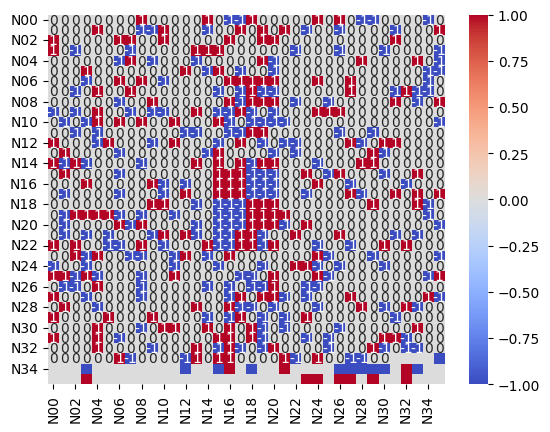

In [43]:
core_embed_random_periphery_genrator(100,6,'TeamSize_vary/TS_3_embed','TS_3_embed_P30N_C6N_trial' )

In [41]:
core_embed_random_periphery_genrator(100,4,'TeamSize_vary/TS_2_embed','TS_2_embed_P30N_C4N_trial' )

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Target
12
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Source
6
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Target
22
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:  40%|████      | 2/5 [00:00<00:00,  4.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Target
34
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Target
16
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.94it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Target
6
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Source
34
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.46it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 119.69it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.78it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 134.93it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Target
10
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 173.11it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 117.49it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.04it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Target
40
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Target
12
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.61it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
38 19 2
{'N32', 'N33'} 2 Source
38
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Target
12
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Source
32
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 82.33it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 233.69it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 155.47it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 185.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 92.82it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 95.08it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 158.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Target
12
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  20%|██        | 1/5 [00:00<00:01,  2.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Source
34
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Target
34
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Target
22
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Target
36
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 270.42it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Target
16
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.75it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Target
6
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.08it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 122.64it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 233.63it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
38 19 2
{'N30', 'N31'} 2 Target
38
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 113.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 60.63it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
38 19 2
{'N30', 'N31'} 2 Target
38
['N30', 'N31']
['N30', 'N31']
38 19 2
{'N30', 'N31'} 2 Source
38
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Source
40
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Target
12
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 191.39it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Target
2
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Target
34
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Target
36
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.45it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Source
32
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Target
36
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  40%|████      | 2/5 [00:00<00:00,  5.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Target
40
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Target
8
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Target
34
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Target
10
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:  40%|████      | 2/5 [00:00<00:00,  5.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Target
8
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Source
32
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Source
34
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 217.08it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Target
22
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Target
12
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.09it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Target
10
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.49it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  40%|████      | 2/5 [00:00<00:00,  5.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Source
6
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Target
8
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07'

Processing: 100%|██████████| 5/5 [00:00<00:00, 145.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Target
16
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Source
40
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Target
10
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  40%|████      | 2/5 [00:00<00:00,  5.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Target
8
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Target
12
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Source
22
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 225.26it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 300.59it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 121.54it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Source
28
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 144.78it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 182.34it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07

Processing: 100%|██████████| 5/5 [00:00<00:00, 202.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Target
34
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.05it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 72.14it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 216.35it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Target
10
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Source
40
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 253.37it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 227.82it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Source
4
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 144.50it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 213.74it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Target
26
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Source
32
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Target
26
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  40%|████      | 2/5 [00:00<00:00,  5.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.62it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.51it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Source
32
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 139.77it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 224.55it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Target
6
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Target
34
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Source
32
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 86.63it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
8 4 2
{'N30', 'N31'} 2 Target
8
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Target
24
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.71it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 201.20it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
8 4 2
{'N30', 'N31'} 2 Target
8
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.16it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.65it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 165.69it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.33it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.94it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Target
2
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Source
6
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07

Processing:  40%|████      | 2/5 [00:00<00:00,  5.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Target
6
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 238.31it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Target
8
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
8 4 2
{'N30', 'N31'} 2 Target
8
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Target
10
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Target
24
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Source
22
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Target
22
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  20%|██        | 1/5 [00:00<00:02,  1.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
6 3 2
{'N30', 'N31'} 2 Source
6
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 238.75it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 129.29it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 164.81it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.77it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Target
24
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
38 19 2
{'N32', 'N33'} 2 Target
38
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Source
36
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 119.13it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Target
2
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
8 4 2
{'N32', 'N33'} 2 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.04it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Target
36
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.66it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Source
32
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.84it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.72it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 232.92it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Target
12
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Target
4
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.87it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Target
10
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 64.18it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.88it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 253.89it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Target
34
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing: 100%|██████████| 5/5 [00:00<00:00, 95.42it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 164.64it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 75.70it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 122.84it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 286.47it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
38 19 2
{'N30', 'N31'} 2 Source
38
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.50it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.51it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Source
4
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.79it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Target
22
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 168.63it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Target
26
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Source
4
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Target
10
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Target
10
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 200.90it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Target
26
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Source
28
['N32', 'N33']
['N32', 'N33']
36 18 2
{'N32', 'N33'} 2 Target
36
['N32', 'N33']
['N32', 'N33']
38 19 2
{'N32', 'N33'} 2 Source
38
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.05it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Source
36
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  20%|██        | 1/5 [00:00<00:01,  2.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Target
12
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Target
22
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Target
22
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
4 2 2
{'N30', 'N31'} 2 Target
4
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 211.95it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Target
20
['N30', 'N31']
['N30', 'N31']
26 13 2
{'N30', 'N31'} 2 Source
26
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Target
30
['N32', 'N33']
['N32', 'N33']
24 12 2
{'N32', 'N33'} 2 Source
24
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Target
24
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
32 16 2
{'N32', 'N33'} 2 Target
32
['N32', 'N33']
['N32', 'N33']
12 6 2
{'N32', 'N33'} 2 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Target
14
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 278.77it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 201.72it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.85it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
34 17 2
{'N30', 'N31'} 2 Target
34
['N30', 'N31']
['N30', 'N31']
12 6 2
{'N30', 'N31'} 2 Source
12
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06

Processing:  40%|████      | 2/5 [00:00<00:00,  5.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Target
16
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.11it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 137.44it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Source
18
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Target
2
['N32', 'N33']
['N32', 'N33']
34 17 2
{'N32', 'N33'} 2 Source
34
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Target
18
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
36 18 2
{'N30', 'N31'} 2 Target
36
['N30', 'N31']
['N30', 'N31']
20 10 2
{'N30', 'N31'} 2 Source
20
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
10 5 2
{'N32', 'N33'} 2 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.26it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 157.65it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 249.96it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 253.76it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Target
22
['N30', 'N31']
['N30', 'N31']
38 19 2
{'N30', 'N31'} 2 Source
38
['N32', 'N33']
['N32', 'N33']
38 19 2
{'N32', 'N33'} 2 Target
38
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Target
2
['N30', 'N31']
['N30', 'N31']
2 1 2
{'N30', 'N31'} 2 Source
2
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Target
28
['N32', 'N33']
['N32', 'N33']
18 9 2
{'N32', 'N33'} 2 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Target
40
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Source
32
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Target
40
['N32', 'N33']
['N32', 'N33']
40 20 2
{'N32', 'N33'} 2 Source
40
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Target
24
['N30', 'N31']
['N30', 'N31']
16 8 2
{'N30', 'N31'} 2 Source
16
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
28 14 2
{'N32', 'N33'} 2 Source
28
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 166.85it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Target
14
['N30', 'N31']
['N30', 'N31']
40 20 2
{'N30', 'N31'} 2 Source
40
['N32', 'N33']
['N32', 'N33']
20 10 2
{'N32', 'N33'} 2 Target
20
['N32', 'N33']
['N32', 'N33']
4 2 2
{'N32', 'N33'} 2 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 169.43it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.97it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Target
30
['N30', 'N31']
['N30', 'N31']
14 7 2
{'N30', 'N31'} 2 Source
14
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06',

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.28it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
32 16 2
{'N30', 'N31'} 2 Target
32
['N30', 'N31']
['N30', 'N31']
22 11 2
{'N30', 'N31'} 2 Source
22
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Target
26
['N32', 'N33']
['N32', 'N33']
30 15 2
{'N32', 'N33'} 2 Source
30
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.43it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 184.64it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
28 14 2
{'N30', 'N31'} 2 Target
28
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Source
24
['N32', 'N33']
['N32', 'N33']
16 8 2
{'N32', 'N33'} 2 Target
16
['N32', 'N33']
['N32', 'N33']
26 13 2
{'N32', 'N33'} 2 Source
26
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.27it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.18it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.35it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
24 12 2
{'N30', 'N31'} 2 Target
24
['N30', 'N31']
['N30', 'N31']
30 15 2
{'N30', 'N31'} 2 Source
30
['N32', 'N33']
['N32', 'N33']
6 3 2
{'N32', 'N33'} 2 Target
6
['N32', 'N33']
['N32', 'N33']
2 1 2
{'N32', 'N33'} 2 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 31.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30', 'N31']
['N30', 'N31']
18 9 2
{'N30', 'N31'} 2 Target
18
['N30', 'N31']
['N30', 'N31']
10 5 2
{'N30', 'N31'} 2 Source
10
['N32', 'N33']
['N32', 'N33']
22 11 2
{'N32', 'N33'} 2 Target
22
['N32', 'N33']
['N32', 'N33']
14 7 2
{'N32', 'N33'} 2 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
34
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06'

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.66it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N06']


<Figure size 640x480 with 0 Axes>

In [42]:
core_embed_random_periphery_genrator(100,2,'TeamSize_vary/TS_1_embed','TS_1_embed_P30N_C2N_trial' )

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
1 1 1
{'N30'} 1 Target
1
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
19 19 1
{'N31'} 1 Target
19
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.40it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.31it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.28it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.82it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
16 16 1
{'N30'} 1 Target
16
['N30']
['N30']
1 1 1
{'N30'} 1 Source
1
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
5 5 1
{'N30'} 1 Target
5
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
19 19 1
{'N31'} 1 Source
19
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
6 6 1
{'N30'} 1 Target
6
['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
9 9 1
{'N31'} 1 Source
9
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 84.87it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
15 15 1
{'N30'} 1 Target
15
['N30']
['N30']
9 9 1
{'N30'} 1 Source
9
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
3 3 1
{'N31'} 1 Target
3
['N31']
['N31']
11 11 1
{'N31'} 1 Source
11
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
18 18 1
{'N30'} 1 Source
18
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  20%|██        | 1/5 [00:00<00:01,  2.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 Target
12
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
12 12 1
{'N31'} 1 Target
12
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
10 10 1
{'N30'} 1 Source
10
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N31']
['N31']
8 8 1
{'N31'} 1 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 162.14it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
3 3 1
{'N30'} 1 Target
3
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 141.47it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 56.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
10 10 1
{'N30'} 1 Target
10
['N30']
['N30']
12 12 1
{'N30'} 1 Source
12
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
13 13 1
{'N30'} 1 Target
13
['N30']
['N30']
17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
9 9 1
{'N31'} 1 Source
9
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
15 15 1
{'N30'} 1 Target
15
['N30']
['N30']
14 14 1
{'N30'} 1 Source
14
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
7 7 1
{'N31'} 1 Source
7
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.65it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
11 11 1
{'N31'} 1 Source
11
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
5 5 1
{'N31'} 1 Target
5
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N30']
['N30']
9 9 1
{'N30'} 1 Source
9
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
5 5 1
{'N30'} 1 Target
5
['N30']
['N30']
10 10 1
{'N30'} 1 Source
10
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 168.30it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 213.50it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 142.83it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 133.27it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
15 15 1
{'N30'} 1 Target
15
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  40%|████      | 2/5 [00:00<00:00,  4.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.68it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
5 5 1
{'N31'} 1 Source
5
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.61it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
20 20 1
{'N31'} 1 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
10 10 1
{'N30'} 1 Target
10
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
11 11 1
{'N31'} 1 Source
11
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1 Target
9
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.09it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.31it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
5 5 1
{'N31'} 1 Target
5
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.97it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 171.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.25it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
13 13 1
{'N30'} 1 Target
13
['N30']
['N30']
12 12 1
{'N30'} 1 Source
12
['N31']
['N31']
3 3 1
{'N31'} 1 Target
3
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.40it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
14 14 1
{'N30'} 1 Source
14
['N31']
['N31']
8 8 1
{'N31'} 1 Target
8
['N31']
['N31']
4 4 1
{'N31'} 1 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
8 8 1
{'N30'} 1 Target
8
['N30']
['N30']
1 1 1
{'N30'} 1 Source
1
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.27it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.39it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
18 18 1
{'N30'} 1 Source
18
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
11 11 1
{'N31'} 1 Source
11
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
19 19 1
{'N30'} 1 Source
19
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 79.33it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 226.72it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.03it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1 Target
9
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
3 3 1
{'N31'} 1 Target
3
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
3 3 1
{'N31'} 1 Target
3
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.87it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.70it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.31it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 144.25it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.83it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 276.15it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  20%|██        | 1/5 [00:00<00:01,  2.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
5 5 1
{'N30'} 1 Target
5
['N30']
['N30']
6 6 1
{'N30'} 1 Source
6
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
10 10 1
{'N30'} 1 Target
10
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
5 5 1
{'N31'} 1 Target
5
['N31']
['N31']
7 7 1
{'N31'} 1 Source
7
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 222.68it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 Target
12
['N30']
['N30']
10 10 1
{'N30'} 1 Source
10
['N31']
['N31']
9 9 1
{'N31'} 1 Target
9
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 13.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
3 3 1
{'N31'} 1 Target
3
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  20%|██        | 1/5 [00:00<00:01,  2.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
8 8 1
{'N31'} 1 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 Target
12
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
20 20 1
{'N31'} 1 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
10 10 1
{'N30'} 1 Target
10
['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.71it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
16 16 1
{'N30'} 1 Target
16
['N30']
['N30']
8 8 1
{'N30'} 1 Source
8
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
6 6 1
{'N30'} 1 Target
6
['N30']
['N30']
6 6 1
{'N30'} 1 Source
6
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 237.96it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
16 16 1
{'N30'} 1 Target
16
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.78it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1 Target
9
['N30']
['N30']
1 1 1
{'N30'} 1 Source
1
['N31']
['N31']
8 8 1
{'N31'} 1 Target
8
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 255.40it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 221.57it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 174.15it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
18 18 1
{'N31'} 1 Target
18
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.62it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.55it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
1 1 1
{'N30'} 1 Source
1
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 136.52it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 Target
12
['N30']
['N30']
7 7 1
{'N30'} 1 Source
7
['N31']
['N31']
12 12 1
{'N31'} 1 Target
12
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.65it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
1 1 1
{'N30'} 1 Target
1
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
9 9 1
{'N30'} 1 Source
9
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 95.06it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
5 5 1
{'N31'} 1 Source
5
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.17it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
5 5 1
{'N31'} 1 Source
5
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.95it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 107.98it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.21it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
1 1 1
{'N31'} 1 Target
1
['N31']
['N31']
4 4 1
{'N31'} 1 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
8 8 1
{'N31'} 1 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.27it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 159.10it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
15 15 1
{'N30'} 1 Target
15
['N30']
['N30']
6 6 1
{'N30'} 1 Source
6
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 81.74it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
5 5 1
{'N30'} 1 Source
5
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.54it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 335.20it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 164.55it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
8 8 1
{'N30'} 1 Target
8
['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
4 4 1
{'N31'} 1 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
13 13 1
{'N31'} 1 Target
13
['N31']
['N31']
19 19 1
{'N31'} 1 Source
19
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 176.22it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
7 7 1
{'N30'} 1 Source
7
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
18 18 1
{'N30'} 1 Target
18
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.96it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.03it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.09it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.17it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
12 12 1
{'N30'} 1 Target
12
['N30']
['N30']
15 15 1
{'N30'} 1 Source
15
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
3 3 1
{'N31'} 1 Source
3
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
15 15 1
{'N30'} 1 Source
15
['N31']
['N31']
7 7 1
{'N31'} 1 Target
7
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
1 1 1
{'N30'} 1 Target
1
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']
13 13 1
{'N31'} 1 Target
13
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 197.13it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
4 4 1
{'N31'} 1 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
8 8 1
{'N30'} 1 Source
8
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
10 10 1
{'N31'} 1 Source
10
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
15 15 1
{'N30'} 1 Source
15
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.51it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.26it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 151.28it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.45it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
1 1 1
{'N30'} 1 Target
1
['N30']
['N30']
14 14 1
{'N30'} 1 Source
14
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
7 7 1
{'N30'} 1 Target
7
['N30']
['N30']
7 7 1
{'N30'} 1 Source
7
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 78.91it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 236.66it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N30']
['N30']
10 10 1
{'N30'} 1 Source
10
['N31']
['N31']
16 16 1
{'N31'} 1 Target
16
['N31']
['N31']
6 6 1
{'N31'} 1 Source
6
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.83it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
4 4 1
{'N30'} 1 Target
4
['N30']
['N30']
3 3 1
{'N30'} 1 Source
3
['N31']
['N31']
13 13 1
{'N31'} 1 Target
13
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.12it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 219.35it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.97it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 151.55it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 252.28it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 323.39it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
8 8 1
{'N30'} 1 Target
8
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
5 5 1
{'N31'} 1 Target
5
['N31']
['N31']
4 4 1
{'N31'} 1 Source
4
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing: 100%|██████████| 5/5 [00:00<00:00, 205.50it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.62it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 64.64it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.21it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.87it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 201.41it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.90it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
4 4 1
{'N30'} 1 Source
4
['N31']
['N31']
14 14 1
{'N31'} 1 Target
14
['N31']
['N31']
19 19 1
{'N31'} 1 Source
19
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
16 16 1
{'N30'} 1 Target
16
['N30']
['N30']
18 18 1
{'N30'} 1 Source
18
['N31']
['N31']
7 7 1
{'N31'} 1 Target
7
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.44it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.02it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
13 13 1
{'N30'} 1 Source
13
['N31']
['N31']
6 6 1
{'N31'} 1 Target
6
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 257.61it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
10 10 1
{'N30'} 1 Target
10
['N30']
['N30']
7 7 1
{'N30'} 1 Source
7
['N31']
['N31']
5 5 1
{'N31'} 1 Target
5
['N31']
['N31']
2 2 1
{'N31'} 1 Source
2
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
15 15 1
{'N30'} 1 Source
15
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
8 8 1
{'N31'} 1 Source
8
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 13.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
19 19 1
{'N30'} 1 Target
19
['N30']
['N30']
12 12 1
{'N30'} 1 Source
12
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
17 17 1
{'N30'} 1 Target
17
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
9 9 1
{'N31'} 1 Target
9
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.72it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.39it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
11 11 1
{'N30'} 1 Source
11
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
19 19 1
{'N31'} 1 Source
19
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
8 8 1
{'N30'} 1 Target
8
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
20 20 1
{'N31'} 1 Target
20
['N31']
['N31']
14 14 1
{'N31'} 1 Source
14
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.23it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
9 9 1
{'N30'} 1 Target
9
['N30']
['N30']
6 6 1
{'N30'} 1 Source
6
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
7 7 1
{'N31'} 1 Source
7
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 130.24it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 156.52it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 31.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
17 17 1
{'N30'} 1 Source
17
['N31']
['N31']
12 12 1
{'N31'} 1 Target
12
['N31']
['N31']
17 17 1
{'N31'} 1 Source
17
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
11 11 1
{'N30'} 1 Target
11
['N30']
['N30']
9 9 1
{'N30'} 1 Source
9
['N31']
['N31']
4 4 1
{'N31'} 1 Target
4
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 13.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
2 2 1
{'N30'} 1 Target
2
['N30']
['N30']
2 2 1
{'N30'} 1 Source
2
['N31']
['N31']
15 15 1
{'N31'} 1 Target
15
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 122.82it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.71it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
16 16 1
{'N30'} 1 Target
16
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
2 2 1
{'N31'} 1 Target
2
['N31']
['N31']
9 9 1
{'N31'} 1 Source
9
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 64.01it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.88it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 56.43it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
12 12 1
{'N30'} 1 Source
12
['N31']
['N31']
13 13 1
{'N31'} 1 Target
13
['N31']
['N31']
12 12 1
{'N31'} 1 Source
12
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.40it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
19 19 1
{'N30'} 1 Source
19
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
20 20 1
{'N31'} 1 Source
20
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
20 20 1
{'N30'} 1 Source
20
['N31']
['N31']
10 10 1
{'N31'} 1 Target
10
['N31']
['N31']
15 15 1
{'N31'} 1 Source
15
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
20 20 1
{'N30'} 1 Target
20
['N30']
['N30']
16 16 1
{'N30'} 1 Source
16
['N31']
['N31']
17 17 1
{'N31'} 1 Target
17
['N31']
['N31']
18 18 1
{'N31'} 1 Source
18
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 271.36it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 219.49it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
8 8 1
{'N30'} 1 Source
8
['N31']
['N31']
8 8 1
{'N31'} 1 Target
8
['N31']
['N31']
13 13 1
{'N31'} 1 Source
13
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
14 14 1
{'N30'} 1 Target
14
['N30']
['N30']
12 12 1
{'N30'} 1 Source
12
['N31']
['N31']
8 8 1
{'N31'} 1 Target
8
['N31']
['N31']
16 16 1
{'N31'} 1 Source
16
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22'

Processing:  40%|████      | 2/5 [00:00<00:00,  4.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N30']
['N30']
3 3 1
{'N30'} 1 Target
3
['N30']
['N30']
18 18 1
{'N30'} 1 Source
18
['N31']
['N31']
11 11 1
{'N31'} 1 Target
11
['N31']
['N31']
1 1 1
{'N31'} 1 Source
1
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N27', 'N23', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.32it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 143.85it/s]


['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N00', 'N02', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']
['N23', 'N27', 'N29', 'N30', 'N20', 'N02', 'N00', 'N24', 'N13', 'N21', 'N15', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N12', 'N05', 'N16', 'N22', 'N01', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N06']


<Figure size 640x480 with 0 Axes>

In [43]:
core_embed_random_periphery_genrator(100,12,'TeamSize_vary/TS_6_embed','TS_6_embed_P30N_C12N_trial' )

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 218.12it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
120
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35

Processing: 100%|██████████| 5/5 [00:00<00:00, 268.53it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
18
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 

Processing:  40%|████      | 2/5 [00:00<00:00,  4.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
114
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 193.74it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 74.66it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
120
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
60
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
78 13 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
78
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22',

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.35it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.07it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 194.65it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
12
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
36
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
72
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22',

Processing: 100%|██████████| 5/5 [00:00<00:00, 273.52it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.58it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
84
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 186.12it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
6
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
36
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
90
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
60
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
78 13 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
78
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
36
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 211.15it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
108
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 240.01it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
12 2 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.56it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 161.14it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
78 13 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
78
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
66
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 144.84it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
18
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
60
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
96
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
96
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
30
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
108
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
18
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
102
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 82.40it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.66it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 211.65it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 176.37it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 250.01it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 191.90it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.56it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
96
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
6
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.81it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 240.17it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 193.56it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
18
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 171.37it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.00it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 189.46it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 30.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
78 13 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
78
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22',

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.06it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.80it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
96
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
18
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
36
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 56.68it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.09it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
120
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
36
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
78 13 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
78
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
12 2 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
12
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.39it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 196.77it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
96
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 149.14it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
90
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.37it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
12 2 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
120
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
102
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 202.81it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 138.94it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
12
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
120
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 231.99it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 237.18it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
18
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
30
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
48
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 262.80it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
12
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing:  40%|████      | 2/5 [00:00<00:00,  5.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
114
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
48
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
48
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing:  40%|████      | 2/5 [00:00<00:00,  5.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
72
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
90
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 265.51it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
12
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 196.22it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
24
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
66
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  40%|████      | 2/5 [00:00<00:00,  5.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
54
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
114
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
120
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 141.98it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 235.78it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
6
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
60
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N0

Processing: 100%|██████████| 5/5 [00:00<00:00, 127.41it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.21it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.66it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
114
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 156.39it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.54it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
18 3 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
84
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
6
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
48
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing: 100%|██████████| 5/5 [00:00<00:00, 139.43it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 192.16it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
24
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
66
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 162.23it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
120
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.41it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.13it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 194.19it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
78 13 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
78
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 233.93it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 259.65it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 197.58it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
108
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
72
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22

Processing: 100%|██████████| 5/5 [00:00<00:00, 140.64it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
96
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
114
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
120
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22'

Processing: 100%|██████████| 5/5 [00:00<00:00, 196.05it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 163.31it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.90it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 150.07it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
24
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 105.40it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
78 13 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
78
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22',

Processing: 100%|██████████| 5/5 [00:00<00:00, 227.82it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
60
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
96
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
30
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
66 11 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
66
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 208.87it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
24
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
54
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing: 100%|██████████| 5/5 [00:00<00:00, 269.20it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 155.80it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 90.80it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
102
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
12 2 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.17it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 266.59it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 210.36it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 234.14it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
90
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
84
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 175.67it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
30 5 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
42
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
36
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing: 100%|██████████| 5/5 [00:00<00:00, 142.11it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 166.81it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
78 13 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
78
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
30 5 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
30
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.28it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
96
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32',

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.14it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.68it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 97.23it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
36
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
108 18 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
12 2 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
12
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
90 15 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
96
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 193.22it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 160.01it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 132.39it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 211.97it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
12
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
12 2 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
12
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
72 12 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
72
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 94.74it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
36
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
18
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
24 4 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
24
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.09it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N37', 'N23', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 175.02it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 31.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
90
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
48 8 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
48
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
6 1 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
6
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 177.22it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
84 14 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
84
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
114 19 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
114
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
114 19 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
114
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22

Processing: 100%|██████████| 5/5 [00:00<00:00, 116.42it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
72
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
24 4 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
24
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
84 14 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
84
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
36 6 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
36
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
90
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32'

Processing: 100%|██████████| 5/5 [00:00<00:00, 170.05it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 253.22it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
102 17 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
102
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
60
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.27it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
6 1 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
6
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
108
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
78 13 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
78
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
108 18 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
108
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
36 6 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
36
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 238.13it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 257.06it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 304.09it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
42 7 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
42
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
96 16 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Target
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
120 20 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
120
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing: 100%|██████████| 5/5 [00:00<00:00, 184.23it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N36', 'N17', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 147.14it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
66
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
96 16 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
96
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
60 10 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
60
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 29.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
60
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
60 10 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Source
60
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
42 7 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
42
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
102 17 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
102
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 230.79it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N38', 'N09', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N27', 'N23', 'N37', 'N29', 'N34', 'N30', 'N20', 'N02', 'N00', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
72 12 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Target
72
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
66 11 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
66
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
90 15 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
90
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
18 3 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Source
18
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing:  60%|██████    | 3/5 [00:00<00:00, 12.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
54 9 6
{'N35', 'N31', 'N34', 'N30', 'N33', 'N32'} 6 Target
54
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
['N35', 'N31', 'N34', 'N30', 'N33', 'N32']
120 20 6
{'N35', 'N34', 'N31', 'N30', 'N33', 'N32'} 6 Source
120
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
54 9 6
{'N37', 'N38', 'N39', 'N41', 'N36', 'N40'} 6 Target
54
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
['N37', 'N38', 'N39', 'N41', 'N36', 'N40']
48 8 6
{'N38', 'N37', 'N39', 'N41', 'N36', 'N40'} 6 Source
48
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N07', 'N17', 'N10', 'N18', 'N11', 'N35', 'N04', 'N12', 'N05', 'N16', 'N22', 'N32

Processing: 100%|██████████| 5/5 [00:00<00:00, 90.70it/s]


['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N17', 'N07', 'N18', 'N10', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N27', 'N37', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N07', 'N17', 'N36', 'N10', 'N18', 'N11', 'N04', 'N35', 'N12', 'N05', 'N16', 'N22', 'N32', 'N01', 'N09', 'N38', 'N08', 'N14', 'N25', 'N31', 'N28', 'N03', 'N19', 'N26', 'N33', 'N40', 'N06']
['N23', 'N37', 'N27', 'N29', 'N34', 'N30', 'N20', 'N00', 'N02', 'N39', 'N24', 'N13', 'N41', 'N21', 'N15', 'N36', 'N

<Figure size 640x480 with 0 Axes>

In [83]:
mkdir indegree20/netfig

In [35]:
avg_network_generator_topo(200,30)

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


,Source,Target,Type
0,N12,N16,1
1,N07,N09,1
2,N13,N10,1
3,N28,N14,1
4,N13,N22,1
...,...,...,...
195,N17,N27,2
196,N24,N14,2
197,N01,N15,2
198,N27,N19,2


In [31]:
def Network_Generate_Save(folder, trials, file, avg_indeg, input_core):
    count = 0
    trial = 0
    while trial < trials:  
        Peri = avg_network_generator_topo(240,30)
        mid_indeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, avg_indeg, True)
        #mid_outdeg_team1 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,30))))),Peri, 0, False)

        core = pd.read_csv(input_core, sep='\t')
        replacement_dict = {'N00': 'N30', 'N01': 'N31', 'N02': 'N32', 'N03': 'N33', 'N04': 'N34',
                            'N05': 'N35', 'N06': 'N36', 'N07': 'N37', 'N08': 'N38', 'N09': 'N39'}
        core = core.replace(replacement_dict)

        mid_indeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, avg_indeg, True)
        # #mid_outdeg_team2 = middle_generator_ratio_average(adj_topify((matrix_index_sort(Topo_adj(core__generator_topo(5,35))))),Peri, 0, False)

        Network = pd.concat([core,Peri,mid_indeg_team1,mid_indeg_team2],ignore_index=True)
        adjmat=centreing_core(matrix_index_sort(Topo_adj(Network)),10)

        df_topo= adj_topify(adjmat)
        if boolean_asyc_runs_list_method_paths_select_10000( adjmat.T):
            
            plt.clf()
                      
            sns.heatmap(matrix_index_sort(Topo_adj(df_topo)), cmap = 'coolwarm', annot = True, vmin = -1, vmax = 1)
            plt.savefig(folder+'/netfig/'+file+str(trial)+'.png')
            plt.clf()
            adj_topify(Topo_adj(df_topo)).to_csv(folder+'/'+file+str(trial)+'.topo', sep='\t',index=False)
            trial += 1

In [31]:

Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_4', 10, 'Core_Density_40_In_deg_4_Net',4,'Density_40_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_6', 10, 'Core_Density_40_In_deg_6_Net',6,'Density_40_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_8', 10, 'Core_Density_40_In_deg_8_Net',8,'Density_40_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 51.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 58.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.22it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.28it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 82.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 132.14it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.73it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.09it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.73it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.59it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.81it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [32]:

Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_4', 10, 'Core_Density_60_In_deg_4_Net',4,'Density_60_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_6', 10, 'Core_Density_60_In_deg_6_Net',6,'Density_60_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_8', 10, 'Core_Density_60_In_deg_8_Net',8,'Density_60_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 97.49it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.50it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.59it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.54it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.27it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.59it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.68it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 135.83it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 129.33it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.15it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 201.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 77.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.06it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 97.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.52it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.38it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.26it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.50it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.36it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 130.02it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 122.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 109.46it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 167.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [33]:
Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_4', 10, 'Core_Density_80_In_deg_4_Net',4,'Density_80_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_6', 10, 'Core_Density_80_In_deg_6_Net',6,'Density_80_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_8', 10, 'Core_Density_80_In_deg_8_Net',8,'Density_80_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.89it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 28.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 89.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.97it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 145.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.52it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 115.09it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.00it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.75it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.56it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.19it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.02it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.40it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.37it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.30it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.13it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.93it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.33it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.93it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.62it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

<Figure size 640x480 with 0 Axes>

In [34]:
Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_4', 10, 'Core_Density_100_In_deg_4_Net',4,'Density_100_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_6', 10, 'Core_Density_100_In_deg_6_Net',6,'Density_100_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_8', 10, 'Core_Density_100_In_deg_8_Net',8,'Density_100_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 95.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.97it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.72it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.04it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.73it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.54it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.38it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.19it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  3.77it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.29it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 92.57it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.49it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [35]:
Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_20', 10, 'Core_Density_40_In_deg_20_Net',20,'Density_40_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_20', 10, 'Core_Density_60_In_deg_20_Net',20,'Density_60_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_20', 10, 'Core_Density_80_In_deg_20_Net',20,'Density_80_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_20', 10, 'Core_Density_100_In_deg_20_Net',20,'Density_100_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.57it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.15it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.02it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 121.35it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.36it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.54it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
40
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N3

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 58.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.37it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.53it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.52it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.79it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.94it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 11.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.59it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.65it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.15it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.50it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.18it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.19it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 121.57it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.06it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 117.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 107.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.57it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 150.79it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.79it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.57it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 126.59it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 150.30it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [213]:
import glob
import os
#('Network_5N_10E', 1, 5, 10, '5N_10E', rp)

def BiC_CC_F1_team_strength(filename, n_files, external_nodes, label,coresize,Self_Activation_Status, Core_Density, 
                             indegree,Ext_Net_Density ,rp):
    print(rp)

    global melt_table_complete

    F1_list=[]

    indices=[]

    columns = ['index','Team_Size','BiC A','CC AB','F1 Boolean','F1_Individual_Nodes_Considered','Team_Strength',
               'Density','Impurity','Nodes','External Edges','Label','Self_Activation_Status','Indegree_Team_A','Indegree_Team_B','Outdegree_Team_A','Outdegree_Team_B']


    temp_table_complete=pd.DataFrame([[0]*len(columns)]*n_files)
    temp_table_complete.columns = columns
    temp_table_complete.loc[:,'Core Nodes']=coresize
    temp_table_complete.loc[:,'External Nodes']=external_nodes
    # temp_table_complete.loc[:,'Edges']=edges
    temp_table_complete.loc[:,'Label']=label
    temp_table_complete.loc[:,'Core Density']=Core_Density
    temp_table_complete.loc[:,'External Network Density']=Ext_Net_Density
    temp_table_complete.loc[:,'Average Indegree per Core Node']=indegree
    temp_table_complete.loc[:,'Team_Size'] = 'Team Size ' + str(int(coresize/2))
    temp_table_complete.loc[:,'Self_Activation_Status'] = Self_Activation_Status
    print(int(coresize/2))



    #file_name = folderi[0: folderi.find("N_")+1 ]+'/'+folderi+'/'+folderi+'_'+ str(rp)+'.topo'
    file_name = filename
    topo_file = pd.read_csv(file_name,sep='\t')
    adjmat_core_peri=centreing_core(matrix_index_sort(Topo_adj(topo_file)),coresize)
    total_nodes = len(adjmat_core_peri)
    peri_nodes = total_nodes - coresize
    temp_table_complete.loc[:,'Indegree_Team_A']= np.sum(adjmat_core_peri.iloc[:,peri_nodes :peri_nodes+int(coresize/2)].abs())[0]
    temp_table_complete.loc[:,'Indegree_Team_B']=adjmat_core_peri.iloc[:,peri_nodes+int(coresize/2):peri_nodes+coresize].abs().sum()[0]
    temp_table_complete.loc[:,'Outdegree_Team_A']=adjmat_core_peri.iloc[peri_nodes :peri_nodes+int(coresize/2),:].abs().sum(axis=1)[0]
    temp_table_complete.loc[:,'Outdegree_Team_B']=adjmat_core_peri.iloc[peri_nodes+int(coresize/2):peri_nodes+coresize,:].abs().sum(axis=1)[0]
    temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes

    print(file_name)
    #input x axis target, y axis source
    tuio = boolean_f1_finder_list(  matrix_index_sort(Topo_adj(topo_file)).T, 1000,coresize )
    F1_list.append(tuio)
    print(F1_list)

    indices.append(label+'_' + str(rp))
    print(file_name)
    temp_table_complete.loc[:,'F1 Boolean']=F1_list
    temp_table_complete.loc[:,'index']=indices
    #melt_table_complete=pd.concat([melt_table_complete, temp_table_complete])


    
    return temp_table_complete

In [209]:
file_name = "TS_1_embed/TS_1_embed_P30N_C2N_trial0.topo"
topo_file = pd.read_csv(file_name,sep='\t')
adjmat_core_peri=centreing_core(matrix_index_sort(Topo_adj(topo_file)),2)
np.sum(adjmat_core_peri.iloc[30+int(2/2):30+2:].abs(), axis=1)[0]

['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N19', 'N10', 'N16', 'N25', 'N11', 'N06', 'N22', 'N24', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N00', 'N23', 'N02', 'N27', 'N28', 'N17']
['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N21', 'N13', 'N03', 'N26', 'N01', 'N18', 'N19', 'N10', 'N16', 'N25', 'N11', 'N06', 'N22', 'N24', 'N30', 'N31', 'N09', 'N20', 'N14', 'N12', 'N00', 'N23', 'N02', 'N27', 'N28', 'N17']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']


6

In [218]:
melt_table_complete=pd.DataFrame(columns=['index','Team_Size','BiC A','CC AB','F1 Boolean','F1_Individual_Nodes_Considered','Team_Strength',
               'Density','Impurity','Nodes','External Edges','Label','Self_Activation_Status'])
melt_table_complete


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,External Edges,Label,Self_Activation_Status


In [215]:
BiC_CC_F1_team_strength('TS_1_embed/TS_1_embed_P30N_C2N_trial'+str(0)+'.topo', 1, 30, 'random',2,'Yes', 100,
                                20,'8E:N' ,0)

/tmp/ipykernel_48743/1148949649.py:44: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes


0
1
['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N19', 'N10', 'N16', 'N25', 'N11', 'N06', 'N22', 'N24', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N00', 'N23', 'N02', 'N27', 'N28', 'N17']
['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N21', 'N13', 'N03', 'N26', 'N01', 'N18', 'N19', 'N10', 'N16', 'N25', 'N11', 'N06', 'N22', 'N24', 'N30', 'N31', 'N09', 'N20', 'N14', 'N12', 'N00', 'N23', 'N02', 'N27', 'N28', 'N17']
32
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16']
TS_1_embed/TS_1_embed_P30N_C2N_trial0.topo
['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N19', 'N10', 'N16', 'N25', 'N11', 'N06', 'N22', 'N24', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N00', 'N23', 'N02', 'N27', 'N28', 'N17']
['N15', 'N07', 'N05', 'N08', 'N04', 'N29', 'N2

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

Processing: 100%|██████████| 1000/1000 [00:07<00:00, 131.08it/s]

1000
[0.696]
TS_1_embed/TS_1_embed_P30N_C2N_trial0.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,...,Self_Activation_Status,Indegree_Team_A,Indegree_Team_B,Outdegree_Team_A,Outdegree_Team_B,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,random_0,Team Size 1,0,0,0.696,0,0,0,0,0,...,Yes,6,6,6,6,2,30,100,4.366667,20


In [219]:
import multiprocessing


def process_parameter_set(parameters):
    return BiC_CC_F1_team_strength(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(100)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ('TS_1_embed/TS_1_embed_P30N_C2N_trial'+str(rp)+'.topo', 1, 30, 'random',2,'Yes', 100,
                             20,'random' ,rp) for rp in rp_range] 
    parameter_sets.extend([('TS_2_embed/TS_2_embed_P30N_C4N_trial'+str(rp)+'.topo', 1, 30, 'random',4,'Yes', 100,
                              20,'random' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('TS_3_embed/TS_3_embed_P30N_C6N_trial'+str(rp)+'.topo', 1, 30, 'random',6,'Yes', 100,
                                20,'random' ,rp) for rp in rp_range])
    parameter_sets.extend([('TS_4_embed/TS_4_embed_P30N_C8N_trial'+str(rp)+'.topo', 1, 30, 'random',8,'Yes', 100,
                                20,'random' ,rp) for rp in rp_range])
    parameter_sets.extend([('TS_5_embed/TS_5_embed_P30N_C10N_trial'+str(rp)+'.topo', 1, 30, 'random',10,'Yes', 100,
                                20,'random' ,rp) for rp in rp_range])
    parameter_sets.extend([('TS_6_embed/TS_6_embed_P30N_C12N_trial'+str(rp)+'.topo', 1, 30, 'random',12,'Yes', 100,
                                20,'random' ,rp) for rp in rp_range])
    
    # parameter_sets.extend([('Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 60,
    #                          20,'8E:N' ,rp) for rp in rp_range])
    # parameter_sets.extend([('Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 80,
    #                             20,'8E:N' ,rp) for rp in rp_range])



    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    melt_table_complete_run = pd.concat(results, ignore_index=True)
    melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
melt_table_complete

Processing: 100%|██████████| 1000/1000 [00:09<00:00, 108.51it/s]


1000
[1.0]
TS_6_embed/TS_6_embed_P30N_C12N_trial59.topo


/tmp/ipykernel_48743/1148949649.py:54: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:16<00:00, 59.63it/s]


1000
[1.0]
TS_6_embed/TS_6_embed_P30N_C12N_trial98.topo


/tmp/ipykernel_48743/1148949649.py:54: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


99
6
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N39', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N22', 'N24', 'N34', 'N41', 'N30', 'N31', 'N20', 'N12', 'N14', 'N09', 'N35', 'N23', 'N00', 'N33', 'N02', 'N27', 'N38', 'N17']


Processing:  73%|███████▎  | 727/1000 [00:04<00:01, 170.87it/s]

42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


/tmp/ipykernel_48743/1148949649.py:44: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes


TS_6_embed/TS_6_embed_P30N_C12N_trial99.topo
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N39', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N22', 'N24', 'N34', 'N41', 'N30', 'N31', 'N20', 'N12', 'N14', 'N09', 'N35', 'N23', 'N00', 'N33', 'N02', 'N27', 'N38', 'N17']


Processing: 100%|██████████| 1000/1000 [01:29<00:00, 11.13it/s]


1000
[1.0]
TS_5_embed/TS_5_embed_P30N_C10N_trial99.topo


/tmp/ipykernel_48743/1148949649.py:54: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:06<00:00, 150.76it/s]


1000
[1.0]
TS_6_embed/TS_6_embed_P30N_C12N_trial86.topo


/tmp/ipykernel_48743/1148949649.py:54: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


87
6
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N07', 'N15', 'N05', 'N08', 'N04', 'N32', 'N39', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N20', 'N12', 'N35', 'N09', 'N31', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N17']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


/tmp/ipykernel_48743/1148949649.py:44: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes


TS_6_embed/TS_6_embed_P30N_C12N_trial87.topo
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N07', 'N15', 'N05', 'N08', 'N04', 'N32', 'N39', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N20', 'N12', 'N35', 'N09', 'N31', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N17']


Processing: 100%|██████████| 1000/1000 [00:07<00:00, 126.05it/s]


1000
[0.9999999999999998]
TS_6_embed/TS_6_embed_P30N_C12N_trial87.topo
88
6
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N38', 'N18', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N17', 'N06', 'N22', 'N34', 'N24', 'N41', 'N30', 'N31', 'N20', 'N12', 'N14', 'N09', 'N35', 'N23', 'N00', 'N33', 'N02', 'N27', 'N28', 'N39']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


/tmp/ipykernel_48743/1148949649.py:44: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes


TS_6_embed/TS_6_embed_P30N_C12N_trial88.topo
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N38', 'N18', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N17', 'N06', 'N22', 'N34', 'N24', 'N41', 'N30', 'N31', 'N20', 'N12', 'N14', 'N09', 'N35', 'N23', 'N00', 'N33', 'N02', 'N27', 'N28', 'N39']


Processing: 100%|██████████| 1000/1000 [00:12<00:00, 81.66it/s]


1000
[0.9999999999999998]
TS_6_embed/TS_6_embed_P30N_C12N_trial99.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 181.16it/s]


1000
[1.0]
TS_6_embed/TS_6_embed_P30N_C12N_trial88.topo


/tmp/ipykernel_48743/1148949649.py:54: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


89
6
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N10', 'N19', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N34', 'N24', 'N41', 'N30', 'N31', 'N14', 'N12', 'N20', 'N35', 'N09', 'N23', 'N00', 'N33', 'N02', 'N27', 'N38', 'N39']
42
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N40', 'N41', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26']


/tmp/ipykernel_48743/1148949649.py:44: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'External Network Density']=adjmat_core_peri.iloc[:peri_nodes,:peri_nodes].abs().sum().sum()/peri_nodes


TS_6_embed/TS_6_embed_P30N_C12N_trial89.topo
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N29', 'N13', 'N21', 'N03', 'N26', 'N01', 'N18', 'N28', 'N19', 'N10', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N24', 'N34', 'N41', 'N30', 'N14', 'N09', 'N12', 'N20', 'N31', 'N35', 'N00', 'N23', 'N33', 'N02', 'N27', 'N38', 'N39']
['N15', 'N07', 'N05', 'N08', 'N04', 'N32', 'N21', 'N13', 'N29', 'N03', 'N26', 'N01', 'N18', 'N28', 'N10', 'N19', 'N16', 'N25', 'N37', 'N40', 'N11', 'N36', 'N06', 'N17', 'N22', 'N34', 'N24', 'N41', 'N30', 'N31', 'N14', 'N12', 'N20', 'N35', 'N09', 'N23', 'N00', 'N33', 'N02', 'N27', 'N38', 'N39']


Processing: 100%|██████████| 1000/1000 [00:06<00:00, 163.67it/s]


1000
[0.9989999999999998]
TS_6_embed/TS_6_embed_P30N_C12N_trial89.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,...,Self_Activation_Status,Indegree_Team_A,Indegree_Team_B,Outdegree_Team_A,Outdegree_Team_B,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,random_0,Team Size 1,0,0,0.694,0,0,0,0,0,...,Yes,6.0,6.0,6.0,6.0,2.0,30.0,100.0,4.366667,20.0
1,random_1,Team Size 1,0,0,0.671,0,0,0,0,0,...,Yes,6.0,6.0,6.0,6.0,2.0,30.0,100.0,4.066667,20.0
2,random_2,Team Size 1,0,0,0.873,0,0,0,0,0,...,Yes,5.0,5.0,5.0,5.0,2.0,30.0,100.0,3.400000,20.0
3,random_3,Team Size 1,0,0,0.174,0,0,0,0,0,...,Yes,13.0,13.0,13.0,13.0,2.0,30.0,100.0,9.300000,20.0
4,random_4,Team Size 1,0,0,0.950,0,0,0,0,0,...,Yes,4.0,4.0,4.0,4.0,2.0,30.0,100.0,2.366667,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,random_95,Team Size 6,0,0,1.000,0,0,0,0,0,...,Yes,16.0,22.0,21.0,22.0,12.0,30.0,100.0,8.500000,20.0
596,random_96,Team Size 6,0,0,1.000,0,0,0,0,0,...,Yes,20.0,18.0,17.0,18.0,12.0,30.0,100.0,3.900000,20.0
597,random_97,Team Size 6,0,0,1.000,0,0,0,0,0,...,Yes,25.0,23.0,19.0,19.0,12.0,30.0,100.0,8.133333,20.0
598,random_98,Team Size 6,0,0,1.000,0,0,0,0,0,...,Yes,18.0,19.0,17.0,17.0,12.0,30.0,100.0,5.400000,20.0


842642806048


26










Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net8.topoCore_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net4.topoCore_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net6.topoCore_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net2.topo



['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N27', 'N05', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', '

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

Processing: 100%|██████████| 1000/1000 [00:13<00:00, 73.35it/s]


1000


Processing:  56%|█████▌    | 556/1000 [00:13<00:08, 50.56it/s]

[0.9479999999999998]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net4.topo
5
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  86%|████████▌ | 858/1000 [00:13<00:01, 78.77it/s]

Processing: 100%|██████████| 1000/1000 [00:14<00:00, 69.20it/s]


1000


Processing:  39%|███▉      | 394/1000 [00:14<00:20, 30.20it/s]

[0.28099999999999986]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net6.topo

Processing:  22%|██▏       | 218/1000 [00:14<00:56, 13.73it/s]


7
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  27%|██▋       | 268/1000 [00:14<00:53, 13.57it/s]

Processing: 100%|██████████| 1000/1000 [00:15<00:00, 63.45it/s]


1000
[0.34299999999999986]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net4.topo
5
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net5.topo


Processing:  50%|█████     | 505/1000 [00:15<00:09, 50.76it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  60%|█████▉    | 596/1000 [00:15<00:11, 35.11it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  50%|████▉     | 497/1000 [00:17<00:48, 10.35it/s]

1000

Processing:  25%|██▍       | 246/1000 [00:03<00:08, 85.69it/s]

Processing:  90%|████████▉ | 897/1000 [00:17<00:02, 46.10it/s]

[0.3739999999999999]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net8.topo

Processing:  49%|████▉     | 489/1000 [00:17<00:14, 35.92it/s]


9
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.19it/s]


1000

Processing:  55%|█████▌    | 552/1000 [00:20<00:31, 14.16it/s]


[0.8839999999999998]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net0.topo
1
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 38.41it/s]


1000
[0.038]


Processing:  87%|████████▋ | 870/1000 [00:26<00:05, 25.30it/s]

Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net4.topo


Processing:  89%|████████▉ | 893/1000 [00:26<00:03, 28.37it/s]

5
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  92%|█████████▏| 917/1000 [00:26<00:02, 34.57it/s]

1000

Processing:  48%|████▊     | 475/1000 [00:26<00:22, 23.60it/s]


[0.6999999999999998]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net0.topo
1
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  75%|███████▌  | 753/1000 [00:26<00:08, 30.48it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 69.09it/s]


1000
[0.8500000000000001]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net5.topo

Processing:  82%|████████▏ | 820/1000 [00:10<00:01, 117.23it/s]

Processing:  43%|████▎     | 426/1000 [00:28<00:37, 15.42it/s]

6

Processing:   3%|▎         | 32/1000 [00:01<00:51, 18.78it/s]


Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net6.topo


Processing: 100%|██████████| 1000/1000 [00:13<00:00, 72.77it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  40%|███▉      | 399/1000 [00:12<00:14, 40.17it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N02', 'N18', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']1000


Processing:  47%|████▋     | 468/1000 [00:07<00:06, 84.56it/s]

[0.6880000000000001]

Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net7.topo
8


Processing:  80%|███████▉  | 797/1000 [00:28<00:07, 27.30it/s]

Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N05', 'N18', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 34.10it/s]


1000


Processing:   5%|▌         | 52/1000 [00:02<00:56, 16.87it/s]

[0.742]

Processing:  92%|█████████▏| 917/1000 [00:11<00:00, 99.24it/s]


Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net8.topo
9
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  28%|██▊       | 283/1000 [00:29<01:41,  7.09it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  44%|████▍     | 445/1000 [00:29<00:38, 14.30it/s]

1000

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]


[0.12]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net6.topo


Processing:  51%|█████▏    | 514/1000 [00:29<00:35, 13.69it/s]

7

Processing:  44%|████▎     | 437/1000 [00:13<00:18, 30.05it/s]


Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net7.topo

Processing:  79%|███████▉  | 792/1000 [00:29<00:09, 21.03it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  83%|████████▎ | 827/1000 [00:30<00:05, 31.58it/s]

1000
[0.1519999999999999]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net9.topo
0
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net0.topo


Processing:  46%|████▌     | 458/1000 [00:30<00:47, 11.39it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N05', 'N18', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:   7%|▋         | 69/1000 [00:06<01:16, 12.22it/s]s]


1000


Processing:  51%|█████     | 506/1000 [00:35<00:39, 12.56it/s]

[0.9680000000000004]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net1.topo


Processing:  16%|█▌        | 159/1000 [00:09<00:58, 14.49it/s]

2
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  34%|███▍      | 344/1000 [00:07<00:13, 47.01it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:36<00:00, 27.08it/s]


1000


Processing:  39%|███▉      | 394/1000 [00:08<00:11, 53.18it/s]

[0.37999999999999984]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net0.topo
1
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net1.topo


Processing:  68%|██████▊   | 679/1000 [00:21<00:09, 32.81it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:37<00:00, 26.86it/s]


1000


Processing:  69%|██████▉   | 688/1000 [00:21<00:10, 30.92it/s]

[0.8880000000000001]


Processing:  56%|█████▌    | 559/1000 [00:37<00:36, 12.24it/s]

Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net2.topo
3


Processing:  52%|█████▎    | 525/1000 [00:37<00:34, 13.80it/s]

Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N05', 'N02', 'N18', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  34%|███▍      | 345/1000 [00:14<00:32, 19.92it/s]

1000

Processing:  80%|███████▉  | 799/1000 [00:25<00:09, 20.68it/s]

Processing:  61%|██████    | 606/1000 [00:13<00:05, 67.47it/s]

[0.6019999999999996]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net8.topo
9
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:31<00:00, 31.93it/s]


1000
[0.8509999999999999]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net5.topo

Processing:  40%|███▉      | 396/1000 [00:09<00:18, 32.27it/s]


6


Processing:  71%|███████   | 708/1000 [00:17<00:06, 43.47it/s]

Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 43.53it/s]


1000
[0.955]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net6.topo
7
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  59%|█████▉    | 588/1000 [00:15<00:15, 26.98it/s]

1000


Processing:  65%|██████▍   | 647/1000 [00:16<00:06, 51.18it/s]

[0.995]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net0.topo
1
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.27it/s]


1000
[0.9740000000000001]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net9.topo
0
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  97%|█████████▋| 966/1000 [00:23<00:00, 41.22it/s]

1000
[0.007999999999999998]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net2.topo
3


Processing:  87%|████████▋ | 867/1000 [00:59<00:08, 15.64it/s]

Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net3.topo


Processing:  95%|█████████▌| 951/1000 [00:22<00:01, 42.77it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.29it/s]


1000
[0.7929999999999998]

Processing:   7%|▋         | 70/1000 [00:06<03:20,  4.65it/s]

Processing:  88%|████████▊ | 884/1000 [00:33<00:04, 24.74it/s]

Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net2.topo
3
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net3.topo

Processing:  88%|████████▊ | 880/1000 [01:00<00:09, 12.43it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.37it/s]


1000

Processing:  23%|██▎       | 227/1000 [00:06<00:21, 36.14it/s]


[0.014999999999999993]

Processing:  65%|██████▍   | 646/1000 [00:13<00:09, 35.79it/s]


Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net1.topo
2
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.89it/s]


1000
[0.9790000000000001]


Processing:  18%|█▊        | 180/1000 [00:04<00:14, 56.32it/s]

Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net3.topo
4

Processing:  37%|███▋      | 369/1000 [00:10<00:14, 42.59it/s]


Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net4.topo


Processing:  47%|████▋     | 472/1000 [00:13<00:16, 31.55it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  87%|████████▋ | 871/1000 [00:18<00:03, 42.62it/s]

1000

Processing:  23%|██▎       | 232/1000 [00:05<00:15, 48.38it/s]


[0.6819999999999999]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net1.topo
2
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N05', 'N18', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  62%|██████▏   | 623/1000 [00:16<00:05, 70.79it/s]]


1000
[0.7950000000000002]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net2.topo
3
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net3.topo

Processing:  21%|██        | 210/1000 [00:14<00:34, 23.20it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  43%|████▎     | 431/1000 [00:38<00:24, 22.80it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N05', 'N02', 'N18', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  66%|██████▌   | 655/1000 [00:42<00:29, 11.76it/s]]


1000
[0.9929999999999999]

Processing: 100%|██████████| 1000/1000 [00:21<00:00, 47.02it/s]


Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net6.topo


71000

[0.172]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net6.topo
7
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net7.topo
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net7.topo

Processing:   6%|▌         | 59/1000 [00:02<00:52, 18.09it/s]]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', '

Processing: 100%|██████████| 1000/1000 [00:16<00:00, 60.62it/s]


1000


Processing:  35%|███▌      | 350/1000 [00:22<00:32, 19.94it/s]

[0.4959999999999999]

Processing:  52%|█████▏    | 520/1000 [00:46<00:47, 10.18it/s]


Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net3.topo

Processing:  14%|█▎        | 137/1000 [00:07<00:58, 14.71it/s]


4
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  80%|███████▉  | 798/1000 [00:49<00:15, 12.68it/s]

Processing: 100%|██████████| 1000/1000 [00:25<00:00, 38.53it/s]


1000
[0.89]


Processing:  66%|██████▌   | 655/1000 [01:17<00:53,  6.45it/s]

Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net7.topo

Processing:  10%|█         | 100/1000 [00:12<01:25, 10.53it/s]

Processing:  17%|█▋        | 171/1000 [00:08<00:29, 27.65it/s]

0

Processing:  80%|███████▉  | 799/1000 [00:23<00:07, 28.40it/s]

Processing:  48%|████▊     | 481/1000 [00:09<00:11, 46.32it/s]

Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net0.topo


Processing:   5%|▌         | 53/1000 [00:01<00:25, 37.55it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.52it/s]


1000

Processing:  96%|█████████▌| 955/1000 [00:21<00:00, 51.70it/s]


[0.848]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net9.topo
4


Processing:  83%|████████▎ | 831/1000 [00:13<00:03, 53.10it/s]

Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  95%|█████████▌| 952/1000 [00:23<00:01, 43.85it/s]]


1000


Processing:   0%|          | 5/1000 [00:00<02:39,  6.24it/s]s]

[0.8140000000000001]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net0.topo

Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.26it/s]


1000


Processing:  31%|███       | 306/1000 [00:07<00:15, 45.16it/s]


[0.15799999999999997]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net2.topo
1
3
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net1.topoCore_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N05', 'N18', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 

Processing:  91%|█████████ | 907/1000 [00:57<00:06, 13.60it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  36%|███▌      | 361/1000 [00:17<00:41, 15.37it/s]

Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.46it/s]


1000
[0.9769999999999999]
Core_Density_60/Core_Density_60_In_deg_6/Core_Density_60_In_deg_6_Net3.topo
8
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 59.30it/s]


1000
[0.6759999999999999]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net7.topo

Processing:  42%|████▏     | 419/1000 [00:09<00:11, 52.05it/s]


2
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.74it/s]


1000
[0.796]

Processing:  56%|█████▌    | 555/1000 [00:34<00:25, 17.66it/s]


Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net3.topo


Processing:  10%|▉         | 97/1000 [00:10<01:32,  9.75it/s]

4


Processing:  97%|█████████▋| 969/1000 [01:01<00:02, 14.41it/s]

Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:04<00:00, 15.60it/s]


1000
[0.28899999999999987]


Processing:  11%|█▏        | 114/1000 [00:06<00:55, 15.85it/s]

Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net5.topo
6
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 47.14it/s]


1000
[0.31499999999999995]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net4.topo


Processing:  18%|█▊        | 177/1000 [00:14<01:00, 13.54it/s]

5
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 68.20it/s]


1000


Processing:  37%|███▋      | 373/1000 [00:35<02:00,  5.19it/s]

[0.9900000000000001]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net2.topo
3


Processing:  11%|█         | 111/1000 [00:15<03:17,  4.50it/s]

Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  24%|██▍       | 238/1000 [00:22<00:59, 12.87it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 33.46it/s]


1000

Processing:  42%|████▏     | 416/1000 [00:35<00:39, 14.96it/s]


[0.5169999999999998]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net3.topo


Processing:  89%|████████▊ | 886/1000 [00:25<00:02, 43.59it/s]

6

Processing: 100%|█████████▉| 999/1000 [01:53<00:00, 11.52it/s]

Processing:  56%|█████▌    | 556/1000 [00:30<00:26, 16.48it/s]

Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  15%|█▍        | 148/1000 [00:15<01:10, 12.06it/s]

Processing: 100%|██████████| 1000/1000 [01:53<00:00,  8.81it/s]


1000
[0.574]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net8.topo
9
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  20%|██        | 204/1000 [00:29<02:10,  6.11it/s]

1000
[0.9909999999999999]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net7.topo
8
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net8.topo


Processing:   8%|▊         | 75/1000 [00:00<00:10, 90.45it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  10%|▉         | 98/1000 [00:01<00:12, 69.39it/s]

1000
[0.6819999999999999]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net4.topo
5


Processing:  48%|████▊     | 476/1000 [00:15<00:22, 23.07it/s]

Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:50<00:00, 19.74it/s]


1000
[0.478]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net2.topo
3
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 35.07it/s]


1000


Processing:  35%|███▌      | 350/1000 [00:05<00:13, 46.69it/s]

[0.26199999999999996]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net6.topo
7
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net7.topo


Processing:  10%|█         | 104/1000 [00:05<00:32, 27.22it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:06<00:00, 14.94it/s]


1000
[0.9849999999999999]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net1.topo
0
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N36', 'N05', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:33<00:00, 10.67it/s]


1000
[0.47699999999999987]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net7.topo
8


Processing:  64%|██████▍   | 643/1000 [00:09<00:04, 86.94it/s]

Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:10<00:00, 92.64it/s]


1000
[0.6189999999999999]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net5.topo
4
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net4.topo

Processing:  84%|████████▎ | 835/1000 [00:13<00:04, 37.16it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  21%|██        | 212/1000 [00:10<00:44, 17.83it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 61.01it/s]


1000
[0.9820000000000004]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net6.topo
7


Processing: 100%|██████████| 1000/1000 [00:15<00:00, 65.02it/s]


1000

Processing:  31%|███▏      | 313/1000 [00:45<01:44,  6.57it/s]

Processing:  15%|█▍        | 147/1000 [00:06<00:31, 27.20it/s]

[0.9510000000000001]Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net7.topo

Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net8.topo['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']



Processing:  86%|████████▌ | 862/1000 [00:29<00:06, 20.07it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']9

Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:35<00:00, 28.44it/s]


1000
[0.998]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net3.topo
4


Processing:  13%|█▎        | 130/1000 [00:05<00:33, 25.95it/s]

Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net4.topo


Processing:  35%|███▌      | 350/1000 [00:38<01:41,  6.43it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  32%|███▏      | 319/1000 [00:15<00:43, 15.81it/s]

Processing:  87%|████████▋ | 870/1000 [00:52<00:11, 11.21it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  77%|███████▋  | 767/1000 [01:09<00:24,  9.48it/s]

1000
[0.9520000000000001]
Core_Density_60/Core_Density_60_In_deg_8/Core_Density_60_In_deg_8_Net1.topo


Processing:  38%|███▊      | 381/1000 [00:16<00:30, 20.33it/s]

8
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.46it/s]


1000
[1.0000000000000002]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net4.topo
5


Processing:  66%|██████▌   | 655/1000 [00:40<00:23, 14.77it/s]

Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net5.topo

Processing:  94%|█████████▍| 945/1000 [01:29<00:04, 11.36it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:34<00:00, 10.63it/s]


1000
[0.9970000000000003]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net4.topo


Processing:   6%|▌         | 62/1000 [00:04<01:13, 12.84it/s]

5
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:41<00:00, 23.99it/s]


1000
[0.9880000000000003]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net0.topo
1
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  51%|█████▏    | 514/1000 [01:17<01:16,  6.34it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  88%|████████▊ | 879/1000 [00:46<00:05, 23.67it/s]

1000

Processing:   5%|▌         | 50/1000 [00:00<00:10, 89.12it/s]


[0.6159999999999998]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net8.topo


Processing:  26%|██▌       | 258/1000 [00:16<01:14,  9.92it/s]

9
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  11%|█         | 110/1000 [00:04<00:49, 18.08it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:26<00:00, 11.55it/s]


1000


Processing:  14%|█▎        | 136/1000 [00:05<00:41, 20.86it/s]

[1.0]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net0.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


1
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net1.topo


Processing:   1%|          | 9/1000 [00:01<02:45,  5.98it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  15%|█▌        | 154/1000 [00:09<01:10, 12.01it/s]]


1000
[0.994]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net7.topo
8
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  46%|████▌     | 461/1000 [00:05<00:08, 61.52it/s]]


1000
[0.9999999999999998]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net4.topo
5
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:53<00:00, 18.63it/s]


1000
[0.28200000000000003]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net3.topo
2
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  57%|█████▋    | 574/1000 [00:43<00:24, 17.39it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:55<00:00, 17.86it/s]


1000
[0.13199999999999998]
Core_Density_40/Core_Density_40_In_deg_8/Core_Density_40_In_deg_8_Net7.topo
6


Processing:  97%|█████████▋| 967/1000 [00:45<00:04,  7.68it/s]

Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 68.65it/s]


1000
[0.972]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net1.topo


Processing:  32%|███▏      | 322/1000 [00:12<00:30, 22.14it/s]

2
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:46<00:00, 21.31it/s]


1000


Processing:  41%|████      | 407/1000 [00:30<01:32,  6.40it/s]

[1.0]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net9.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


0


Processing:  26%|██▌       | 258/1000 [00:08<00:32, 23.04it/s]

Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net0.topo


Processing:  32%|███▎      | 325/1000 [00:12<00:32, 20.91it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  48%|████▊     | 481/1000 [00:37<00:38, 13.54it/s]

1000
[0.5960000000000001]
Core_Density_40/Core_Density_40_In_deg_4/Core_Density_40_In_deg_4_Net9.topo
0


Processing:  67%|██████▋   | 673/1000 [01:39<00:38,  8.42it/s]

Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  91%|█████████ | 911/1000 [00:31<00:04, 20.93it/s]]


1000
[0.999]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net1.topo
2
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 48.12it/s]


1000
[1.0]

Processing:  25%|██▍       | 246/1000 [00:32<01:29,  8.46it/s]

Processing:   1%|          | 6/1000 [00:00<00:46, 21.16it/s]

Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net6.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


7
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 35.37it/s]


1000
[1.0]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net5.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


6


Processing:  65%|██████▍   | 646/1000 [00:41<00:27, 12.71it/s]

Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  77%|███████▋  | 772/1000 [00:26<00:07, 28.74it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.04it/s]


1000
[0.994]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.69it/s]


1000


Processing:  87%|████████▋ | 874/1000 [00:29<00:03, 33.94it/s]

[0.9950000000000001]
Core_Density_60/Core_Density_60_In_deg_4/Core_Density_60_In_deg_4_Net5.topo


Processing:  57%|█████▋    | 574/1000 [00:22<00:12, 32.89it/s]

4
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:15<00:00, 13.22it/s]


1000
[0.9910000000000001]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net4.topo

Processing:  31%|███       | 306/1000 [00:25<01:27,  7.93it/s]


5

Processing:  32%|███▏      | 318/1000 [00:39<00:32, 21.20it/s]

Processing:  21%|██        | 211/1000 [00:06<00:30, 26.10it/s]

Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  73%|███████▎  | 733/1000 [00:17<00:05, 51.89it/s]

Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.13it/s]


1000


Processing:  43%|████▎     | 432/1000 [00:06<00:06, 82.94it/s]

[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:47<00:00,  9.30it/s]


1000
[0.5159999999999999]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net5.topo
8
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net8.topo


Processing:  13%|█▎        | 130/1000 [00:07<01:08, 12.78it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 38.12it/s]


1000
[0.39499999999999985]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net0.topo
1
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net1.topo


Processing:  84%|████████▍ | 845/1000 [00:33<00:06, 23.16it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 60.20it/s]


1000


Processing:   6%|▌         | 61/1000 [00:09<01:37,  9.66it/s]

[0.9999999999999998]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net6.topo
7


Processing:  81%|████████▏ | 814/1000 [01:06<00:11, 16.26it/s]

Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:41<00:00, 24.27it/s]


1000
[0.9989999999999999]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net2.topo

Processing:  45%|████▌     | 453/1000 [00:41<00:51, 10.59it/s]


3
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 45.87it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net4.topo


Processing:  95%|█████████▍| 948/1000 [01:06<00:02, 18.15it/s]/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


5
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net5.topo

Processing:  14%|█▍        | 142/1000 [00:10<00:45, 19.04it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.11it/s]


1000

Processing:  62%|██████▏   | 620/1000 [00:29<00:12, 31.11it/s]

Processing:  15%|█▌        | 152/1000 [00:22<01:41,  8.37it/s]

[0.9649999999999999]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net5.topo


Processing:  11%|█▏        | 113/1000 [00:04<00:38, 22.79it/s]

2
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  98%|█████████▊| 978/1000 [01:18<00:01, 19.46it/s]

Processing: 100%|██████████| 1000/1000 [01:21<00:00, 12.34it/s]


1000
[0.9899999999999999]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.29it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net7.topo

Processing:  38%|███▊      | 377/1000 [00:23<00:26, 23.64it/s]

/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


8


Processing:  29%|██▉       | 291/1000 [00:18<00:33, 21.33it/s]

Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net8.topo


Processing:  14%|█▎        | 137/1000 [00:03<00:29, 29.08it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:17<00:00, 57.93it/s]


1000
[0.9950000000000001]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net7.topo
6
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [02:31<00:00,  6.58it/s]


1000


Processing:  43%|████▎     | 432/1000 [00:18<00:23, 24.09it/s]

[0.9990000000000002]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  36%|███▌      | 360/1000 [00:15<00:30, 20.81it/s]

Processing: 100%|██████████| 1000/1000 [00:45<00:00, 21.90it/s]


1000
[0.9999999999999998]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net2.topo
3


Processing:  49%|████▉     | 491/1000 [00:20<00:22, 22.33it/s]

Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.50it/s]


1000
[0.997]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net2.topo
3


Processing:  36%|███▋      | 364/1000 [00:48<00:50, 12.47it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net3.topo


Processing:  66%|██████▌   | 658/1000 [00:41<00:23, 14.28it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  55%|█████▍    | 545/1000 [00:10<00:08, 52.21it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 54.77it/s]


1000
[0.9970000000000002]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net3.topo
0

Processing:  88%|████████▊ | 884/1000 [00:41<00:04, 23.48it/s]


Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 41.79it/s]


1000
[0.997]
Core_Density_80/Core_Density_80_In_deg_4/Core_Density_80_In_deg_4_Net9.topo
0
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:04<00:00, 15.59it/s]


1000


Processing:  87%|████████▋ | 871/1000 [00:59<00:05, 23.21it/s]

[0.999]


Processing:  82%|████████▏ | 817/1000 [00:51<00:08, 20.85it/s]

Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net9.topo
4
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net4.topo


Processing:  46%|████▌     | 459/1000 [00:58<00:34, 15.67it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:46<00:00, 21.64it/s]


1000
[0.963]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net3.topo
8
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.54it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net5.topo

Processing:  78%|███████▊  | 782/1000 [00:13<00:04, 52.99it/s]


6
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net6.topo


Processing:  92%|█████████▏| 922/1000 [01:03<00:04, 16.84it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:00<00:00, 16.51it/s]


1000


Processing:  17%|█▋        | 174/1000 [00:03<00:14, 56.70it/s]

[1.0]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net8.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


9
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:06<00:00, 15.11it/s]


1000
[0.9920000000000001]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net5.topo
6
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 59.67it/s]


1000
[0.9979999999999999]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net3.topo
4
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:59<00:00, 16.82it/s]


1000
[0.3999999999999999]


Processing:   7%|▋         | 68/1000 [00:05<01:59,  7.82it/s]

Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net1.topo
2
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net2.topo

Processing:  46%|████▌     | 456/1000 [00:09<00:09, 56.81it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  99%|█████████▉| 989/1000 [01:33<00:00, 14.25it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing: 100%|██████████| 1000/1000 [00:39<00:00, 24.82it/s]

Processing: 100%|██████████| 1000/1000 [00:39<00:00, 25.14it/s]


1000
[1.0]


Processing:  19%|█▉        | 194/1000 [00:04<00:12, 65.95it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net6.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


7


Processing:  11%|█▏        | 114/1000 [00:01<00:14, 60.18it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:33<00:00, 10.65it/s]


1000


Processing:   8%|▊         | 78/1000 [00:01<00:18, 49.73it/s]

[1.0]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net0.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


1
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:17<00:00, 57.67it/s]


1000


Processing:  48%|████▊     | 477/1000 [00:08<00:08, 64.14it/s]

[0.03799999999999998]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net4.topo
5
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  82%|████████▏ | 820/1000 [00:22<00:05, 30.59it/s]

1000
[0.9940000000000002]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net0.topo
1

Processing:  92%|█████████▏| 917/1000 [01:59<00:10,  8.25it/s]


Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 46.11it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net6.topo
7


Processing:  96%|█████████▌| 955/1000 [00:18<00:01, 37.95it/s]

Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.31it/s]


1000



Processing:  92%|█████████▏| 924/1000 [00:17<00:01, 61.96it/s]

[0.8239999999999998]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net6.topo7

Processing:  99%|█████████▉| 992/1000 [00:29<00:00, 25.01it/s]

Processing:  38%|███▊      | 383/1000 [00:06<00:09, 63.71it/s]

Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net7.topo

Processing:  44%|████▍     | 442/1000 [00:09<00:10, 51.82it/s]

Processing:  72%|███████▏  | 722/1000 [01:25<00:27,  9.97it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 33.60it/s]


1000
[0.289]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net0.topo
1
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 51.91it/s]


1000
[0.997]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net1.topo
2
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  43%|████▎     | 433/1000 [00:20<00:18, 30.78it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.27it/s]


1000


Processing:  32%|███▏      | 319/1000 [00:05<00:14, 45.68it/s]

[1.0]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net9.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


0
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net0.topo

Processing:  15%|█▌        | 150/1000 [00:04<00:14, 59.46it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [02:12<00:00,  7.53it/s]


1000

Processing:  87%|████████▋ | 866/1000 [00:12<00:01, 73.53it/s]


[0.294]
Core_Density_40/Core_Density_40_In_deg_6/Core_Density_40_In_deg_6_Net9.topo
6
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.54it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net4.topo
5


Processing:  42%|████▏     | 423/1000 [00:25<00:22, 25.12it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 69.53it/s]


1000
[0.9950000000000001]
Core_Density_80/Core_Density_80_In_deg_6/Core_Density_80_In_deg_6_Net1.topo
0


Processing:  18%|█▊        | 184/1000 [00:06<00:20, 40.57it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.49it/s]


1000
[0.13899999999999996]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net5.topo
6


Processing:  34%|███▍      | 344/1000 [00:09<00:10, 62.02it/s]

Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  32%|███▎      | 325/1000 [00:33<01:01, 11.05it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:17<00:00, 56.18it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net7.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


4
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:22<00:00, 12.09it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net8.topo
9
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 43.34it/s]


1000
[0.9970000000000004]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net7.topo
8
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  67%|██████▋   | 670/1000 [00:14<00:05, 59.10it/s]]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net7.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


8
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N27', 'N02', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:53<00:00,  8.82it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net3.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


4
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  26%|██▋       | 265/1000 [00:13<00:52, 14.08it/s]]


1000
[0.04299999999999999]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net6.topo
7
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net7.topo


Processing:  26%|██▌       | 259/1000 [01:31<05:51,  2.11it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.66it/s]


1000
[0.9989999999999999]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net0.topo
1


Processing:  19%|█▉        | 191/1000 [00:07<00:42, 18.88it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.45it/s]


1000
[0.23799999999999988]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net6.topo
7


Processing:  93%|█████████▎| 931/1000 [00:31<00:02, 28.97it/s]

Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net7.topo


Processing: 100%|█████████▉| 999/1000 [00:51<00:00, 18.17it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.33it/s]


1000


Processing:  32%|███▏      | 319/1000 [00:16<00:57, 11.91it/s]

[0.13599999999999995]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net2.topo
3
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:34<00:00, 28.79it/s]


1000
[1.0000000000000002]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:36<00:00, 27.27it/s]


1000
[0.044999999999999984]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net1.topo
2
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net2.topo


Processing:   7%|▋         | 71/1000 [00:07<01:08, 13.52it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 50.27it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net1.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


2
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.66it/s]


1000

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]


[1.0]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net5.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


6
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.29it/s]


1000
[0.8160000000000001]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net0.topo
1

Processing:  14%|█▍        | 145/1000 [00:19<02:50,  5.01it/s]

Processing:  55%|█████▍    | 546/1000 [00:15<00:07, 56.94it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.13it/s]


1000
[1.0000000000000002]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net4.topo
5


Processing:  42%|████▏     | 419/1000 [00:18<00:25, 22.64it/s]

Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  73%|███████▎  | 726/1000 [00:38<00:22, 12.05it/s]

Processing:  62%|██████▏   | 618/1000 [00:17<00:12, 31.19it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:36<00:00, 27.26it/s]


1000
[0.712]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  21%|██        | 209/1000 [00:06<00:21, 37.47it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  32%|███▏      | 319/1000 [00:05<00:10, 67.06it/s]

1000
[0.9990000000000001]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net8.topo


Processing:   2%|▏         | 17/1000 [00:00<00:06, 160.87it/s]

9


Processing:  59%|█████▉    | 592/1000 [00:09<00:08, 50.47it/s]

Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 34.88it/s]


1000


Processing:  94%|█████████▍| 939/1000 [00:15<00:01, 50.74it/s]

[0.021999999999999995]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net2.topo
3
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:15<00:00, 63.13it/s]


1000
[0.95]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 18.96it/s]


1000
[0.623]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net4.topo
5
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:13<00:00, 74.60it/s]


1000
[0.22499999999999995]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net9.topo
0
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net0.topo


Processing:  15%|█▍        | 146/1000 [00:06<00:38, 22.16it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 40.38it/s]


1000
[0.9060000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net6.topo


Processing:  80%|████████  | 803/1000 [00:39<00:14, 13.96it/s]

7
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net7.topo


Processing:  35%|███▌      | 352/1000 [00:42<01:03, 10.20it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  80%|███████▉  | 796/1000 [00:42<00:24,  8.28it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 46.81it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net5.topo

Processing:  81%|████████  | 808/1000 [00:39<00:13, 14.50it/s]

/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


0
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 51.89it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_8/Core_Density_100_In_deg_8_Net9.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


4
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:45<00:00,  9.47it/s]


1000
[0.02499999999999999]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net8.topo
9
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net9.topo


Processing:   8%|▊         | 76/1000 [00:05<00:47, 19.40it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:   9%|▉         | 88/1000 [00:01<00:23, 39.39it/s]]

Processing: 100%|██████████| 1000/1000 [00:13<00:00, 76.23it/s]


1000


Processing:  34%|███▎      | 336/1000 [00:15<00:32, 20.17it/s]

[0.532]

Processing:  15%|█▌        | 150/1000 [00:02<00:14, 59.81it/s]


Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net5.topo
6
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.49it/s]


1000
[0.03199999999999999]

Processing:  46%|████▌     | 456/1000 [00:51<00:42, 12.95it/s]


Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net7.topo
8
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  42%|████▏     | 422/1000 [00:17<00:16, 35.22it/s]

1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_6/Core_Density_100_In_deg_6_Net3.topo
2
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:38<00:00, 26.04it/s]


1000
[0.5569999999999998]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net1.topo
2
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 61.29it/s]


1000
[0.04099999999999998]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net4.topo
5


Processing:  10%|█         | 103/1000 [00:11<01:58,  7.55it/s]

Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net5.topo


Processing:  76%|███████▋  | 763/1000 [00:19<00:07, 32.90it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:15<00:00, 64.70it/s]


1000
[0.42199999999999993]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net6.topo
7


Processing:  12%|█▏        | 120/1000 [00:13<01:48,  8.11it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N27', 'N02', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 46.00it/s]


1000
[0.06799999999999998]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net9.topo
0


Processing:  32%|███▏      | 321/1000 [00:07<00:18, 36.22it/s]

Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.33it/s]


1000
[0.29899999999999993]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net0.topo


Processing:  60%|█████▉    | 599/1000 [01:09<00:57,  6.95it/s]

1
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net1.topo


Processing:  96%|█████████▌| 960/1000 [00:36<00:01, 22.64it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:38<00:00, 26.09it/s]


1000
[0.9650000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net3.topo
4

Processing:   4%|▍         | 38/1000 [00:02<00:52, 18.33it/s]


Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  14%|█▍        | 138/1000 [00:13<02:17,  6.25it/s]

Processing: 100%|██████████| 1000/1000 [00:41<00:00, 24.14it/s]


1000
[0.10299999999999997]

Processing:  42%|████▎     | 425/1000 [00:33<00:49, 11.65it/s]


Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net3.topo


Processing:  10%|▉         | 99/1000 [00:02<00:24, 37.08it/s]]

6
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N18', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:24<00:00, 11.77it/s]


1000
[0.17599999999999996]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net7.topo
8
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  94%|█████████▍| 940/1000 [00:18<00:00, 72.79it/s]

Processing: 100%|██████████| 1000/1000 [00:19<00:00, 50.42it/s]


1000


Processing:  43%|████▎     | 428/1000 [00:08<00:07, 75.83it/s]

[0.13599999999999993]


Processing:  36%|███▌      | 358/1000 [00:12<00:09, 66.34it/s]

Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net5.topo
6
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net6.topo

Processing:  55%|█████▍    | 549/1000 [02:57<01:19,  5.65it/s]

Processing:   4%|▎         | 35/1000 [00:00<00:29, 32.29it/s]]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.13it/s]


1000
[0.5479999999999999]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net7.topo
0
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.50it/s]


1000
[0.724]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net4.topo
5
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.16it/s]


1000
[0.037]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net6.topo
7
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  75%|███████▌  | 752/1000 [00:24<00:04, 50.94it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:47<00:00, 21.09it/s]


1000
[0.13899999999999996]

Processing:  84%|████████▍ | 844/1000 [01:39<00:12, 12.57it/s]


Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net2.topo
3
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 32.55it/s]


1000
[0.044000000000000004]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net1.topo
2
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N36', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:32<00:00, 30.97it/s]


1000
[0.47699999999999987]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net0.topo
1
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.38it/s]


1000

Processing:  47%|████▋     | 468/1000 [00:51<01:37,  5.46it/s]


[0.20099999999999993]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net6.topo
7
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 67.08it/s]


1000
[0.594]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net5.topo


Processing:  85%|████████▍ | 849/1000 [01:07<00:22,  6.86it/s]

4
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net4.topo


Processing:  89%|████████▉ | 892/1000 [01:47<00:10, 10.28it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  11%|█         | 108/1000 [00:04<00:48, 18.47it/s]

Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.17it/s]


1000
[0.548]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net7.topo
8
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  57%|█████▋    | 572/1000 [01:02<00:57,  7.38it/s]

Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.77it/s]


1000
[0.4629999999999999]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net8.topo
9
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N05', 'N18', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [02:01<00:00,  8.22it/s]


1000
[0.15399999999999994]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net3.topo
4
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:25<00:00, 11.76it/s]


1000
[0.4320000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net0.topo
1
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 38.24it/s]


1000
[0.013999999999999995]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net2.topo
3
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:46<00:00, 21.55it/s]


1000
[0.7849999999999999]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net0.topo
1
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:31<00:00, 32.13it/s]


1000
[0.9830000000000003]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net8.topo


Processing:  31%|███       | 310/1000 [00:45<01:13,  9.45it/s]

9
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net9.topo


Processing:  29%|██▉       | 291/1000 [00:09<00:23, 30.08it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 19.00it/s]


1000
[0.38799999999999996]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net1.topo
8
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net8.topo


Processing:  73%|███████▎  | 729/1000 [00:27<00:13, 20.42it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 19.05it/s]


1000
[0.03599999999999999]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net7.topo


Processing:  80%|███████▉  | 796/1000 [02:45<00:54,  3.75it/s]

2
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net2.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N36', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:34<00:00, 28.97it/s]


1000
[0.26699999999999985]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net4.topo
5
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net5.topo

Processing:  91%|█████████▏| 914/1000 [00:40<00:01, 43.77it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:45<00:00,  9.52it/s]


1000
[0.021999999999999995]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net8.topo
9
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:43<00:00, 23.13it/s]


1000

Processing:  58%|█████▊    | 577/1000 [00:23<00:19, 22.01it/s]


[0.051]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net9.topo
6


Processing:  21%|██        | 208/1000 [00:02<00:07, 102.26it/s]

Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N02', 'N05', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.42it/s]


1000


Processing:   2%|▏         | 17/1000 [00:00<00:12, 76.29it/s]

[0.651]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net4.topo
5


Processing:  58%|█████▊    | 585/1000 [00:24<00:18, 22.37it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  31%|███       | 310/1000 [00:33<02:30,  4.57it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N05', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 48.65it/s]


1000
[0.9259999999999998]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:08<00:00, 115.21it/s]


1000
[0.54]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net5.topo
6
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net6.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N04', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:12<00:00, 81.13it/s]


1000
[0.955]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:41<00:00, 24.23it/s]


1000
[0.11399999999999996]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net3.topo


Processing: 100%|██████████| 1000/1000 [00:37<00:00, 26.43it/s]


1000


Processing:  58%|█████▊    | 584/1000 [01:13<00:41,  9.92it/s]

[0.5749999999999998]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net1.topo
2
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net2.topo


Processing:  90%|█████████ | 902/1000 [03:03<00:09,  9.92it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 60.29it/s]


1000
[0.07199999999999998]
Core_Density_40/Core_Density_40_In_deg_20/Core_Density_40_In_deg_20_Net9.topo
0
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:19<00:00, 12.53it/s]


1000
[0.16799999999999995]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net7.topo
8
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net8.topo

Processing:  69%|██████▉   | 694/1000 [00:19<00:06, 50.58it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N05', 'N18', 'N02', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 61.55it/s]


1000
[0.9090000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net6.topo


Processing:  33%|███▎      | 334/1000 [00:06<00:17, 38.32it/s]

7

Processing:   4%|▍         | 44/1000 [00:01<00:34, 27.92it/s]]


Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net7.topo


Processing:  70%|███████   | 700/1000 [00:19<00:08, 35.25it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  45%|████▌     | 450/1000 [00:49<00:48, 11.27it/s]

Processing: 100%|██████████| 1000/1000 [01:58<00:00,  8.46it/s]


1000
[0.7570000000000001]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net2.topo
3


Processing:   2%|▏         | 18/1000 [00:03<04:33,  3.59it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:15<00:00, 62.72it/s]


1000


Processing:  36%|███▌      | 356/1000 [00:07<00:10, 61.15it/s]

[0.44799999999999984]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net6.topo

Processing:   9%|▉         | 93/1000 [00:08<01:35,  9.47it/s]


7


Processing:  99%|█████████▊| 987/1000 [00:28<00:00, 37.30it/s]

Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net7.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N27', 'N02', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 34.43it/s]


1000
[0.704]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  54%|█████▍    | 544/1000 [00:16<00:36, 12.65it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 35.13it/s]


1000
[0.664]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net5.topo


Processing: 100%|██████████| 1000/1000 [03:19<00:00,  5.01it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:10<00:00, 99.87it/s]


1000
[0.23899999999999993]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net9.topo
0

Processing:  28%|██▊       | 285/1000 [00:19<00:27, 25.65it/s]


Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 52.18it/s]


1000
[0.8369999999999999]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net3.topo


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 34.01it/s]


1000
[0.9659999999999999]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net3.topo
4


Processing:  63%|██████▎   | 629/1000 [01:12<00:29, 12.71it/s]

Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N27', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 69.65it/s]


1000
[0.506]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net7.topo


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 38.80it/s]


1000
[0.47899999999999987]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net8.topo
9
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N05', 'N18', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 34.20it/s]


1000
[0.5139999999999999]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net0.topo
1
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing:  30%|███       | 302/1000 [00:14<00:35, 19.93it/s]

1000
[1.0]
Core_Density_80/Core_Density_80_In_deg_8/Core_Density_80_In_deg_8_Net9.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


0


Processing:  39%|███▉      | 389/1000 [00:08<00:17, 34.57it/s]

Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net0.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:12<00:00, 82.90it/s]


1000
[0.6930000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net4.topo
5


Processing:  66%|██████▌   | 660/1000 [00:34<00:16, 20.58it/s]

Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net5.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']

Processing:  41%|████      | 407/1000 [00:08<00:16, 36.31it/s]


['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:56<00:00,  8.58it/s]


1000
[0.14899999999999994]

Processing:  48%|████▊     | 476/1000 [00:13<00:13, 37.56it/s]


Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net3.topo
4
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net4.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:11<00:00, 88.90it/s] 


1000
[0.613]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net5.topo


Processing: 100%|██████████| 1000/1000 [00:49<00:00, 20.29it/s]


1000
[0.5539999999999999]

Processing:  55%|█████▌    | 553/1000 [00:15<00:10, 42.28it/s]


Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net7.topo
8
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net8.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N04', 'N18', 'N05', 'N02', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 40.83it/s]


1000
[0.05700000000000001]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [01:43<00:00,  9.70it/s]


1000
[0.8709999999999999]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net1.topo


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 33.01it/s]


1000
[0.371]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net1.topo


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.58it/s]


1000
[0.9999999999999998]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net0.topo
1
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N27', 'N36', 'N18', 'N05', 'N04', 'N02', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 50.13it/s]


1000
[0.26099999999999984]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net4.topo
5
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net5.topo


Processing:   4%|▎         | 36/1000 [00:02<00:49, 19.36it/s]

['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N31', 'N38', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N05', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 59.63it/s]


1000
[0.9700000000000004]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net8.topo
9
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net9.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N05', 'N02', 'N27', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:50<00:00, 19.77it/s]


1000
[0.4370000000000001]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net0.topo
1
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net1.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N07', 'N29', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N04', 'N18', 'N02', 'N27', 'N05', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [01:14<00:00, 13.34it/s]


1000
[0.752]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net2.topo
3
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net3.topo
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N28', 'N25', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N26', 'N15', 'N21', 'N09', 'N20', 'N27', 'N04', 'N05', 'N02', 'N18', 'N36', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']
['N11', 'N33', 'N35', 'N08', 'N03', 'N16', 'N39', 'N00', 'N38', 'N31', 'N19', 'N01', 'N23', 'N06', 'N25', 'N28', 'N29', 'N07', 'N17', 'N32', 'N24', 'N22', 'N15', 'N26', 'N21', 'N09', 'N20', 'N36', 'N27', 'N18', 'N02', 'N05', 'N04', 'N37', 'N34', 'N10', 'N14', 'N12', 'N13', 'N30']


Processing: 100%|██████████| 1000/1000 [00:15<00:00, 65.78it/s]


1000
[0.66]
Core_Density_60/Core_Density_60_In_deg_20/Core_Density_60_In_deg_20_Net5.topo


Processing: 100%|██████████| 1000/1000 [00:10<00:00, 93.55it/s]


1000
[0.9229999999999999]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:09<00:00, 110.06it/s]


1000
[0.82]
Core_Density_80/Core_Density_80_In_deg_20/Core_Density_80_In_deg_20_Net3.topo


Processing: 100%|██████████| 1000/1000 [01:03<00:00, 15.83it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_4/Core_Density_100_In_deg_4_Net1.topo


/tmp/ipykernel_3554/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:55<00:00, 17.99it/s]


1000
[0.8779999999999997]
Core_Density_100/Core_Density_100_In_deg_20/Core_Density_100_In_deg_20_Net1.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.315,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
1,no out_1,Team Size 5,0,0,0.039,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
2,no out_2,Team Size 5,0,0,0.012,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
3,no out_3,Team Size 5,0,0,0.111,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
4,no out_4,Team Size 5,0,0,0.043,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,no out_5,Team Size 5,0,0,0.613,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
196,no out_6,Team Size 5,0,0,0.909,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
197,no out_7,Team Size 5,0,0,0.554,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
198,no out_8,Team Size 5,0,0,0.970,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0


In [221]:
melt_table_complete.to_csv('all_master_boolean_team_size_vary.csv',index=False)

In [39]:
melt_table_complete



,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.315,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
1,no out_1,Team Size 5,0,0,0.039,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
2,no out_2,Team Size 5,0,0,0.012,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
3,no out_3,Team Size 5,0,0,0.111,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
4,no out_4,Team Size 5,0,0,0.043,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,no out_5,Team Size 5,0,0,0.613,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
196,no out_6,Team Size 5,0,0,0.909,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
197,no out_7,Team Size 5,0,0,0.554,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0
198,no out_8,Team Size 5,0,0,0.970,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,20.0


<AxesSubplot: xlabel='Team_Size', ylabel='F1 Boolean'>

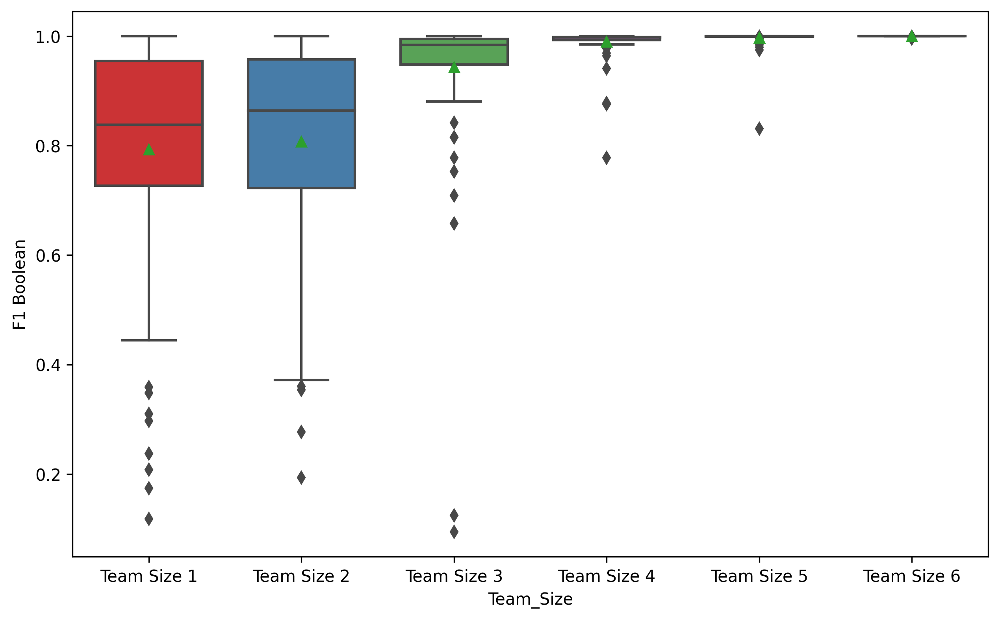

In [222]:
plt.figure(figsize=(10,6), dpi=300)
sns.boxplot(
        y="F1 Boolean",
        x="Team_Size",
        hue="Average Indegree per Core Node",
        data=melt_table_complete,
        width=0.7,
        palette='Set1', showmeans = True
    )
# plt.savefig('plots/F1_vs_Core Density.png', bbox_inches='tight')

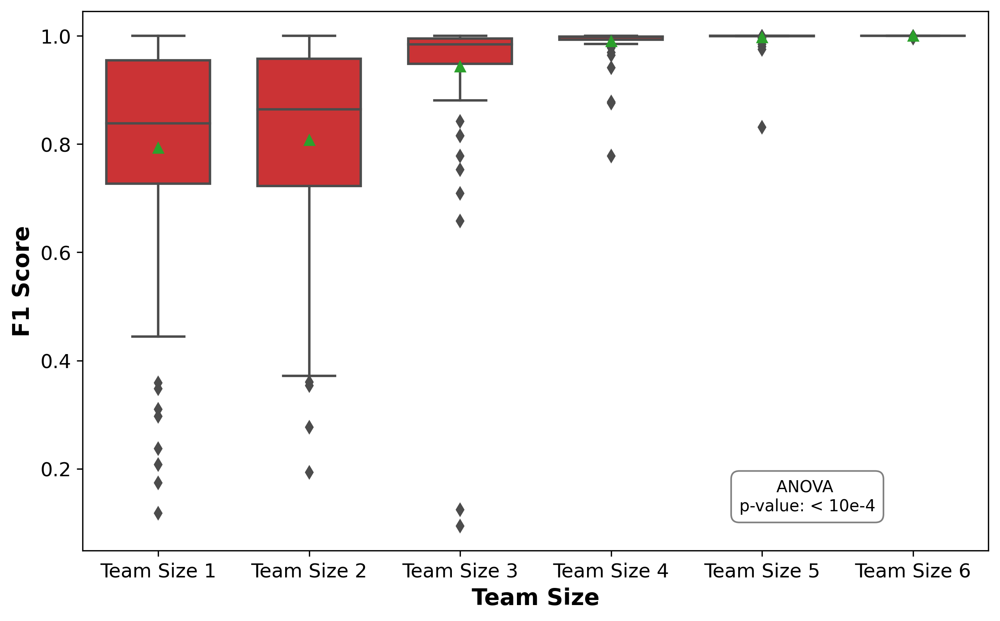

In [232]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6), dpi=300)

sns.boxplot(
    y="F1 Boolean",
    x="Team_Size",
    hue="Average Indegree per Core Node",
    data=melt_table_complete,
    width=0.7,
    palette='Set1',
    showmeans=True
)

# Remove legend
plt.legend().set_visible(False)

# Perform ANOVA across team size (assuming you have the necessary libraries imported)
import scipy.stats as stats

# Example: Replace 'YourDataFrame' and 'YourTeamSizeColumn' with your actual DataFrame and column name
result = stats.f_oneway(*[melt_table_complete['F1 Boolean'][melt_table_complete['Team_Size'] == team_size] for team_size in melt_table_complete['Team_Size'].unique()])

# Display the p-value from ANOVA
plt.text(0.8, 0.1, f'ANOVA \np-value: < 10e-4', transform=plt.gca().transAxes, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.5'))

# Add other plot customizations or annotations as needed
plt.xlabel('Team Size', fontsize=14, fontweight='bold')
plt.ylabel('F1 Score', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6), dpi=300)

sns.boxplot(
    y="F1 Boolean",
    x="Team_Size",
    hue="Average Indegree per Core Node",
    data=melt_table_complete,
    width=0.7,
    palette='Set1',
    showmeans=True
)

# Remove legend
plt.legend().set_visible(False)

# Perform ANOVA across team size (assuming you have the necessary libraries imported)
import scipy.stats as stats

# Example: Replace 'YourDataFrame' and 'YourTeamSizeColumn' with your actual DataFrame and column name
result = stats.f_oneway(*[melt_table_complete['F1 Boolean'][melt_table_complete['Team_Size'] == team_size] for team_size in melt_table_complete['Team_Size'].unique()])

# Display the p-value from ANOVA
plt.text(0.8, 0.1, f'ANOVA \np-value: < 10e-4', transform=plt.gca().transAxes, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.5'))

# Add other plot customizations or annotations as needed
plt.xlabel('Team Size', fontsize=14, fontweight='bold')
plt.ylabel('F1 Score', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


NameError: name 'melt_table_complete' is not defined

<Figure size 3000x1800 with 0 Axes>

In [ ]:
pairs = [
    (('Team Size 1', 'Without Self Activation'), ('Team Size 1', 'With Self Activation')),
    (('Team Size 2', 'Without Self Activation'), ('Team Size 2', 'With Self Activation')),
    (('Team Size 3', 'Without Self Activation'), ('Team Size 3', 'With Self Activation')),
    (('Team Size 4', 'Without Self Activation'), ('Team Size 4', 'With Self Activation')),
    (('Team Size 5', 'Without Self Activation'), ('Team Size 5', 'With Self Activation')),
    (('Team Size 6', 'Without Self Activation'), ('Team Size 6', 'With Self Activation'))
]

hue_plot_params = {
    'data': melt_table_complete,
    'x': "Team_Size",
    'y': "F1",
    'hue': "Self_Activation_Status"
}

#plt.ylim(0, 1.2)

with sns.plotting_context("notebook"):
    plt.figure(figsize=(10,6))  # Move this line here

    ax = sns.boxplot(
        y="F1",
        x="Team_Size",
        hue="Self_Activation_Status",
        data=melt_table_complete,
        width=0.7,
        palette='Set1'
    )

    # Customize the color of the lines based on the hue
    hue_colors = sns.color_palette("Set1", len(melt_table_complete["Self_Activation_Status"].unique()))

    for i, line in enumerate(ax.lines):
        box_index = i // 6
        line.set_color(hue_colors[box_index % len(hue_colors)])

    # Add annotations
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test="Mann-Whitney", verbose=False)
    _, results = annotator.apply_and_annotate()

    plt.title('F1 vs Team Size (Teamed Toggle Switch)_Boolean')
    plt.legend(bbox_to_anchor=(0.01, 0.2), loc='upper left', borderaxespad=0)
    plt.xlabel('Team_Size')

    custom_ticks = np.linspace(0, 1, 5)  # Adjust the number of ticks as needed
    plt.yticks(custom_ticks)

plt.savefig('plots/F1 vs Team Size_both_switch.png', bbox_inches='tight')
plt.show()


In [125]:
melt_table_complete

,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.746,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
1,no out_1,Team Size 5,0,0,0.559,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
2,no out_2,Team Size 5,0,0,0.527,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
3,no out_3,Team Size 5,0,0,0.617,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
4,no out_4,Team Size 5,0,0,0.603,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
5,no out_5,Team Size 5,0,0,0.576,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
6,no out_6,Team Size 5,0,0,0.572,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
7,no out_7,Team Size 5,0,0,0.540,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
8,no out_8,Team Size 5,0,0,0.536,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0
9,no out_9,Team Size 5,0,0,0.562,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,20.0


<AxesSubplot: xlabel='Core Density', ylabel='F1 Boolean'>

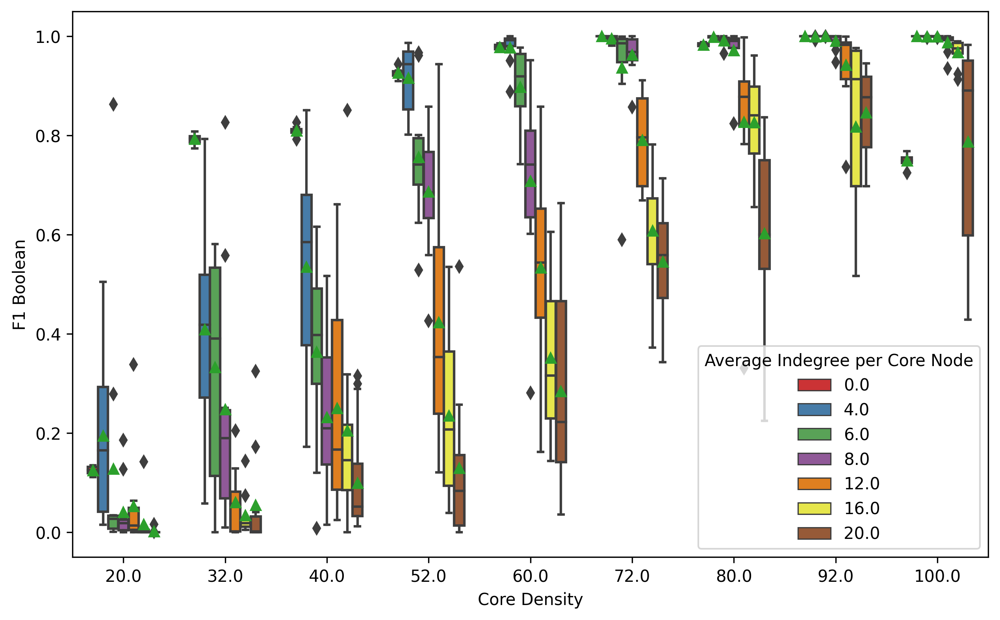

In [40]:
plt.figure(figsize=(10,6), dpi=300)
sns.boxplot(
        y="F1 Boolean",
        x="Core Density",
        hue="Average Indegree per Core Node",
        data=melt_table_complete,
        width=0.7,
        palette='Set1', showmeans = True
    )
# plt.savefig('plots/F1_vs_Core Density.png', bbox_inches='tight')

In [ ]:
boolean_f1_finder_list(  matrix_index_sort(Topo_adj(topo_file)), 1000,coresize )

In [77]:
topo60 = pd.read_csv('Density_60_Network_10N_core0.topo',sep='\t')
boolean_f1_finder_list(  matrix_index_sort(Topo_adj(topo60)), 1000,10 )


['N08', 'N04', 'N01', 'N05', 'N03', 'N02', 'N09', 'N07', 'N06', 'N00']
['N08', 'N04', 'N01', 'N05', 'N03', 'N02', 'N09', 'N07', 'N06', 'N00']


Processing: 100%|██████████| 1000/1000 [00:02<00:00, 443.53it/s]

1000


1.0

In [ ]:
pairs = [
    (('Team Size 1', 'Without Self Activation'), ('Team Size 1', 'With Self Activation')),
    (('Team Size 2', 'Without Self Activation'), ('Team Size 2', 'With Self Activation')),
    (('Team Size 3', 'Without Self Activation'), ('Team Size 3', 'With Self Activation')),
    (('Team Size 4', 'Without Self Activation'), ('Team Size 4', 'With Self Activation')),
    (('Team Size 5', 'Without Self Activation'), ('Team Size 5', 'With Self Activation')),
    (('Team Size 6', 'Without Self Activation'), ('Team Size 6', 'With Self Activation'))
]

hue_plot_params = {
    'data': melt_table_complete,
    'x': "Team_Size",
    'y': "F1",
    'hue': "Self_Activation_Status"
}

#plt.ylim(0, 1.2)

with sns.plotting_context("notebook"):
    plt.figure(figsize=(10,6))  # Move this line here

    ax = sns.boxplot(
        y="F1",
        x="Team_Size",
        hue="Self_Activation_Status",
        data=melt_table_complete,
        width=0.7,
        palette='Set1'
    )

    # Customize the color of the lines based on the hue
    hue_colors = sns.color_palette("Set1", len(melt_table_complete["Self_Activation_Status"].unique()))

    for i, line in enumerate(ax.lines):
        box_index = i // 6
        line.set_color(hue_colors[box_index % len(hue_colors)])

    # Add annotations
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test="Mann-Whitney", verbose=False)
    _, results = annotator.apply_and_annotate()

    plt.title('F1 vs Team Size (Teamed Toggle Switch)_Boolean')
    plt.legend(bbox_to_anchor=(0.01, 0.2), loc='upper left', borderaxespad=0)
    plt.xlabel('Team_Size')

    custom_ticks = np.linspace(0, 1, 5)  # Adjust the number of ticks as needed
    plt.yticks(custom_ticks)

plt.savefig('plots/F1 vs Team Size_both_switch.png', bbox_inches='tight')
plt.show()


In [42]:
Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_20', 10, 'Core_Density_32_In_deg_20_Net',20,'Density_32_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_20', 10, 'Core_Density_52_In_deg_20_Net',20,'Density_52_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_20', 10, 'Core_Density_72_In_deg_20_Net',20,'Density_72_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_20', 10, 'Core_Density_92_In_deg_20_Net',20,'Density_92_Network_10N_core0.topo')


Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_4', 10, 'Core_Density_32_In_deg_4_Net',4,'Density_32_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_4', 10, 'Core_Density_52_In_deg_4_Net',4,'Density_52_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_4', 10, 'Core_Density_72_In_deg_4_Net',4,'Density_72_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_4', 10, 'Core_Density_92_In_deg_4_Net',4,'Density_92_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_6', 10, 'Core_Density_32_In_deg_6_Net',6,'Density_32_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_6', 10, 'Core_Density_52_In_deg_6_Net',6,'Density_52_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_6', 10, 'Core_Density_72_In_deg_6_Net',6,'Density_72_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_6', 10, 'Core_Density_92_In_deg_6_Net',6,'Density_92_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_8', 10, 'Core_Density_32_In_deg_8_Net',8,'Density_32_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_8', 10, 'Core_Density_52_In_deg_8_Net',8,'Density_52_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_8', 10, 'Core_Density_72_In_deg_8_Net',8,'Density_72_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_8', 10, 'Core_Density_92_In_deg_8_Net',8,'Density_92_Network_10N_core0.topo')

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.94it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.80it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 180.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.46it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.91it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 119.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.04it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.28it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5


{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
40
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 'N25', 'N26', 'N27', 'N28', 'N29'] ['N15', 'N16', 'N17', 'N18', 'N19', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.26it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  20%|██        | 1/5 [00:00<00:02,  2.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.13it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 128.91it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.44it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 81.17it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 72.69it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 126.60it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 114.12it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 158.82it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.63it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.44it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.79it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.14it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 105.00it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 118.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.12it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 94.09it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.50it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.89it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.26it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.99it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.97it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 51.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 168.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.65it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.09it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.26it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 41.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 162.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 14.96it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.72it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.63it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.00it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 180.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 13.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 116.13it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 218.68it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.62it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 103.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 253.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.61it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.80it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 113.48it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.68it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 72.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 82.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.62it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  2.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 60.55it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 114.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.69it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 116.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.75it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 15.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.30it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 78.87it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.72it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.98it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 255.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 54.28it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 77.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 146.18it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 123.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.59it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.28it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.14it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 124.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.65it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.29it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.15it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36',

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.48it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 125.74it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.65it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.04it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 142.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 97.79it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.13it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 114.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 159.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.49it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.69it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.40it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.44it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.06it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.62it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  4.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.74it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.15it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.52it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.78it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 36.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.18it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.99it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 106.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 105.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.91it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 65.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.80it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.80it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 126.22it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.50it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [47]:
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_4', 10, 'Core_Density_20_In_deg_4_Net',4,'Density_20_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_6', 10, 'Core_Density_20_In_deg_6_Net',6,'Density_20_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_8', 10, 'Core_Density_20_In_deg_8_Net',8,'Density_20_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_20', 10, 'Core_Density_20_In_deg_20_Net',20,'Density_20_Network_10N_core0.topo')



['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.93it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.91it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.50it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.69it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 39.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.56it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  3.84it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
20 4 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
20
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
20 4 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
20
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.44it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.51it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 81.18it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.73it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:02,  1.87it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 74.55it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  40%|████      | 2/5 [00:00<00:00,  5.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 110.55it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
30 6 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
30
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
30 6 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
30
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 159.98it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 53.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.64it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.97it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.35it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  20%|██        | 1/5 [00:00<00:01,  2.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.54it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 148.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 67.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.40it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 151.80it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 105.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
40 8 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
40
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
40 8 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
40
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', '

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.22it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.68it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 60.41it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', '

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 99.48it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.99it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
100 20 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
100
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
100 20 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
100
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 43.29it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

<Figure size 640x480 with 0 Axes>

In [44]:
import multiprocessing


def process_parameter_set(parameters):
    return BiC_CC_F1_team_strength(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(10)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ('Core_Density_32/Core_Density_32_In_deg_4/Core_Density_32_In_deg_4_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                             4,'8E:N' ,rp) for rp in rp_range] 
    parameter_sets.extend([('Core_Density_32/Core_Density_32_In_deg_6/Core_Density_32_In_deg_6_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                             6,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_32/Core_Density_32_In_deg_8/Core_Density_32_In_deg_8_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                                8,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_4/Core_Density_52_In_deg_4_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                4,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_6/Core_Density_52_In_deg_6_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                6,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_8/Core_Density_52_In_deg_8_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                8,'8E:N' ,rp) for rp in rp_range])
    
    
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_4/Core_Density_72_In_deg_4_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                4,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_6/Core_Density_72_In_deg_6_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                6,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_8/Core_Density_72_In_deg_8_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                8,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_4/Core_Density_92_In_deg_4_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                4,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_6/Core_Density_92_In_deg_6_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                6,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                8,'8E:N' ,rp) for rp in rp_range])
    

    parameter_sets.extend([('Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                                20,'8E:N' ,rp) for rp in rp_range])

    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                             20,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                20,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                20,'8E:N' ,rp) for rp in rp_range])





    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    melt_table_complete_run = pd.concat(results, ignore_index=True)
    melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
melt_table_complete

Processing:  58%|█████▊    | 580/1000 [00:43<00:23, 17.65it/s]

1000


Processing:  33%|███▎      | 327/1000 [00:18<00:34, 19.54it/s]

[0.9990000000000002]
Core_Density_72/Core_Density_72_In_deg_8/Core_Density_72_In_deg_8_Net6.topo
8
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  88%|████████▊ | 885/1000 [00:20<00:02, 52.46it/s]

1000

Processing:   8%|▊         | 78/1000 [00:04<00:43, 21.30it/s]]

Processing:  64%|██████▍   | 644/1000 [00:48<00:28, 12.61it/s]

[0.0]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net1.topo


Processing:  96%|█████████▌| 955/1000 [00:27<00:01, 30.07it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing:  84%|████████▍ | 843/1000 [00:51<00:06, 23.06it/s]

2


Processing:  38%|███▊      | 383/1000 [00:29<00:49, 12.55it/s]

Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net2.topo

Processing:  89%|████████▉ | 891/1000 [00:20<00:02, 52.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  78%|███████▊  | 785/1000 [02:54<01:26,  2.49it/s]

1000


Processing:  41%|████      | 406/1000 [00:30<00:33, 17.62it/s]

[0.16099999999999995]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net5.topo
6
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net6.topo

Processing:  18%|█▊        | 182/1000 [00:35<03:05,  4.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.63it/s]


1000
[0.9649999999999999]
Core_Density_72/Core_Density_72_In_deg_8/Core_Density_72_In_deg_8_Net3.topo
1


Processing:  79%|███████▉  | 790/1000 [02:54<00:40,  5.16it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.12it/s]


1000
[0.9490000000000003]

Processing:  52%|█████▏    | 520/1000 [00:26<00:18, 25.64it/s]


Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net7.topo
8
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   9%|▉         | 92/1000 [00:03<00:33, 27.51it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 47.02it/s]


1000

Processing:  72%|███████▏  | 717/1000 [00:52<00:20, 13.96it/s]


[0.0009999999999999996]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net7.topo
8


Processing:  49%|████▉     | 491/1000 [01:50<00:41, 12.28it/s]

Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:34<00:00, 28.60it/s]


1000

Processing:  16%|█▌        | 157/1000 [00:06<00:33, 25.41it/s]


[0.999]
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net6.topo
4


Processing:   4%|▍         | 41/1000 [00:01<00:43, 21.87it/s]]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net4.topo


Processing:  12%|█▏        | 119/1000 [00:04<00:38, 22.64it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  59%|█████▉    | 588/1000 [00:29<00:21, 19.32it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:01<00:00, 16.17it/s]


1000
[1.0]
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net3.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


7


Processing:  19%|█▉        | 188/1000 [00:03<00:15, 54.11it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net7.topo

Processing:  28%|██▊       | 280/1000 [00:14<00:36, 19.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:16<00:00, 13.00it/s]


1000


Processing:  75%|███████▍  | 749/1000 [00:58<00:30,  8.32it/s]

[0.06399999999999996]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net3.topo
4

Processing:  34%|███▍      | 340/1000 [02:01<03:48,  2.89it/s]

Processing:  60%|██████    | 602/1000 [02:15<01:40,  3.96it/s]

Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net4.topo

Processing:  93%|█████████▎| 929/1000 [00:27<00:03, 20.60it/s]

Processing:  52%|█████▎    | 525/1000 [00:25<00:18, 25.28it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 40.69it/s]


1000
[0.4509999999999999]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net4.topo

Processing:  56%|█████▌    | 562/1000 [00:27<00:36, 12.03it/s]


5
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  60%|██████    | 602/1000 [00:35<00:22, 17.79it/s]


['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

1000
[0.06799999999999999]

Processing:  65%|██████▌   | 653/1000 [00:31<00:18, 18.98it/s]


Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net6.topo

Processing:  62%|██████▏   | 620/1000 [00:29<00:16, 22.44it/s]


7

Processing:  56%|█████▋    | 564/1000 [00:27<00:36, 12.02it/s]

Processing:  79%|███████▉  | 791/1000 [01:01<00:14, 14.13it/s]

Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  60%|██████    | 605/1000 [00:36<00:24, 16.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  70%|███████   | 700/1000 [00:21<00:07, 38.42it/s]

Processing: 100%|██████████| 1000/1000 [00:54<00:00, 18.38it/s]


1000

Processing:  66%|██████▌   | 659/1000 [00:31<00:20, 16.73it/s]


[1.0000000000000002]

Processing:  63%|██████▎   | 626/1000 [00:29<00:19, 19.14it/s]


Core_Density_92/Core_Density_92_In_deg_6/Core_Density_92_In_deg_6_Net7.topo
0


Processing:  11%|█         | 112/1000 [00:02<00:27, 32.14it/s]

Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net0.topo

Processing:  51%|█████     | 506/1000 [00:27<00:36, 13.48it/s]

Processing:  90%|█████████ | 903/1000 [03:24<00:20,  4.67it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  72%|███████▏  | 719/1000 [00:21<00:05, 49.41it/s]

Processing:  62%|██████▏   | 616/1000 [02:18<02:31,  2.54it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 35.99it/s]


1000
[0.583]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net7.topo


Processing:  14%|█▍        | 143/1000 [00:06<00:36, 23.30it/s]

8


Processing:  71%|███████   | 706/1000 [00:33<00:08, 35.68it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  36%|███▌      | 358/1000 [01:12<01:14,  8.61it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  79%|███████▉  | 790/1000 [00:36<00:08, 24.43it/s]

Processing:  40%|███▉      | 395/1000 [01:17<01:16,  7.94it/s]

1000
[0.0049999999999999975]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net2.topo
3


Processing:  54%|█████▍    | 540/1000 [00:14<00:15, 30.19it/s]

Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:15<00:00, 13.20it/s]


1000
[0.0]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net2.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


3
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:42<00:00, 23.35it/s]


1000
[0.9759999999999999]
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net8.topo
9
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net9.topo


Processing:  93%|█████████▎| 933/1000 [00:41<00:03, 19.32it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:45<00:00, 21.95it/s]


1000
[0.483]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net1.topo
2


Processing:  70%|██████▉   | 698/1000 [00:15<00:08, 35.19it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net2.topo


Processing:   3%|▎         | 33/1000 [00:00<00:26, 36.19it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.47it/s]


1000
[0.0]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net8.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


6
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net6.topo


Processing:  25%|██▌       | 254/1000 [00:17<00:55, 13.47it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:57<00:00, 17.46it/s]


1000
[0.0009999999999999998]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net8.topo
9
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net9.topo

Processing:  10%|▉         | 97/1000 [00:03<00:31, 29.12it/s]

Processing:  19%|█▉        | 190/1000 [00:06<00:29, 27.06it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [03:46<00:00,  4.41it/s]


1000
[0.994]


Processing:  18%|█▊        | 180/1000 [00:07<00:43, 18.91it/s]

Core_Density_72/Core_Density_72_In_deg_6/Core_Density_72_In_deg_6_Net9.topo

Processing:  22%|██▏       | 219/1000 [00:07<00:26, 29.27it/s]

Processing:  16%|█▌        | 160/1000 [00:15<01:29,  9.42it/s]

0


Processing:  12%|█▎        | 125/1000 [00:04<00:35, 24.45it/s]

Core_Density_72/Core_Density_72_In_deg_8/Core_Density_72_In_deg_8_Net0.topo


Processing:  51%|█████     | 511/1000 [00:22<00:23, 20.65it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.39it/s]


1000
[0.005999999999999998]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net7.topo
9


Processing:   3%|▎         | 29/1000 [00:01<00:57, 17.00it/s]

Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net9.topo

Processing:  54%|█████▍    | 542/1000 [00:24<00:37, 12.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 34.97it/s]


1000
[0.0019999999999999987]


Processing:  27%|██▋       | 272/1000 [00:11<00:29, 24.78it/s]

Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net4.topo


Processing:  19%|█▉        | 191/1000 [00:19<00:59, 13.49it/s]

5


Processing:  30%|██▉       | 298/1000 [00:10<00:30, 23.06it/s]

Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net5.topo

Processing:  22%|██▏       | 219/1000 [00:08<00:24, 31.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   3%|▎         | 32/1000 [00:01<00:36, 26.68it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:47<00:00, 21.00it/s]


1000
[0.3519999999999999]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net5.topo
6


Processing:  96%|█████████▌| 962/1000 [00:32<00:01, 32.49it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.72it/s]


1000


Processing:  86%|████████▋ | 864/1000 [00:34<00:03, 41.34it/s]

[1.0000000000000002]
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net9.topo


Processing:  50%|████▉     | 496/1000 [02:53<01:50,  4.56it/s]

1000


Processing:  84%|████████▍ | 843/1000 [03:07<00:41,  3.83it/s]

[0.706]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net6.topo
7
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   9%|▊         | 86/1000 [00:01<00:15, 59.83it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:39<00:00, 25.38it/s]


1000
[0.15499999999999992]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net3.topo
4


Processing:   4%|▎         | 35/1000 [00:04<02:31,  6.38it/s]]

Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  65%|██████▍   | 646/1000 [00:40<00:23, 15.07it/s]

1000

Processing:  94%|█████████▍| 944/1000 [00:41<00:02, 24.63it/s]


[0.9130000000000001]


Processing:  61%|██████    | 609/1000 [00:55<00:31, 12.40it/s]

Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net3.topo


Processing:  66%|██████▌   | 662/1000 [00:38<00:21, 15.61it/s]

4


Processing:  34%|███▍      | 344/1000 [00:08<00:19, 33.18it/s]

Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:43<00:00, 23.09it/s]


1000


Processing:  68%|██████▊   | 678/1000 [00:42<00:23, 13.68it/s]

[0.122]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net9.topo


Processing:  44%|████▎     | 436/1000 [00:10<00:12, 46.79it/s]

0


Processing:  55%|█████▍    | 548/1000 [03:08<02:42,  2.78it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:   8%|▊         | 85/1000 [00:02<00:21, 42.82it/s]]


['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:39<00:00, 25.47it/s]


1000
[0.18599999999999994]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net5.topo


Processing:   5%|▍         | 48/1000 [00:03<01:11, 13.27it/s]

1000


Processing:  74%|███████▍  | 743/1000 [00:46<00:11, 21.72it/s]

[0.455]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net6.topo


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.78it/s]


1000
[0.5399999999999998]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net4.topo


Processing: 100%|██████████| 1000/1000 [00:54<00:00, 18.36it/s]


1000

Processing:  40%|███▉      | 398/1000 [01:02<00:59, 10.05it/s]


[0.9359999999999999]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [01:18<00:00, 12.72it/s]


1000
[0.8889999999999999]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net0.topo
1
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:56<00:00, 17.57it/s]


1000
[0.9530000000000002]
Core_Density_72/Core_Density_72_In_deg_8/Core_Density_72_In_deg_8_Net0.topo


Processing: 100%|██████████| 1000/1000 [03:38<00:00,  4.58it/s]


1000


Processing:  41%|████      | 409/1000 [01:04<00:57, 10.31it/s]

[0.9999999999999998]


Processing:  76%|███████▌  | 755/1000 [02:25<00:36,  6.67it/s]

Core_Density_92/Core_Density_92_In_deg_6/Core_Density_92_In_deg_6_Net8.topo
9
Core_Density_92/Core_Density_92_In_deg_6/Core_Density_92_In_deg_6_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.81it/s]


1000


Processing:  42%|████▏     | 417/1000 [01:05<01:08,  8.52it/s]

[0.892]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net4.topo
5
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:21<00:00, 12.23it/s]


1000
[0.6110000000000001]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net8.topo
9


Processing:  43%|████▎     | 431/1000 [00:07<00:13, 41.86it/s]

Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  78%|███████▊  | 785/1000 [00:21<00:05, 37.03it/s]

1000
[0.7729999999999998]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net5.topo


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 46.35it/s]


1000
[0.9999999999999998]
Core_Density_92/Core_Density_92_In_deg_6/Core_Density_92_In_deg_6_Net9.topo
0
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.56it/s]


1000
[0.787]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net1.topo
2
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [02:59<00:00,  5.57it/s]


1000
[0.0]
Core_Density_32/Core_Density_32_In_deg_20/Core_Density_32_In_deg_20_Net9.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


0
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:50<00:00, 19.94it/s]


1000
[0.6779999999999997]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net0.topo


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 50.17it/s]


1000
[0.989]
Core_Density_92/Core_Density_92_In_deg_8/Core_Density_92_In_deg_8_Net0.topo


Processing: 100%|██████████| 1000/1000 [01:52<00:00,  8.89it/s]


1000
[0.644]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net2.topo
3
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 39.10it/s]


1000
[0.9359999999999999]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net2.topo


Processing: 100%|██████████| 1000/1000 [01:31<00:00, 10.98it/s]


1000
[0.8849999999999998]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net7.topo
8
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net8.topo


Processing:  85%|████████▌ | 853/1000 [00:26<00:04, 32.42it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.28it/s]


1000
[0.5279999999999999]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:13<00:00, 76.33it/s]


1000
[0.634]
Core_Density_72/Core_Density_72_In_deg_20/Core_Density_72_In_deg_20_Net3.topo


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 33.13it/s]


1000
[0.23699999999999996]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net0.topo
1
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [04:43<00:00,  3.53it/s]


1000
[1.0]
Core_Density_92/Core_Density_92_In_deg_4/Core_Density_92_In_deg_4_Net2.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:15<00:00, 63.91it/s]


1000
[0.03699999999999999]
Core_Density_52/Core_Density_52_In_deg_20/Core_Density_52_In_deg_20_Net1.topo


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.42it/s]


1000
[0.7469999999999999]
Core_Density_92/Core_Density_92_In_deg_20/Core_Density_92_In_deg_20_Net8.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.706,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
1,no out_1,Team Size 5,0,0,0.708,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
2,no out_2,Team Size 5,0,0,0.447,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
3,no out_3,Team Size 5,0,0,0.261,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
4,no out_4,Team Size 5,0,0,0.357,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,no out_5,Team Size 5,0,0,0.773,0,0,0,0,0,0,no out,Yes,10.0,30.0,92.0,8E:N,20.0
156,no out_6,Team Size 5,0,0,0.706,0,0,0,0,0,0,no out,Yes,10.0,30.0,92.0,8E:N,20.0
157,no out_7,Team Size 5,0,0,0.885,0,0,0,0,0,0,no out,Yes,10.0,30.0,92.0,8E:N,20.0
158,no out_8,Team Size 5,0,0,0.747,0,0,0,0,0,0,no out,Yes,10.0,30.0,92.0,8E:N,20.0


In [48]:
import multiprocessing


def process_parameter_set(parameters):
    return BiC_CC_F1_team_strength(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(10)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ('Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             4,'8E:N' ,rp) for rp in rp_range] 
    parameter_sets.extend([('Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             6,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                                8,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                                20,'8E:N' ,rp) for rp in rp_range])
    
    
    
    
 




    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    melt_table_complete_run = pd.concat(results, ignore_index=True)
    melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
melt_table_complete

305214678093





1



42




Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net6.topoCore_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net1.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net2.topoCore_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net0.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net7.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net3.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net0.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net1.topo
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net3.topo


Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net4.topoCore_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net4.topo






Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', '

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

Processing: 100%|██████████| 1000/1000 [00:14<00:00, 68.64it/s]


1000


Processing:  35%|███▍      | 348/1000 [00:14<00:28, 23.15it/s]

[0.15599999999999992]


Processing:  44%|████▍     | 438/1000 [00:14<00:16, 33.86it/s]

Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net3.topo
5

Processing:  25%|██▌       | 254/1000 [00:14<00:27, 27.10it/s]

Processing:  65%|██████▌   | 654/1000 [00:14<00:06, 51.65it/s]

Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  38%|███▊      | 385/1000 [00:14<00:23, 26.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 45.38it/s]


1000

Processing:  68%|██████▊   | 684/1000 [00:22<00:12, 24.41it/s]

Processing: 100%|█████████▉| 999/1000 [00:22<00:00, 47.20it/s]

[0.0029999999999999988]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net4.topo
6
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 45.19it/s]


1000
[0.2539999999999999]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net3.topo


Processing:  90%|█████████ | 905/1000 [00:22<00:01, 49.23it/s]

7

Processing:  37%|███▋      | 373/1000 [00:22<00:38, 16.37it/s]

Processing:  52%|█████▎    | 525/1000 [00:22<00:19, 24.76it/s]

Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net7.topo

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

Processing:  57%|█████▊    | 575/1000 [00:22<00:18, 22.66it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  39%|███▉      | 390/1000 [00:22<00:52, 11.66it/s]

Processing:  68%|██████▊   | 685/1000 [00:25<00:13, 23.38it/s]

1000
[0.025999999999999992]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net0.topo
8


Processing:  24%|██▍       | 240/1000 [00:25<00:45, 16.86it/s]

Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net8.topo

Processing:  41%|████▏     | 414/1000 [00:25<00:38, 15.23it/s]

Processing:  59%|█████▉    | 592/1000 [00:25<00:16, 25.13it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  26%|██▌       | 262/1000 [00:10<00:37, 19.79it/s]

Processing:  79%|███████▉  | 793/1000 [00:25<00:06, 30.53it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:31<00:00, 31.44it/s]


1000
[0.314]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net0.topo
9


Processing:  77%|███████▋  | 770/1000 [00:31<00:08, 28.38it/s]

Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   3%|▎         | 26/1000 [00:00<00:15, 61.04it/s]

1000


Processing:  56%|█████▌    | 560/1000 [00:32<00:23, 18.73it/s]

[0.019999999999999997]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net1.topo
0
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  12%|█▏        | 121/1000 [00:10<01:22, 10.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  88%|████████▊ | 881/1000 [00:13<00:01, 81.94it/s]

1000

Processing:  57%|█████▋    | 573/1000 [00:35<00:46,  9.17it/s]


[0.4849999999999999]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net9.topo


Processing:  61%|██████    | 612/1000 [00:35<00:25, 15.24it/s]

1
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  61%|██████▏   | 613/1000 [00:37<00:22, 17.37it/s]

1000
[0.21799999999999994]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net5.topo
2
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  23%|██▎       | 234/1000 [00:05<00:22, 34.63it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

1000
[0.0039999999999999975]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net7.topo
3
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.90it/s]


1000
[0.037999999999999985]


Processing:  44%|████▍     | 439/1000 [00:15<00:20, 27.17it/s]

Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net6.topo

Processing:  66%|██████▋   | 663/1000 [00:25<00:09, 35.88it/s]


4
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  65%|██████▌   | 650/1000 [00:40<00:36,  9.66it/s]

Processing: 100%|██████████| 1000/1000 [00:16<00:00, 61.14it/s]


1000
[0.043999999999999984]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net3.topo
5


Processing:  86%|████████▋ | 863/1000 [00:53<00:08, 17.01it/s]

Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.81it/s]


1000
[0.011999999999999995]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net5.topo
6
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:55<00:00, 17.99it/s]


1000
[0.016999999999999994]

Processing:  58%|█████▊    | 576/1000 [00:55<00:59,  7.11it/s]


Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net2.topo
7
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net7.topo


Processing:  88%|████████▊ | 883/1000 [00:19<00:01, 60.61it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:17<00:00, 56.06it/s]


1000
[0.016999999999999994]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net4.topo
8


Processing:  95%|█████████▌| 952/1000 [00:58<00:02, 18.14it/s]

Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  10%|█         | 104/1000 [00:03<00:25, 35.70it/s]

1000


Processing:  99%|█████████▉| 990/1000 [00:26<00:00, 45.37it/s]

[0.12899999999999998]


Processing:   0%|          | 1/1000 [00:00<02:11,  7.61it/s]

Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net1.topo


Processing:  92%|█████████▏| 918/1000 [00:58<00:04, 16.65it/s]

9
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net9.topo

Processing:  48%|████▊     | 478/1000 [00:25<00:32, 16.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  12%|█▏        | 116/1000 [00:02<00:30, 28.56it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.06it/s]


1000


Processing:   1%|          | 6/1000 [00:00<00:40, 24.44it/s]

[0.007999999999999995]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net8.topo
0
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.30it/s]


1000

Processing:  12%|█▏        | 119/1000 [00:03<00:24, 35.49it/s]

Processing:   0%|          | 3/1000 [00:00<01:52,  8.87it/s]

[0.02399999999999999]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net9.topo
1
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  40%|████      | 400/1000 [00:36<01:32,  6.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:00<00:00, 16.44it/s]


1000


Processing:  52%|█████▏    | 516/1000 [00:06<00:05, 82.36it/s]

[0.04899999999999997]


Processing:  22%|██▏       | 222/1000 [00:05<00:17, 45.54it/s]

Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net2.topo
2Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net2.topo



Processing:   4%|▎         | 35/1000 [00:02<01:03, 15.10it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:   8%|▊         | 84/1000 [00:02<00:38, 23.58it/s]]

Processing:  65%|██████▍   | 648/1000 [01:03<00:27, 12.68it/s]

1000


Processing:  16%|█▌        | 161/1000 [00:04<00:28, 29.63it/s]

[0.16999999999999996]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net8.topo
3
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  69%|██████▉   | 692/1000 [00:09<00:03, 84.73it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:03<00:00, 15.75it/s]


1000
[0.8519999999999999]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net1.topo
4


Processing:  17%|█▋        | 172/1000 [00:05<00:34, 23.88it/s]

Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  47%|████▋     | 473/1000 [00:11<00:10, 48.19it/s]

1000

Processing:   9%|▊         | 87/1000 [00:06<01:12, 12.63it/s]


[0.012999999999999992]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net5.topo


Processing:  32%|███▏      | 324/1000 [00:09<00:16, 40.89it/s]

5
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 39.42it/s]


1000


Processing:  24%|██▍       | 240/1000 [00:13<00:38, 19.83it/s]

[0.20599999999999993]


Processing:  61%|██████    | 608/1000 [00:58<01:02,  6.29it/s]

Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net7.topo
6


Processing:  40%|████      | 400/1000 [00:22<00:33, 17.72it/s]

Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  68%|██████▊   | 675/1000 [00:26<00:12, 26.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.17it/s]


1000
[0.005999999999999998]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net8.topo


Processing:  62%|██████▎   | 625/1000 [00:32<00:14, 25.53it/s]

7


Processing:  94%|█████████▎| 935/1000 [00:32<00:02, 28.27it/s]

Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:59<00:00, 16.79it/s]


1000


Processing:  49%|████▉     | 490/1000 [00:24<00:14, 34.38it/s]

[0.0029999999999999988]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net0.topo
8
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net8.topo


Processing:  90%|████████▉ | 895/1000 [01:31<00:08, 12.27it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.46it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net1.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing:  51%|█████     | 512/1000 [00:24<00:15, 30.99it/s]

9


Processing:  55%|█████▌    | 554/1000 [00:11<00:07, 60.82it/s]

Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:38<00:00, 26.17it/s]


1000
[0.02299999999999999]


Processing:  58%|█████▊    | 576/1000 [00:11<00:07, 58.31it/s]

Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net6.topo


Processing: 100%|██████████| 1000/1000 [00:58<00:00, 16.97it/s]


1000


Processing:   3%|▎         | 34/1000 [00:04<01:27, 11.07it/s]

[0.0059999999999999975]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net2.topo


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 52.20it/s]


1000

Processing:  45%|████▍     | 447/1000 [00:36<00:33, 16.75it/s]


[0.0019999999999999987]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net6.topo


Processing: 100%|██████████| 1000/1000 [01:41<00:00,  9.82it/s]


1000
[0.4949999999999999]
Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net4.topo


Processing: 100%|██████████| 1000/1000 [01:42<00:00,  9.77it/s]


1000


Processing:  40%|███▉      | 396/1000 [00:39<00:40, 14.80it/s]

[0.01799999999999999]

Processing:   9%|▉         | 90/1000 [00:10<02:38,  5.74it/s]


Core_Density_20/Core_Density_20_In_deg_4/Core_Density_20_In_deg_4_Net7.topo


Processing: 100%|██████████| 1000/1000 [00:46<00:00, 21.49it/s]


1000
[0.0009999999999999996]
Core_Density_20/Core_Density_20_In_deg_8/Core_Density_20_In_deg_8_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:39<00:00, 25.06it/s]


1000
[0.0009999999999999994]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net5.topo


Processing: 100%|██████████| 1000/1000 [01:28<00:00, 11.33it/s]


1000
[0.032999999999999995]
Core_Density_20/Core_Density_20_In_deg_6/Core_Density_20_In_deg_6_Net6.topo


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 19.06it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net0.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.22it/s]


1000
[0.016999999999999998]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 35.60it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net7.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:59<00:00, 16.67it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net4.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.13it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net2.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.28it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net3.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [01:06<00:00, 15.07it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_20/Core_Density_20_In_deg_20_Net8.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.706,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
1,no out_1,Team Size 5,0,0,0.708,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
2,no out_2,Team Size 5,0,0,0.447,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
3,no out_3,Team Size 5,0,0,0.261,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
4,no out_4,Team Size 5,0,0,0.357,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,no out_5,Team Size 5,0,0,0.001,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,20.0
36,no out_6,Team Size 5,0,0,0.002,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,20.0
37,no out_7,Team Size 5,0,0,0.000,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,20.0
38,no out_8,Team Size 5,0,0,0.000,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,20.0


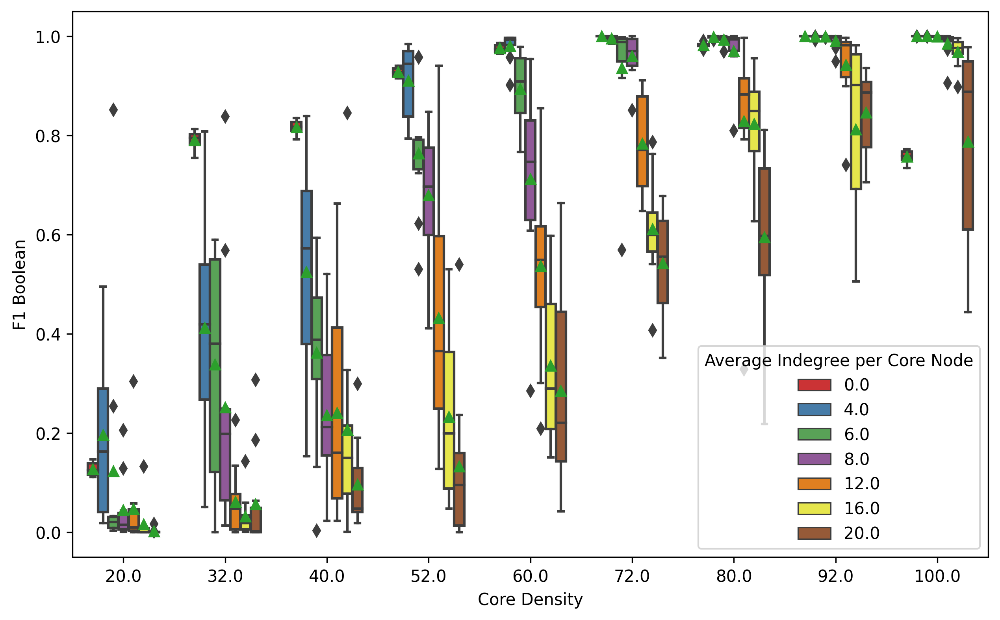

In [98]:
plt.figure(figsize=(10,6), dpi=300)
sns.boxplot(
        y="F1 Boolean",
        x="Core Density",
        hue="Average Indegree per Core Node",
        data=melt_table_complete,
        width=0.7,
        palette='Set1', showmeans = True
    )
plt.savefig('plots/F1_vs_Core Density.png', bbox_inches='tight')

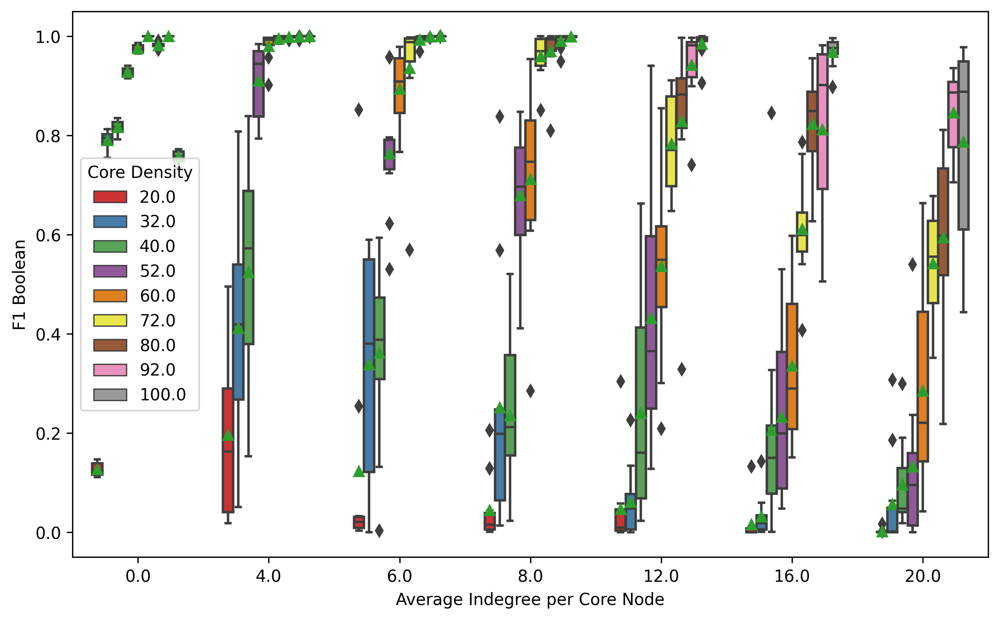

In [301]:
plt.figure(figsize=(10,6), dpi=300)
sns.boxplot(
        y="F1 Boolean",
        hue="Core Density",
        x="Average Indegree per Core Node",
        data=melt_table_complete,
        width=0.7,
        palette='Set1', showmeans = True
    )
plt.savefig('plots/F1_vs_Avg_Indegree.png', bbox_inches='tight')

In [55]:
melt_table_complete.to_csv('F1_vs_Core_Density.csv', sep='\t',index=False)

/tmp/ipykernel_1128922/1049013017.py:7: RuntimeWarning: invalid value encountered in power
  return A / (1 + (x / C)**(-n))


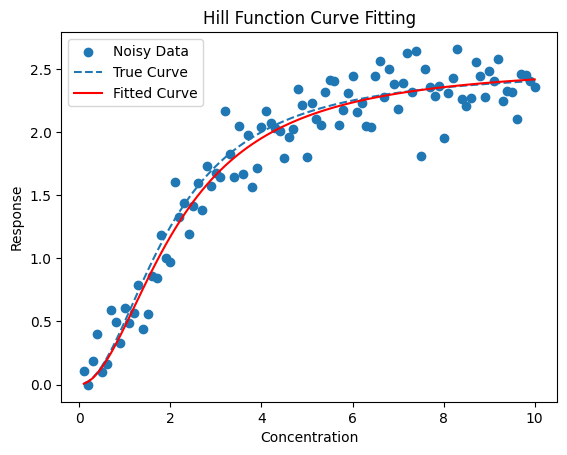

Fitted Parameters:
A: 2.538, C: 2.164, n: 1.955


In [54]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Hill function
def hill_function(x, A, C, n):
    return A / (1 + (x / C)**(-n))

# Generate synthetic data
np.random.seed(42)
x_data = np.linspace(0.1, 10, 100)
y_true = hill_function(x_data, A=2.5, C=2.0, n=2.0)
y_noisy = y_true + 0.2 * np.random.normal(size=len(x_data))

# Perform curve fitting
initial_guess = [1.0, 1.0, 1.0]  # Initial guess for parameters (A, C, n)
params, covariance = curve_fit(hill_function, x_data, y_noisy, p0=initial_guess)

# Extract fitted parameters
A_fit, C_fit, n_fit = params

# Generate fitted curve
y_fit = hill_function(x_data, A_fit, C_fit, n_fit)

# Plot the results
plt.scatter(x_data, y_noisy, label='Noisy Data')
plt.plot(x_data, y_true, label='True Curve', linestyle='--')
plt.plot(x_data, y_fit, label='Fitted Curve', linestyle='-', color='red')
plt.legend()
plt.xlabel('Concentration')
plt.ylabel('Response')
plt.title('Hill Function Curve Fitting')
plt.show()

# Display fitted parameters
print("Fitted Parameters:")
print(f"A: {A_fit:.3f}, C: {C_fit:.3f}, n: {n_fit:.3f}")


In [121]:
import pandas as pd

# Given Core Density and Indegree lists
core_density = [20]
indegree = [0]

# Create an empty DataFrame
result_df = pd.DataFrame(columns=['Core Density', 'Average Indegree per Core Node', 'Mean', 'Median'])

# Iterate through Core Density and Indegree values
for core_value in core_density:
    for indegree_value in indegree:
        # Generate some example data (replace this with your actual data)
        data = [i * core_value for i in range(indegree_value)]
        
        # Calculate mean and median
        mean_value = np.mean(data)
        median_value = np.median(data)
        
        # Append a row to the DataFrame
        result_df = result_df.append({'Core Density': core_value,
                                      'Average Indegree per Core Node': indegree_value,
                                      'Mean': mean_value,
                                      'Median': median_value}, ignore_index=True)

# Display the result DataFrame
result_df


/home/user/.local/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/user/.local/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_1128922/3408661548.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/3408661548.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/3408661548.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_

,Core Density,Average Indegree per Core Node,Mean,Median
0,20.0,0.0,NaN,NaN
1,20.0,4.0,30.0,30.0
2,20.0,6.0,50.0,50.0
3,20.0,8.0,70.0,70.0
4,20.0,12.0,110.0,110.0
...,...,...,...,...
58,100.0,6.0,250.0,250.0
59,100.0,8.0,350.0,350.0
60,100.0,12.0,550.0,550.0
61,100.0,16.0,750.0,750.0


In [125]:
import pandas as pd
import numpy as np

# Given Core Density and Indegree lists
core_density = [20, 32, 40, 52, 60,72,80,92 ,100]
indegree = [0,4, 6, 8,12,16, 20]

# Create an empty DataFrame
result_df = pd.DataFrame(columns=['Core Density', 'Average Indegree per Core Node', 'Mean', 'Median'])

# Example: Generate data with Core Density and Indegree
# Replace this part with your actual data loading
# For this example, generating some random data


# Iterate through Core Density and Indegree values
for core_value in core_density:
    for indegree_value in indegree:
        # Filter data based on Core Density and Indegree
        filtered_data = melt_table_complete[(melt_table_complete['Core Density'] == core_value) & (melt_table_complete['Average Indegree per Core Node'] == indegree_value)]

        # Calculate mean and median
        mean_value = filtered_data['F1 Boolean'].mean()
        median_value = filtered_data['F1 Boolean'].median()

        # Append a row to the DataFrame
        result_df = result_df.append({'Core Density': core_value,
                                      'Average Indegree per Core Node': indegree_value,
                                      'Mean': mean_value,
                                      'Median': median_value}, ignore_index=True)

# Display the result DataFrame
result_df


/tmp/ipykernel_1128922/2796692184.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/2796692184.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/2796692184.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/2796692184.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  result_df = result_df.append({'Core Density': core_value,
/tmp/ipykernel_1128922/2796692184.py:27: FutureWarning: The fram

,Core Density,Average Indegree per Core Node,Mean,Median
0,20.0,0.0,0.1275,0.1255
1,20.0,4.0,0.1963,0.1630
2,20.0,6.0,0.1233,0.0205
3,20.0,8.0,0.0448,0.0150
4,20.0,12.0,0.0471,0.0095
...,...,...,...,...
58,100.0,6.0,0.9998,1.0000
59,100.0,8.0,0.9990,1.0000
60,100.0,12.0,0.9847,0.9950
61,100.0,16.0,0.9681,0.9760


/home/user/.local/lib/python3.8/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/home/user/.local/lib/python3.8/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(*args, **kws)


<AxesSubplot: xlabel='Core Density', ylabel='Mean'>

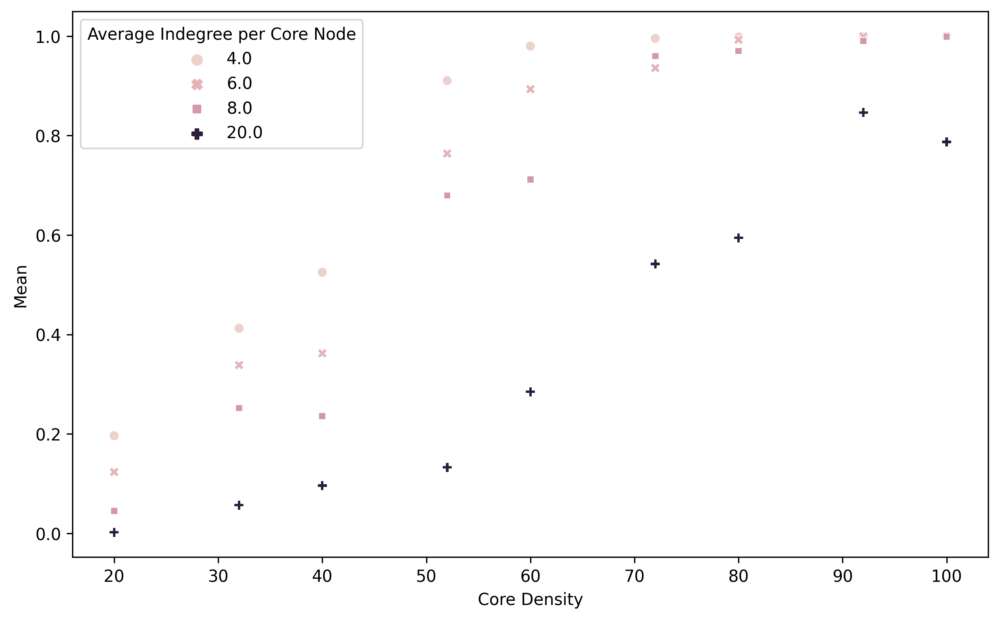

In [73]:
plt.figure(figsize=(10,6), dpi=300)
sns.scatterplot(data=result_df, x='Core Density', y='Mean', hue='Average Indegree per Core Node', style='Average Indegree per Core Node', cmap = 'coolwarm')

/home/user/.local/lib/python3.8/site-packages/seaborn/relational.py:608: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scout = ax.scatter(scout_x, scout_y, **kws)
/home/user/.local/lib/python3.8/site-packages/seaborn/relational.py:658: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  points = ax.scatter(*args, **kws)


<AxesSubplot: xlabel='Core Density', ylabel='Median'>

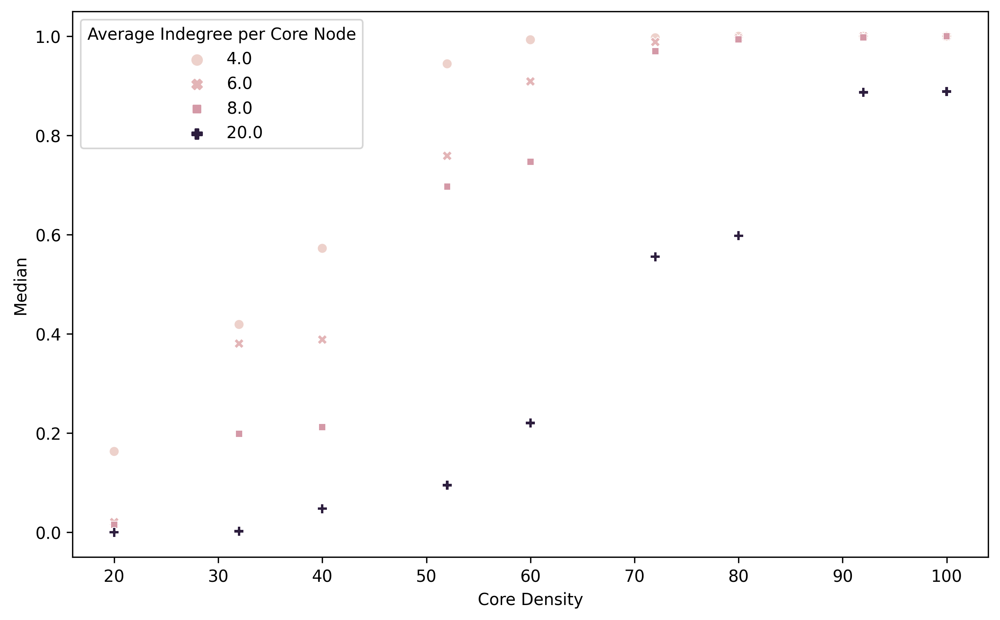

In [74]:
plt.figure(figsize=(10,6), dpi=300)
sns.scatterplot(data=result_df, x='Core Density', y='Median', hue='Average Indegree per Core Node', style='Average Indegree per Core Node', cmap = 'coolwarm')

In [79]:
result_df

,Core Density,Average Indegree per Core Node,Mean,Median
0,20.0,4.0,0.1963,0.1630
1,20.0,6.0,0.1233,0.0205
2,20.0,8.0,0.0448,0.0150
3,20.0,20.0,0.0020,0.0000
4,32.0,4.0,0.4124,0.4190
5,32.0,6.0,0.3384,0.3805
6,32.0,8.0,0.2519,0.1985
7,32.0,20.0,0.0567,0.0020
8,40.0,4.0,0.5251,0.5725
9,40.0,6.0,0.3620,0.3885


In [90]:
result_df.to_csv('F1_vs_Core_Density_results_mean_median.csv', sep='\t',index=False)

In [87]:
np.array(result_df[result_df['Average Indegree per Core Node']==4]['Mean'])

array([0.1963, 0.4124, 0.5251, 0.9105, 0.9802, 0.9955, 0.9985, 0.9991,
       0.9998])

/tmp/ipykernel_1128922/3878777398.py:11: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))


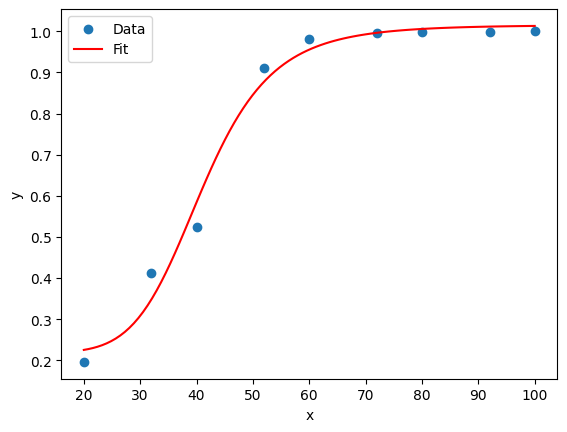

Fitted parameters: a = 0.21859257538674293, b = 0.7965876834937277, x0 = 41.00763724654716, n = 6.600138287430284


In [89]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Given data
x_data = np.array([20., 32., 40., 52., 60., 72., 80., 92., 100.])
y_data = np.array([0.1963, 0.4124, 0.5251, 0.9105, 0.9802, 0.9955, 0.9985, 0.9991, 0.9998])

# Define the function to fit
def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Educated initial guess based on data
a_guess = 0.2
b_guess = 0.8
x0_guess = 60
n_guess = 2

initial_guess = [a_guess, b_guess, x0_guess, n_guess]

# Perform curve fitting
params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)

# Extract the fitted parameters
a_fit, b_fit, x0_fit, n_fit = params

# Generate fitted curve for plotting
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)

# Plot the data and the fitted curve
plt.scatter(x_data, y_data, label='Data')
plt.plot(x_fit, y_fit, label='Fit', color='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# Display the fitted parameters
print(f'Fitted parameters: a = {a_fit}, b = {b_fit}, x0 = {x0_fit}, n = {n_fit}')


In [91]:
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_12', 10, 'Core_Density_20_In_deg_12_Net',12,'Density_20_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_20/Core_Density_20_In_deg_16', 10, 'Core_Density_20_In_deg_16_Net',16,'Density_20_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_12', 10, 'Core_Density_32_In_deg_12_Net',12,'Density_32_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_32/Core_Density_32_In_deg_16', 10, 'Core_Density_32_In_deg_16_Net',16,'Density_32_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_12', 10, 'Core_Density_40_In_deg_12_Net',12,'Density_40_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_40/Core_Density_40_In_deg_16', 10, 'Core_Density_40_In_deg_16_Net',16,'Density_40_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_12', 10, 'Core_Density_52_In_deg_12_Net',12,'Density_52_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_52/Core_Density_52_In_deg_16', 10, 'Core_Density_52_In_deg_16_Net',16,'Density_52_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_12', 10, 'Core_Density_60_In_deg_12_Net',12,'Density_60_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_60/Core_Density_60_In_deg_16', 10, 'Core_Density_60_In_deg_16_Net',16,'Density_60_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_12', 10, 'Core_Density_72_In_deg_12_Net',12,'Density_72_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_72/Core_Density_72_In_deg_16', 10, 'Core_Density_72_In_deg_16_Net',16,'Density_72_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_12', 10, 'Core_Density_80_In_deg_12_Net',12,'Density_80_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_80/Core_Density_80_In_deg_16', 10, 'Core_Density_80_In_deg_16_Net',16,'Density_80_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_12', 10, 'Core_Density_92_In_deg_12_Net',12,'Density_92_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_92/Core_Density_92_In_deg_16', 10, 'Core_Density_92_In_deg_16_Net',16,'Density_92_Network_10N_core0.topo')

Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_12', 10, 'Core_Density_100_In_deg_12_Net',12,'Density_100_Network_10N_core0.topo')
Network_Generate_Save('Core_Density_100/Core_Density_100_In_deg_16', 10, 'Core_Density_100_In_deg_16_Net',16,'Density_100_Network_10N_core0.topo')


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 97.94it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.66it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.83it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.40it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.01it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.58it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.37it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.87it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 17.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 227.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.12it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 78.89it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 76.34it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 78.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 127.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 66.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.78it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.76it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 38.49it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.73it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.57it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.00it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 111.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.57it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.76it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 49.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 48.75it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 33.79it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 19.30it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 74.29it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 77.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 130.03it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.15it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 60.13it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 111.31it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 180.77it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 184.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.49it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 22.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 137.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 152.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.95it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 138.16it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.40it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.62it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.03it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.21it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 47.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.56it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  5.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 80.57it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 131.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 231.24it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 96.94it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.87it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.90it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.38it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 102.75it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.34it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 52.35it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.02it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.56it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.84it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.26it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 91.07it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 74.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 111.56it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 59.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 123.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  8.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.60it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 26.97it/s]

['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']


['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
40
30
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N30', 'N31', 'N32', 'N33', 'N34', 'N35', 'N36', 'N37', 'N38', 'N39', 

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.27it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.72it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.54it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.53it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.41it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 104.60it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.11it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.04it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 26.12it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.89it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.68it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.25it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 57.32it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.82it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.51it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.27it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 72.13it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.88it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.39it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.46it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 112.77it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 107.46it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.61it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 28.54it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.71it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.54it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.13it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.45it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 23.42it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.55it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.87it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 69.07it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 123.06it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 51.88it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.32it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.03it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.25it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.01it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 35.46it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.22it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.74it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.30it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.79it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.98it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 14.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 30.54it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 155.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  6.49it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.92it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.94it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 18.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 10.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 101.55it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.12it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 108.14it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.11it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.27it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 164.29it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.90it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 84.47it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 63.15it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 34.98it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 27.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.07it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 184.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.93it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 24.44it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 31.94it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.58it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 70.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.23it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.43it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 20.24it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.14it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  5.42it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.28it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.37it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 15.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.36it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 84.23it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.14it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.75it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 32.85it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:01,  2.06it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.86it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.86it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.65it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 21.29it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 100.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.21it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  3.55it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 88.21it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.57it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 120.09it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  20%|██        | 1/5 [00:00<00:01,  2.10it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.30it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.16it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.89it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 177.31it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing:  40%|████      | 2/5 [00:00<00:00,  4.20it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.70it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 45.69it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 24.25it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 73.69it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00, 12.89it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:02,  1.81it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 83.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.33it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.19it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.75it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.09it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 58.43it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 11.87it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.29it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 11.47it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 93.38it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 68.08it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 27.76it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 127.91it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 55.23it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 71.67it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.85it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 19.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  7.16it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 61.66it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 29.26it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 16.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 46.78it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  1.96it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.20it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  40%|████      | 2/5 [00:00<00:00,  4.60it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.39it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 42.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 166.39it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 227.12it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 116.49it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 21.08it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  3.94it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 50.22it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 44.34it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing:  80%|████████  | 4/5 [00:00<00:00,  9.97it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
60
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 22.70it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 18.19it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 87.53it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
60 12 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
60
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
60 12 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.91it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  20%|██        | 1/5 [00:00<00:02,  1.91it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.67it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 81.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.34it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing:  20%|██        | 1/5 [00:00<00:02,  2.00it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 60.33it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 37.18it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 98.92it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36

Processing: 100%|██████████| 5/5 [00:00<00:00, 25.71it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.52it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  4.48it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  20%|██        | 1/5 [00:00<00:01,  2.02it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  40%|████      | 2/5 [00:00<00:00,  5.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 62.28it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing: 100%|██████████| 5/5 [00:00<00:00, 20.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N

Processing:  80%|████████  | 4/5 [00:00<00:00, 23.34it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 16.41it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 112.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  9.46it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 25.15it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00, 10.17it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.31it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  60%|██████    | 3/5 [00:00<00:00,  8.18it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:   0%|          | 0/5 [00:00<?, ?it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing:  80%|████████  | 4/5 [00:00<00:00, 13.05it/s]


['N00', 'N01', 'N02', 'N03', 'N04', 'N05', 'N06', 'N07', 'N08', 'N09', 'N10', 'N11', 'N12', 'N13', 'N14', 'N15', 'N16', 'N17', 'N18', 'N19', 'N20', 'N21', 'N22', 'N23', 'N24', 'N25', 'N26', 'N27', 'N28', 'N29']
['N32', 'N31', 'N34', 'N33', 'N30']
['N32', 'N31', 'N34', 'N33', 'N30']
80 16 5
{'N32', 'N31', 'N34', 'N33', 'N30'} 5 Target
80
['N35', 'N39', 'N36', 'N38', 'N37']
['N35', 'N39', 'N36', 'N38', 'N37']
80 16 5
{'N35', 'N39', 'N36', 'N38', 'N37'} 5 Target
80
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20',

Processing: 100%|██████████| 5/5 [00:00<00:00, 40.95it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N

<Figure size 640x480 with 0 Axes>

In [92]:
import multiprocessing


def process_parameter_set(parameters):
    return BiC_CC_F1_team_strength(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(10)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ('Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             12,'8E:N' ,rp) for rp in rp_range] 
    parameter_sets.extend([('Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 40,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 40,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 60,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 60,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 80,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 80,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                16,'8E:N' ,rp) for rp in rp_range])
    
    parameter_sets.extend([('Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 100,
                                12,'8E:N' ,rp) for rp in rp_range])
    parameter_sets.extend([('Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net'+str(rp)+'.topo', 1, 30, 'no out',10,'Yes', 100,
                                16,'8E:N' ,rp) for rp in rp_range])
    



    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    melt_table_complete_run = pd.concat(results, ignore_index=True)
    melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
melt_table_complete

02936581407


3




62

9




Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net9.topoCore_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net3.topoCore_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net5.topoCore_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net2.topoCore_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net4.topoCore_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net0.topoCore_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net0.topoCore_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net6.topoCore_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net3.topoCore_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net2.topoCore_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net6.topoCore_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net9.topo











Core_Density_20/Core_Density_20_In

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]

Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.99it/s]


1000
[0.043999999999999984]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net7.topo
8


Processing:  22%|██▏       | 222/1000 [00:18<00:57, 13.61it/s]

Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net8.topo

Processing: 100%|█████████▉| 997/1000 [00:18<00:00, 73.82it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  71%|███████   | 710/1000 [00:18<00:06, 42.26it/s]

1000


Processing:  53%|█████▎    | 534/1000 [00:18<00:14, 32.29it/s]

[0.6629999999999999]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net2.topo
3
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  98%|█████████▊| 979/1000 [00:18<00:00, 45.61it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  23%|██▎       | 226/1000 [00:18<00:52, 14.71it/s]

Processing:  65%|██████▌   | 653/1000 [00:19<00:09, 37.25it/s]

1000
[0.0009999999999999996]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net9.topo
0


Processing:  61%|██████    | 608/1000 [00:19<00:21, 18.21it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net0.topo

Processing:  59%|█████▉    | 591/1000 [00:19<00:10, 38.92it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:26<00:00, 37.87it/s]


1000


Processing:  48%|████▊     | 481/1000 [00:26<00:27, 19.10it/s]

[0.017999999999999995]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net6.topo
7


Processing:  50%|████▉     | 499/1000 [00:26<00:23, 21.22it/s]

Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 33.63it/s]


1000

Processing:  71%|███████   | 707/1000 [00:29<00:09, 29.74it/s]


[0.0]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net2.topo


Processing:  70%|███████   | 705/1000 [00:10<00:04, 68.68it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


3


Processing:  92%|█████████▏| 924/1000 [00:29<00:02, 35.04it/s]

Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net3.topo


Processing:  52%|█████▏    | 523/1000 [00:29<00:32, 14.63it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:32<00:00, 31.23it/s]


1000
[0.143]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net0.topo
1
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:32<00:00, 31.15it/s]


1000
[0.0]

Processing:  14%|█▍        | 145/1000 [00:05<00:18, 45.52it/s]


Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net4.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


5
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.16it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net6.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing:   9%|▉         | 88/1000 [00:00<00:07, 115.75it/s]

7
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  71%|███████   | 706/1000 [00:33<00:18, 16.12it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 67.31it/s]


1000
[0.4829999999999999]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net0.topo
1


Processing:   3%|▎         | 26/1000 [00:01<00:36, 26.33it/s]]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  18%|█▊        | 179/1000 [00:02<00:10, 76.24it/s]

Processing: 100%|██████████| 1000/1000 [00:41<00:00, 24.03it/s]


1000
[0.0009999999999999996]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net5.topo
6

Processing:  90%|████████▉ | 898/1000 [00:41<00:03, 26.31it/s]


Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net6.topo


Processing:  30%|██▉       | 299/1000 [00:07<00:29, 23.75it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  74%|███████▍  | 738/1000 [00:09<00:02, 93.51it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:12<00:00, 78.24it/s]


1000


Processing:   8%|▊         | 76/1000 [00:03<00:38, 23.97it/s]

[0.2259999999999999]

Processing:  50%|████▉     | 495/1000 [00:18<00:25, 19.53it/s]

Processing:  61%|██████    | 607/1000 [00:45<00:12, 31.00it/s]

Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net5.topo
6


Processing:  63%|██████▎   | 634/1000 [00:15<00:07, 51.74it/s]

Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  69%|██████▉   | 692/1000 [00:16<00:07, 41.72it/s]

1000

Processing:  94%|█████████▍| 939/1000 [00:46<00:03, 18.23it/s]

Processing:  50%|████▉     | 497/1000 [00:12<00:13, 38.60it/s]

[0.009999999999999998]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net0.topo


Processing:  84%|████████▍ | 843/1000 [00:46<00:10, 15.59it/s]

1
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:49<00:00, 20.22it/s]


1000

Processing:  91%|█████████ | 910/1000 [00:49<00:05, 17.28it/s]


[0.304]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net9.topo


Processing:  67%|██████▋   | 670/1000 [00:49<00:24, 13.48it/s]

0
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:   9%|▉         | 92/1000 [00:04<00:40, 22.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 19.10it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net8.topo


Processing:  74%|███████▍  | 738/1000 [00:25<00:08, 32.09it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


9
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net9.topo

Processing:  49%|████▉     | 492/1000 [00:20<00:16, 30.10it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  96%|█████████▌| 960/1000 [00:22<00:01, 34.59it/s]

Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.57it/s]


1000
[0.009999999999999997]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net3.topo
4

Processing:  10%|█         | 101/1000 [00:03<00:37, 23.83it/s]


Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:56<00:00, 17.85it/s]


1000


Processing:  17%|█▋        | 168/1000 [00:03<00:22, 37.66it/s]

[0.028999999999999998]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net3.topo
4
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 39.59it/s]


1000

Processing:  99%|█████████▉| 991/1000 [00:40<00:00, 23.71it/s]


[0.06999999999999999]


Processing:  82%|████████▏ | 822/1000 [00:59<00:09, 19.72it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net1.topo
5


Processing:  98%|█████████▊| 979/1000 [00:33<00:00, 34.21it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|█████████▉| 996/1000 [00:33<00:00, 26.80it/s]

1000
[0.06599999999999998]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net8.topo

Processing:  37%|███▋      | 371/1000 [00:15<00:27, 22.84it/s]


9
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  42%|████▏     | 423/1000 [00:27<00:48, 11.92it/s]

1000

Processing:   3%|▎         | 28/1000 [00:00<00:23, 41.68it/s]]


[0.0019999999999999987]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net7.topo
8
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   9%|▉         | 90/1000 [00:11<02:20,  6.47it/s]

1000

Processing:  84%|████████▎ | 835/1000 [00:35<00:08, 19.26it/s]


[0.05799999999999997]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net1.topo


Processing:  72%|███████▏  | 716/1000 [00:49<00:17, 16.61it/s]

2


Processing:  69%|██████▊   | 687/1000 [00:14<00:06, 48.39it/s]

Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  56%|█████▋    | 564/1000 [00:22<00:12, 34.78it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 51.82it/s]


1000
[0.011999999999999995]

Processing:  84%|████████▍ | 842/1000 [00:18<00:03, 45.05it/s]

Processing:  15%|█▍        | 149/1000 [00:11<01:10, 12.11it/s]

Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net9.topo
0
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net0.topo


Processing:  55%|█████▌    | 553/1000 [00:12<00:13, 34.02it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  66%|██████▌   | 657/1000 [00:26<00:18, 18.58it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  96%|█████████▌| 958/1000 [00:20<00:00, 58.74it/s]

1000
[0.05999999999999999]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net3.topo


Processing:  61%|██████    | 611/1000 [00:14<00:17, 21.61it/s]

4


Processing:  20%|██        | 205/1000 [00:05<00:24, 33.03it/s]

Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  17%|█▋        | 172/1000 [00:13<01:24,  9.77it/s]


['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  15%|█▌        | 151/1000 [00:02<00:18, 45.91it/s]

1000
[0.0]

Processing:  24%|██▍       | 239/1000 [00:06<00:23, 32.99it/s]


Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net4.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


8

Processing:  99%|█████████▉| 994/1000 [00:42<00:00, 19.42it/s]


Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:43<00:00, 23.23it/s]


1000
[0.037]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net1.topo
2
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net2.topo


Processing:  74%|███████▎  | 737/1000 [00:25<00:14, 17.81it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:16<00:00, 13.04it/s]


1000


Processing:  75%|███████▍  | 749/1000 [00:17<00:04, 51.41it/s]

[0.0]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net1.topo


Processing:  24%|██▍       | 239/1000 [00:04<00:16, 46.48it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


2


Processing:  79%|███████▉  | 793/1000 [00:27<00:04, 44.73it/s]

Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net2.topo

Processing:  58%|█████▊    | 581/1000 [00:16<00:14, 29.64it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.92it/s]


1000


Processing:  18%|█▊        | 182/1000 [00:25<03:49,  3.57it/s]

[0.5349999999999998]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net5.topo


Processing:  12%|█▏        | 115/1000 [00:05<00:26, 33.91it/s]

6


Processing:  95%|█████████▌| 954/1000 [00:36<00:01, 35.87it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  85%|████████▌ | 854/1000 [00:40<00:08, 18.00it/s]


['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:38<00:00, 25.89it/s]


1000
[0.007999999999999997]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net6.topo


Processing:  79%|███████▉  | 791/1000 [00:23<00:05, 38.13it/s]

1


Processing:  50%|████▉     | 498/1000 [00:09<00:12, 39.80it/s]

Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net1.topo

Processing:  30%|██▉       | 297/1000 [00:23<00:37, 18.69it/s]

Processing:  61%|██████▏   | 614/1000 [00:11<00:07, 53.69it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  57%|█████▊    | 575/1000 [00:11<00:08, 52.63it/s]

1000
[0.0009999999999999996]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net0.topo
1


Processing:  11%|█         | 112/1000 [00:09<02:04,  7.12it/s]

Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net1.topo


Processing:  83%|████████▎ | 831/1000 [00:24<00:05, 31.65it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:07<00:00, 14.82it/s]


1000
[0.022999999999999996]

Processing:  68%|██████▊   | 675/1000 [00:18<00:10, 31.93it/s]


Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net3.topo
4
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net4.topo


Processing:  64%|██████▎   | 637/1000 [00:12<00:06, 53.08it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  51%|█████▏    | 514/1000 [00:11<00:10, 45.85it/s]

Processing: 100%|██████████| 1000/1000 [00:47<00:00, 21.05it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net6.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


7
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  25%|██▌       | 253/1000 [00:36<02:15,  5.50it/s]

1000


Processing:  87%|████████▋ | 871/1000 [00:18<00:02, 43.13it/s]

[0.13399999999999995]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net9.topo


Processing:  31%|███       | 311/1000 [00:10<00:30, 22.91it/s]


4Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 47.29it/s]


1000
[0.08099999999999997]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net0.topo


Processing:  76%|███████▌  | 756/1000 [00:18<00:08, 27.31it/s]

7
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 45.96it/s]


1000


Processing:  40%|███▉      | 399/1000 [00:18<00:29, 20.50it/s]

[0.026999999999999993]


Processing:  41%|████      | 410/1000 [00:13<00:21, 27.96it/s]

Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net4.topo

Processing:  86%|████████▋ | 864/1000 [00:20<00:03, 37.24it/s]


5
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 33.61it/s]


1000
[0.001999999999999999]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net2.topo
0


Processing:  52%|█████▏    | 517/1000 [00:11<00:08, 56.20it/s]

Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  44%|████▍     | 442/1000 [00:37<00:56,  9.86it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   9%|▊         | 87/1000 [00:07<00:59, 15.33it/s]

1000

Processing:  45%|████▍     | 449/1000 [00:14<00:19, 28.75it/s]


[0.068]

Processing:  22%|██▏       | 217/1000 [00:24<03:53,  3.35it/s]


Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net8.topo


Processing:   8%|▊         | 80/1000 [00:01<00:18, 50.69it/s]

9


Processing:  52%|█████▏    | 517/1000 [00:17<00:13, 35.79it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  12%|█▏        | 122/1000 [00:04<00:30, 28.50it/s]

1000

Processing:  15%|█▌        | 150/1000 [00:02<00:13, 60.75it/s]


[0.006999999999999997]

Processing:  67%|██████▋   | 666/1000 [00:14<00:06, 55.58it/s]


Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net7.topo

Processing:  48%|████▊     | 485/1000 [00:15<00:17, 28.84it/s]


8
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 49.37it/s]


1000
[0.04199999999999999]


Processing:  47%|████▋     | 472/1000 [00:17<00:16, 31.37it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net4.topo


Processing:  18%|█▊        | 180/1000 [00:14<00:46, 17.53it/s]

3


Processing:  32%|███▏      | 324/1000 [00:11<00:19, 34.35it/s]

Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  90%|████████▉ | 896/1000 [00:29<00:03, 30.51it/s]

1000
[0.0009999999999999996]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net7.topo
8
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:28<00:00, 35.21it/s]


1000
[0.0]

Processing:  96%|█████████▌| 958/1000 [00:31<00:01, 36.35it/s]


Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net1.topo


Processing:  20%|██        | 203/1000 [00:06<00:29, 27.35it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


6
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net6.topo


Processing:  42%|████▏     | 417/1000 [00:57<02:16,  4.27it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 33.30it/s]


1000
[0.20699999999999996]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net1.topo
2
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 59.04it/s]


1000


Processing:  99%|█████████▉| 993/1000 [00:32<00:00, 21.47it/s]

[0.27999999999999997]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net0.topo
1
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.17it/s]


1000

Processing:   2%|▏         | 17/1000 [00:01<01:55,  8.52it/s]

Processing:  90%|████████▉ | 895/1000 [00:14<00:02, 42.71it/s]

[0.20099999999999993]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net6.topo
7


Processing:  57%|█████▋    | 567/1000 [00:19<00:13, 30.93it/s]

Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net7.topo

Processing:   1%|          | 6/1000 [00:00<00:51, 19.36it/s]s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  31%|███       | 309/1000 [00:05<00:09, 70.33it/s]

1000
[0.05199999999999998]


Processing:   4%|▎         | 37/1000 [00:01<00:51, 18.79it/s]

Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net8.topo


Processing:   3%|▎         | 30/1000 [00:03<02:23,  6.77it/s]

9


Processing:  33%|███▎      | 326/1000 [00:24<00:33, 19.95it/s]

Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:35<00:00, 28.54it/s]


1000


Processing:  98%|█████████▊| 977/1000 [00:47<00:00, 36.70it/s]

[0.13299999999999998]
Core_Density_20/Core_Density_20_In_deg_16/Core_Density_20_In_deg_16_Net7.topo
2
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  71%|███████   | 708/1000 [00:24<00:09, 31.93it/s]

Processing: 100%|██████████| 1000/1000 [00:49<00:00, 20.37it/s]


1000

Processing:  53%|█████▎    | 529/1000 [01:09<01:26,  5.43it/s]

Processing:   7%|▋         | 66/1000 [00:01<00:19, 48.82it/s]]

[0.0049999999999999975]


Processing:  78%|███████▊  | 780/1000 [01:05<00:23,  9.18it/s]

Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net2.topo
3
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 60.83it/s]


1000
[0.09399999999999999]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net8.topo
9
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:35<00:00, 28.28it/s]


1000
[0.018999999999999982]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net5.topo


Processing:  73%|███████▎  | 727/1000 [00:24<00:11, 23.54it/s]

5
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:36<00:00, 27.08it/s]


1000

Processing:  15%|█▌        | 153/1000 [00:22<02:34,  5.49it/s]

Processing:  60%|█████▉    | 598/1000 [00:12<00:07, 52.08it/s]

[0.16099999999999992]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net9.topo
0
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.85it/s]


1000

Processing:  80%|████████  | 800/1000 [00:15<00:02, 69.29it/s]


[0.431]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net3.topo
4
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 52.21it/s]


1000
[0.13699999999999996]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net2.topo
3


Processing:  32%|███▏      | 318/1000 [00:06<00:12, 54.22it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   9%|▉         | 90/1000 [00:03<00:49, 18.30it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  62%|██████▎   | 625/1000 [01:28<00:41,  9.09it/s]

1000

Processing:   2%|▏         | 24/1000 [00:00<00:21, 45.36it/s]]

Processing:  87%|████████▋ | 868/1000 [00:15<00:02, 60.49it/s]

[0.15999999999999995]
Core_Density_40/Core_Density_40_In_deg_12/Core_Density_40_In_deg_12_Net7.topo


Processing:  34%|███▍      | 343/1000 [00:07<00:15, 42.32it/s]

8
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  42%|████▏     | 420/1000 [00:29<00:49, 11.61it/s]

Processing:  69%|██████▊   | 686/1000 [00:51<00:18, 16.73it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:25<00:00, 11.75it/s]


1000
[0.004999999999999999]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net8.topo
1
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  38%|███▊      | 382/1000 [00:08<00:15, 39.28it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 55.17it/s]


1000
[0.0019999999999999996]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net9.topo
4


Processing:  16%|█▌        | 159/1000 [00:06<00:30, 28.00it/s]

Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:39<00:00, 25.31it/s]


1000
[0.6389999999999999]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net9.topo
0
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  38%|███▊      | 379/1000 [00:10<00:16, 38.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 43.18it/s]


1000
[0.206]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net0.topo
7
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.44it/s]


1000


Processing:  72%|███████▏  | 721/1000 [01:43<00:38,  7.30it/s]

[0.05099999999999998]
Core_Density_32/Core_Density_32_In_deg_12/Core_Density_32_In_deg_12_Net3.topo
0
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  76%|███████▌  | 757/1000 [00:16<00:07, 33.67it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:12<00:00, 13.84it/s]


1000

Processing:  79%|███████▉  | 791/1000 [00:33<00:09, 22.75it/s]

Processing:  42%|████▏     | 417/1000 [00:50<00:38, 15.16it/s]

[0.3269999999999999]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net4.topo


Processing:  85%|████████▌ | 853/1000 [01:29<00:13, 11.18it/s]

5
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  90%|█████████ | 903/1000 [00:21<00:03, 31.23it/s]

Processing:  36%|███▌      | 358/1000 [00:08<00:20, 31.11it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.52it/s]


1000
[0.062]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net3.topo
4


Processing:  46%|████▌     | 456/1000 [00:10<00:10, 51.75it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 38.52it/s]


1000
[0.19599999999999998]

Processing:  22%|██▏       | 217/1000 [00:10<00:42, 18.35it/s]


Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net8.topo


Processing:   5%|▍         | 48/1000 [00:03<00:58, 16.35it/s]

9


Processing:  22%|██▏       | 219/1000 [00:10<00:34, 22.64it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net9.topo


Processing:  91%|█████████ | 911/1000 [01:35<00:10,  8.55it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:43<00:00, 22.93it/s]


1000
[0.20199999999999996]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net5.topo
6


Processing:  31%|███▏      | 314/1000 [00:14<00:44, 15.28it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:32<00:00, 31.04it/s]


1000
[0.6249999999999998]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net1.topo
2
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 43.51it/s]


1000


Processing:  41%|████▏     | 414/1000 [00:19<00:31, 18.78it/s]

[0.3849999999999999]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net0.topo
1


Processing:  92%|█████████▏| 922/1000 [00:39<00:03, 25.51it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:45<00:00,  9.50it/s]


1000
[0.007]
Core_Density_32/Core_Density_32_In_deg_16/Core_Density_32_In_deg_16_Net2.topo
3


Processing:  12%|█▏        | 122/1000 [00:02<00:20, 42.05it/s]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   2%|▎         | 25/1000 [00:00<00:37, 25.79it/s]]

1000
[0.49800000000000005]

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]


Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net4.topo
5

Processing:  44%|████▍     | 440/1000 [00:20<00:24, 22.53it/s]

Processing:  10%|▉         | 99/1000 [00:05<00:48, 18.73it/s]

Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net5.topo


Processing:  53%|█████▎    | 531/1000 [01:06<00:43, 10.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:07<00:00, 14.91it/s]


1000
[0.9410000000000001]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net1.topo
2
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net2.topo

Processing:  98%|█████████▊| 981/1000 [00:41<00:00, 27.28it/s]

Processing:  20%|█▉        | 196/1000 [00:04<00:17, 46.08it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:42<00:00, 23.66it/s]


1000

Processing:  29%|██▉       | 293/1000 [00:15<00:27, 25.28it/s]

Processing:  22%|██▏       | 215/1000 [00:04<00:25, 30.84it/s]

[0.239]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net4.topo
5

Processing:   9%|▉         | 88/1000 [00:03<00:38, 23.69it/s]


Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net5.topo

Processing:   4%|▍         | 44/1000 [00:02<00:41, 22.87it/s]]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  79%|███████▉  | 792/1000 [00:30<00:09, 20.88it/s]

1000

Processing:  44%|████▍     | 438/1000 [00:26<01:17,  7.28it/s]

Processing:  72%|███████▎  | 725/1000 [00:36<00:20, 13.18it/s]

[0.855]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net7.topo
8
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [02:26<00:00,  6.82it/s]


1000
[0.0]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net4.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


5


Processing:   3%|▎         | 33/1000 [00:01<00:38, 25.21it/s]]

Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  77%|███████▋  | 766/1000 [00:37<00:08, 26.22it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.45it/s]


1000
[0.3509999999999999]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net0.topo
1
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:29<00:00, 34.41it/s]


1000

Processing:  13%|█▎        | 134/1000 [00:05<00:32, 26.45it/s]


[0.5910000000000001]

Processing:   5%|▌         | 51/1000 [00:02<00:40, 23.57it/s]


Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net2.topo
3
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net3.topo

Processing:   4%|▍         | 40/1000 [00:04<02:08,  7.44it/s]

Processing:  44%|████▎     | 436/1000 [00:24<00:49, 11.47it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  10%|▉         | 99/1000 [00:08<01:09, 12.96it/s]

1000

Processing:  60%|██████    | 604/1000 [00:36<00:22, 17.57it/s]


[0.31899999999999984]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net9.topo
0
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  98%|█████████▊| 978/1000 [00:31<00:00, 23.17it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:31<00:00, 31.35it/s]


1000


Processing:  12%|█▏        | 117/1000 [00:09<00:43, 20.32it/s]

[0.5569999999999999]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net3.topo

Processing:  76%|███████▋  | 763/1000 [01:38<00:23, 10.02it/s]


4


Processing:  28%|██▊       | 276/1000 [00:11<00:35, 20.21it/s]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.52it/s]


1000

Processing:  65%|██████▌   | 652/1000 [01:42<00:29, 11.62it/s]


[0.076]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net5.topo
6
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:49<00:00, 20.06it/s]


1000


Processing:  60%|██████    | 604/1000 [00:34<00:19, 20.77it/s]

[0.04799999999999999]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net4.topo


Processing:  20%|█▉        | 196/1000 [00:14<00:43, 18.31it/s]

6
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net6.topo


Processing:  84%|████████▍ | 843/1000 [00:35<00:05, 26.70it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:38<00:00, 25.68it/s]


1000

Processing:  47%|████▋     | 467/1000 [00:17<00:14, 36.98it/s]


[0.5300000000000001]

Processing:  68%|██████▊   | 677/1000 [01:45<00:27, 11.95it/s]

Processing:  79%|███████▉  | 789/1000 [01:44<00:50,  4.18it/s]

Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net1.topo

Processing:   0%|          | 4/1000 [00:01<04:30,  3.68it/s]s]

Processing:  16%|█▌        | 156/1000 [00:02<00:13, 64.33it/s]

9


Processing:  10%|▉         | 98/1000 [00:06<01:01, 14.59it/s]]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net9.topo


Processing:  28%|██▊       | 282/1000 [00:11<00:24, 29.25it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  45%|████▍     | 449/1000 [00:17<00:09, 56.93it/s]

1000

Processing:  78%|███████▊  | 783/1000 [00:41<00:09, 23.52it/s]

Processing:  39%|███▉      | 391/1000 [00:15<00:16, 37.63it/s]

[0.203]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net2.topo


Processing:  17%|█▋        | 170/1000 [00:10<01:06, 12.51it/s]

2
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net2.topo


Processing:   3%|▎         | 31/1000 [00:05<01:48,  8.96it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:13<00:00, 74.35it/s]


1000

Processing:  96%|█████████▋| 965/1000 [00:54<00:02, 16.71it/s]


[0.08499999999999999]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net6.topo


Processing:  49%|████▉     | 490/1000 [00:06<00:05, 85.44it/s]

5
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:56<00:00, 17.79it/s]


1000

Processing:  76%|███████▋  | 765/1000 [01:57<00:48,  4.86it/s]

Processing:  61%|██████    | 606/1000 [00:08<00:05, 71.07it/s]

[0.072]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net6.topo
7
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:51<00:00, 19.29it/s]


1000
[0.209]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net5.topo


Processing:  31%|███       | 307/1000 [00:19<00:58, 11.82it/s]

6
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net6.topo


Processing:   2%|▏         | 24/1000 [00:01<00:57, 16.85it/s]]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  28%|██▊       | 284/1000 [00:13<00:34, 20.71it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  93%|█████████▎| 933/1000 [02:01<00:07,  8.65it/s]

1000
[0.47099999999999986]

Processing:  63%|██████▎   | 629/1000 [00:27<00:18, 19.57it/s]


Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net5.topo
8
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:34<00:00, 28.82it/s]


1000
[0.7529999999999997]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net8.topo

Processing:  34%|███▍      | 344/1000 [00:17<00:31, 20.79it/s]

Processing:  84%|████████▍ | 838/1000 [00:13<00:03, 49.14it/s]

9
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  94%|█████████▍| 940/1000 [02:01<00:07,  8.24it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 60.37it/s]


1000
[0.7500000000000001]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net2.topo
3
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net3.topo

Processing:  19%|█▉        | 189/1000 [00:09<00:29, 27.36it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.95it/s]


1000
[0.22799999999999992]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net1.topo
2


Processing:  48%|████▊     | 475/1000 [00:26<00:21, 24.22it/s]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net2.topo

Processing:   7%|▋         | 71/1000 [00:05<01:41,  9.17it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [02:14<00:00,  7.46it/s]


1000
[0.845]

Processing:  65%|██████▌   | 651/1000 [00:45<00:24, 14.08it/s]


Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net2.topo
3
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net3.topo


Processing:  21%|██        | 212/1000 [00:30<02:18,  5.67it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.71it/s]


1000

Processing:  23%|██▎       | 230/1000 [00:33<02:05,  6.12it/s]


[0.43899999999999995]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net3.topo


Processing:  62%|██████▏   | 622/1000 [00:39<00:22, 17.03it/s]

1
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net1.topo

Processing:  47%|████▋     | 467/1000 [00:21<00:18, 28.45it/s]

Processing:  46%|████▌     | 456/1000 [00:15<00:13, 40.67it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  29%|██▉       | 289/1000 [00:18<00:42, 16.71it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  69%|██████▉   | 688/1000 [00:48<00:17, 17.70it/s]

Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.20it/s]


1000
[0.301]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net9.topo


Processing:  98%|█████████▊| 979/1000 [02:30<00:02, 10.40it/s]

4
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net4.topo


Processing:  86%|████████▋ | 863/1000 [00:44<00:11, 11.65it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  94%|█████████▎| 936/1000 [00:48<00:02, 21.94it/s]

1000
[0.12799999999999992]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net6.topo
7
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net7.topo


Processing:  44%|████▍     | 441/1000 [00:28<00:21, 25.96it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:06<00:00, 15.09it/s]


1000


Processing:  80%|███████▉  | 795/1000 [00:56<00:10, 20.03it/s]

[0.008999999999999998]
Core_Density_20/Core_Density_20_In_deg_12/Core_Density_20_In_deg_12_Net5.topo
7

Processing:  68%|██████▊   | 683/1000 [00:36<00:15, 20.44it/s]

Processing:  98%|█████████▊| 980/1000 [00:39<00:00, 24.22it/s]

Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.74it/s]


1000

Processing:  49%|████▉     | 488/1000 [00:18<00:39, 13.04it/s]


[0.6479999999999999]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net5.topo
6


Processing: 100%|█████████▉| 999/1000 [00:58<00:00, 15.57it/s]

Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net6.topo


Processing:   6%|▌         | 60/1000 [00:02<00:47, 19.72it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:58<00:00, 17.08it/s]


1000


Processing:  98%|█████████▊| 985/1000 [00:51<00:00, 17.33it/s]

[0.549]
Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net0.topo
0
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:52<00:00, 19.01it/s]


1000
[0.49]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net9.topo
0


Processing:  43%|████▎     | 429/1000 [00:26<00:45, 12.44it/s]

Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net0.topo

Processing:   1%|▏         | 14/1000 [00:01<01:17, 12.73it/s]

Processing:  72%|███████▏  | 719/1000 [00:38<00:23, 11.82it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:45<00:00, 21.84it/s]


1000
[0.378]
Core_Density_52/Core_Density_52_In_deg_16/Core_Density_52_In_deg_16_Net7.topo
3


Processing:  48%|████▊     | 477/1000 [00:59<01:54,  4.59it/s]

Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 32.98it/s]


1000
[0.21799999999999992]
Core_Density_40/Core_Density_40_In_deg_16/Core_Density_40_In_deg_16_Net3.topo
6
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:14<00:00, 13.48it/s]


1000

Processing:  73%|███████▎  | 726/1000 [00:47<00:13, 20.01it/s]


[0.37299999999999994]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net4.topo

Processing:  35%|███▌      | 353/1000 [00:16<00:49, 13.05it/s]


5
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:17<00:00, 57.96it/s]


1000
[0.8269999999999998]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net0.topo
1

Processing:  30%|██▉       | 296/1000 [00:16<00:41, 16.83it/s]


Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:55<00:00, 17.99it/s]


1000


Processing:  31%|███       | 310/1000 [00:16<00:26, 25.68it/s]

[0.5489999999999999]


Processing:  40%|████      | 400/1000 [00:17<00:19, 30.17it/s]

Core_Density_60/Core_Density_60_In_deg_12/Core_Density_60_In_deg_12_Net6.topo


Processing:   1%|          | 6/1000 [00:00<01:28, 11.27it/s]s]

9
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net9.topo


Processing:  13%|█▎        | 127/1000 [00:09<01:01, 14.16it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  57%|█████▋    | 567/1000 [01:10<01:24,  5.13it/s]

Processing:  99%|█████████▉| 991/1000 [00:53<00:00, 23.46it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:53<00:00, 18.69it/s]


1000
[0.8969999999999999]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net8.topo
9
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.62it/s]


1000
[0.5639999999999998]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net1.topo
2
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:03<00:00, 15.83it/s]


1000

Processing:  81%|████████  | 809/1000 [00:57<00:24,  7.91it/s]


[0.689]

Processing:  33%|███▎      | 327/1000 [00:23<00:48, 13.83it/s]


Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net3.topo
4
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  42%|████▏     | 419/1000 [00:21<00:24, 23.58it/s]

1000
[0.7920000000000001]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net3.topo
4
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 51.93it/s]


1000
[0.6489999999999998]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net2.topo
3


Processing:  78%|███████▊  | 778/1000 [00:39<00:19, 11.55it/s]

Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  94%|█████████▍| 942/1000 [01:09<00:06,  9.21it/s]

1000
[0.791]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net6.topo
7


Processing:   5%|▌         | 51/1000 [00:02<00:33, 28.15it/s]

Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  17%|█▋        | 173/1000 [00:11<01:19, 10.36it/s]

1000
[0.6839999999999999]
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net7.topo

Processing:  79%|███████▉  | 790/1000 [01:37<00:34,  6.13it/s]


8
Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  50%|████▉     | 496/1000 [00:27<00:51,  9.79it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:14<00:00, 13.34it/s]


1000
[0.21999999999999997]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net2.topo

Processing:  19%|█▊        | 186/1000 [00:08<00:44, 18.31it/s]


2
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  26%|██▋       | 265/1000 [00:54<01:39,  7.39it/s]

1000


Processing:  57%|█████▋    | 566/1000 [00:34<00:26, 16.24it/s]

[0.699]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net0.topo
1
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:04<00:00, 15.53it/s]


1000
[0.6319999999999998]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net4.topo
5
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net5.topo


Processing:  36%|███▌      | 362/1000 [00:07<00:09, 68.87it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [02:01<00:00,  8.26it/s]


1000
[0.5979999999999999]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net6.topo
7


Processing:  84%|████████▍ | 839/1000 [00:50<00:11, 13.68it/s]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  87%|████████▋ | 870/1000 [00:51<00:04, 27.70it/s]

1000
[0.58]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net5.topo
6
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net6.topo


Processing:  89%|████████▉ | 888/1000 [00:16<00:01, 61.99it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  86%|████████▌ | 859/1000 [00:51<00:05, 24.14it/s]

Processing: 100%|██████████| 1000/1000 [00:54<00:00, 18.33it/s]


1000
[0.15099999999999997]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net5.topo
5
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net5.topo


Processing:  72%|███████▏  | 721/1000 [00:26<00:10, 27.81it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  73%|███████▎  | 733/1000 [00:27<00:10, 25.70it/s]

1000

Processing:  98%|█████████▊| 983/1000 [00:21<00:00, 46.90it/s]

Processing:  12%|█▏        | 123/1000 [00:03<00:22, 38.58it/s]

[0.619]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net3.topo
8
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  89%|████████▉ | 894/1000 [00:53<00:09, 11.27it/s]


['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.83it/s]


1000
[0.8669999999999999]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net1.topo


Processing:  36%|███▌      | 362/1000 [01:12<01:33,  6.85it/s]

1
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  74%|███████▍  | 741/1000 [00:27<00:15, 17.06it/s]

1000


Processing:   3%|▎         | 29/1000 [00:00<00:32, 30.01it/s]

[0.887]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net2.topo
3


Processing:  90%|█████████ | 905/1000 [00:53<00:04, 19.93it/s]

Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net3.topo


Processing:  67%|██████▋   | 674/1000 [00:33<00:19, 16.85it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  81%|████████  | 807/1000 [01:03<00:14, 12.92it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:59<00:00, 16.80it/s]


1000
[0.811]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net1.topo
2
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  75%|███████▍  | 746/1000 [00:38<00:13, 19.52it/s]


['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:02<00:00, 16.10it/s]


1000
[0.9109999999999999]


Processing:  39%|███▉      | 390/1000 [00:12<00:16, 35.96it/s]

Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net9.topo
0


Processing:  80%|███████▉  | 796/1000 [00:41<00:13, 15.24it/s]

Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.61it/s]


1000
[0.883]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net7.topo
4
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  75%|███████▍  | 748/1000 [00:52<00:23, 10.81it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:41<00:00, 24.17it/s]


1000

Processing:  88%|████████▊ | 881/1000 [00:47<00:07, 16.51it/s]


[0.2999999999999999]


Processing:  25%|██▌       | 254/1000 [00:08<00:38, 19.52it/s]

Core_Density_52/Core_Density_52_In_deg_12/Core_Density_52_In_deg_12_Net8.topo
7
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net7.topo

Processing:  44%|████▎     | 435/1000 [01:26<01:15,  7.53it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  16%|█▌        | 161/1000 [00:13<01:01, 13.60it/s]

Processing: 100%|██████████| 1000/1000 [01:08<00:00, 14.59it/s]


1000
[0.9049999999999999]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net9.topo
0


Processing:  28%|██▊       | 280/1000 [00:09<00:23, 30.09it/s]

Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net0.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 53.66it/s]


1000
[0.541]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net6.topo

Processing:  18%|█▊        | 185/1000 [00:16<01:15, 10.77it/s]


0


Processing:  61%|██████    | 611/1000 [00:19<00:11, 33.64it/s]

Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net0.topo


Processing:  93%|█████████▎| 926/1000 [00:49<00:03, 19.47it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:53<00:00, 18.86it/s]


1000

Processing:  22%|██▏       | 217/1000 [00:05<00:14, 53.05it/s]

Processing:  96%|█████████▋| 963/1000 [00:19<00:00, 45.27it/s]

[0.919]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net4.topo
5
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 51.27it/s]


1000
[0.7640000000000001]

Processing: 100%|█████████▉| 999/1000 [01:23<00:00, 13.83it/s]


Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net3.topo
4


Processing:   6%|▌         | 62/1000 [00:05<01:01, 15.25it/s]

Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  70%|██████▉   | 698/1000 [00:20<00:06, 46.13it/s]

1000


Processing:   1%|          | 6/1000 [00:00<01:26, 11.53it/s]s]

[0.32899999999999996]

Processing:   6%|▋         | 64/1000 [00:05<01:01, 15.26it/s]


Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net6.topo

Processing:  48%|████▊     | 484/1000 [00:14<00:14, 36.35it/s]

Processing:  41%|████      | 411/1000 [00:11<00:14, 39.66it/s]

7

Processing:   0%|          | 0/1000 [00:00<?, ?it/s]


Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  14%|█▎        | 136/1000 [00:10<00:44, 19.37it/s]

1000
[0.947]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net1.topo
2


Processing:  93%|█████████▎| 931/1000 [00:29<00:01, 45.84it/s]

Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net2.topo

Processing:  49%|████▉     | 489/1000 [01:38<01:34,  5.41it/s]

Processing:  26%|██▌       | 259/1000 [00:05<00:13, 55.03it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  92%|█████████▏| 920/1000 [01:05<00:05, 14.45it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.83it/s]


1000
[0.845]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net5.topo
6
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 32.32it/s]


1000
[0.20399999999999993]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net7.topo
8


Processing:  34%|███▍      | 338/1000 [00:07<00:14, 46.80it/s]

Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net8.topo


Processing:  79%|███████▉  | 789/1000 [00:22<00:04, 45.37it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:10<00:00, 14.27it/s]


1000


Processing:  47%|████▋     | 469/1000 [00:10<00:18, 29.17it/s]

[0.6970000000000002]
Core_Density_72/Core_Density_72_In_deg_12/Core_Density_72_In_deg_12_Net4.topo
3
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.71it/s]


1000
[0.7630000000000002]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net0.topo
6
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:   3%|▎         | 29/1000 [00:01<00:47, 20.62it/s]

1000
[0.898]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net2.topo
9
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:21<00:00, 45.70it/s]


1000
[0.9760000000000002]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net7.topo
8
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 41.66it/s]


1000


Processing:   5%|▌         | 52/1000 [00:09<02:05,  7.56it/s]

[0.9080000000000001]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net4.topo
5

Processing:   6%|▋         | 63/1000 [00:05<02:09,  7.24it/s]


Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 40.49it/s]


1000
[0.868]


Processing:   9%|▉         | 93/1000 [00:28<02:23,  6.31it/s]

Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net7.topo
8
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:20<00:00, 47.77it/s]


1000


Processing:  47%|████▋     | 470/1000 [00:10<00:24, 21.71it/s]

[0.9870000000000001]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net2.topo

Processing:   2%|▎         | 25/1000 [00:01<00:53, 18.09it/s]


3
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 30.26it/s]


1000


Processing:  27%|██▋       | 274/1000 [00:26<00:48, 14.86it/s]

[0.7799999999999998]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net4.topo
2
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  68%|██████▊   | 682/1000 [00:22<00:14, 22.65it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:19<00:00, 52.18it/s]


1000
[0.9870000000000001]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net5.topo
6


Processing:  71%|███████   | 710/1000 [00:55<00:16, 17.84it/s]

Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  12%|█▏        | 117/1000 [00:41<04:26,  3.31it/s]

1000
[0.8990000000000001]

Processing:  14%|█▍        | 145/1000 [00:11<01:06, 12.92it/s]


Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net8.topo
9


Processing:  39%|███▉      | 392/1000 [00:13<00:20, 29.65it/s]

Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net9.topo


Processing:  35%|███▍      | 347/1000 [00:04<00:09, 68.38it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:30<00:00, 32.53it/s]


1000

Processing:  18%|█▊        | 176/1000 [00:14<01:09, 11.78it/s]


[0.966]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net3.topo
4


Processing:  58%|█████▊    | 583/1000 [00:28<00:22, 18.33it/s]

Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:13<00:00, 74.84it/s]


1000
[0.9959999999999999]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  16%|█▌        | 155/1000 [00:05<00:30, 28.02it/s]

Processing: 100%|██████████| 1000/1000 [01:17<00:00, 12.88it/s]


1000
[0.8889999999999998]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net8.topo
9
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:32<00:00, 30.67it/s]


1000
[0.9389999999999998]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net8.topo
5
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net5.topo


Processing:  49%|████▉     | 491/1000 [00:16<00:35, 14.38it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:50<00:00, 19.80it/s]


1000

Processing:  38%|███▊      | 377/1000 [00:16<00:20, 30.66it/s]


[0.5439999999999998]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net9.topo
0


Processing:  12%|█▏        | 123/1000 [00:05<01:20, 10.94it/s]

Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net0.topo


Processing:  77%|███████▋  | 766/1000 [00:27<00:07, 30.73it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:09<00:00, 14.47it/s]


1000


Processing:  19%|█▉        | 188/1000 [01:07<05:54,  2.29it/s]

[0.9560000000000001]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net0.topo


Processing:  13%|█▎        | 130/1000 [00:06<00:57, 15.25it/s]

1

Processing:  10%|█         | 100/1000 [00:06<00:44, 20.45it/s]


Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net1.topo

Processing:  77%|███████▋  | 773/1000 [00:28<00:09, 24.49it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  80%|███████▉  | 797/1000 [02:36<00:35,  5.65it/s]

Processing:  39%|███▊      | 386/1000 [00:17<00:24, 24.96it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  32%|███▏      | 323/1000 [00:56<02:11,  5.14it/s]

Processing: 100%|██████████| 1000/1000 [00:35<00:00, 28.20it/s]


1000
[0.989]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net6.topo
8


Processing:  19%|█▉        | 189/1000 [00:07<00:35, 22.69it/s]

Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:33<00:00, 29.94it/s]


1000
[0.8590000000000001]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net4.topo
5

Processing:  43%|████▎     | 428/1000 [00:17<00:22, 25.16it/s]


Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.60it/s]


1000
[0.9979999999999998]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net3.topo
4
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net4.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:25<00:00, 11.70it/s]


1000


Processing:  87%|████████▋ | 867/1000 [00:20<00:04, 29.85it/s]

[0.627]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net6.topo

Processing:  81%|████████  | 811/1000 [00:28<00:06, 30.09it/s]

Processing:  62%|██████▏   | 624/1000 [00:53<00:28, 13.10it/s]

7
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  69%|██████▉   | 689/1000 [00:27<00:22, 14.08it/s]

['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:25<00:00, 39.23it/s]


1000
[0.9939999999999999]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net8.topo

Processing:  79%|███████▉  | 791/1000 [01:25<00:32,  6.35it/s]

Processing:  86%|████████▌ | 856/1000 [00:39<00:07, 19.07it/s]

9
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net9.topo


Processing:  92%|█████████▎| 925/1000 [00:39<00:03, 18.98it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:37<00:00, 10.27it/s]


1000
[0.9969999999999999]
Core_Density_80/Core_Density_80_In_deg_12/Core_Density_80_In_deg_12_Net5.topo
1
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  23%|██▎       | 229/1000 [00:21<01:18,  9.83it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N26', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [03:10<00:00,  5.25it/s]


1000
[0.40699999999999986]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net7.topo
8


Processing:  51%|█████     | 511/1000 [01:30<02:24,  3.39it/s]

Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net8.topo

Processing:  31%|███       | 307/1000 [01:41<03:19,  3.48it/s]

Processing:  86%|████████▋ | 864/1000 [00:40<00:09, 14.84it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:35<00:00, 28.00it/s]


1000
[0.9729999999999999]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net0.topo


Processing:   6%|▌         | 55/1000 [00:01<00:36, 25.58it/s]

1
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  90%|█████████ | 902/1000 [00:41<00:03, 26.30it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:42<00:00, 23.37it/s]


1000
[0.998]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net5.topo


Processing:  74%|███████▍  | 740/1000 [01:02<00:32,  8.07it/s]

6


Processing:   4%|▍         | 41/1000 [00:03<00:56, 16.96it/s]

Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  31%|███▏      | 313/1000 [01:44<05:22,  2.13it/s]

Processing: 100%|██████████| 1000/1000 [00:48<00:00, 20.48it/s]


1000
[0.8539999999999999]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net9.topo
0


Processing:  11%|█         | 111/1000 [00:09<00:55, 16.12it/s]

Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net0.topo


Processing:  34%|███▍      | 344/1000 [00:08<00:15, 42.91it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.25it/s]


1000
[0.933]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net1.topo
4
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net4.topo


Processing:  47%|████▋     | 471/1000 [00:11<00:12, 43.03it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']

Processing:  33%|███▎      | 328/1000 [00:34<02:04,  5.40it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:25<00:00, 11.63it/s]


1000
[0.741]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net3.topo
7
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net7.topo


Processing:  19%|█▉        | 188/1000 [00:03<00:14, 55.76it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:24<00:00, 40.79it/s]


1000
[0.6989999999999998]
Core_Density_80/Core_Density_80_In_deg_16/Core_Density_80_In_deg_16_Net7.topo


Processing: 100%|██████████| 1000/1000 [01:47<00:00,  9.30it/s]


1000

Processing:  15%|█▍        | 148/1000 [00:05<00:26, 32.29it/s]


[0.9819999999999999]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net6.topo
7
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:22<00:00, 44.77it/s]


1000
[0.7869999999999998]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net8.topo


Processing:  98%|█████████▊| 977/1000 [01:21<00:02, 10.42it/s]

9


Processing:  28%|██▊       | 280/1000 [00:13<00:36, 19.51it/s]

Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net9.topo

Processing:  69%|██████▉   | 693/1000 [00:10<00:04, 72.05it/s]


['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N17', 'N16', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:23<00:00, 12.02it/s]


1000
[0.9930000000000002]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:16<00:00, 62.20it/s]


1000
[0.9900000000000001]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net4.topo
5


Processing:  43%|████▎     | 433/1000 [00:25<00:45, 12.37it/s]

Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net5.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:42<00:00, 23.39it/s]


1000
[0.9900000000000001]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net9.topo
0
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net0.topo


Processing:  41%|████▏     | 414/1000 [02:23<02:14,  4.36it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:58<00:00, 17.01it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net4.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:54<00:00, 18.44it/s]


1000
[0.9060000000000001]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net1.topo


Processing: 100%|██████████| 1000/1000 [00:57<00:00, 17.53it/s]


1000
[0.974]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net1.topo
2
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:47<00:00, 20.89it/s]


1000
[0.9969999999999997]
Core_Density_92/Core_Density_92_In_deg_12/Core_Density_92_In_deg_12_Net0.topo


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 54.76it/s]


1000
[0.996]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net0.topo


Processing: 100%|██████████| 1000/1000 [00:46<00:00, 21.46it/s]


1000


Processing:  90%|█████████ | 905/1000 [02:31<00:06, 15.35it/s]

[0.9909999999999998]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net7.topo
8
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net8.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N39', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:40<00:00, 24.63it/s]


1000
[0.5709999999999998]
Core_Density_72/Core_Density_72_In_deg_16/Core_Density_72_In_deg_16_Net9.topo


Processing: 100%|██████████| 1000/1000 [00:44<00:00, 22.55it/s]


1000
[0.9580000000000001]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net7.topo
8
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net8.topo


Processing:  65%|██████▌   | 653/1000 [00:08<00:04, 74.75it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N12', 'N11', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:03<00:00, 15.67it/s]


1000
[1.0]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net6.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


7
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net7.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing:  73%|███████▎  | 730/1000 [00:10<00:04, 59.42it/s]

['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N13', 'N06', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [01:32<00:00, 10.78it/s]


1000
[0.944]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net5.topo


Processing: 100%|██████████| 1000/1000 [00:14<00:00, 70.36it/s]


1000
[0.9400000000000002]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net2.topo
3
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net3.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [02:42<00:00,  6.16it/s]


1000
[0.187]
Core_Density_60/Core_Density_60_In_deg_16/Core_Density_60_In_deg_16_Net8.topo


Processing: 100%|██████████| 1000/1000 [00:12<00:00, 76.96it/s]


1000
[0.9660000000000002]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net8.topo
9
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net9.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N39', 'N11', 'N12', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:27<00:00, 36.02it/s]


1000
[0.9749999999999999]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net8.topo


Processing: 100%|██████████| 1000/1000 [00:23<00:00, 42.98it/s]


1000
[0.9780000000000001]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net3.topo


Processing: 100%|██████████| 1000/1000 [01:09<00:00, 14.41it/s]


1000
[0.898]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net5.topo
6
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net6.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N26', 'N06', 'N13', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:18<00:00, 55.49it/s]


1000
[0.9840000000000001]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net6.topo


Processing: 100%|██████████| 1000/1000 [00:50<00:00, 19.84it/s]


1000
[0.9920000000000002]
Core_Density_100/Core_Density_100_In_deg_12/Core_Density_100_In_deg_12_Net7.topo


Processing: 100%|██████████| 1000/1000 [00:56<00:00, 17.73it/s]


1000
[0.9639999999999999]
Core_Density_100/Core_Density_100_In_deg_16/Core_Density_100_In_deg_16_Net9.topo


Processing: 100%|██████████| 1000/1000 [03:58<00:00,  4.18it/s]


1000
[0.692]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net0.topo
1
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net1.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:10<00:00, 97.57it/s]


1000
[0.506]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net1.topo
2
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net2.topo
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N18', 'N37', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']
['N19', 'N05', 'N35', 'N16', 'N17', 'N11', 'N12', 'N39', 'N00', 'N29', 'N38', 'N23', 'N08', 'N21', 'N06', 'N13', 'N26', 'N02', 'N10', 'N22', 'N15', 'N37', 'N18', 'N27', 'N30', 'N03', 'N32', 'N07', 'N09', 'N04', 'N31', 'N24', 'N34', 'N33', 'N14', 'N20', 'N36', 'N28', 'N01', 'N25']


Processing: 100%|██████████| 1000/1000 [00:10<00:00, 96.19it/s]


1000
[0.6930000000000001]
Core_Density_92/Core_Density_92_In_deg_16/Core_Density_92_In_deg_16_Net2.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.706,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
1,no out_1,Team Size 5,0,0,0.708,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
2,no out_2,Team Size 5,0,0,0.447,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
3,no out_3,Team Size 5,0,0,0.261,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
4,no out_4,Team Size 5,0,0,0.357,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,no out_5,Team Size 5,0,0,0.898,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,16.0
176,no out_6,Team Size 5,0,0,0.984,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,16.0
177,no out_7,Team Size 5,0,0,0.991,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,16.0
178,no out_8,Team Size 5,0,0,0.966,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,16.0


In [97]:
import multiprocessing


def process_parameter_set(parameters):
    return BiC_CC_F1_team_strength(*parameters)

if __name__ == "__main__":
    # Define the number of cores
    num_cores = 15

    # Create a multiprocessing pool with the number of desired cores
    pool = multiprocessing.Pool(processes=num_cores)

    # Define the range of rp values to distribute among cores (0 to 99)
    rp_range = range(10)

    # Create a list of input parameter sets for each unique rp

    parameter_sets = [ ('Density_20_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             0,'8E:N' ,0) for rp in rp_range] 
    parameter_sets.extend([('Density_32_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 32,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_40_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 40, 
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_52_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 52,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_60_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 60,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_72_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 72,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_80_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 80,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_92_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 92,
                                0,'8E:N' ,0) for rp in rp_range])
    parameter_sets.extend([('Density_100_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 100,
                                0,'8E:N' ,0) for rp in rp_range])
    

    
 

    # Use the pool.map() function to parallelize the processing for each unique rp
    results = pool.map(process_parameter_set, parameter_sets)

    # Close the pool to release resources
    pool.close()
    pool.join()

    # Merge the DataFrames into a single DataFrame
    melt_table_complete_run = pd.concat(results, ignore_index=True)
    melt_table_complete=pd.concat([melt_table_complete,melt_table_complete_run])
    # Now you have a single DataFrame "melt_table_complete" with all the results
#print(parameter_sets)
melt_table_complete

Processing:  84%|████████▍ | 844/1000 [00:05<00:01, 148.29it/s]

1000
[0.991]

Processing:  90%|████████▉ | 896/1000 [00:05<00:00, 168.82it/s]


Density_80_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 181.55it/s]


1000

Processing:  89%|████████▉ | 888/1000 [00:05<00:00, 195.99it/s]


[0.981]
Density_80_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 190.98it/s]


1000


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 191.26it/s]


[1.0]

Processing:  92%|█████████▏| 915/1000 [00:05<00:00, 200.76it/s]


Density_92_Network_10N_core0.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list


1000
[0.7689999999999998]
Density_100_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 182.46it/s]


1000


Processing:  92%|█████████▏| 917/1000 [00:05<00:00, 177.81it/s]

[1.0]
Density_92_Network_10N_core0.topo


Processing:  66%|██████▌   | 661/1000 [00:03<00:02, 148.21it/s]/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:05<00:00, 176.34it/s]


1000
[0.982]


Processing:  86%|████████▌ | 858/1000 [00:05<00:01, 140.92it/s]

Density_80_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 177.08it/s]


1000


Processing:  96%|█████████▌| 955/1000 [00:05<00:00, 150.95it/s]

[1.0]
Density_92_Network_10N_core0.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:05<00:00, 176.48it/s]


1000
[0.984]
Density_80_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 168.26it/s]


1000


Processing: 100%|█████████▉| 997/1000 [00:05<00:00, 232.08it/s]

[0.975]
Density_80_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:05<00:00, 181.68it/s]


1000
[0.7339999999999999]
Density_100_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:06<00:00, 159.41it/s]


1000

Processing: 100%|██████████| 1000/1000 [00:05<00:00, 177.62it/s]

1000
[1.0][0.7719999999999998]

Density_92_Network_10N_core0.topoDensity_100_Network_10N_core0.topo



/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:05<00:00, 186.89it/s]


1000
[1.0]
Density_92_Network_10N_core0.topo


/tmp/ipykernel_1128922/3659244111.py:45: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  temp_table_complete.loc[:,'F1 Boolean']=F1_list
Processing: 100%|██████████| 1000/1000 [00:04<00:00, 210.62it/s]


1000
[0.7619999999999998]
Density_100_Network_10N_core0.topo


Processing: 100%|██████████| 1000/1000 [00:04<00:00, 202.01it/s]


1000
[0.7499999999999999]
Density_100_Network_10N_core0.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.706,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
1,no out_1,Team Size 5,0,0,0.708,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
2,no out_2,Team Size 5,0,0,0.447,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
3,no out_3,Team Size 5,0,0,0.261,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
4,no out_4,Team Size 5,0,0,0.357,0,0,0,0,0,0,no out,Yes,10.0,30.0,40.0,8E:N,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,no out_0,Team Size 5,0,0,0.734,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,0.0
86,no out_0,Team Size 5,0,0,0.763,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,0.0
87,no out_0,Team Size 5,0,0,0.762,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,0.0
88,no out_0,Team Size 5,0,0,0.770,0,0,0,0,0,0,no out,Yes,10.0,30.0,100.0,8E:N,0.0


In [109]:
BiC_CC_F1_team_strength('Density_20_Network_10N_core'+str(0)+'.topo', 1, 30, 'no out',10,'Yes', 20,
                             0,'8E:N' ,0)

0
Density_20_Network_10N_core0.topo
['N03', 'N06', 'N07', 'N02', 'N05', 'N09', 'N04', 'N00', 'N01', 'N08']
['N03', 'N06', 'N07', 'N02', 'N05', 'N09', 'N04', 'N00', 'N01', 'N08']


Processing: 100%|██████████| 1000/1000 [00:02<00:00, 421.49it/s]

1000
[0.12299999999999994]
Density_20_Network_10N_core0.topo


,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.123,0,0,0,0,0,0,no out,Yes,10,30,20,8E:N,0


In [120]:
melt_table_complete[melt_table_complete['Core Density']==20].tail(10)

,index,Team_Size,BiC A,CC AB,F1 Boolean,F1_Individual_Nodes_Considered,Team_Strength,Density,Impurity,Nodes,Edges,Label,Self_Activation_Status,Core Nodes,External Nodes,Core Density,External Network Density,Average Indegree per Core Node
0,no out_0,Team Size 5,0,0,0.111,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
1,no out_0,Team Size 5,0,0,0.140,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
2,no out_0,Team Size 5,0,0,0.117,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
3,no out_0,Team Size 5,0,0,0.117,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
4,no out_0,Team Size 5,0,0,0.147,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
5,no out_0,Team Size 5,0,0,0.116,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
6,no out_0,Team Size 5,0,0,0.136,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
7,no out_0,Team Size 5,0,0,0.134,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
8,no out_0,Team Size 5,0,0,0.144,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0
9,no out_0,Team Size 5,0,0,0.113,0,0,0,0,0,0,no out,Yes,10.0,30.0,20.0,8E:N,0.0


/tmp/ipykernel_1128922/423969299.py:11: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))


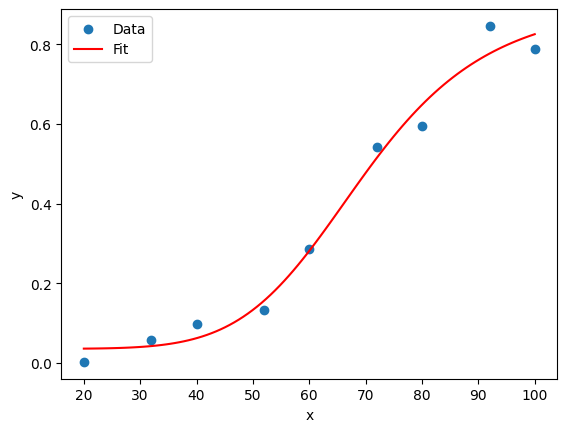

Fitted parameters: a = 0.035055413291587526, b = 0.8747012613126094, x0 = 69.76473475241286, n = 6.222487596342812


In [132]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Given data
x_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==20].loc[:,'Core Density'])
y_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==20].loc[:,'Mean'])

# Define the function to fit
def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Educated initial guess based on data
a_guess = 0.2
b_guess = 0.8
x0_guess = 60
n_guess = 2

initial_guess = [a_guess, b_guess, x0_guess, n_guess]

# Perform curve fitting
params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)


# Extract the fitted parameters
a_fit, b_fit, x0_fit, n_fit = params

# Generate fitted curve for plotting
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)

# Plot the data and the fitted curve
plt.scatter(x_data, y_data, label='Data')
plt.plot(x_fit, y_fit, label='Fit', color='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# Display the fitted parameters
print(f'Fitted parameters: a = {a_fit}, b = {b_fit}, x0 = {x0_fit}, n = {n_fit}')


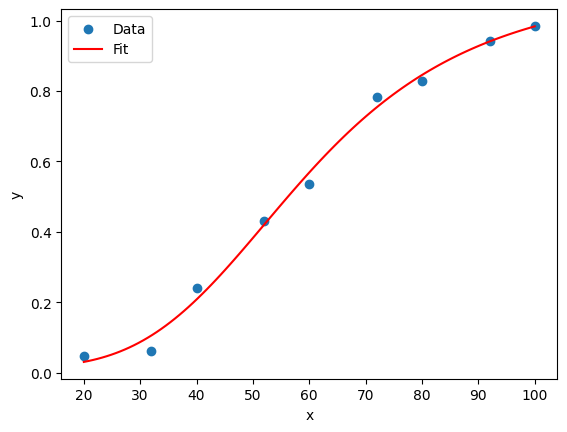

Fitted parameters: a = 0.01436008654952809, b = 1.1046645195745133, x0 = 59.897154678481535, n = 3.837902916583664


In [134]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Given data
x_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==12].loc[:,'Core Density'])
y_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==12].loc[:,'Mean'])

# Define the function to fit
def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Educated initial guess based on data
a_guess = 0.2
b_guess = 0.8
x0_guess = 60
n_guess = 2

initial_guess = [a_guess, b_guess, x0_guess, n_guess]

# Perform curve fitting
params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)

# Extract the fitted parameters
a_fit, b_fit, x0_fit, n_fit = params

# Generate fitted curve for plotting
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)

# Plot the data and the fitted curve
plt.scatter(x_data, y_data, label='Data')
plt.plot(x_fit, y_fit, label='Fit', color='red')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

# Display the fitted parameters
print(f'Fitted parameters: a = {a_fit}, b = {b_fit}, x0 = {x0_fit}, n = {n_fit}')


In [172]:
results_indegree_summary_params = pd.DataFrame(columns=[ 'Average Indegree per Core Node', 'a', 'b', 'x0', 'n','Density to achieve 50\%\ F1'])
results_indegree_summary_params

,Average Indegree per Core Node,a,b,x0,n,Density to achieve 50\%\ F1


In [240]:
from scipy.optimize import fsolve

def find_x_for_y(y, a, b, n, x0):

    # Define the equation
    equation = lambda x: a + b * (x**n / (x0**n + x**n)) - y
    
    # Use fsolve to find the root of the equation
    x_solution = fsolve(equation, x0=0.1)
    
    return x_solution[0]

In [177]:
results_density_summary_paramsdef Den50_finder(a, b, n, x0):
    x = (x0**n) / ((b / (0.5 - a)) - 2)**(1/n)
    return x

def equation_to_solve(x, a, b, n, x0):
    return x**n * (b - 2 * x**n) - 2 * x0**n * (0.5 - a)

In [178]:
for indeg in [0,4,6,8,12,16,20]:
    x_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==indeg].loc[:,'Core Density'])
    y_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==indeg].loc[:,'Mean'])


    def func(x, a, b, x0, n):
        return a + b * (x**n / (x0**n + x**n))

    a_guess = 0.2
    b_guess = 0.8
    x0_guess = 60
    n_guess = 2

    initial_guess = [a_guess, b_guess, x0_guess, n_guess]

    params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)
    a = params[0]
    b = params[1]
    x0 = params[2]
    n = params[3]
    Den50 = find_x_for_y(0.5, a, b, n, x0)
    

    
    results_indegree_summary_params.loc[indeg,:] = [indeg, a, b, x0, n, Den50]
    


/tmp/ipykernel_1128922/1948648094.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))


In [304]:
results_indegree_summary_params.to_csv('results_indegree_summary_params_for_50F1.csv', index=False)

In [182]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming you have a DataFrame named results_indegree_summary_params
# with columns 'Average_Indegree', 'a', 'b', 'x0', and 'n'

# Generate x values from 0 to 100
x_values = np.linspace(0, 100, 1000)

# Plotting using Seaborn for each Average Indegree
# sns.set(style="darkgrid")
plt.figure(figsize=(10, 6))

sns.lineplot(x=x_values, y='y', hue='Average Indegree per Core Node', data=pd.DataFrame(columns=['y', 'Average Indegree per Core Node']))

for avg_indegree in results_indegree_summary_params['Average Indegree per Core Node'].unique():
    # Filter data for the specific Average Indegree
    subset_data = results_indegree_summary_params[results_indegree_summary_params['Average Indegree per Core Node'] == avg_indegree]
    
    # Get parameters for the equation
    a = subset_data['a'].values[0]
    b = subset_data['b'].values[0]
    x0 = subset_data['x0'].values[0]
    n = subset_data['n'].values[0]
    
    # Calculate y values using the given equation
    y_values = a + b * (x_values**n / (x0**n + x_values**n))
    
    # Add the calculated y values to the DataFrame for Seaborn
    df_temp = pd.DataFrame({'y': y_values, 'Average Indegree per Core Node': avg_indegree})
    sns.lineplot(x=x_values, y='y', hue='Average Indegree per Core Node', data=df_temp)

# Add labels and legend
plt.xlabel('x')
plt.ylabel('y')
plt.title('Curve for Equation: y = a + b * (x**n / (x0**n + x**n))')
plt.legend(title='Average Indegree')
plt.show()



ValueError: Length of ndarray vectors must match length of `data` when both are used, but `data` has length 0 and the vector passed to `x` has length 1000.

<Figure size 1000x600 with 0 Axes>

In [192]:
results_indegree_summary_params.index  = results_indegree_summary_params['Average Indegree per Core Node']

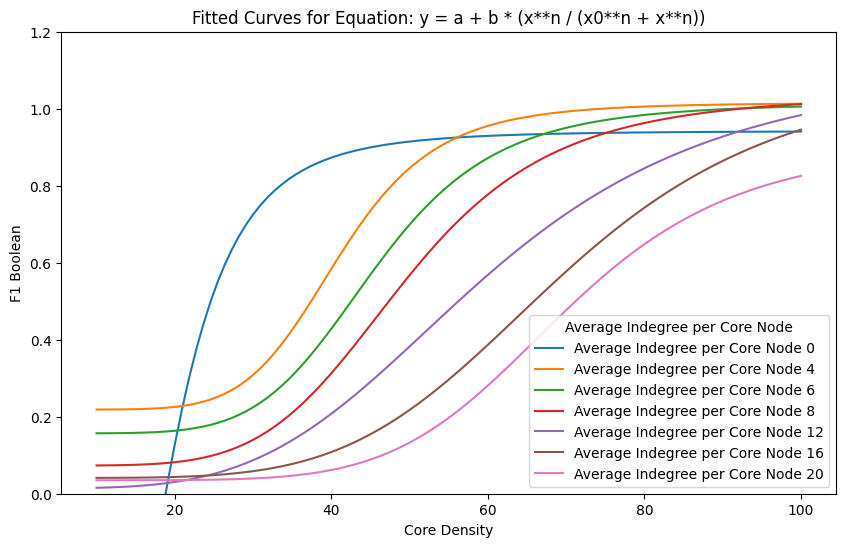

In [199]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Assuming you have a DataFrame named results_indegree_summary_params
# with columns 'Average_Indegree', 'a', 'b', 'x0', and 'n'

# Generate x values for fitting
x_fit = np.linspace(10, 100, 100)

# Set up the plot using Seaborn

plt.figure(figsize=(10, 6))

# Plotting the fitted curves for each Average Indegree
for avg_indegree in results_indegree_summary_params['Average Indegree per Core Node'].unique():
    # Filter data for the specific Average Indegree
    subset_data = results_indegree_summary_params[results_indegree_summary_params['Average Indegree per Core Node'] == avg_indegree]
    
    # Get parameters for the equation
    a_fit = subset_data['a'].values[0]
    b_fit = subset_data['b'].values[0]
    x0_fit = subset_data['x0'].values[0]
    n_fit = subset_data['n'].values[0]
    
    # Calculate y values using the given equation for fitting
    y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)
    
    # Plot the fitted curve with the specific color for the Average Indegree
    plt.plot(x_fit, y_fit, label=f'Average Indegree per Core Node {avg_indegree}')
plt.ylim(0,1.2)
# Add labels and legend
plt.xlabel('Core Density')
plt.ylabel('F1 Boolean')
plt.legend(title='Average Indegree per Core Node')
plt.title('Fitted Curves for Equation: y = a + b * (x**n / (x0**n + x**n))')
plt.show()


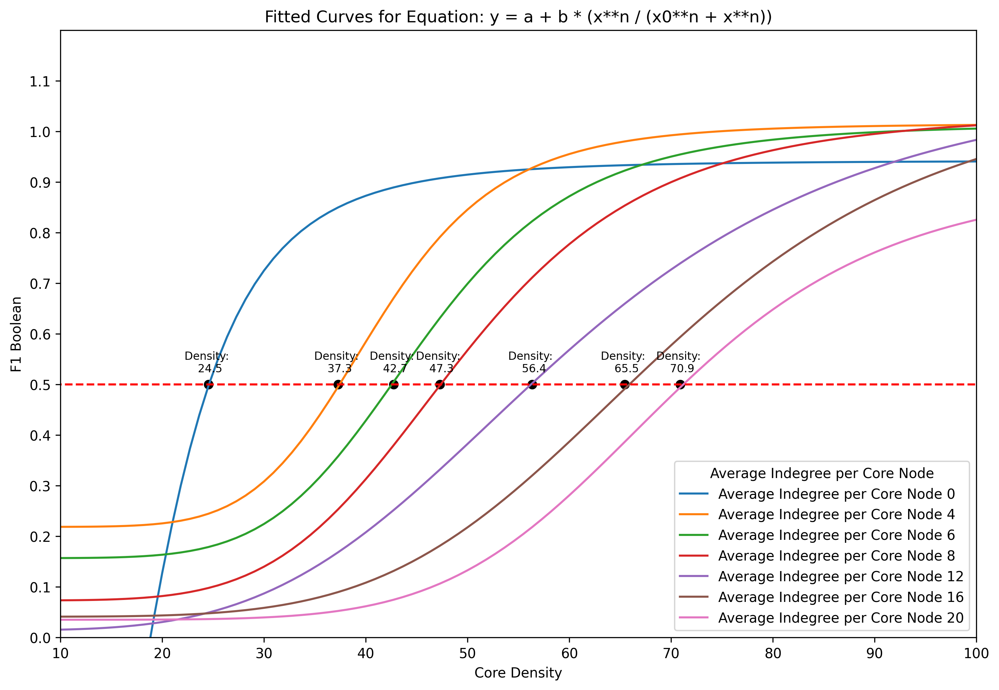

In [300]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Assuming you have a DataFrame named results_indegree_summary_params
# with columns 'Average Indegree per Core Node', 'a', 'b', 'x0', and 'n'

# Generate x values for fitting
x_fit = np.linspace(10, 100, 100)

# Set up the plot using Seaborn
plt.figure(figsize=(12, 8), dpi=300)

# Plotting the fitted curves for each Average Indegree
for avg_indegree in results_indegree_summary_params['Average Indegree per Core Node'].unique():
    # Filter data for the specific Average Indegree
    subset_data = results_indegree_summary_params[results_indegree_summary_params['Average Indegree per Core Node'] == avg_indegree]
    
    # Get parameters for the equation
    a_fit = subset_data['a'].values[0]
    b_fit = subset_data['b'].values[0]
    x0_fit = subset_data['x0'].values[0]
    n_fit = subset_data['n'].values[0]
    
    # Calculate y values using the given equation for fitting
    y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)
    
    # Plot the fitted curve with the specific color for the Average Indegree
    plt.plot(x_fit, y_fit, label=f'Average Indegree per Core Node {avg_indegree}')
    
    # Mark the density when F1 Boolean is 0.5
    density_at_f1_0_5 = x_fit[np.abs(y_fit - 0.5).argmin()]
    plt.scatter(density_at_f1_0_5, 0.5, color='black', marker='o')
    plt.text(density_at_f1_0_5, 0.52, f'Density: \n {density_at_f1_0_5:.1f}', fontsize=8, ha='center', va='bottom')

plt.yticks(np.arange(0, 1.2, 0.1))
plt.ylim(0, 1.2)
plt.xlim(10, 100)
plt.hlines(0.5, -10, 100, linestyles='dashed', colors='red')
# Add labels and legend
plt.xlabel('Core Density')
plt.ylabel('F1 Boolean')
plt.legend(title='Average Indegree per Core Node')
plt.title('Fitted Curves for Equation: y = a + b * (x**n / (x0**n + x**n))')
# plt.savefig('Fitted_Curves_hill_eqn_.png')
plt.savefig('plots/Fitted_Curves_hill_eqn__F1_Boolean_vs_Core_Density.png')
plt.show()


In [ ]:
results_indegree_summary_params.to_csv('results_density_summary_params_vs_F1.csv', index=False)

/tmp/ipykernel_1128922/1376991750.py:12: RuntimeWarning: divide by zero encountered in power
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/1376991750.py:12: RuntimeWarning: invalid value encountered in divide
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/1376991750.py:12: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))


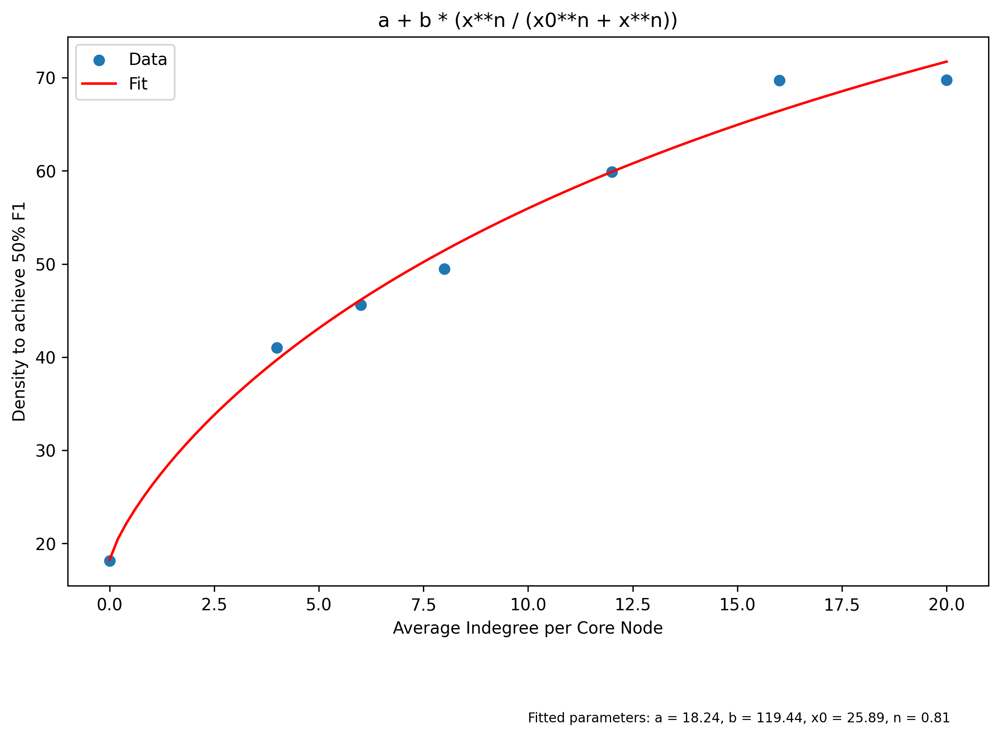

Fitted parameters: a = 18.242536357177002, b = 119.43503184094814, x0 = 25.890180549135437, n = 0.8125436167663084


In [299]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6), dpi=300)
# Given data
x_data = np.array(results_indegree_summary_params['Average Indegree per Core Node'])
y_data = np.array(results_indegree_summary_params['Density to achieve 50\%\ F1'])

# Define the function to fit
def func(x, a, b, x0, n):
    return a + b * (x**n / (x0**n + x**n))

# Educated initial guess based on data
a_guess = 0.2
b_guess = 0.8
x0_guess = np.median(x_data)
n_guess = 2

initial_guess = [a_guess, b_guess, x0_guess, n_guess]

# Perform curve fitting
params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)

# Extract the fitted parameters
a_fit, b_fit, x0_fit, n_fit = params

# Generate fitted curve for plotting
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)

# Plot the data and the fitted curve
plt.scatter(x_data, y_data, label='Data')
plt.plot(x_fit, y_fit, label='Fit', color='red')
plt.xlabel('Average Indegree per Core Node')
plt.ylabel('Density to achieve 50% F1')
plt.legend()
plt.text(10, 0.5, f'Fitted parameters: a = {a_fit:.2f}, b = {b_fit:.2f}, x0 = {x0_fit:.2f}, n = {n_fit:.2f}', fontsize=8, ha='left', va='bottom')
plt.title('a + b * (x**n / (x0**n + x**n))')
plt.savefig('plots/Fitted_Curves_hill_eqn__50F1_vs_Avg_indeg.png')
plt.show()

# Display the fitted parameters
print(f'Fitted parameters: a = {a_fit}, b = {b_fit}, x0 = {x0_fit}, n = {n_fit}')


In [292]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# Assuming 'results_indegree_summary_params' is defined

# Sigmoid function
def sigmoid(x, a, b, c):
    return a / (1 + np.exp(-b * (x - c)))

# Fit sigmoid curve to data
popt, pcov = curve_fit(sigmoid, results_indegree_summary_params['Average Indegree per Core Node'], results_indegree_summary_params['Density to achieve 50\%\ F1'])

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(results_indegree_summary_params['Average Indegree per Core Node'], results_indegree_summary_params['Density to achieve 50\%\ F1'], label='Data')

# Plot sigmoid best fit curve
x_fit = np.linspace(min(results_indegree_summary_params['Average Indegree per Core Node']), max(results_indegree_summary_params['Average Indegree per Core Node']), 100)
y_fit = sigmoid(x_fit, *popt)
plt.plot(x_fit, y_fit, 'r-', label='Sigmoid Best Fit')

plt.ylabel('Density to achieve 50% F1')
plt.xlabel('Average Indegree per Core Node')
plt.title('Scatter Plot with Sigmoid Best Fit Curve')
plt.legend()
plt.show()


TypeError: loop of ufunc does not support argument 0 of type float which has no callable exp method

In [318]:
results_density_summary_params = pd.DataFrame(columns=[ 'Core Density', 'a', 'b', 'x0', 'n','Indegree for F1 to drop to 50% '])
results_density_summary_params

,Core Density,a,b,x0,n,Indegree for F1 to drop to 50%


In [319]:

for density in [20,32,40,52,60,72,80,92,100]:
    x_data = np.array(result_df[result_df.loc[:,'Core Density']==density].loc[:,'Average Indegree per Core Node'])
    y_data = np.array(result_df[result_df.loc[:,'Core Density']==density].loc[:,'Mean'])


    def func(x, a, b, x0, n):
        return a + b * (x**n / (x0**n + x**n))

    a_guess = 0.2
    b_guess = 0.8
    x0_guess = 60
    n_guess = 2

    initial_guess = [a_guess, b_guess, x0_guess, n_guess]

    params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)
    a = params[0]
    b = params[1]
    x0 = params[2]
    n = params[3]
    Den50 = find_x_for_y(0.5, a, b, n, x0)
    

    
    results_indegree_summary_params.loc[indeg,:] = [indeg, a, b, x0, n, Den50]
    


/home/user/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: divide by zero encountered in power
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in divide
  return a + b * (x**n / (x0**n + x**n))


In [320]:
import numpy as np
from scipy.optimize import curve_fit

# Assuming 'result_df' and 'results_density_summary_params' are defined

results_density_summary_params = pd.DataFrame(columns=['Density', 'a', 'b', 'x0', 'n', 'Indeg50'])

for density in [20, 32, 40, 52, 60, 72, 80, 92, 100]:
    x_data = np.array(result_df[result_df.loc[:, 'Core Density'] == density].loc[:, 'Average Indegree per Core Node'])
    y_data = np.array(result_df[result_df.loc[:, 'Core Density'] == density].loc[:, 'Median'])

    # Use data characteristics to refine initial guesses
    a_guess = np.max(y_data)
    b_guess = np.abs(np.min(y_data) - a_guess)
    x0_guess = np.median(x_data)
    n_guess = 2

    initial_guess = [a_guess, b_guess, x0_guess, n_guess]

    try:
        params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess, maxfev=5000)
        a, b, x0, n = params
        Indeg50 = find_x_for_y(0.5, a, b, n, x0)

        results_density_summary_params.loc[density, :] = [density, a, b, x0, n, Indeg50]

    except RuntimeError:
        print(f"Fit for density {density} did not converge.")

results_density_summary_params


/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: divide by zero encountered in power
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in divide
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: divide by zero encountered in power
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: RuntimeWarning: invalid value encountered in divide
  return a + b * (x**n / (x0**n + x**n))
/tmp/ipykernel_1128922/3450465566.py:7: Runti

,Density,a,b,x0,n,Indeg50
20,20,0.14425,-0.138,5.731734,47.254487,5.731734
32,32,0.791978,-0.929742,5.768104,1.551774,5.768104
40,40,0.817981,-0.743526,5.180684,2.764872,5.180684
52,52,0.943191,-0.965224,10.724396,3.138449,10.724396
60,60,0.994628,-0.927133,11.725535,3.195055,11.725535
72,72,0.904659,0.254271,10.511414,0.0,10.511414
80,80,0.915988,0.232334,10.510145,0.000001,10.510145
92,92,0.979124,0.068463,10.511869,0.000003,10.511869
100,100,0.92487,0.151663,10.509173,0.000001,10.509173


In [312]:
results_density_summary_params

,Density,a,b,x0,n,Indeg50
20,20,0.14425,-0.138,5.731734,47.254487,5.731734
32,32,0.791978,-0.929742,5.768104,1.551774,5.768104
40,40,0.817981,-0.743526,5.180684,2.764872,5.180684
52,52,0.943191,-0.965224,10.724396,3.138449,10.724396
60,60,0.994628,-0.927133,11.725535,3.195055,11.725535
72,72,0.904659,0.254271,10.511414,0.0,10.511414
80,80,0.915988,0.232334,10.510145,0.000001,10.510145
92,92,0.979124,0.068463,10.511869,0.000003,10.511869
100,100,0.92487,0.151663,10.509173,0.000001,10.509173


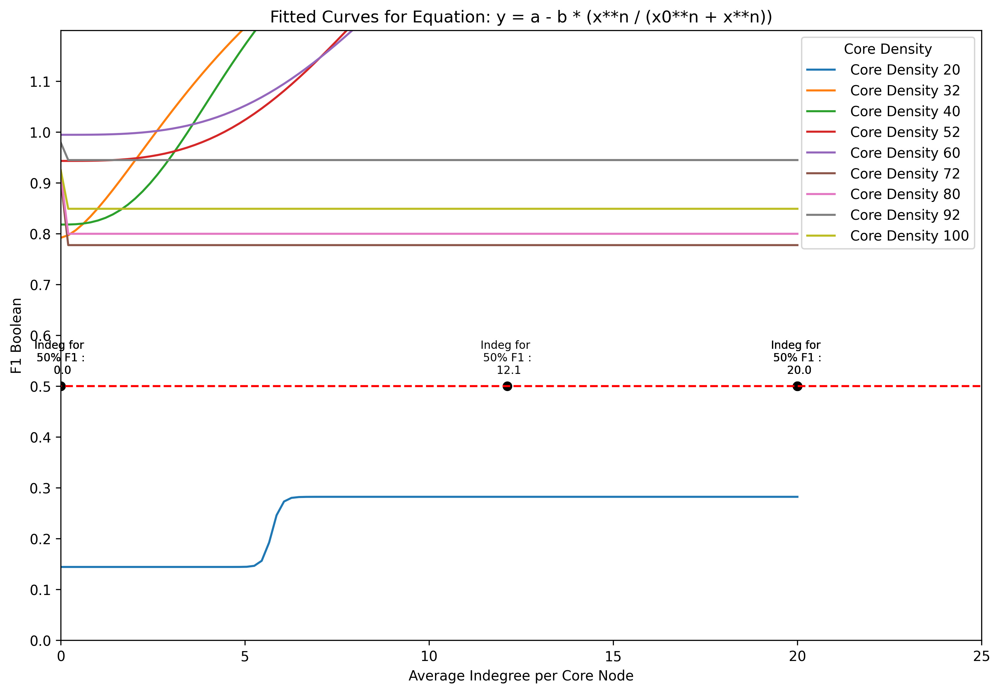

In [321]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def func(x, a, b, x0, n):
    return a - b * (x**n / (x0**n + x**n))

# Assuming you have a DataFrame named results_indegree_summary_params
# with columns 'Average Indegree per Core Node', 'a', 'b', 'x0', and 'n'

# Generate x values for fitting
x_fit = np.linspace(0, 20, 100)

# Set up the plot using Seaborn
plt.figure(figsize=(12, 8), dpi=300)

# Plotting the fitted curves for each Average Indegree
for core_density in results_density_summary_params['Density'].unique():
    # Filter data for the specific Average Indegree
    subset_data = results_density_summary_params[results_density_summary_params['Density'] == core_density]
    
    # Get parameters for the equation
    a_fit = subset_data['a'].values[0]
    b_fit = subset_data['b'].values[0]
    x0_fit = subset_data['x0'].values[0]
    n_fit = subset_data['n'].values[0]
    
    # Calculate y values using the given equation for fitting
    y_fit = func(x_fit, a_fit, b_fit, x0_fit, n_fit)
    
    # Plot the fitted curve with the specific color for the Average Indegree
    plt.plot(x_fit, y_fit, label=f' Core Density {core_density}')
    
    # Mark the density when F1 Boolean is 0.5
    density_at_f1_0_5 = x_fit[np.abs(y_fit - 0.5).argmin()]
    plt.scatter(density_at_f1_0_5, 0.5, color='black', marker='o')
    plt.text(density_at_f1_0_5, 0.52, f'Indeg for \n 50% F1 : \n {density_at_f1_0_5:.1f}', fontsize=8, ha='center', va='bottom')

plt.yticks(np.arange(0, 1.2, 0.1))
plt.ylim(0, 1.2)
plt.xlim(0, 25)
plt.hlines(0.5, -10, 100, linestyles='dashed', colors='red')
# Add labels and legend
plt.xlabel('Average Indegree per Core Node')
plt.ylabel('F1 Boolean')
plt.legend(title='Core Density')
plt.title('Fitted Curves for Equation: y = a - b * (x**n / (x0**n + x**n))')
plt.savefig('plots/Fitted_Curves_hill_eqn__indegree_vs_F1.png')
plt.show()


In [305]:
results_density_summary_params.to_csv('results_density_summary_params_vs_F1.csv', index=False)

In [266]:
for indeg in [0,4,6,8,12,16,20]:
    x_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==indeg].loc[:,'Core Density'])
    y_data = np.array(result_df[result_df.loc[:,'Average Indegree per Core Node']==indeg].loc[:,'Mean'])


    def func(x, a, b, x0, n):
        return a + b * (x**n / (x0**n + x**n))

    a_guess = 0.2
    b_guess = 0.8
    x0_guess = 60
    n_guess = 2

    initial_guess = [a_guess, b_guess, x0_guess, n_guess]

    params, covariance = curve_fit(func, x_data, y_data, p0=initial_guess)
    a = params[0]
    b = params[1]
    x0 = params[2]
    n = params[3]
    Den50 = find_x_for_y(0.5, a, b, n, x0)
    

    
    results_indegree_summary_params.loc[indeg,:] = [indeg, a, b, x0, n, Den50]
    
    #results_indegree_summary_params =results_indegree_summary_params.append({'Average Indegree per Core Node':indeg, 'a':params[0], 'b':params[1], 'x0':params[2], 'n':params[3],'Density to achieve 50\% \F1':Den50,'Den50':Den50_man}, ignore_index=True)


    # results_indegree_summary_params.append({'Average Indegree per Core Node':indeg, 'a':params[0], 'b':params[1], 'x0':params[2], 'n':params[3]}, ignore_index=True)


    # a_fit, b_fit, x0_fit, n_fit = params

/tmp/ipykernel_1128922/1948648094.py:7: RuntimeWarning: invalid value encountered in double_scalars
  return a + b * (x**n / (x0**n + x**n))
